In [ ]:
!pip install SimpleITK


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.6/52.6 MB 13.0 MB/s eta 0:00:00


In [ ]:
!pip install scikit-learn


In [ ]:
!pip install radiomics

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 28.2 MB/s eta 0:00:00
  Created wheel for radiomics: filename=radiomics-0.1-py3-none-any.whl size=6090 sha256=7139c7dda7af55de3cbc289eca955970f08f1b82a7f551e00c1b487bd431dc12
  Stored in directory: /root/.cache/pip/wheels/7b/d6/15/edae08f7c4249be729823f0c6b3c43abb9564dbcfa726b077a
Successfully built radiomics


In [ ]:
!pip install utils

  Preparing metadata (setup.py) ... done
  Created wheel for utils: filename=utils-1.0.2-py2.py3-none-any.whl size=13906 sha256=4453a4f987c1f58b5d14319e5d8031cdd13b14743b2b5d083ad420c144d3a7fc
  Stored in directory: /root/.cache/pip/wheels/15/0c/b3/674aea8c5d91c642c817d4d630bd58faa316724b136844094d
Successfully built utils


In [1]:
import os
import numpy as np
import SimpleITK as sitk
import matplotlib.pyplot as plt
from skimage import filters
from utils import *
from sklearn.cluster import KMeans
import nibabel as nib

In [2]:
# --- Step 1: Load NIfTI file ---
def load_nifti_image(path):
    image = sitk.ReadImage(path)
    array = sitk.GetArrayFromImage(image)  # Shape: (z, y, x)
    return array, image

In [3]:
# --- Step 2: Preprocessing (normalization) ---
def normalize(volume):
    volume = np.clip(volume, -1000, 400)  # Lung window in HU
    volume = (volume + 1000) / 1400  # Normalize to 0-1
    return volume

In [4]:
# --- Step 3: Unsupervised segmentation ---
def segment_with_otsu(volume):
    thresholds = [filters.threshold_otsu(slice) for slice in volume]
    binary = np.array([slice > t for slice, t in zip(volume, thresholds)], dtype=np.uint8)
    return binary

In [5]:
def segment_with_kmeans(volume, n_clusters=2, model_path=None):
    flat = volume.reshape(-1, 1)

    if model_path and os.path.exists(model_path):
        print("Loading existing KMeans model...")
        kmeans = load_kmeans_model(model_path)
    else:
        kmeans = KMeans(n_clusters=n_clusters, random_state=42).fit(flat)
        if model_path:
            save_kmeans_model(kmeans, model_path)

    clustered = kmeans.predict(flat).reshape(volume.shape)
    cluster_means = [flat[kmeans.labels_ == i].mean() for i in range(n_clusters)]
    nodule_cluster = np.argmax(cluster_means)
    binary = (clustered == nodule_cluster).astype(np.uint8)
    return binary

In [6]:
# Save the trained KMeans model
def save_kmeans_model(model, path):
    joblib.dump(model, path)
    print(f"KMeans model saved to {path}")

In [7]:
# Load a saved KMeans model
def load_kmeans_model(path):
    return joblib.load(path)

In [8]:
# --- Step 4: Save result as NIfTI ---
def save_nifti_mask(mask_array, reference_image, out_path):
    mask_image = sitk.GetImageFromArray(mask_array.astype(np.uint8))
    mask_image.CopyInformation(reference_image)
    sitk.WriteImage(mask_image, out_path)


In [9]:
# --- Step 5: Visualize one slice ---
def visualize(volume, mask, slice_index=None):
    if slice_index is None:
        slice_index = volume.shape[0] // 2
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.title("Original Slice")
    plt.imshow(volume[slice_index], cmap='gray')
    plt.subplot(1, 2, 2)
    plt.title("Segmented Mask")
    plt.imshow(mask[slice_index], cmap='gray')
    plt.show()

In [24]:
# Load CT scan data from a file
def load_ct_scans(ct_path):
    """Load a CT scan from a NIfTI file."""
    print(f"Loading CT scan from {ct_path}")
    ct_img = nib.load(ct_path)
    return ct_img.get_fdata()


In [23]:
# Apply KMeans clustering and visualize
def visualize_kmeans_clusters(ct_data, n_clusters=2):
    """Apply KMeans clustering to the CT scan and visualize the results."""
    # Flatten the 3D data for KMeans
    flattened_data = ct_data.flatten().reshape(-1, 1)

    # Apply KMeans clustering
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(flattened_data)
    clustered_data = kmeans.labels_.reshape(ct_data.shape)

    # Plot the original CT scan slice and clustered result
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Plot original CT slice
    axes[0].imshow(ct_data[:, :, ct_data.shape[2] // 2], cmap='gray')
    axes[0].set_title('Original CT Slice')

    # Plot KMeans clustered slice
    axes[1].imshow(clustered_data[:, :, ct_data.shape[2] // 2], cmap='nipy_spectral')
    axes[1].set_title('KMeans Clustered Slice')

    plt.show()
    return kmeans
    return kmeans

In [12]:
# Function to plot segmentation results
def plot_segmentation_result(ct_data, segmented_data):
    # Plot the original CT slice and the segmented result for comparison
    slice_idx = ct_data.shape[2] // 2  # Take the middle slice
    ct_slice = ct_data[:, :, slice_idx]
    segmented_slice = segmented_data[:, :, slice_idx]

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    ax[0].imshow(ct_slice, cmap='gray')
    ax[0].set_title('Original CT Slice')

    ax[1].imshow(segmented_slice, cmap='jet')
    ax[1].set_title('Segmented CT Slice')

    plt.show()

In [13]:
def plot_all_slices_kmeans(ct_data, kmeans, output_dir=None):
    """Apply the trained KMeans model to each slice and plot the results."""
    z_dim = ct_data.shape[2]  # Number of slices in the z-axis

    # Process each slice individually
    for i in range(z_dim):
        # Extract the i-th slice
        slice_data = ct_data[:, :, i]

        # Flatten the slice for clustering
        flat_slice = slice_data.flatten().reshape(-1, 1)

        # Apply the KMeans model to the flattened slice data
        clustered = kmeans.predict(flat_slice)

        # Reshape the clustered data back to the original slice shape
        clustered_img = clustered.reshape(slice_data.shape)

        # Plot the original and clustered slices side by side
        plt.figure(figsize=(10, 4))

        # Original slice plot
        plt.subplot(1, 2, 1)
        plt.imshow(slice_data, cmap='gray')
        plt.title(f"Original Slice {i}")

        # Segmented (clustered) slice plot
        plt.subplot(1, 2, 2)
        plt.imshow(clustered_img, cmap='viridis')
        plt.title(f"KMeans Segmentation {i}")

        # Save the plot if output_dir is specified, otherwise display it
        if output_dir:
            os.makedirs(output_dir, exist_ok=True)
            plt.savefig(os.path.join(output_dir, f'slice_{i}_segmentation.png'))
            plt.close()
        else:
            plt.show()

In [65]:
def run_segmentation_pipeline(ct_dir, mask_dir, model_path, output_dir=None, n_clusters=2, other_param=None):
    """
    Function to run the segmentation pipeline for CT scans and model saving/loading.

    Parameters:
    - ct_dir (str): Directory containing CT scan files.
    - mask_dir (str): Directory containing the masks for the CT scans.
    - model_path (str): Path to save or load the KMeans model.
    - output_dir (str, optional): Directory to save outputs like segmented masks.
    - n_clusters (int, optional): Number of clusters for KMeans. Default is 2.
    - other_param: Additional parameters if necessary.
    """
    print(f"Processing CT scans from: {ct_dir}")
    print(f"Processing masks from: {mask_dir}")
    print(f"Model path: {model_path}")
    if output_dir:
        print(f"Output will be saved to: {output_dir}")

    # Example: Load all CT scans from ct_dir
    ct_files = [f for f in os.listdir(ct_dir) if f.endswith('.nii.gz')]
    for ct_file in ct_files:
        ct_path = os.path.join(ct_dir, ct_file)

        print(f"Loading CT scan from: {ct_path}")
        ct_img = nib.load(ct_path)
        ct_data = ct_img.get_fdata()

        # If model already exists, load it
        if os.path.exists(model_path):
            print(f"Loading existing KMeans model from: {model_path}")
            kmeans = joblib.load(model_path)
        else:
            # Train a new KMeans model if it doesn't exist
            print(f"Training new KMeans model for {ct_file}")
            kmeans = KMeans(n_clusters=n_clusters)
            kmeans.fit(ct_data.flatten().reshape(-1, 1))  # Flatten the 3D data for clustering
            joblib.dump(kmeans, model_path)

        # Apply KMeans and plot results
        plot_all_slices_kmeans(ct_data, kmeans, output_dir)




In [62]:
def run_segmentation_pipeline(ct_dir, mask_dir, model_path, output_dir=None, n_clusters=2):
    """
    Function to run the segmentation pipeline for CT scans and model saving/loading.

    Parameters:
    - ct_dir (str): Directory containing CT scan files.
    - mask_dir (str): Directory containing the masks for the CT scans.
    - model_path (str): Path to save or load the KMeans model.
    - output_dir (str, optional): Directory to save segmented results. Default is None.
    - n_clusters (int, optional): Number of clusters for KMeans. Default is 2.
    """
    print(f"Processing CT scans from: {ct_dir}")
    print(f"Processing masks from: {mask_dir}")
    print(f"Model will be saved to or loaded from: {model_path}")

    # Example: Load all CT scans from ct_dir
    ct_files = [f for f in os.listdir(ct_dir) if f.endswith('.nii.gz')]
    for ct_file in ct_files:
        ct_path = os.path.join(ct_dir, ct_file)

        print(f"Loading CT scan from: {ct_path}")
        ct_img = nib.load(ct_path)
        ct_data = ct_img.get_fdata()

        # If model already exists, load it
        if os.path.exists(model_path):
            print(f"Loading existing KMeans model from: {model_path}")
            kmeans = joblib.load(model_path)
        else:
            # Train a new KMeans model if it doesn't exist
            print(f"Training new KMeans model for {ct_file}")
            kmeans = KMeans(n_clusters=n_clusters)
            kmeans.fit(ct_data.flatten().reshape(-1, 1))  # Flatten the 3D data for clustering
            joblib.dump(kmeans, model_path)

        # Apply KMeans and plot results
        plot_all_slices_kmeans(ct_data, kmeans, output_dir)

In [21]:
# Segment and visualize multiple CT scans from a directory
def run_segmentation_pipeline(ct_dir, n_clusters=2):
    """Run the segmentation pipeline for all CT scans in a directory without saving the model."""
    # Get all NIfTI files in the directory
    ct_files = [f for f in os.listdir(ct_dir) if f.endswith('.nii.gz')]

    for ct_file in ct_files:
        ct_path = os.path.join(ct_dir, ct_file)
        print(f"Processing CT scan: {ct_path}")

        # Load CT scan
        ct_data = load_ct_scans(ct_path)

        # Apply KMeans and visualize the results
        kmeans_model = visualize_kmeans_clusters(ct_data, n_clusters)
        print(f"Completed segmentation for {ct_file}")




In [ ]:
run_segmentation_pipeline(ct_dir='/content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image',
                          mask_dir='/content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/nodule_mask',
                          model_path='/content/drive/MyDrive/ML/Challenge2/modelJobLib/kmeans_model.joblib/kmeans_model.joblib',
                          output_dir='/content/drive/MyDrive/ML/Challenge2/Output-Kmeans',
                          n_clusters=3)  # Adjust n_clusters as necessary

Processing CT scans from: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image
Processing masks from: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/nodule_mask
Model path: /content/drive/MyDrive/ML/Challenge2/modelJobLib/kmeans_model.joblib/kmeans_model.joblib
Output will be saved to: /content/drive/MyDrive/ML/Challenge2/Output-Kmeans
Loading CT scan from: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0049_R_11.nii.gz
Training new KMeans model for LIDC-IDRI-0049_R_11.nii.gz
Loading CT scan from: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0066_R_2.nii.gz
Loading existing KMeans model from: /content/drive/MyDrive/ML/Challenge2/modelJobLib/kmeans_model.joblib/kmeans_model.joblib
Loading CT scan from: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0064_R_1.nii.gz
Loading existing KMeans model f

Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0049_R_11.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0049_R_11.nii.gz


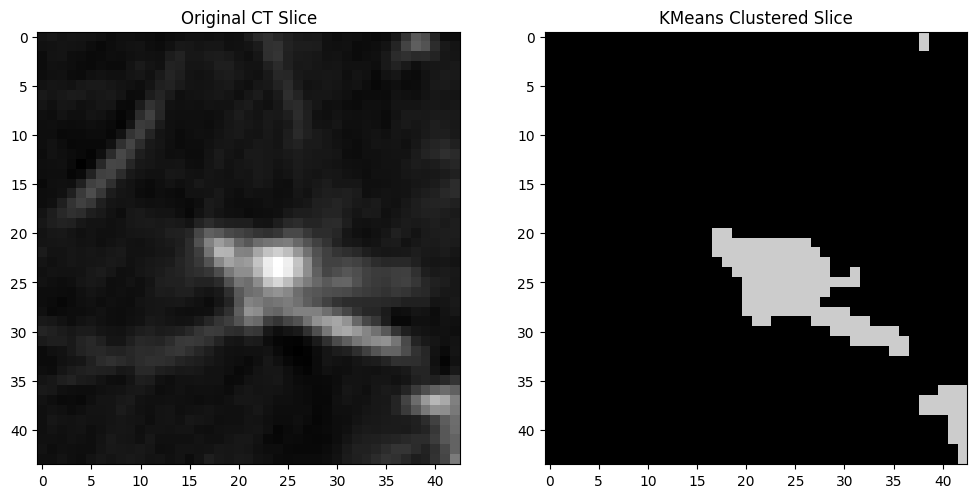

Completed segmentation for LIDC-IDRI-0049_R_11.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0066_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0066_R_2.nii.gz


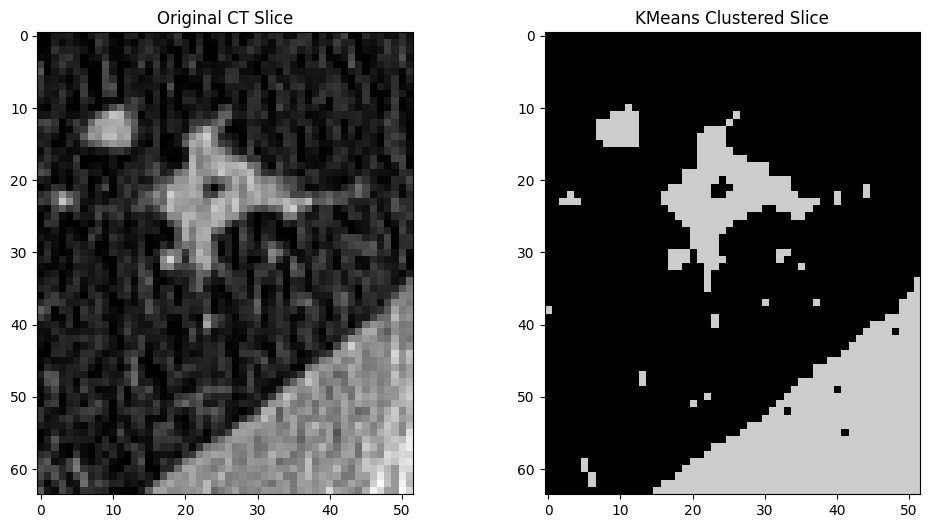

Completed segmentation for LIDC-IDRI-0066_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0064_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0064_R_1.nii.gz


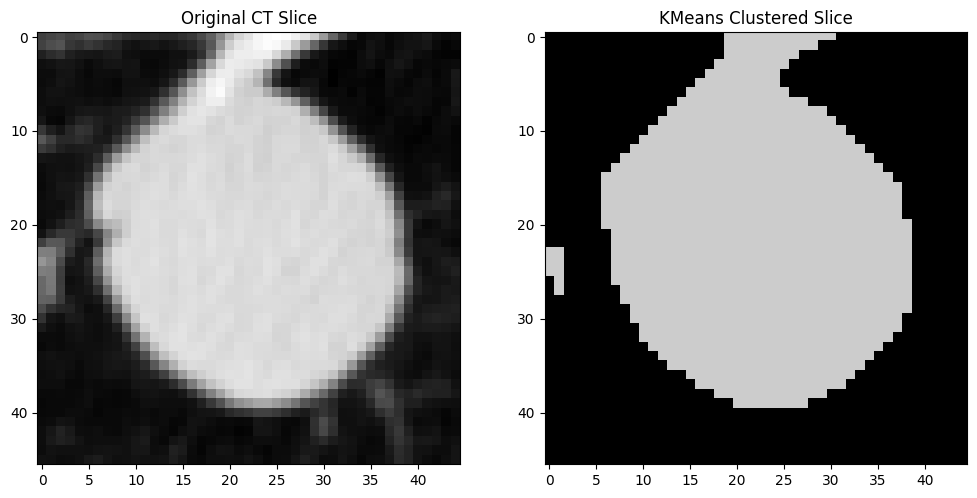

Completed segmentation for LIDC-IDRI-0064_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0121_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0121_R_1.nii.gz


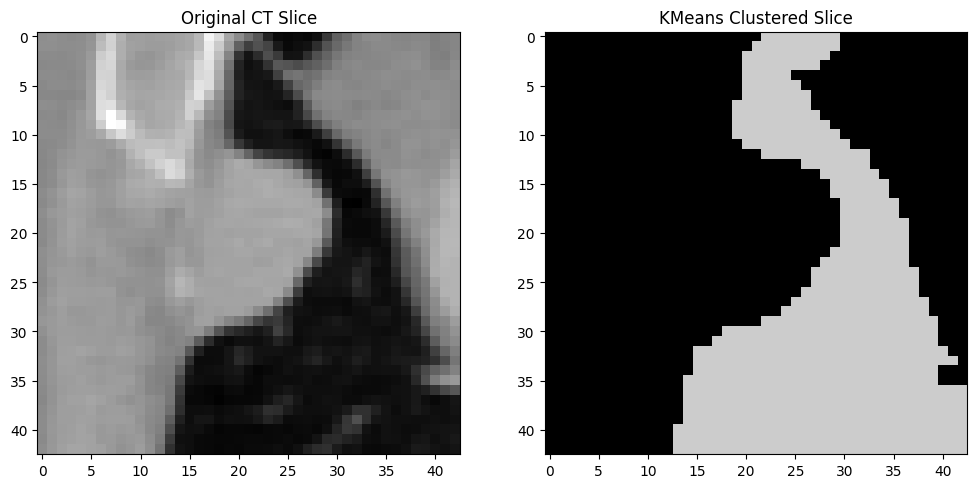

Completed segmentation for LIDC-IDRI-0121_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0045_R_11.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0045_R_11.nii.gz


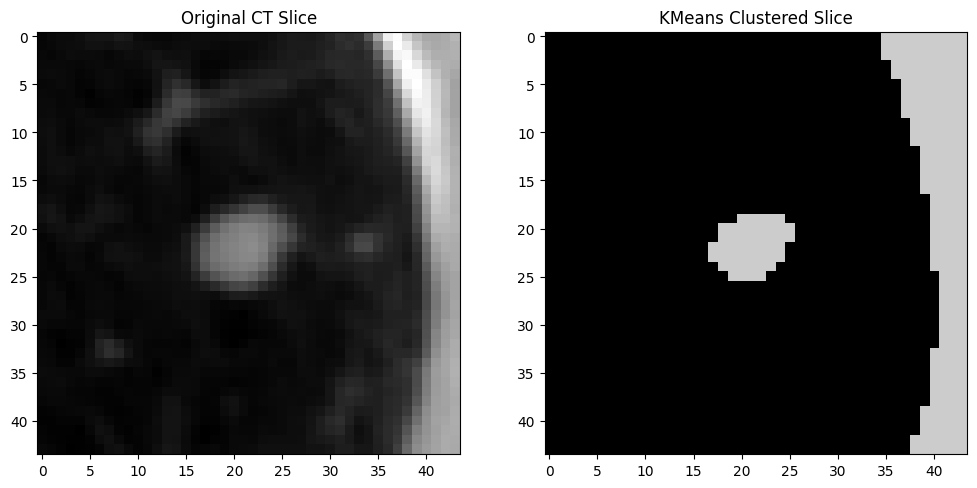

Completed segmentation for LIDC-IDRI-0045_R_11.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0054_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0054_R_1.nii.gz


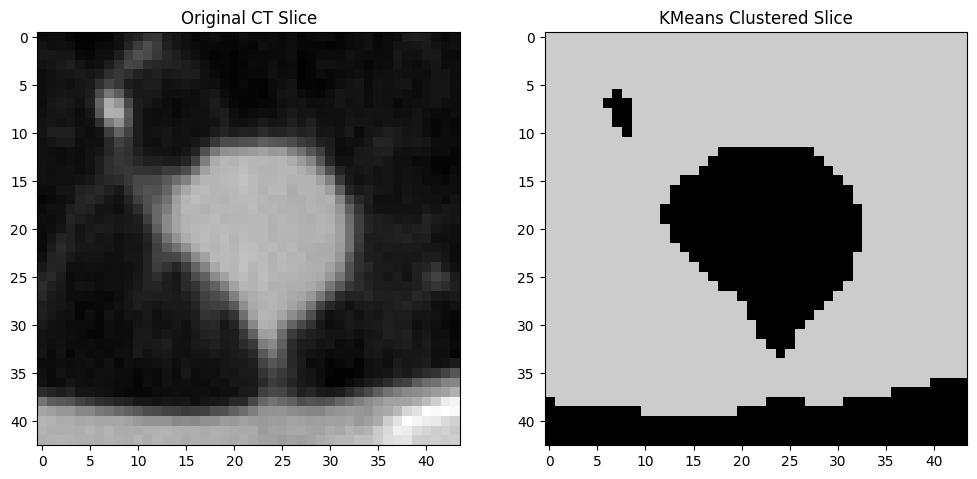

Completed segmentation for LIDC-IDRI-0054_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0040_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0040_R_2.nii.gz


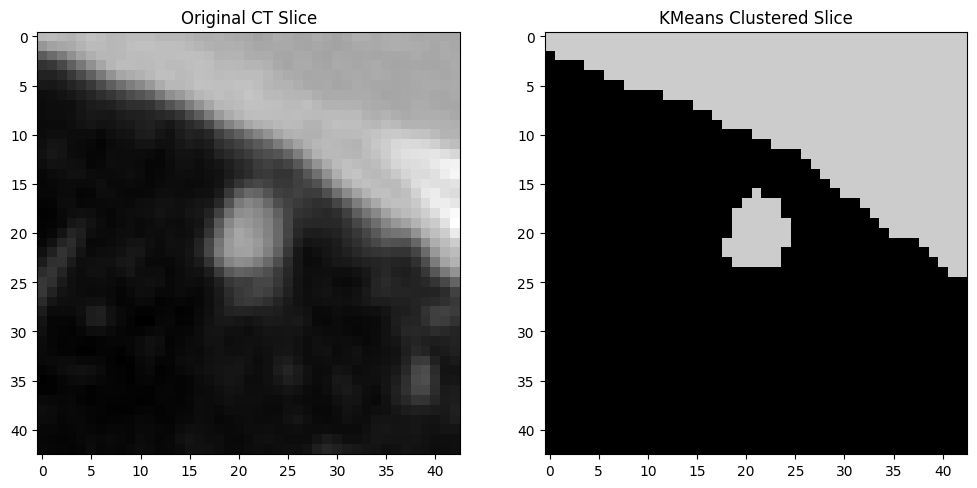

Completed segmentation for LIDC-IDRI-0040_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0142_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0142_R_2.nii.gz


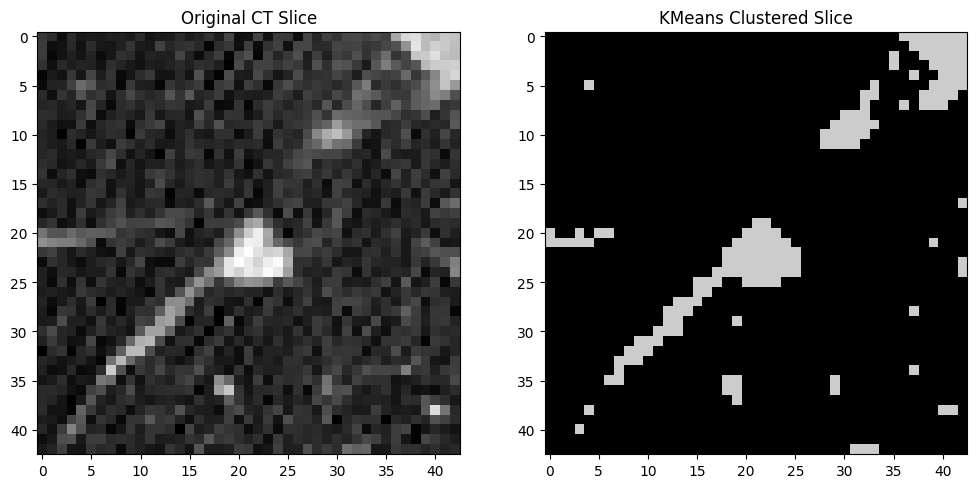

Completed segmentation for LIDC-IDRI-0142_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0099_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0099_R_3.nii.gz


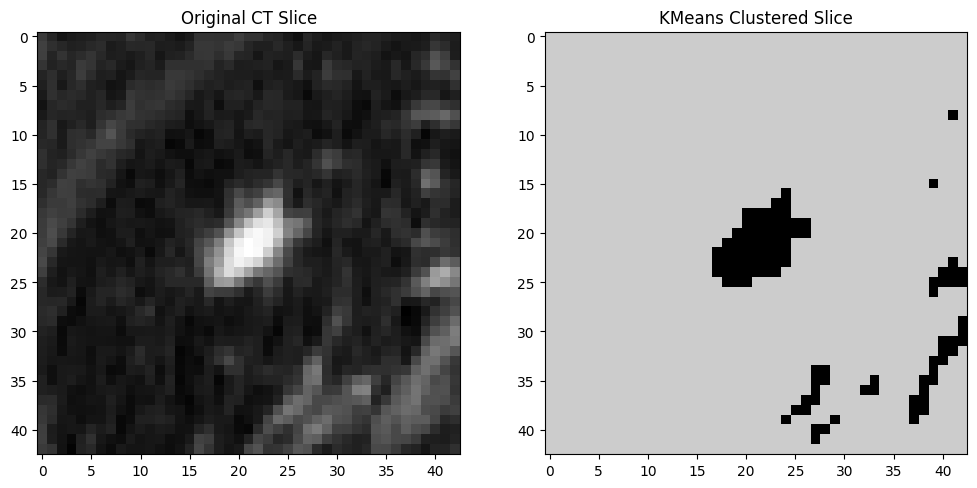

Completed segmentation for LIDC-IDRI-0099_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0129_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0129_R_1.nii.gz


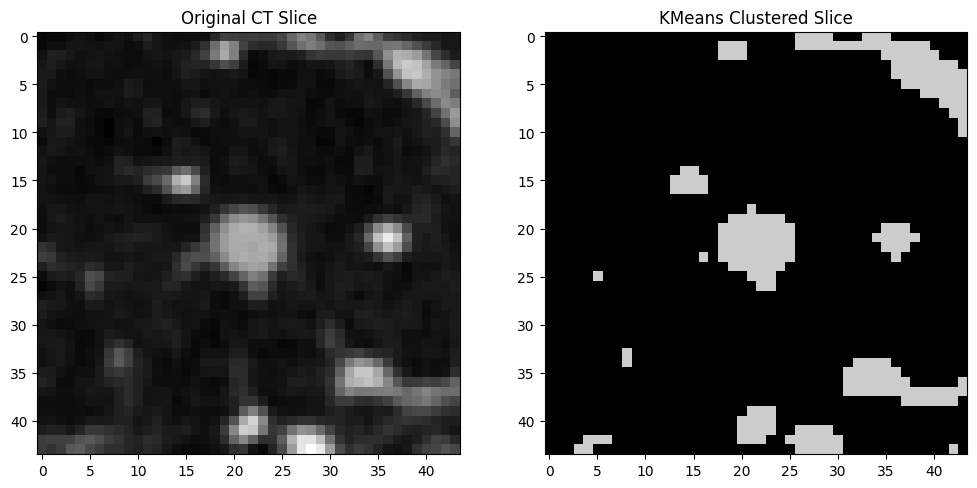

Completed segmentation for LIDC-IDRI-0129_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0124_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0124_R_6.nii.gz


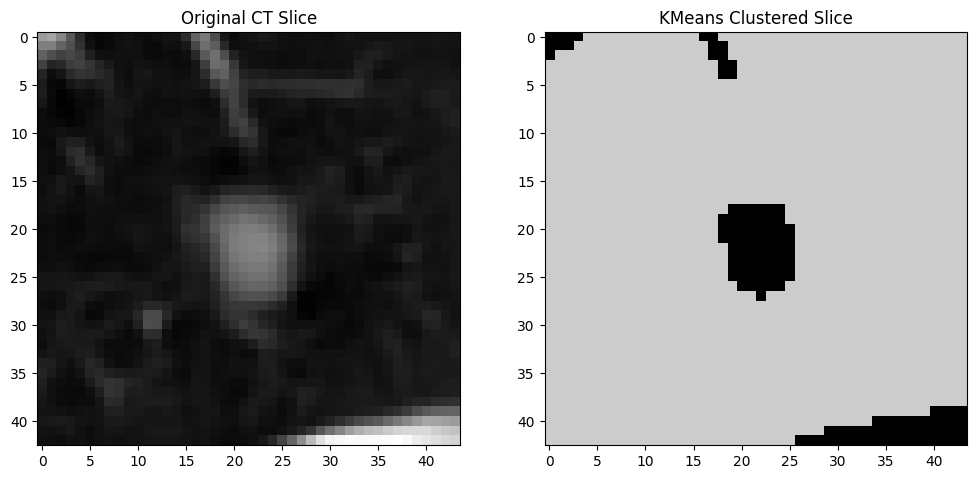

Completed segmentation for LIDC-IDRI-0124_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0012_R_10.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0012_R_10.nii.gz


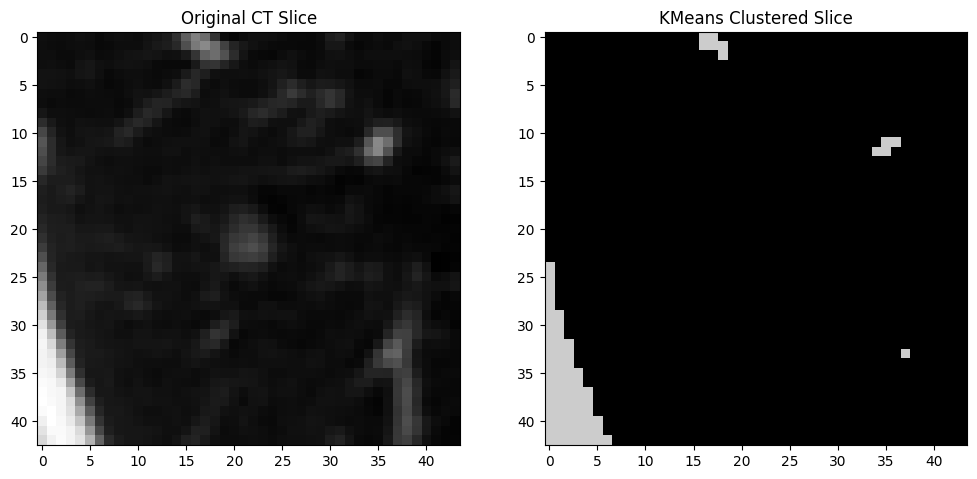

Completed segmentation for LIDC-IDRI-0012_R_10.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0055_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0055_R_2.nii.gz


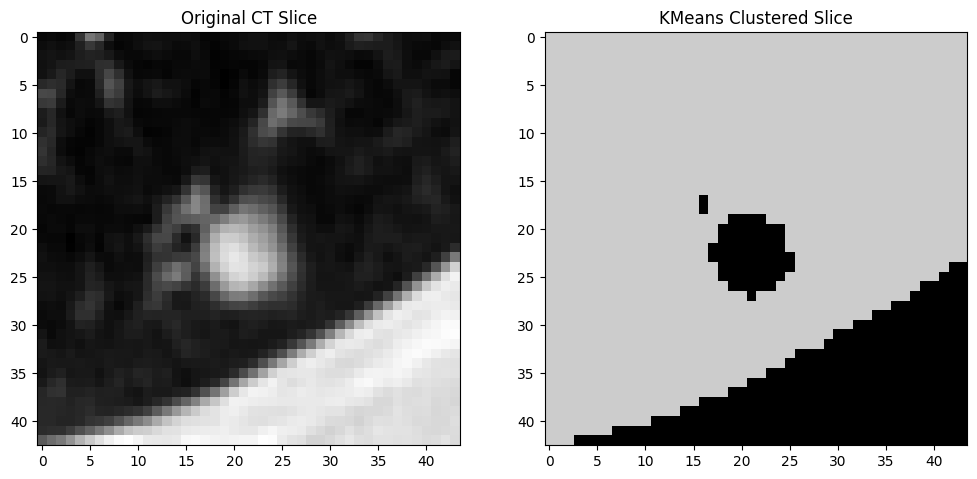

Completed segmentation for LIDC-IDRI-0055_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0129_R_15.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0129_R_15.nii.gz


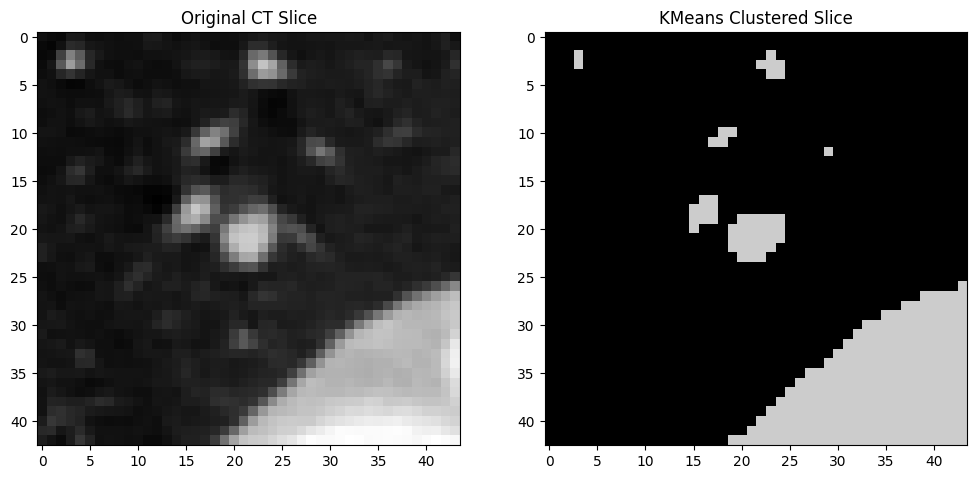

Completed segmentation for LIDC-IDRI-0129_R_15.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0003_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0003_R_3.nii.gz


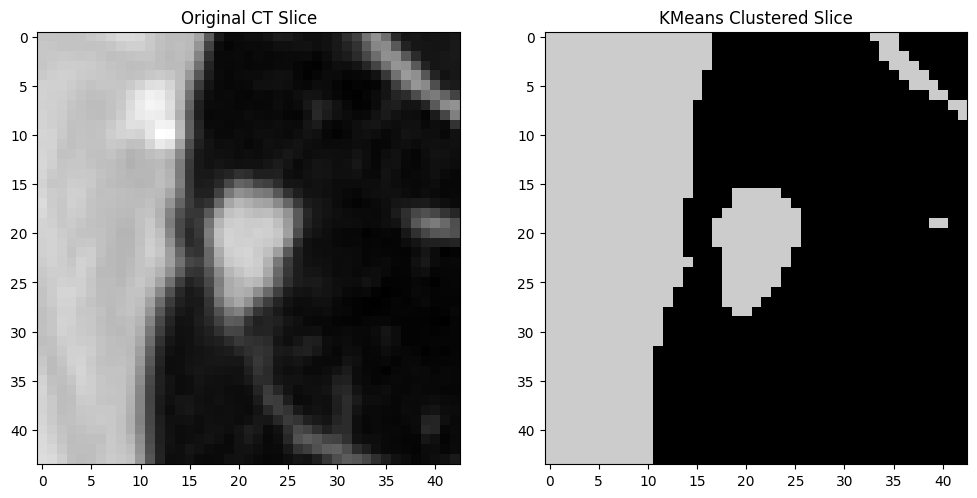

Completed segmentation for LIDC-IDRI-0003_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0076_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0076_R_2.nii.gz


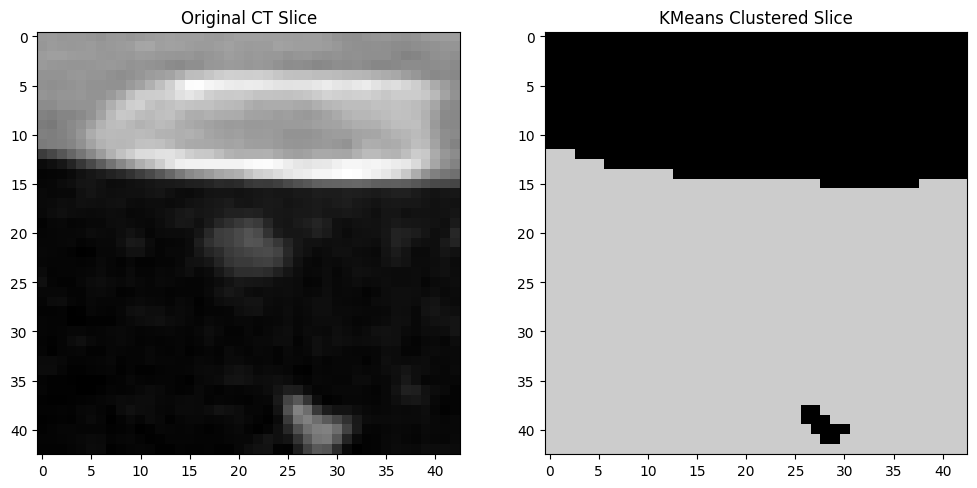

Completed segmentation for LIDC-IDRI-0076_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0118_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0118_R_3.nii.gz


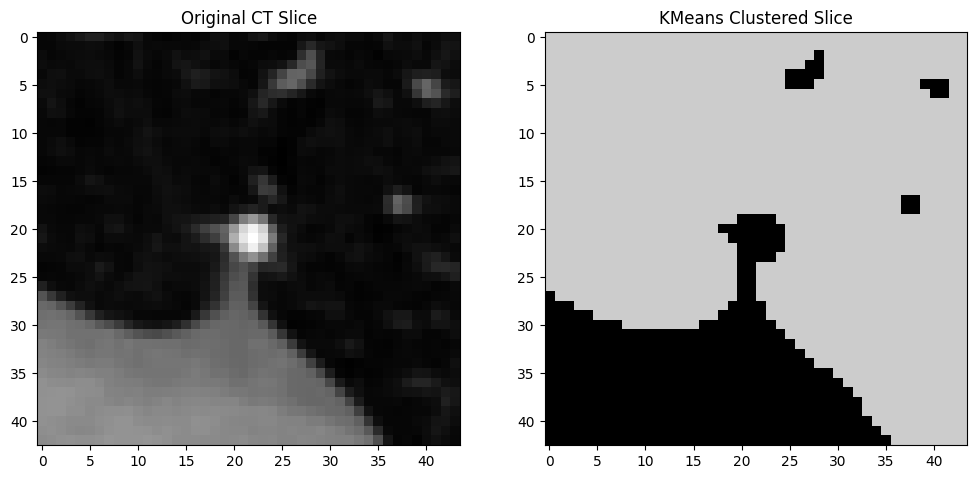

Completed segmentation for LIDC-IDRI-0118_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0131_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0131_R_2.nii.gz


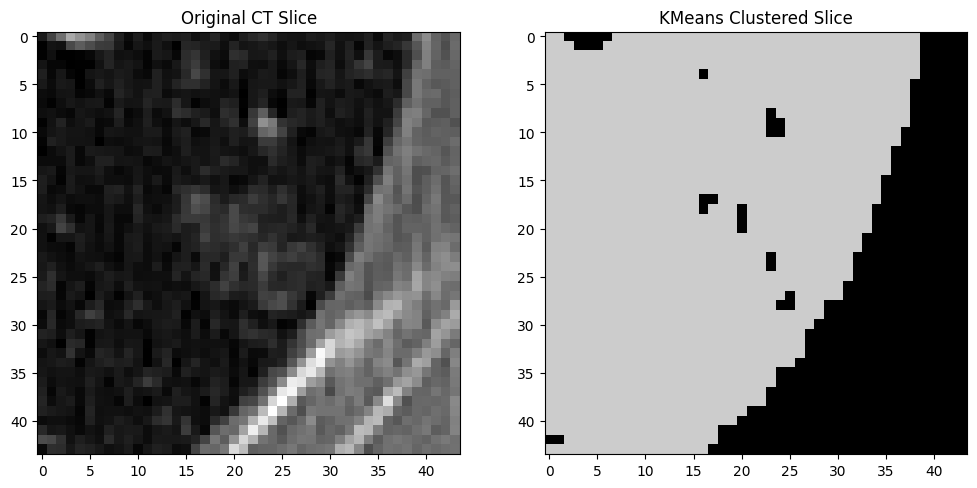

Completed segmentation for LIDC-IDRI-0131_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0063_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0063_R_4.nii.gz


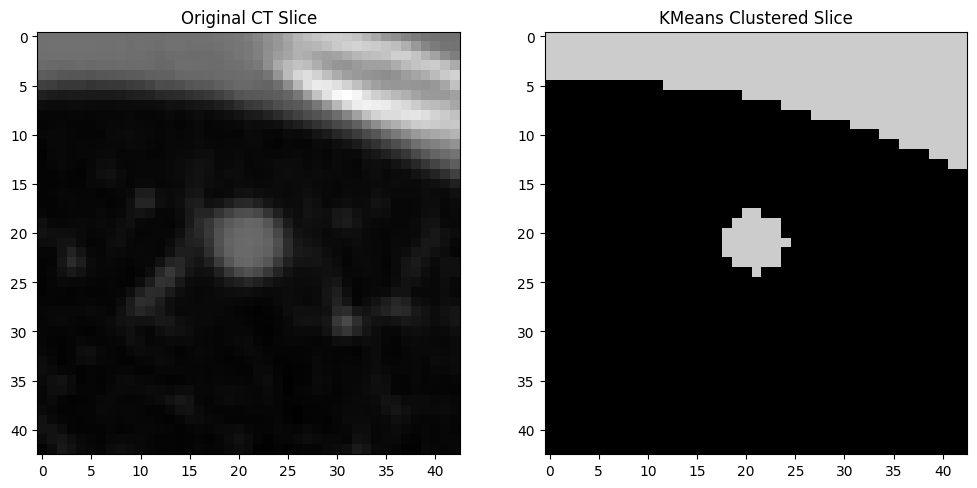

Completed segmentation for LIDC-IDRI-0063_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0073_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0073_R_3.nii.gz


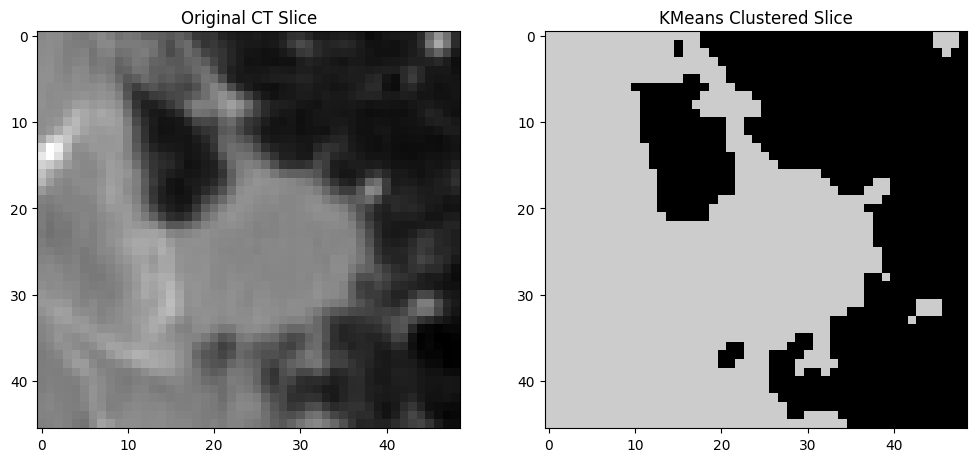

Completed segmentation for LIDC-IDRI-0073_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0097_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0097_R_1.nii.gz


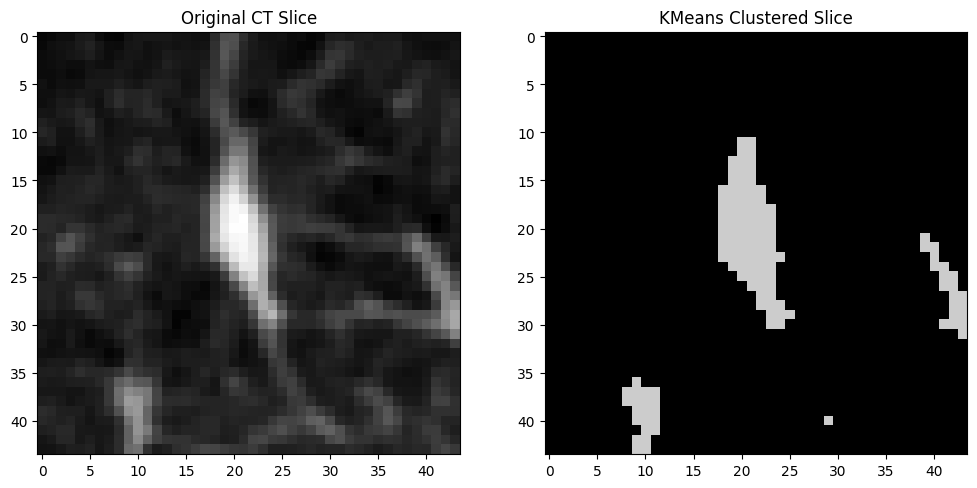

Completed segmentation for LIDC-IDRI-0097_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0042_R_9.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0042_R_9.nii.gz


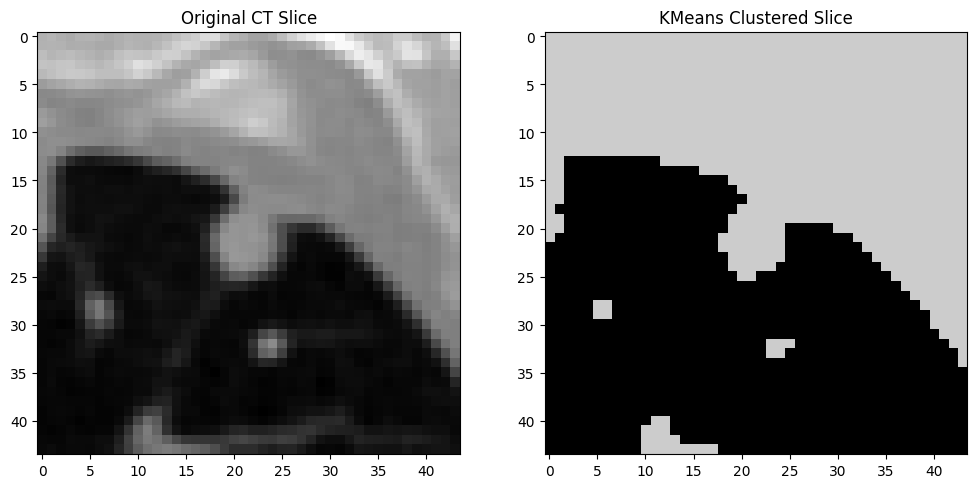

Completed segmentation for LIDC-IDRI-0042_R_9.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0045_R_10.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0045_R_10.nii.gz


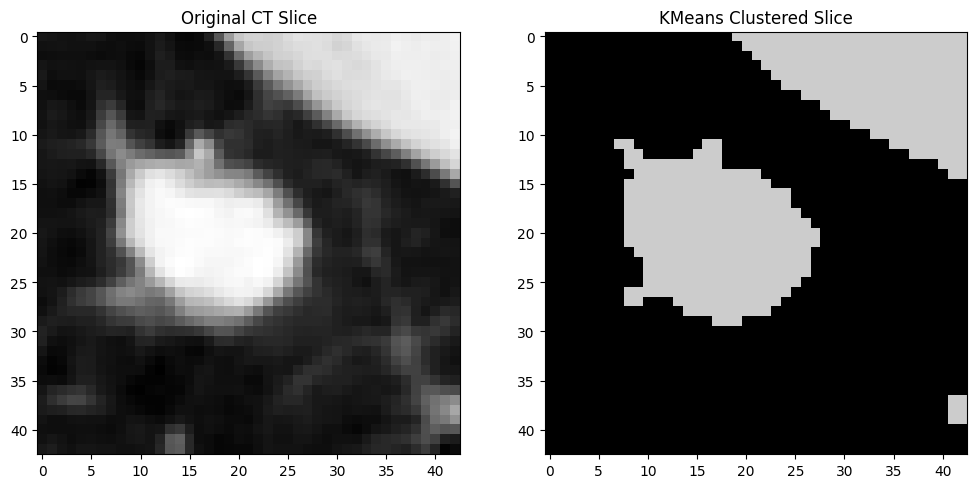

Completed segmentation for LIDC-IDRI-0045_R_10.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0124_R_14.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0124_R_14.nii.gz


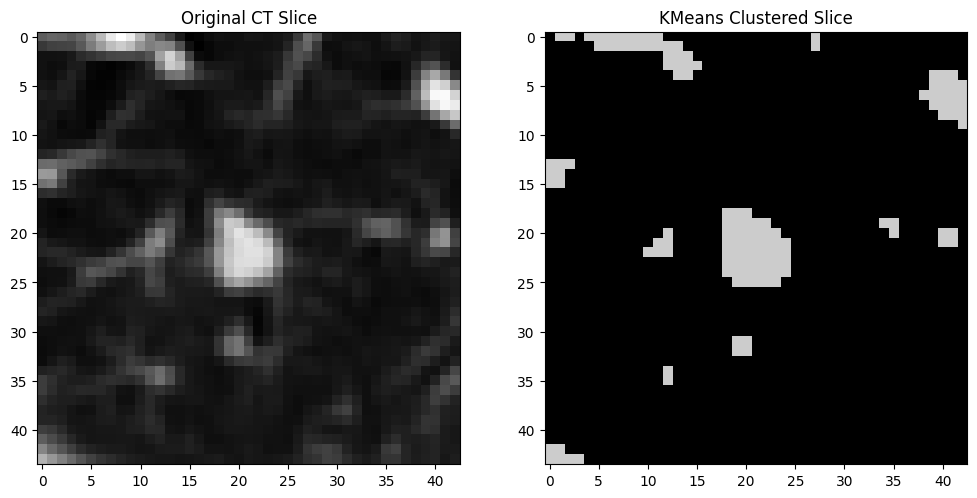

Completed segmentation for LIDC-IDRI-0124_R_14.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0080_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0080_R_2.nii.gz


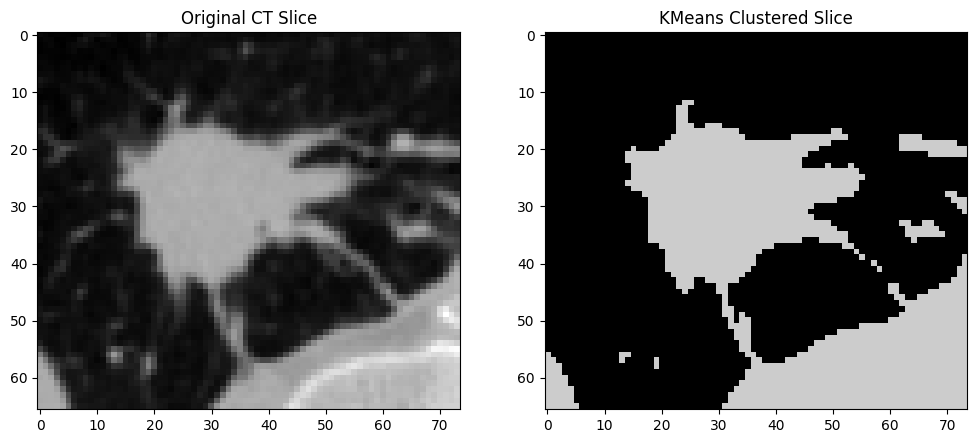

Completed segmentation for LIDC-IDRI-0080_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0021_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0021_R_3.nii.gz


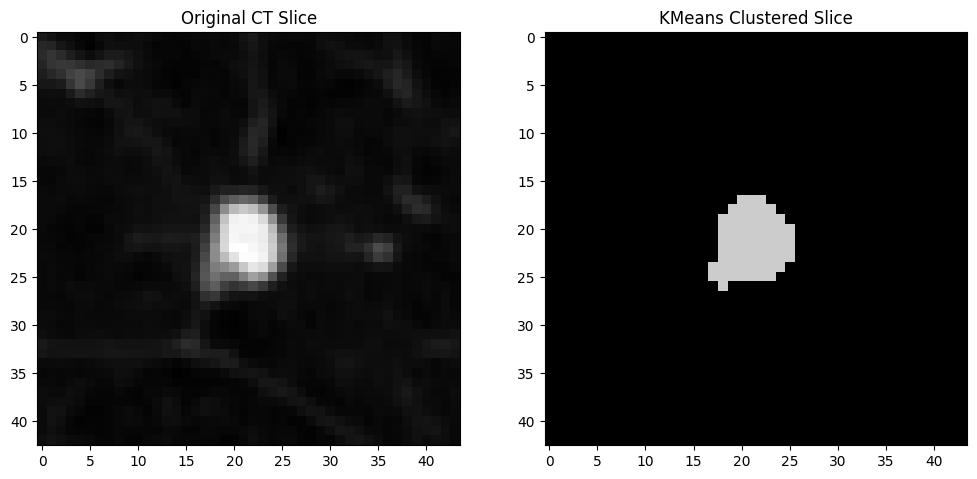

Completed segmentation for LIDC-IDRI-0021_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0068_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0068_R_2.nii.gz


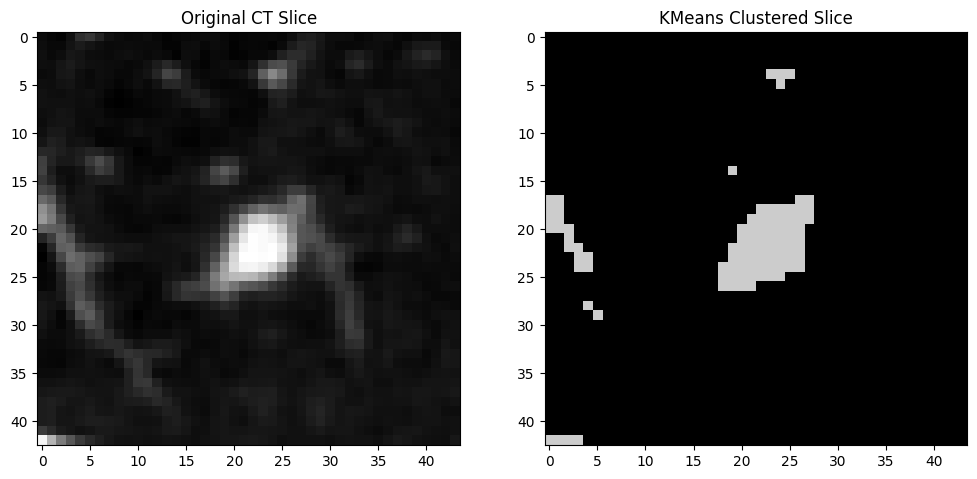

Completed segmentation for LIDC-IDRI-0068_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0141_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0141_R_1.nii.gz


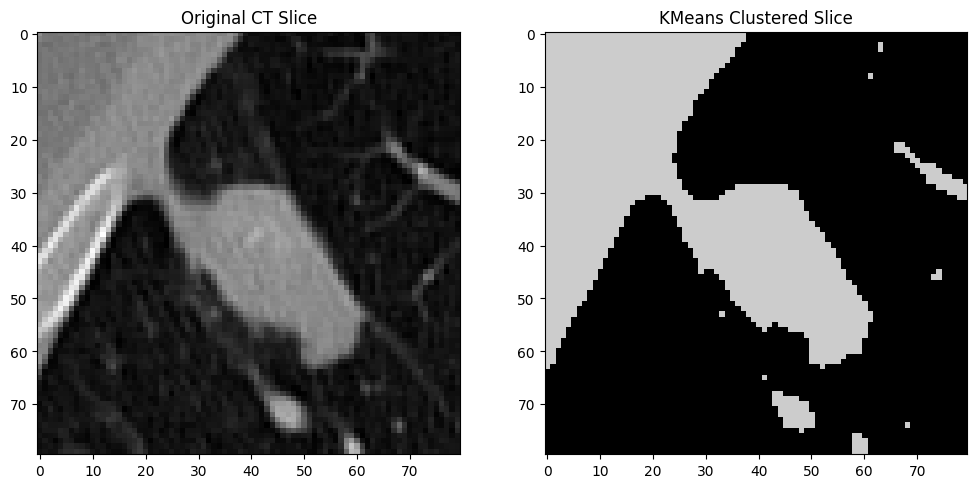

Completed segmentation for LIDC-IDRI-0141_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0061_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0061_R_4.nii.gz


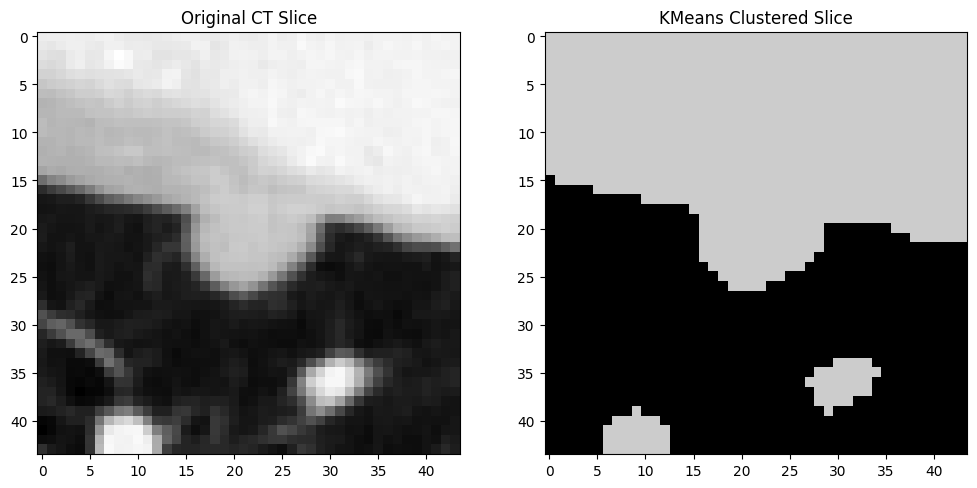

Completed segmentation for LIDC-IDRI-0061_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0039_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0039_R_1.nii.gz


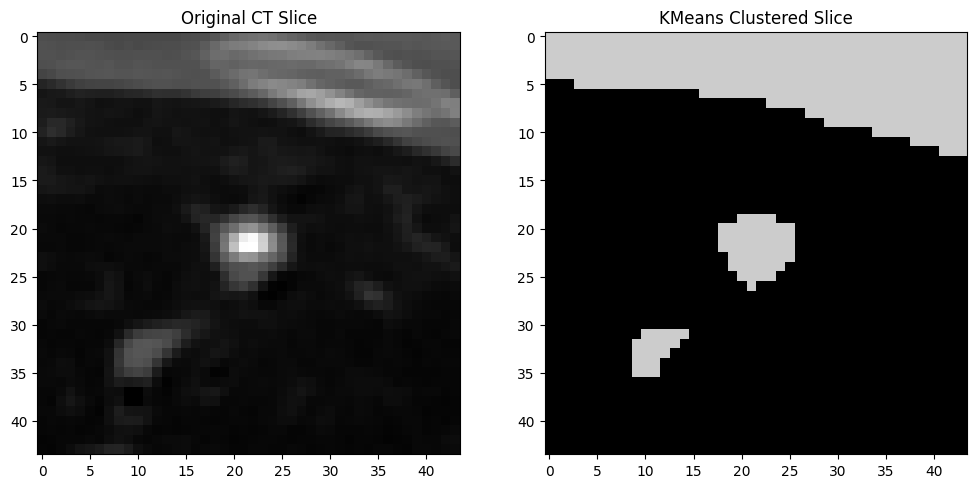

Completed segmentation for LIDC-IDRI-0039_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0118_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0118_R_6.nii.gz


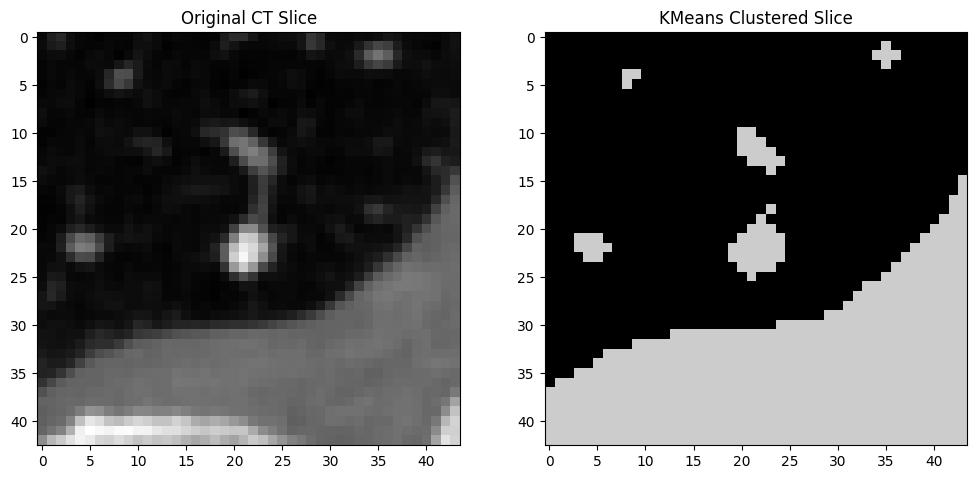

Completed segmentation for LIDC-IDRI-0118_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0144_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0144_R_1.nii.gz


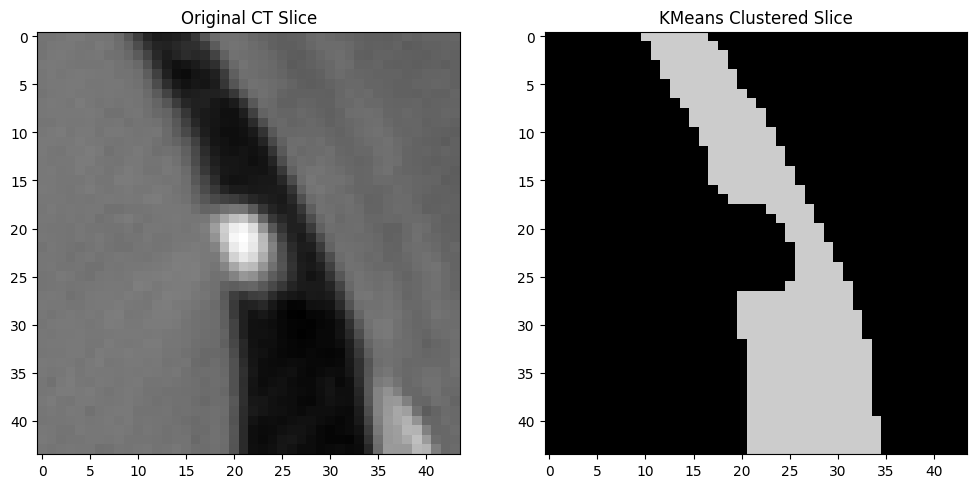

Completed segmentation for LIDC-IDRI-0144_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0027_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0027_R_5.nii.gz


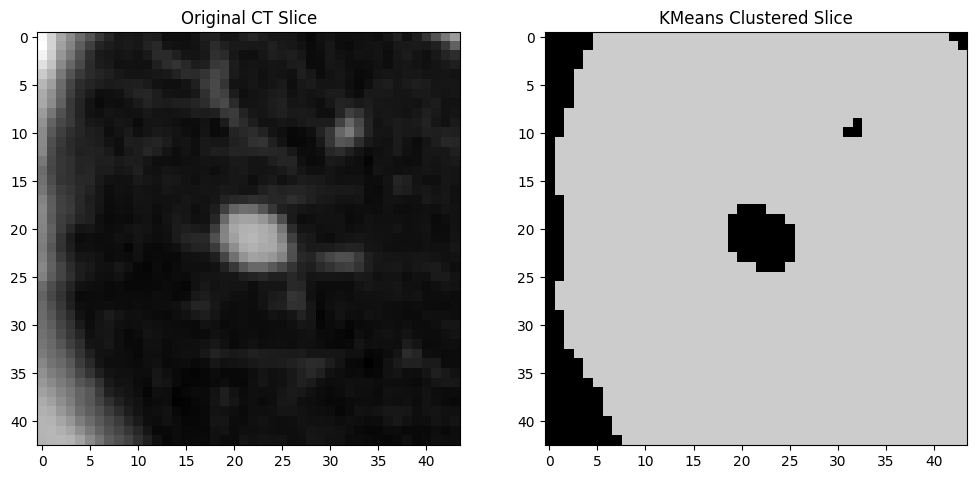

Completed segmentation for LIDC-IDRI-0027_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0053_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0053_R_1.nii.gz


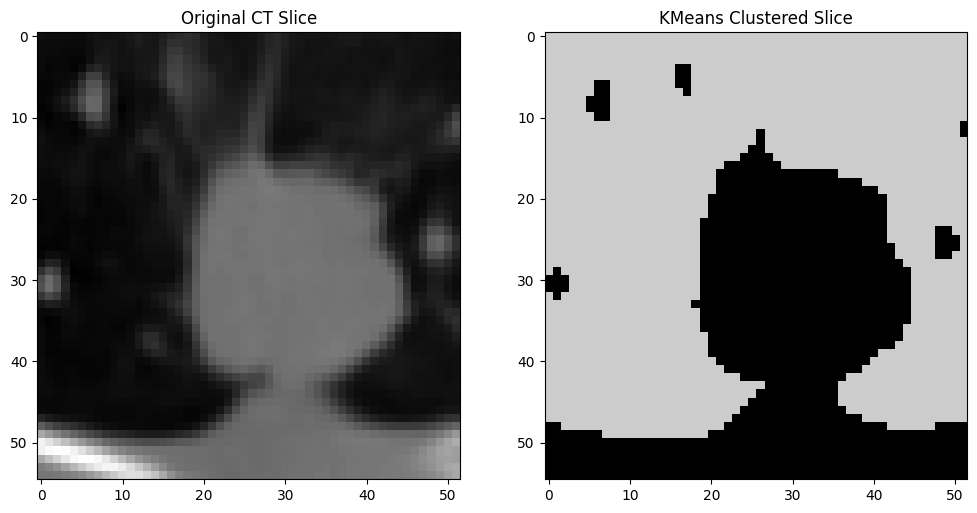

Completed segmentation for LIDC-IDRI-0053_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0046_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0046_R_2.nii.gz


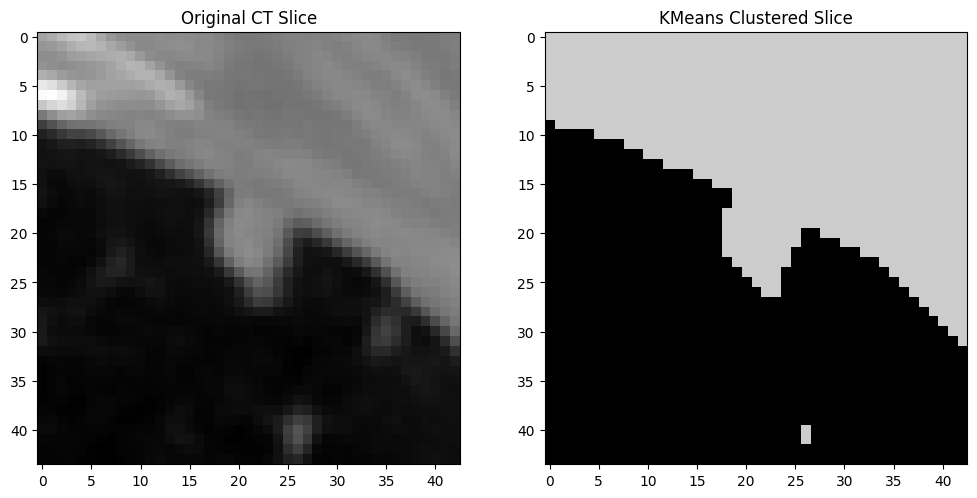

Completed segmentation for LIDC-IDRI-0046_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0051_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0051_R_3.nii.gz


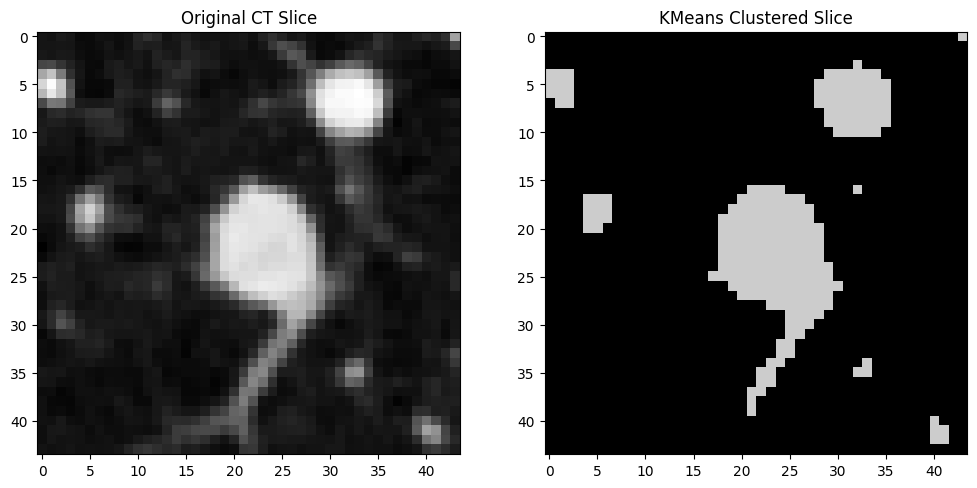

Completed segmentation for LIDC-IDRI-0051_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0024_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0024_R_3.nii.gz


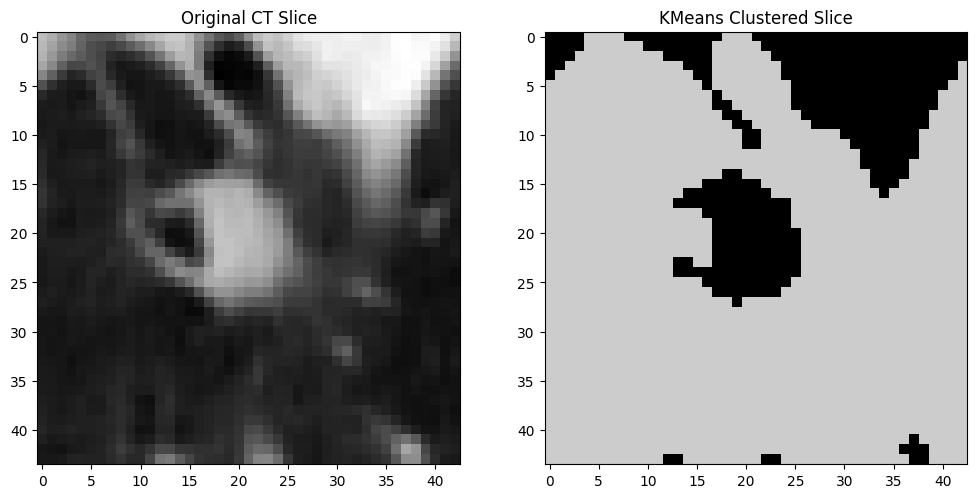

Completed segmentation for LIDC-IDRI-0024_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0108_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0108_R_1.nii.gz


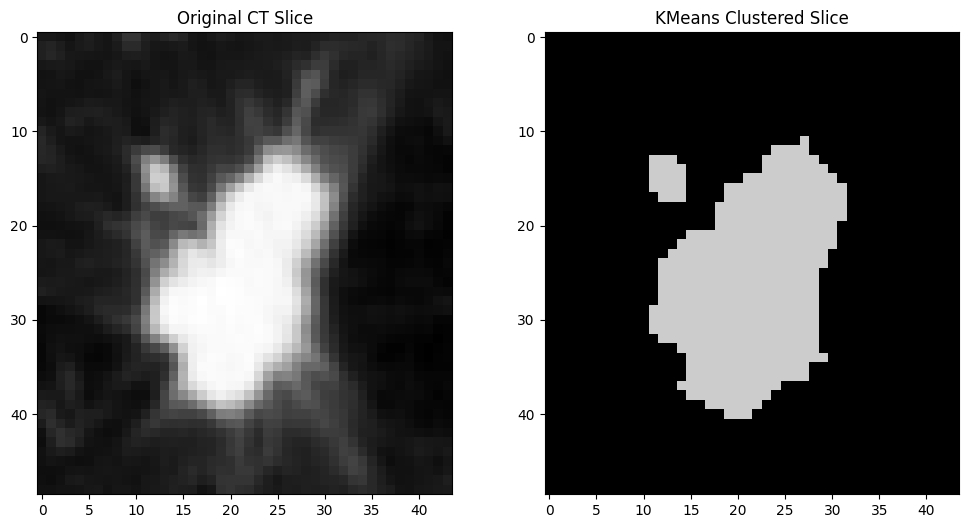

Completed segmentation for LIDC-IDRI-0108_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0082_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0082_R_1.nii.gz


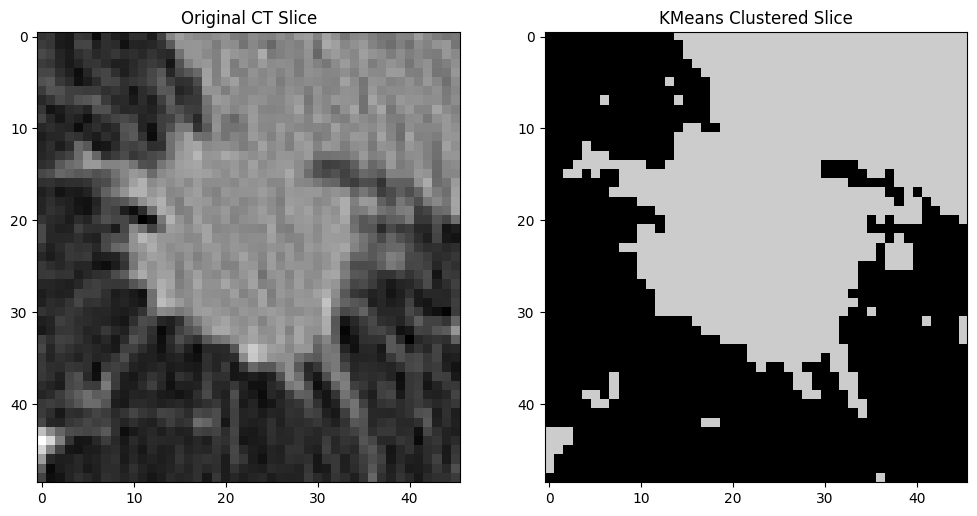

Completed segmentation for LIDC-IDRI-0082_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0129_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0129_R_4.nii.gz


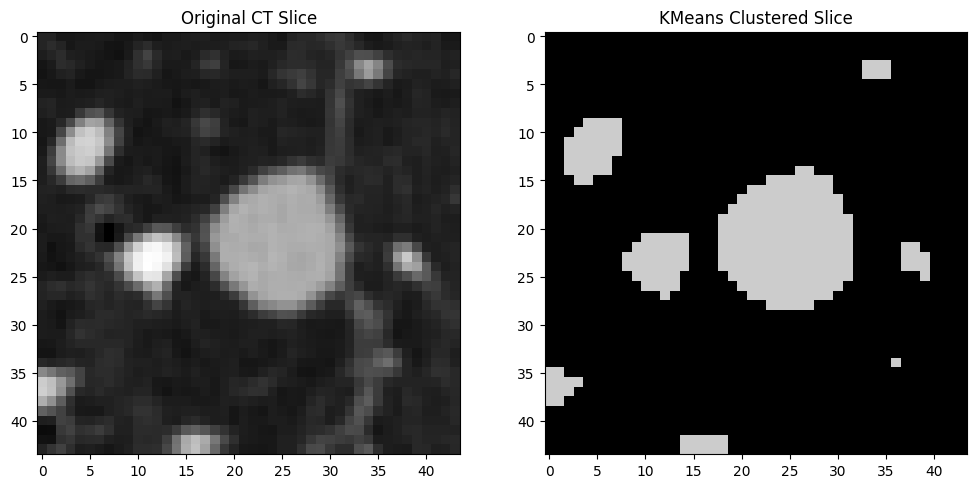

Completed segmentation for LIDC-IDRI-0129_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0124_R_15.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0124_R_15.nii.gz


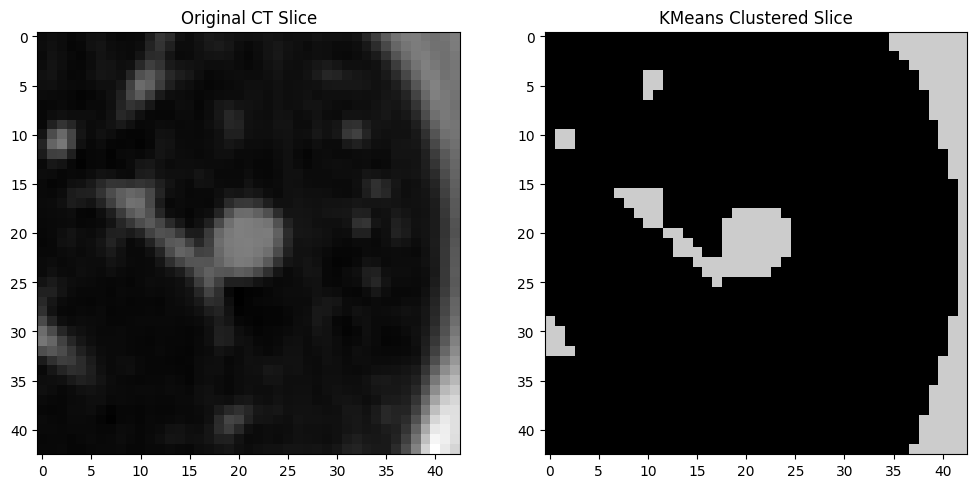

Completed segmentation for LIDC-IDRI-0124_R_15.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0061_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0061_R_6.nii.gz


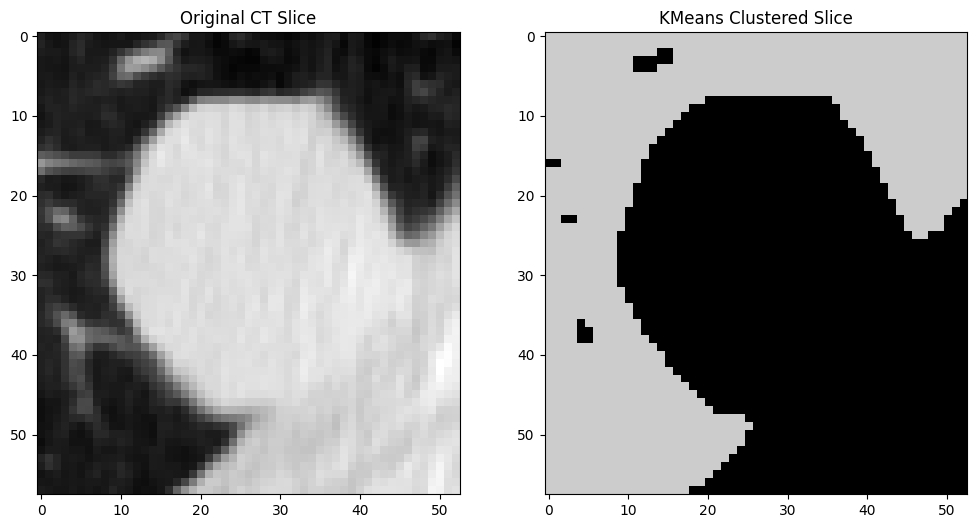

Completed segmentation for LIDC-IDRI-0061_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0011_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0011_R_6.nii.gz


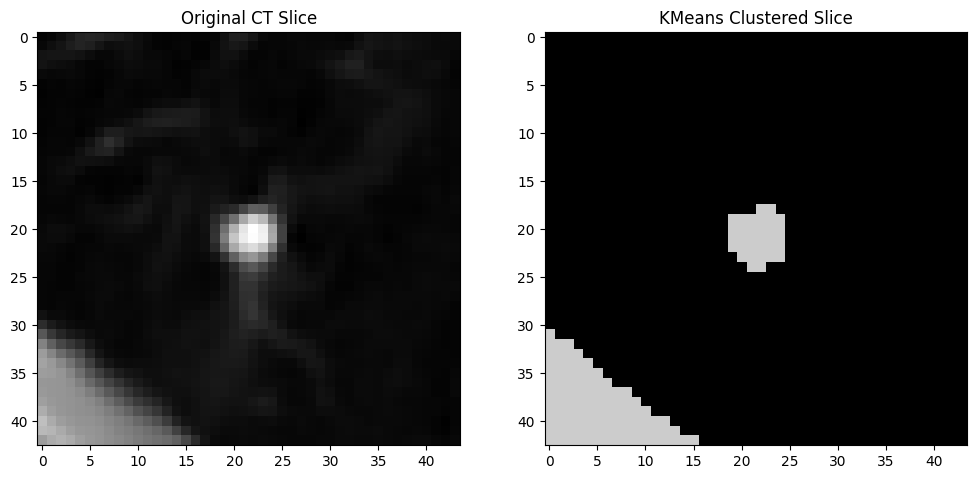

Completed segmentation for LIDC-IDRI-0011_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0049_R_10.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0049_R_10.nii.gz


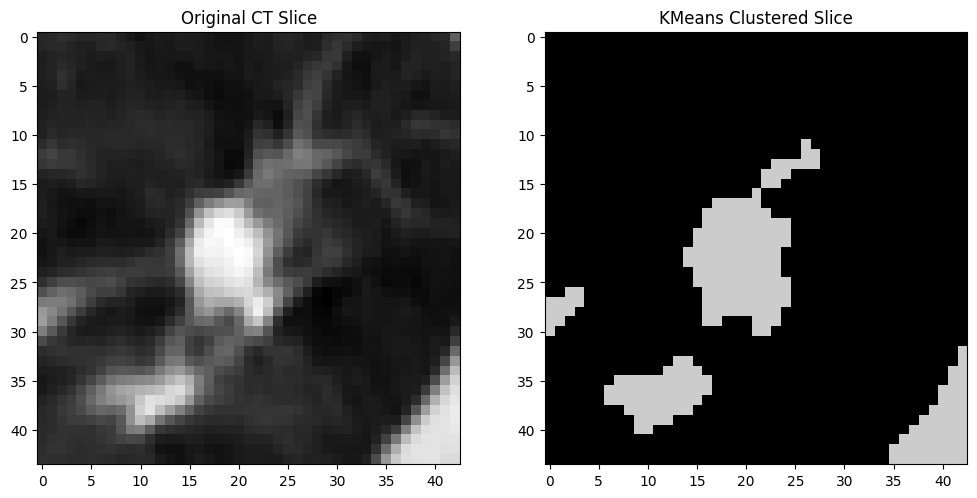

Completed segmentation for LIDC-IDRI-0049_R_10.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0133_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0133_R_2.nii.gz


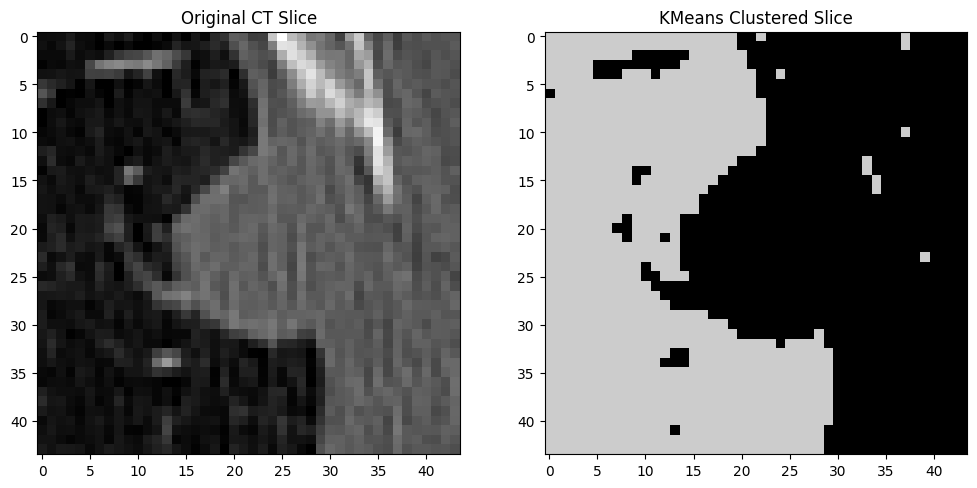

Completed segmentation for LIDC-IDRI-0133_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0088_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0088_R_1.nii.gz


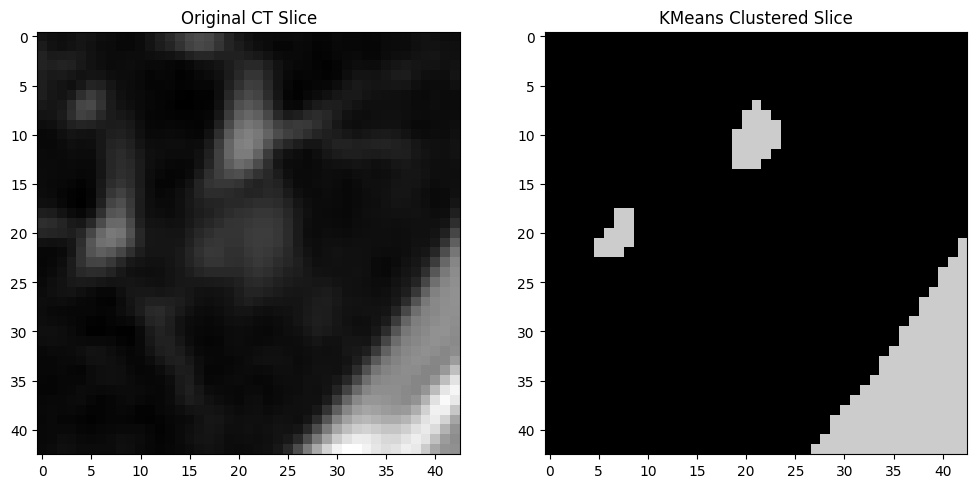

Completed segmentation for LIDC-IDRI-0088_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0140_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0140_R_1.nii.gz


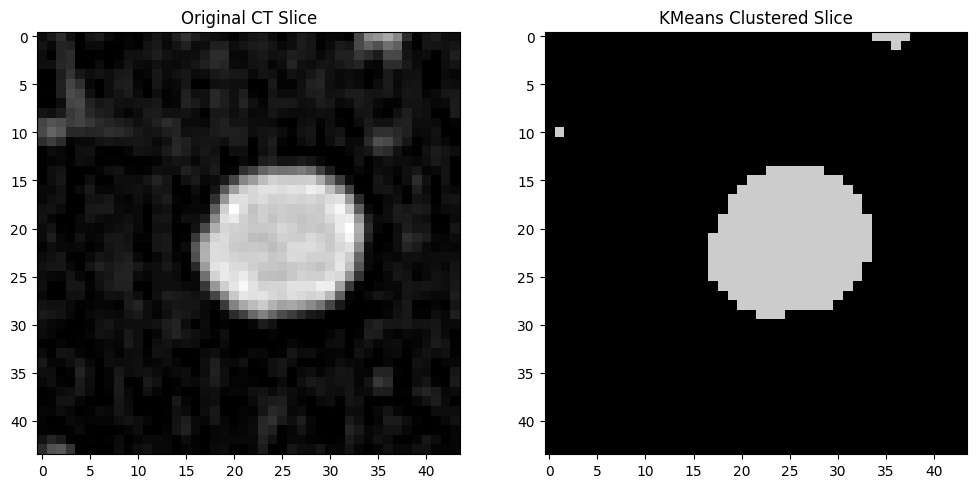

Completed segmentation for LIDC-IDRI-0140_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0068_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0068_R_5.nii.gz


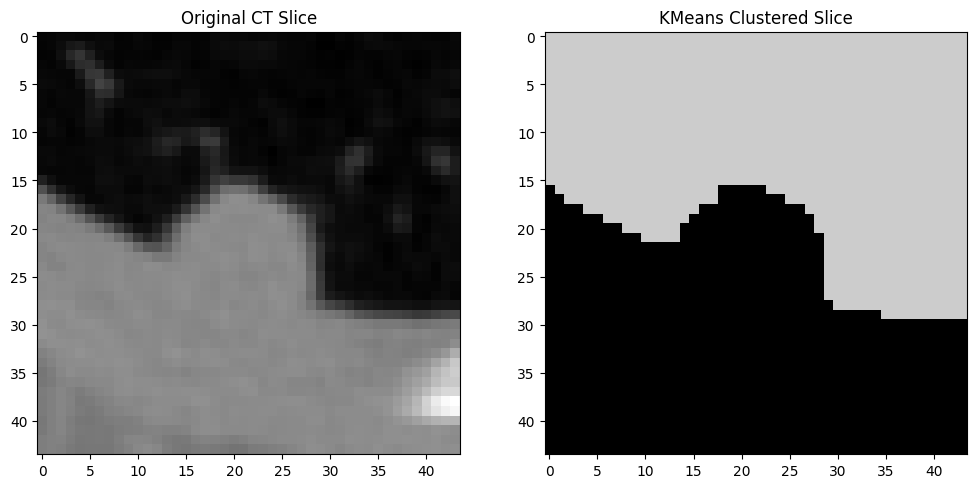

Completed segmentation for LIDC-IDRI-0068_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0047_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0047_R_1.nii.gz


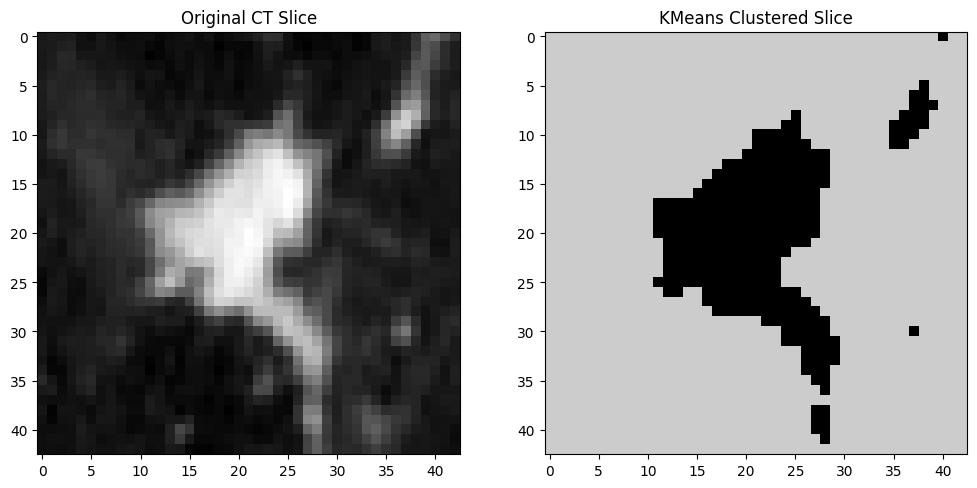

Completed segmentation for LIDC-IDRI-0047_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0074_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0074_R_1.nii.gz


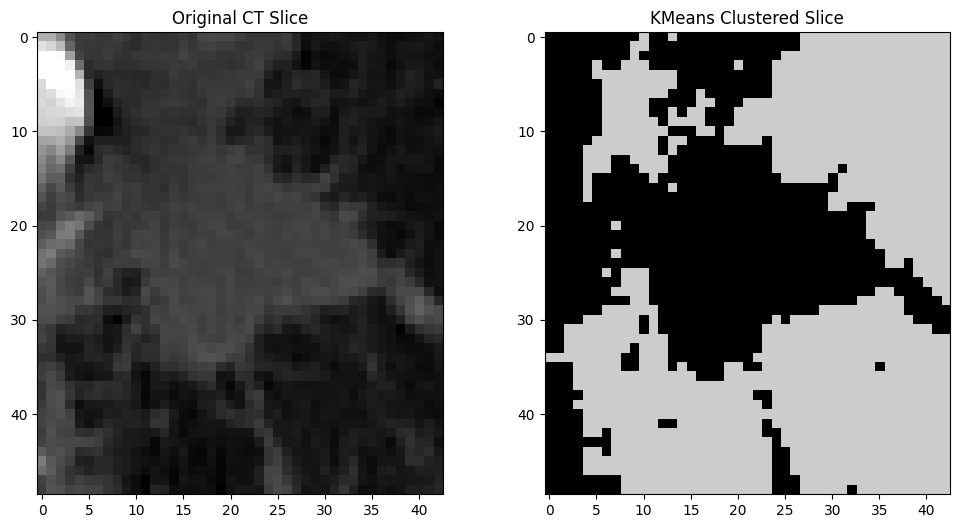

Completed segmentation for LIDC-IDRI-0074_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0064_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0064_R_2.nii.gz


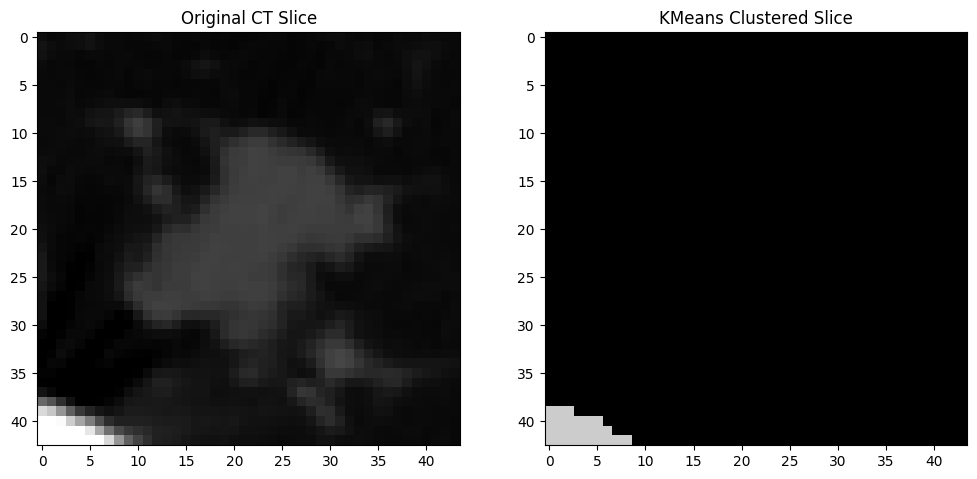

Completed segmentation for LIDC-IDRI-0064_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0016_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0016_R_2.nii.gz


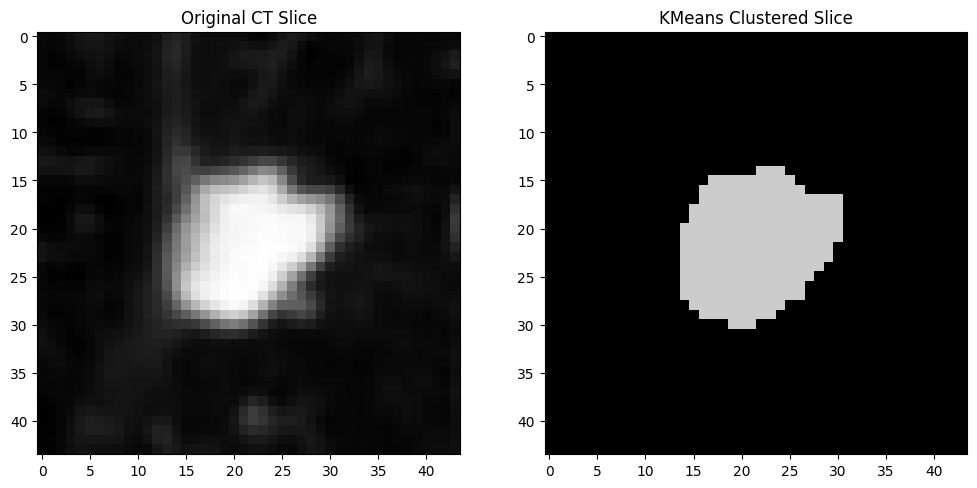

Completed segmentation for LIDC-IDRI-0016_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0061_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0061_R_1.nii.gz


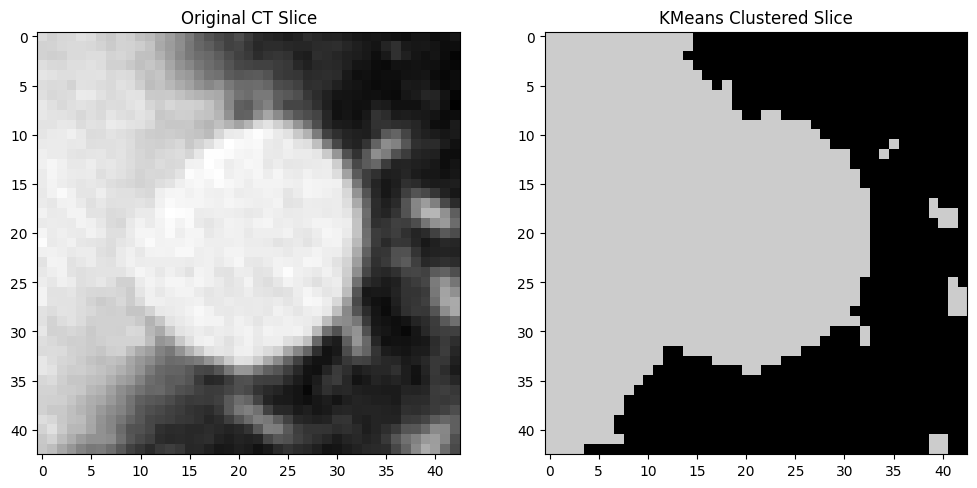

Completed segmentation for LIDC-IDRI-0061_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0024_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0024_R_2.nii.gz


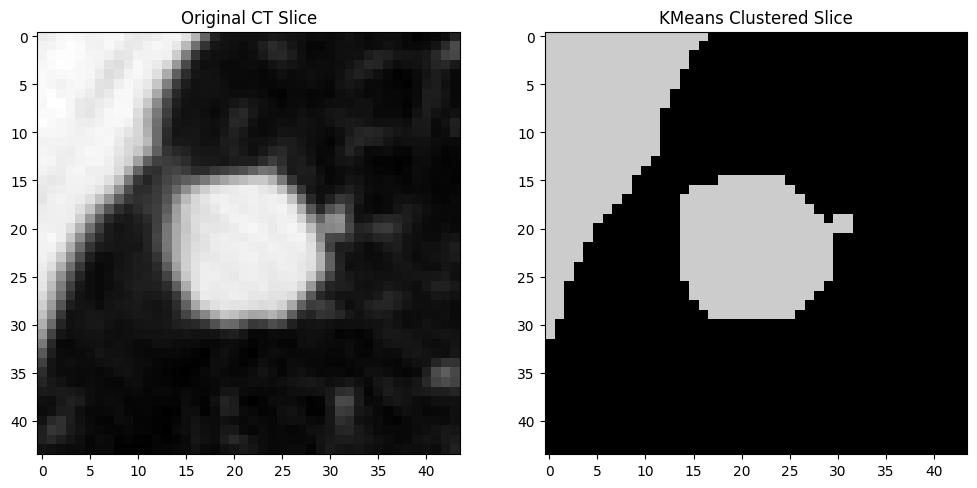

Completed segmentation for LIDC-IDRI-0024_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0088_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0088_R_2.nii.gz


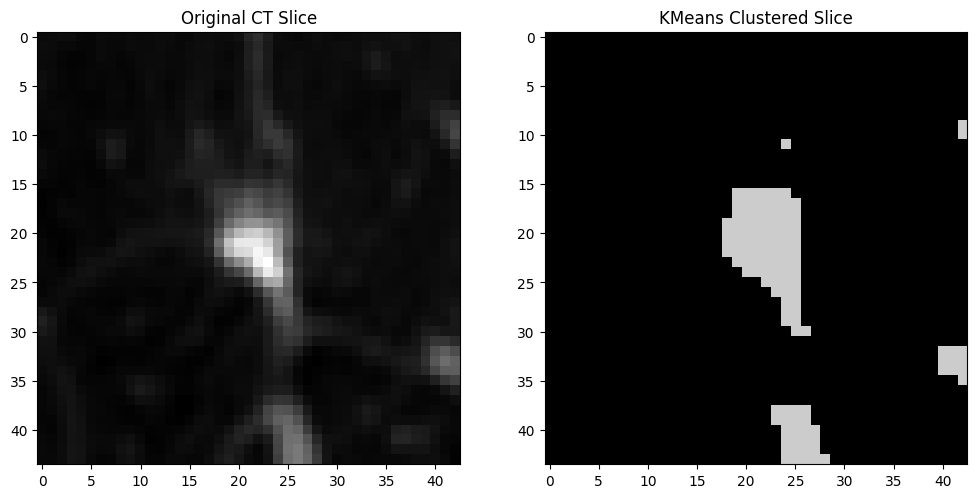

Completed segmentation for LIDC-IDRI-0088_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0129_R_7.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0129_R_7.nii.gz


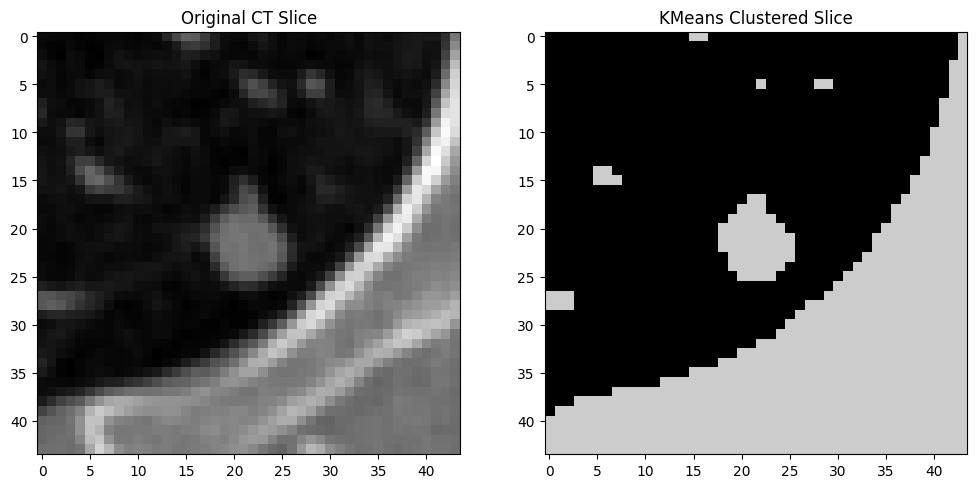

Completed segmentation for LIDC-IDRI-0129_R_7.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0031_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0031_R_4.nii.gz


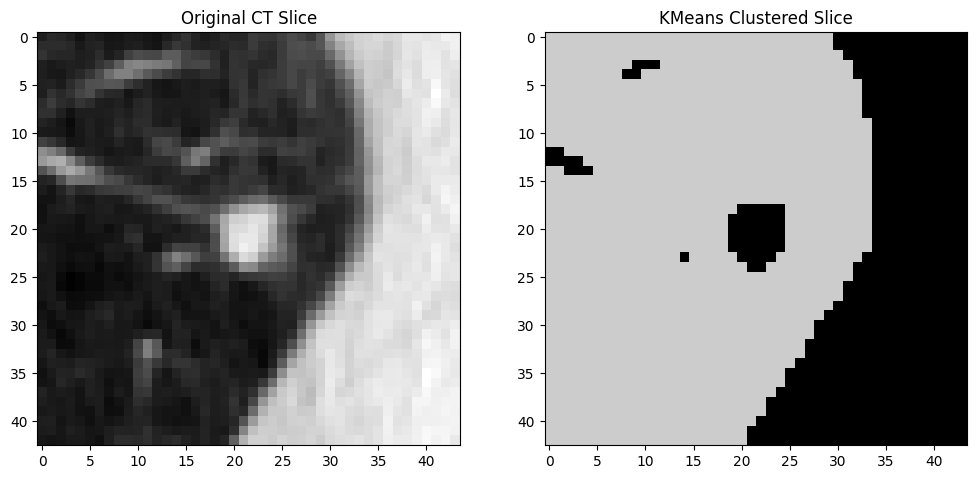

Completed segmentation for LIDC-IDRI-0031_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0037_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0037_R_2.nii.gz


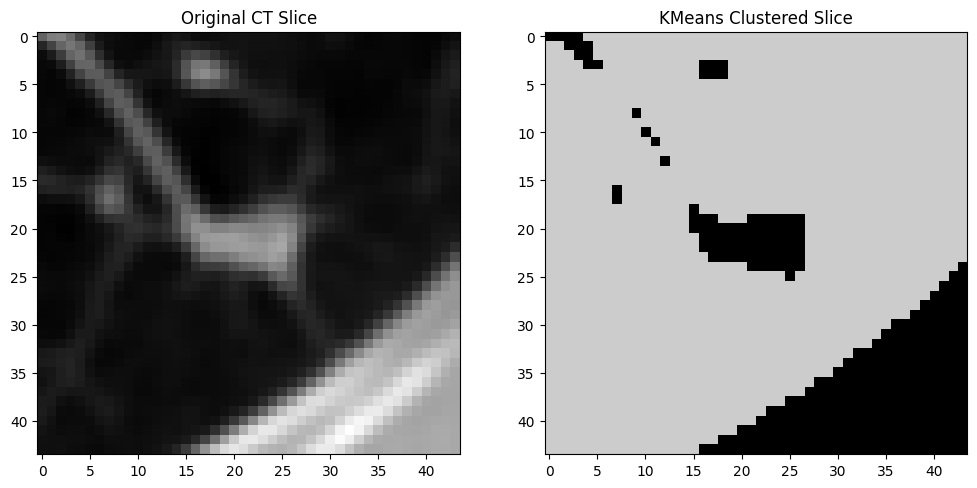

Completed segmentation for LIDC-IDRI-0037_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0091_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0091_R_5.nii.gz


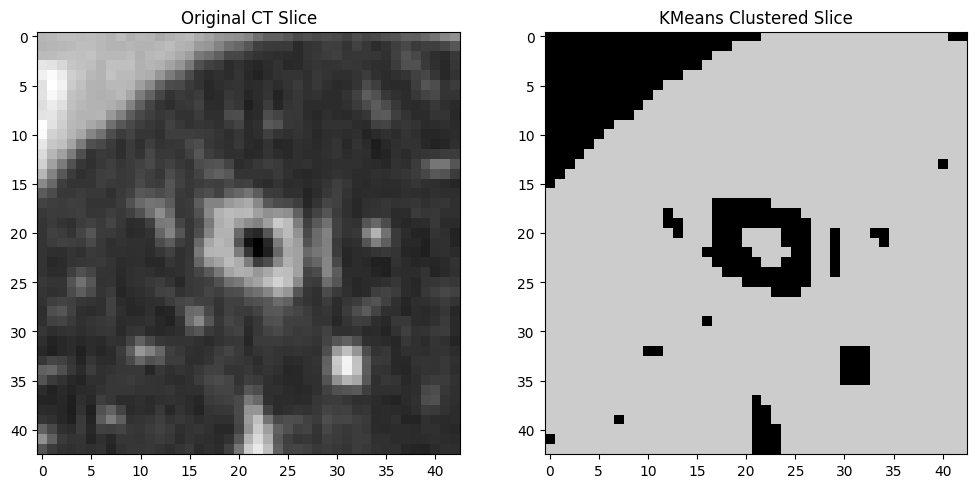

Completed segmentation for LIDC-IDRI-0091_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0053_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0053_R_2.nii.gz


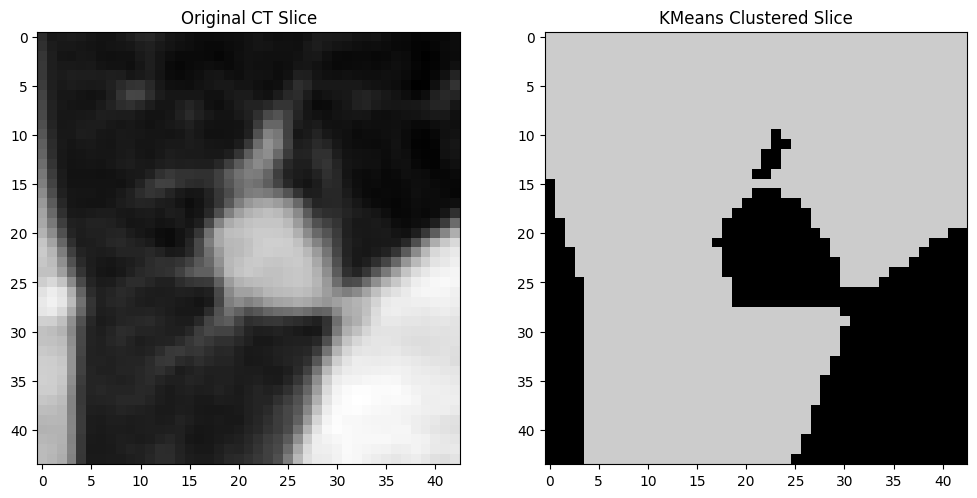

Completed segmentation for LIDC-IDRI-0053_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0093_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0093_R_2.nii.gz


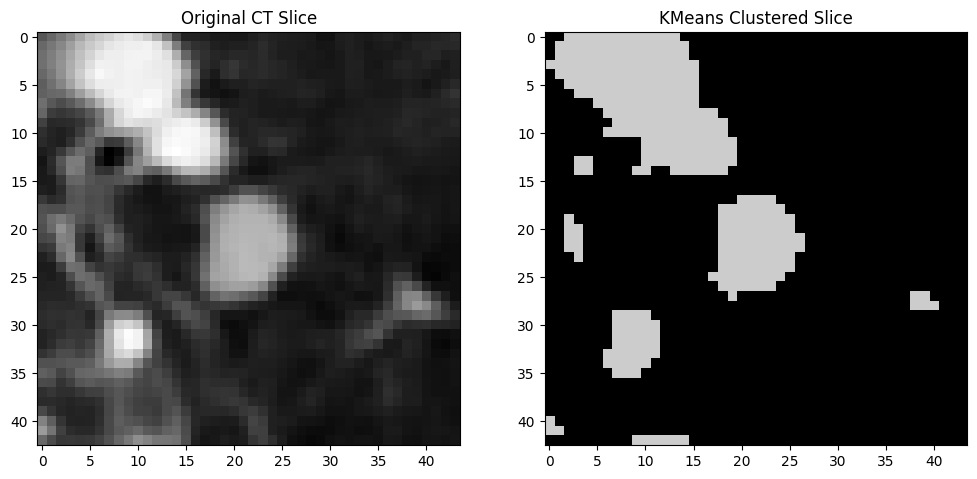

Completed segmentation for LIDC-IDRI-0093_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0129_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0129_R_2.nii.gz


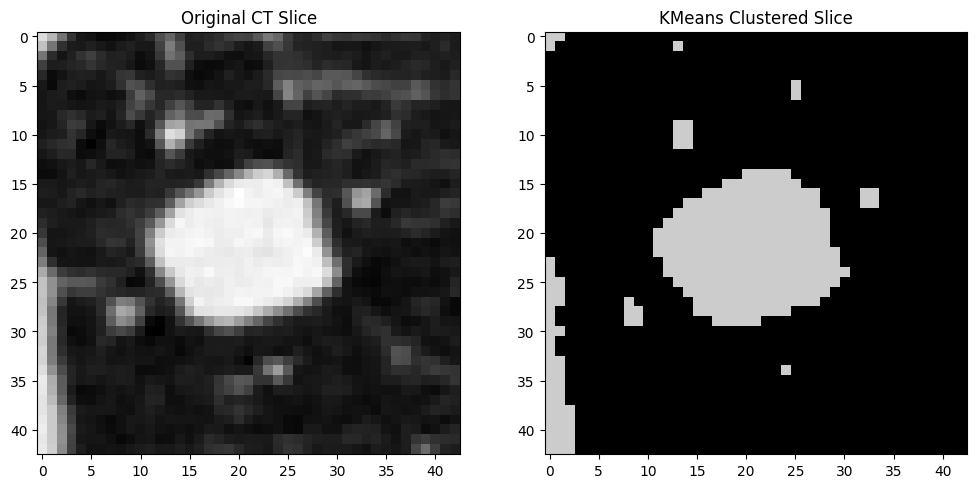

Completed segmentation for LIDC-IDRI-0129_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0008_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0008_R_1.nii.gz


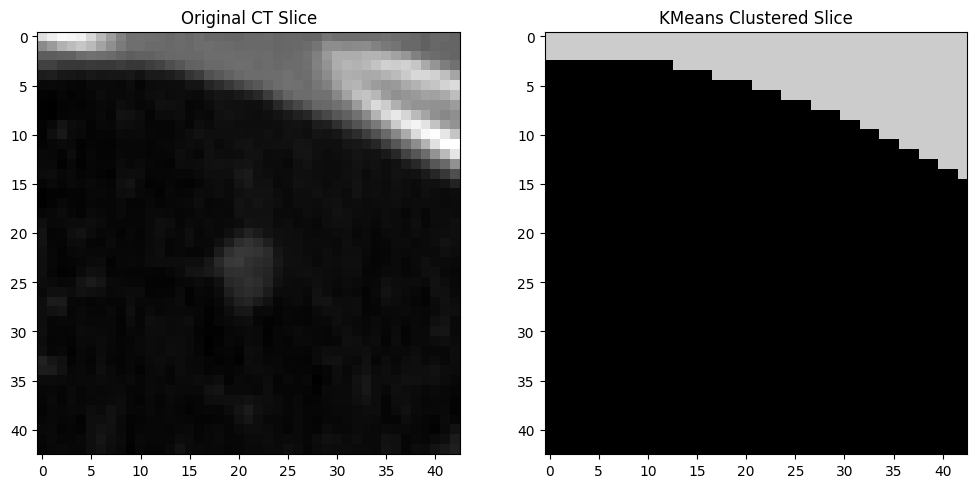

Completed segmentation for LIDC-IDRI-0008_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0139_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0139_R_2.nii.gz


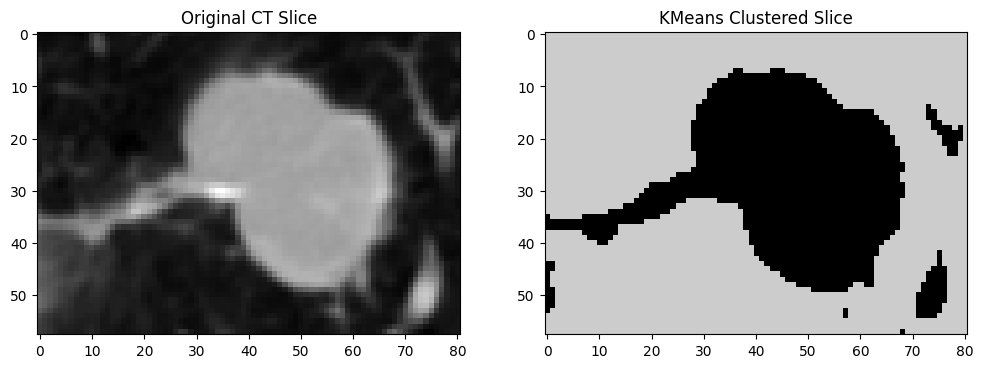

Completed segmentation for LIDC-IDRI-0139_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0094_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0094_R_1.nii.gz


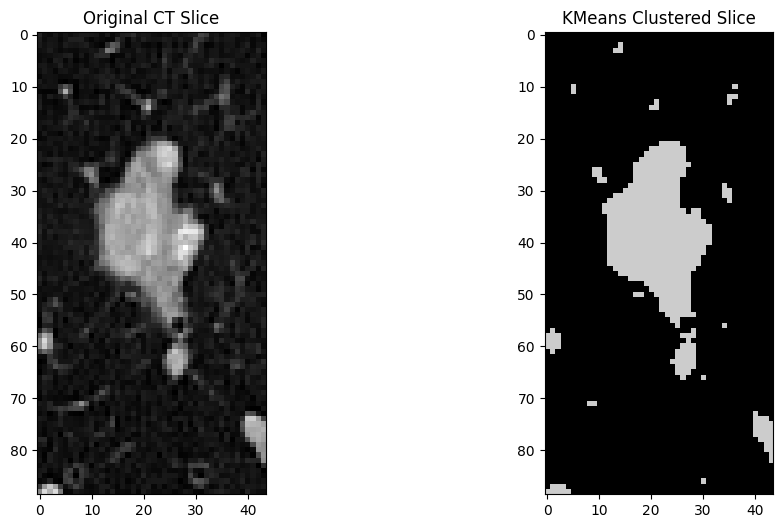

Completed segmentation for LIDC-IDRI-0094_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0084_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0084_R_2.nii.gz


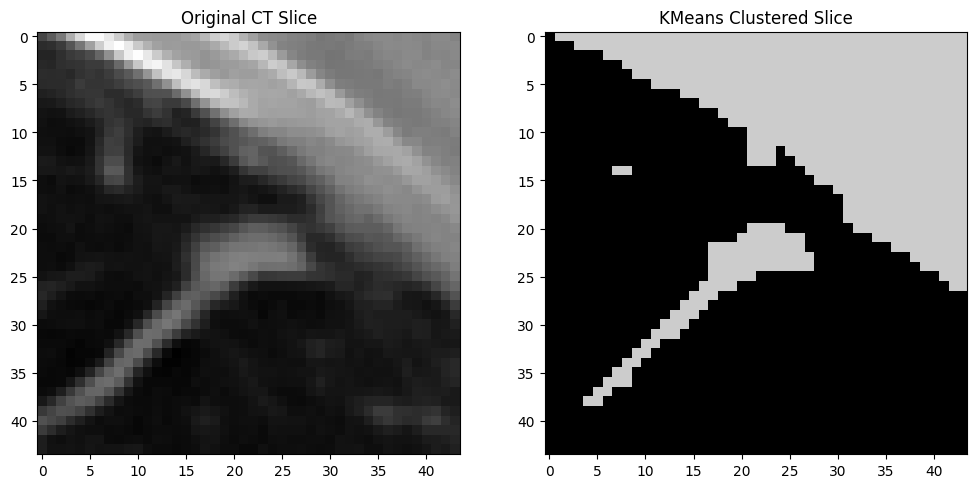

Completed segmentation for LIDC-IDRI-0084_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0046_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0046_R_5.nii.gz


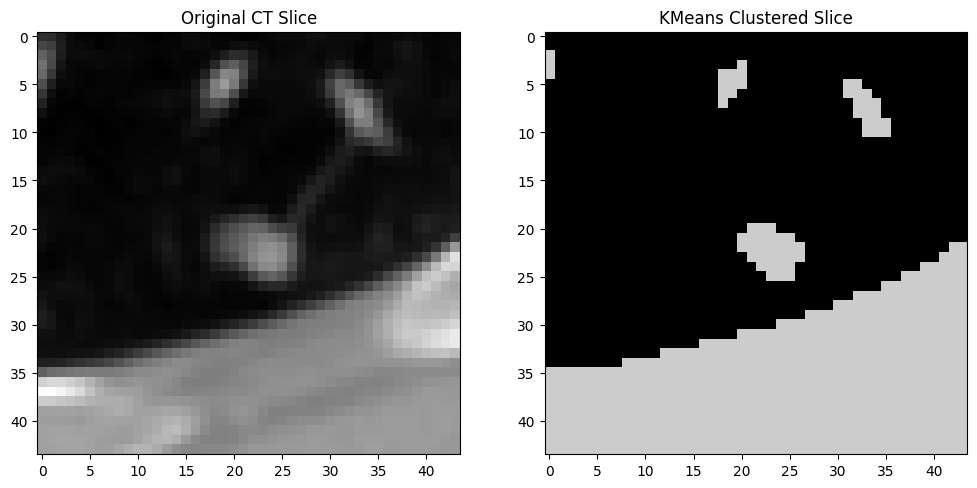

Completed segmentation for LIDC-IDRI-0046_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0056_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0056_R_2.nii.gz


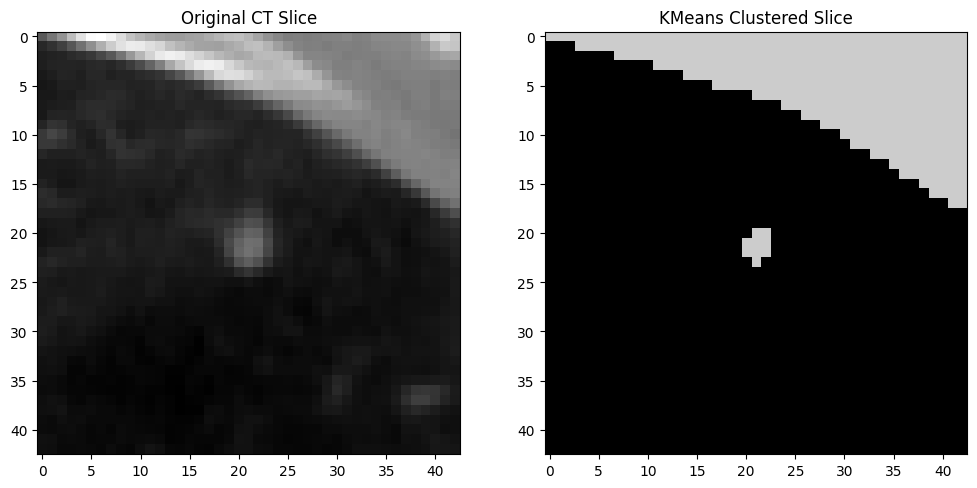

Completed segmentation for LIDC-IDRI-0056_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0081_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0081_R_1.nii.gz


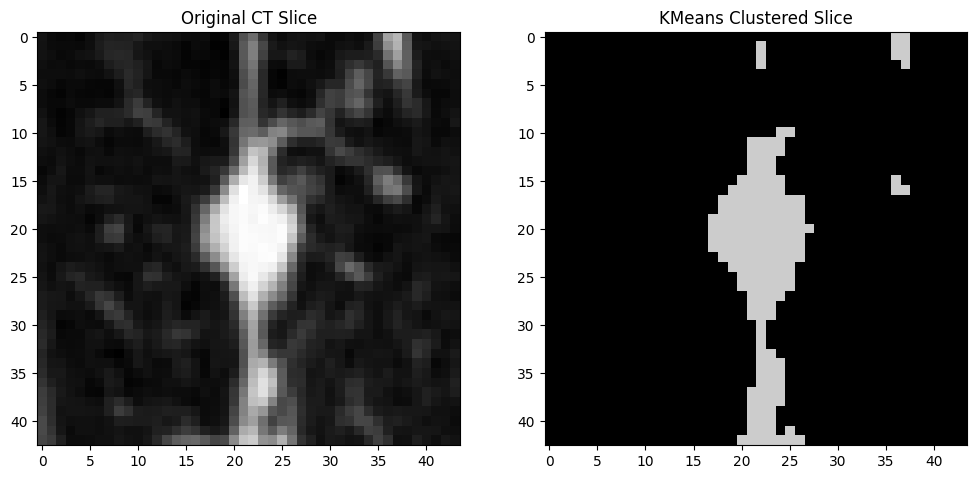

Completed segmentation for LIDC-IDRI-0081_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0076_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0076_R_1.nii.gz


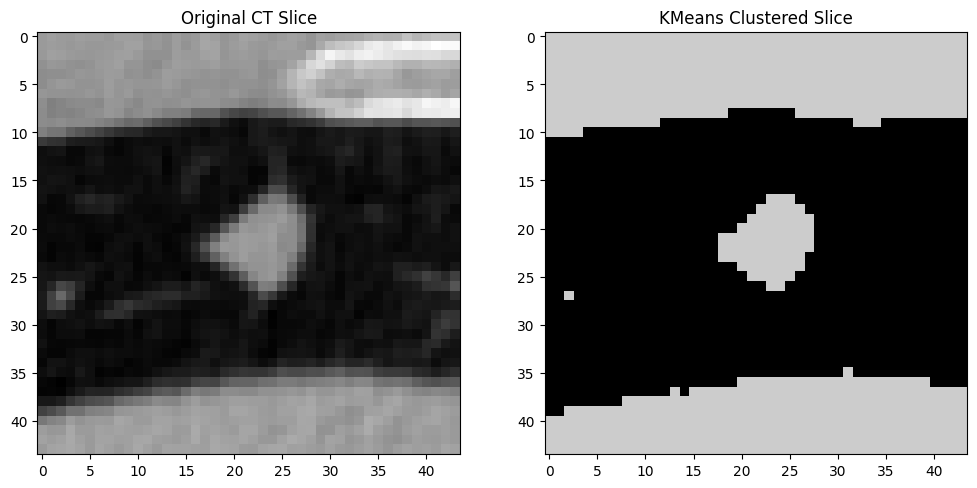

Completed segmentation for LIDC-IDRI-0076_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0142_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0142_R_1.nii.gz


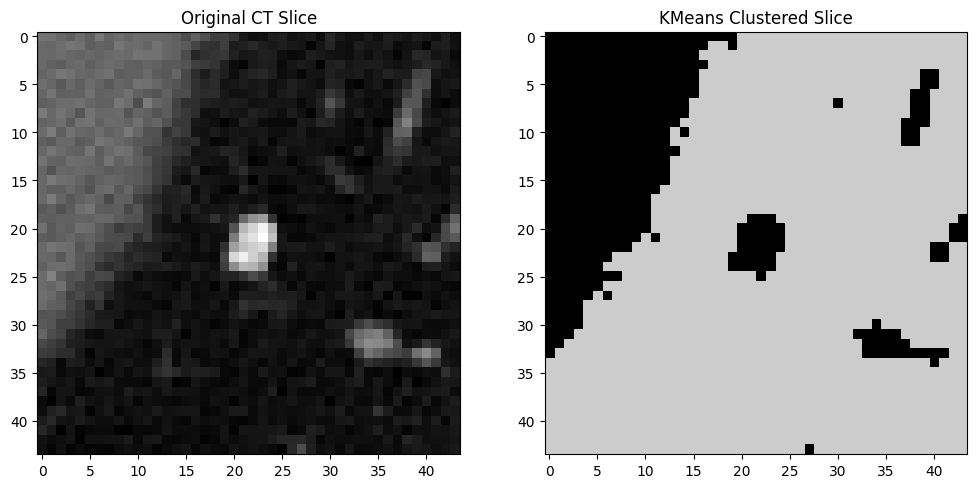

Completed segmentation for LIDC-IDRI-0142_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0039_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0039_R_3.nii.gz


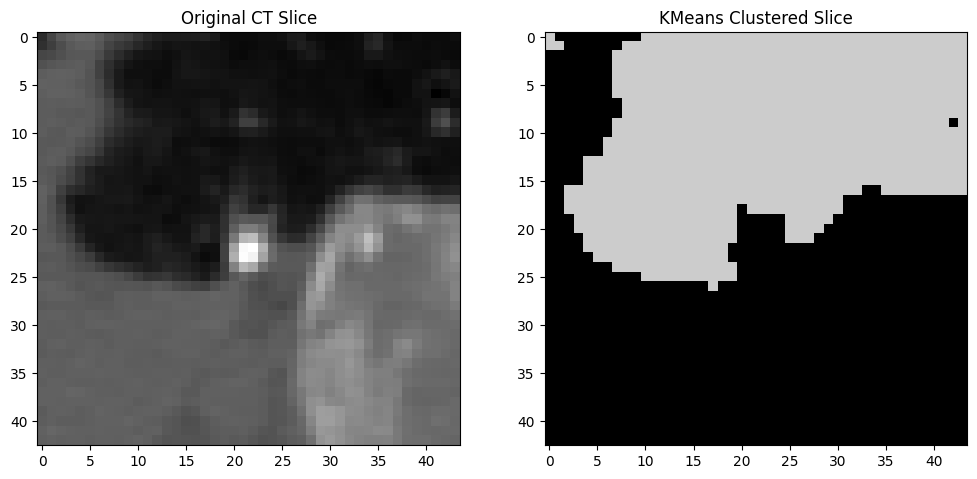

Completed segmentation for LIDC-IDRI-0039_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0012_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0012_R_4.nii.gz


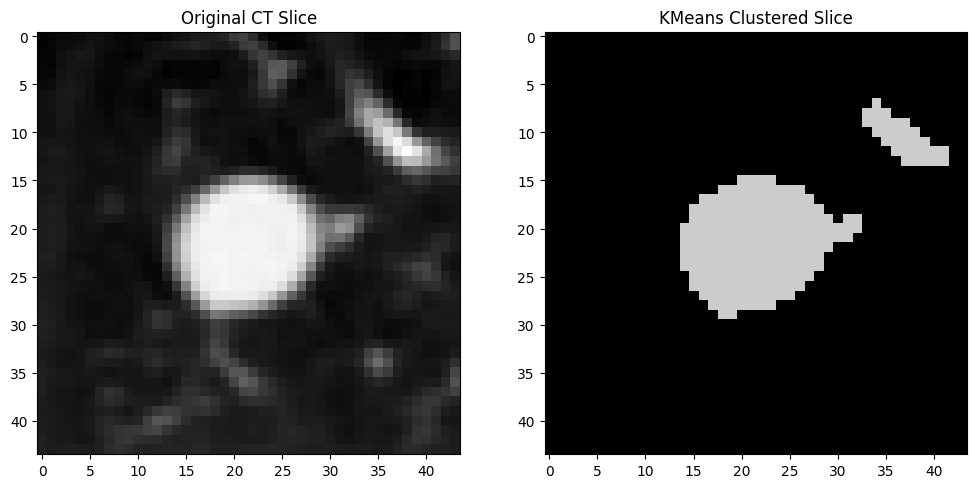

Completed segmentation for LIDC-IDRI-0012_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0012_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0012_R_3.nii.gz


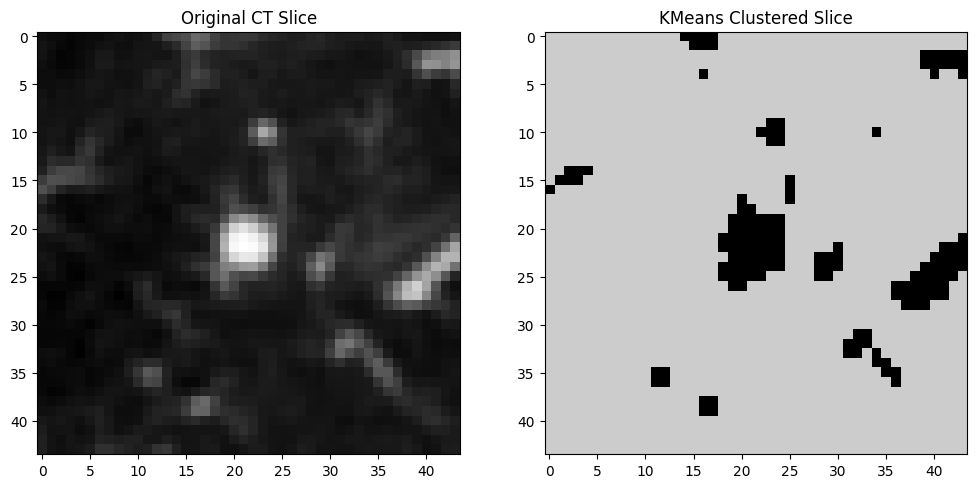

Completed segmentation for LIDC-IDRI-0012_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0006_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0006_R_4.nii.gz


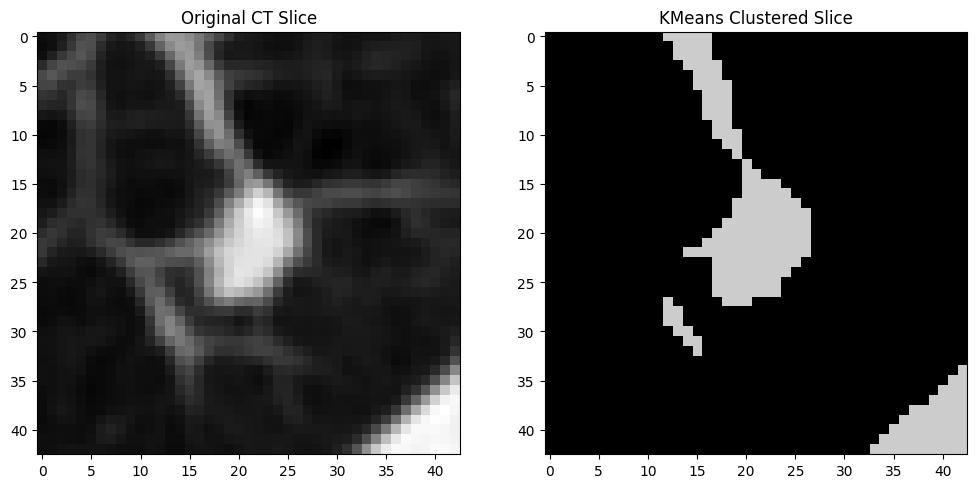

Completed segmentation for LIDC-IDRI-0006_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0012_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0012_R_6.nii.gz


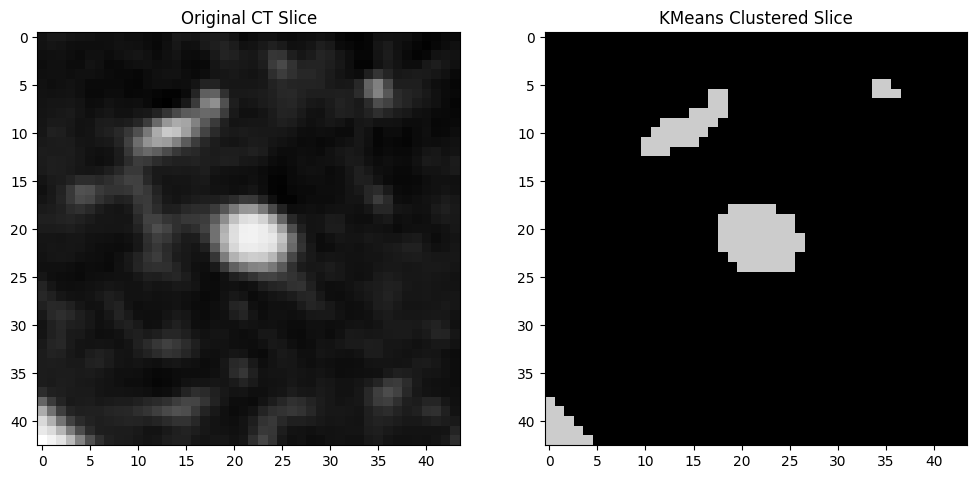

Completed segmentation for LIDC-IDRI-0012_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0058_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0058_R_1.nii.gz


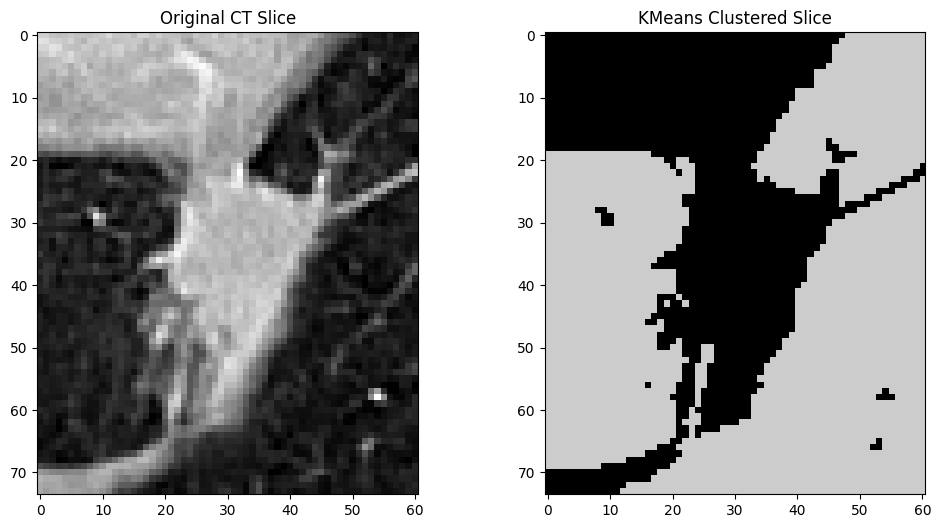

Completed segmentation for LIDC-IDRI-0058_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0124_R_9.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0124_R_9.nii.gz


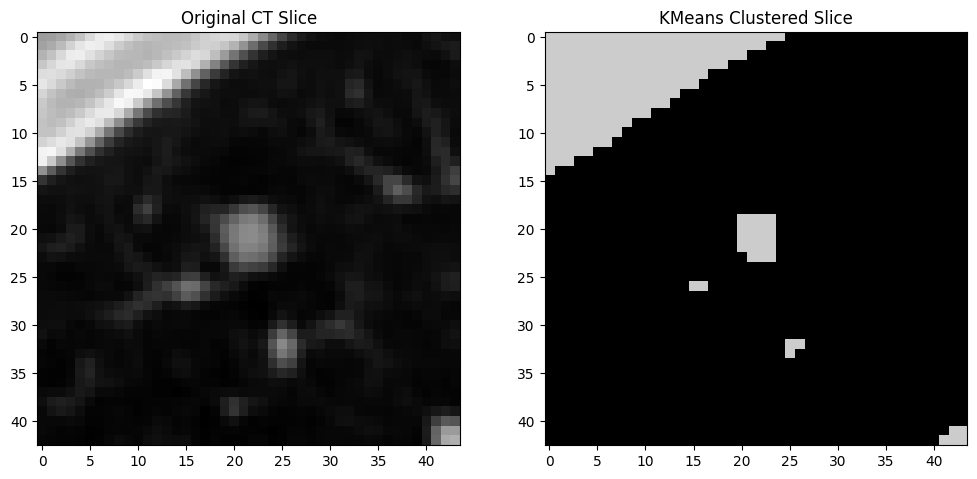

Completed segmentation for LIDC-IDRI-0124_R_9.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0043_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0043_R_1.nii.gz


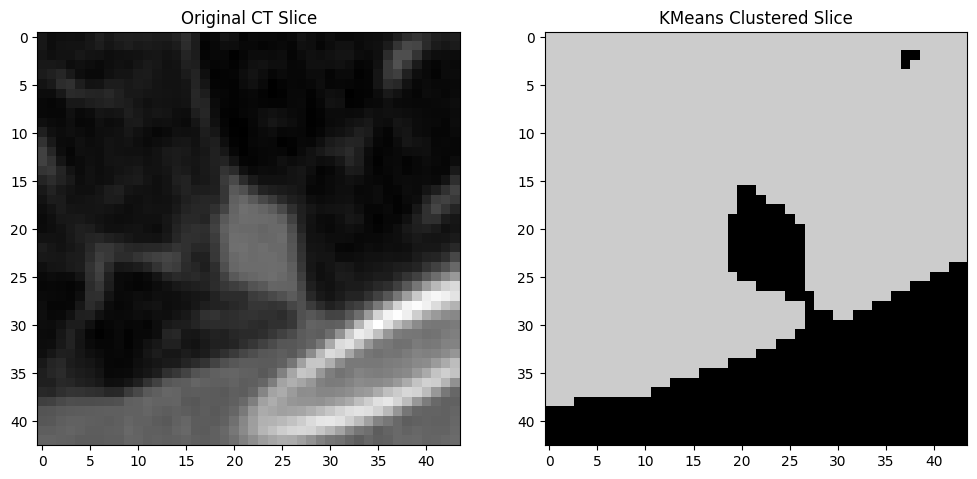

Completed segmentation for LIDC-IDRI-0043_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0043_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0043_R_2.nii.gz


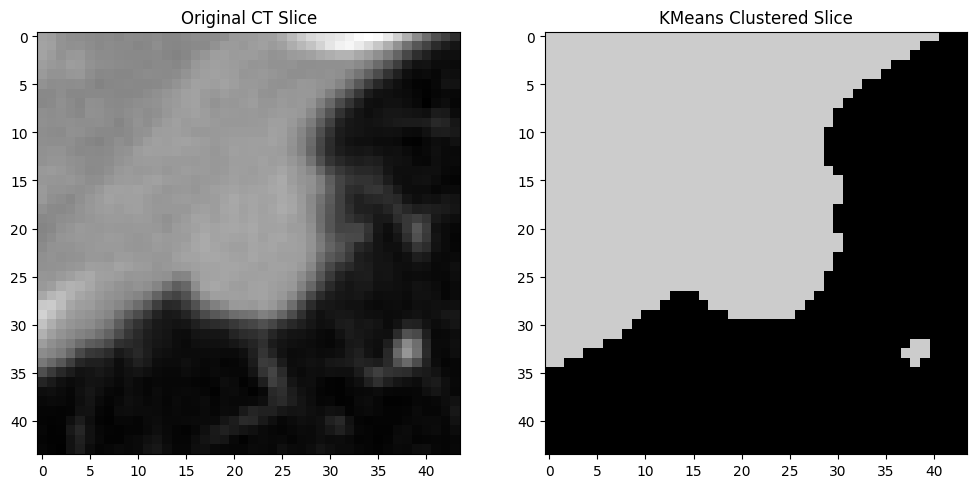

Completed segmentation for LIDC-IDRI-0043_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0031_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0031_R_5.nii.gz


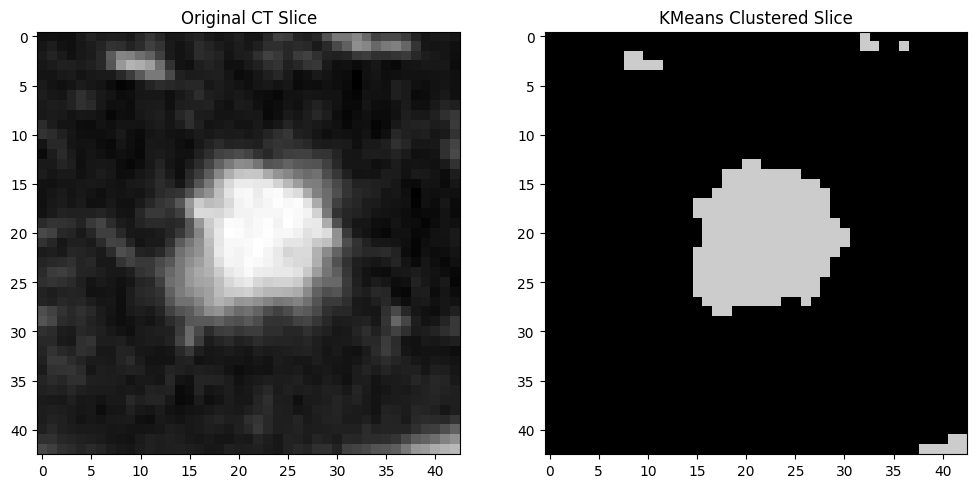

Completed segmentation for LIDC-IDRI-0031_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0003_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0003_R_2.nii.gz


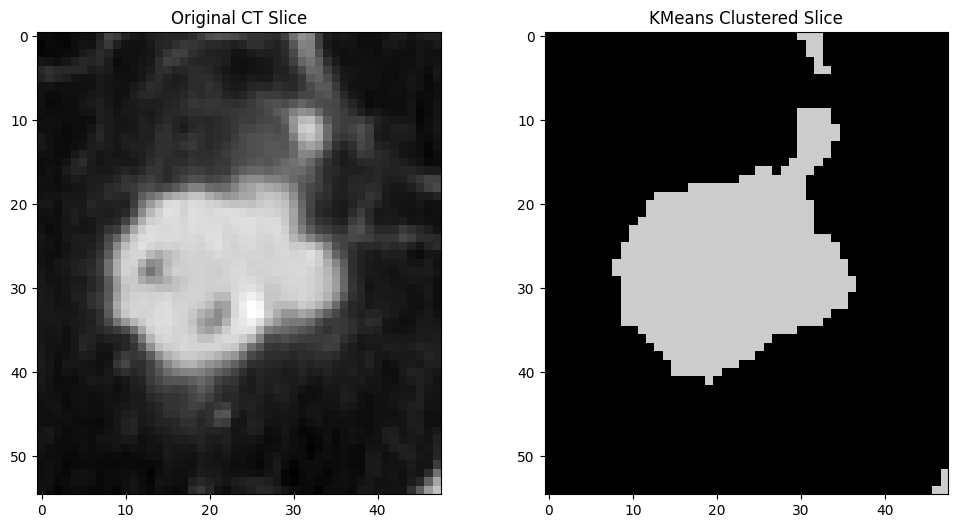

Completed segmentation for LIDC-IDRI-0003_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0137_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0137_R_2.nii.gz


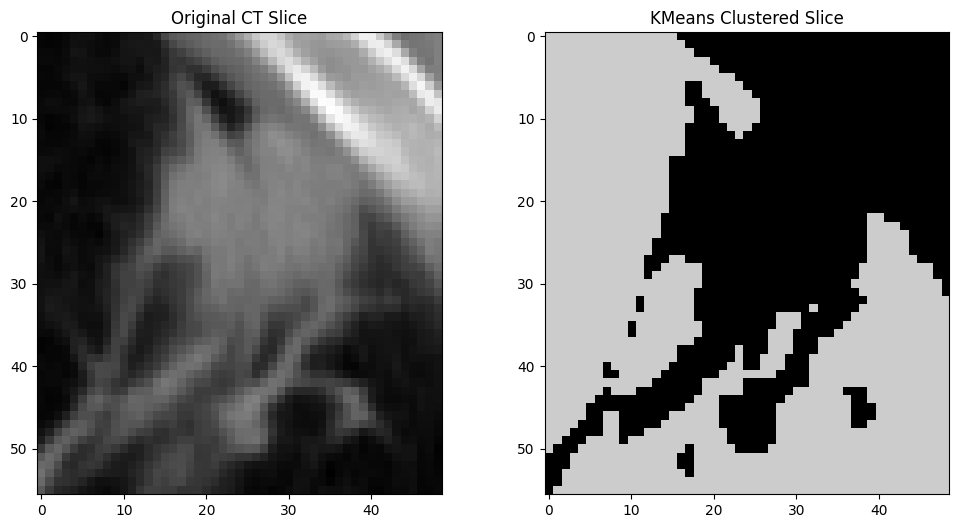

Completed segmentation for LIDC-IDRI-0137_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0072_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0072_R_1.nii.gz


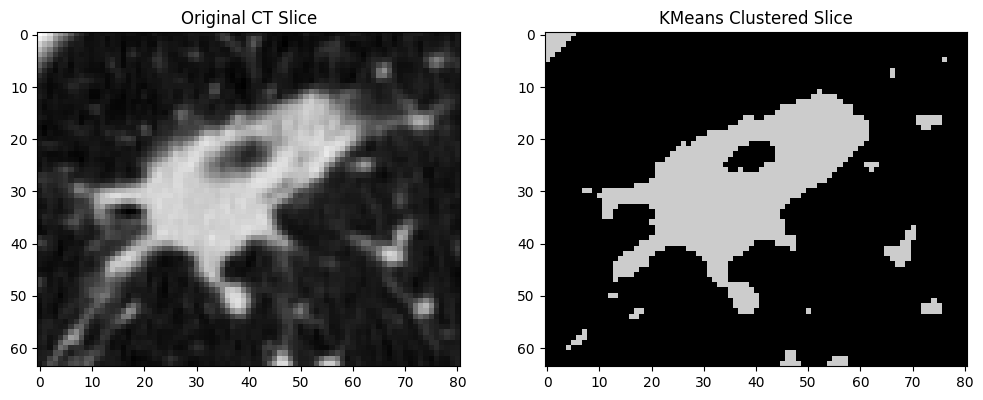

Completed segmentation for LIDC-IDRI-0072_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0144_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0144_R_2.nii.gz


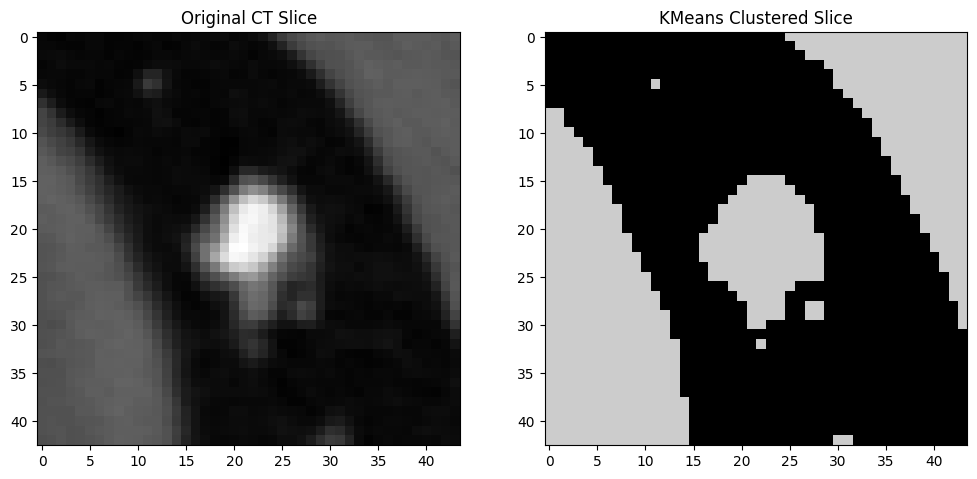

Completed segmentation for LIDC-IDRI-0144_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0046_R_7.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0046_R_7.nii.gz


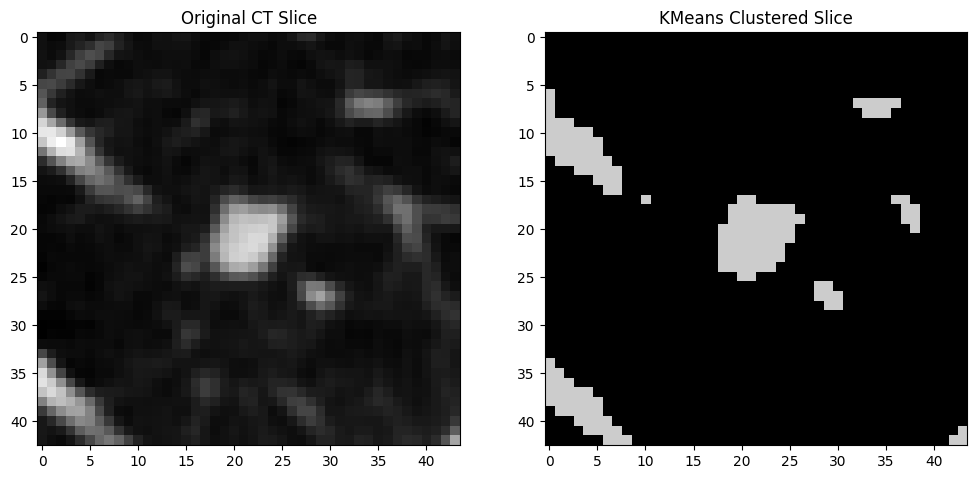

Completed segmentation for LIDC-IDRI-0046_R_7.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0018_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0018_R_2.nii.gz


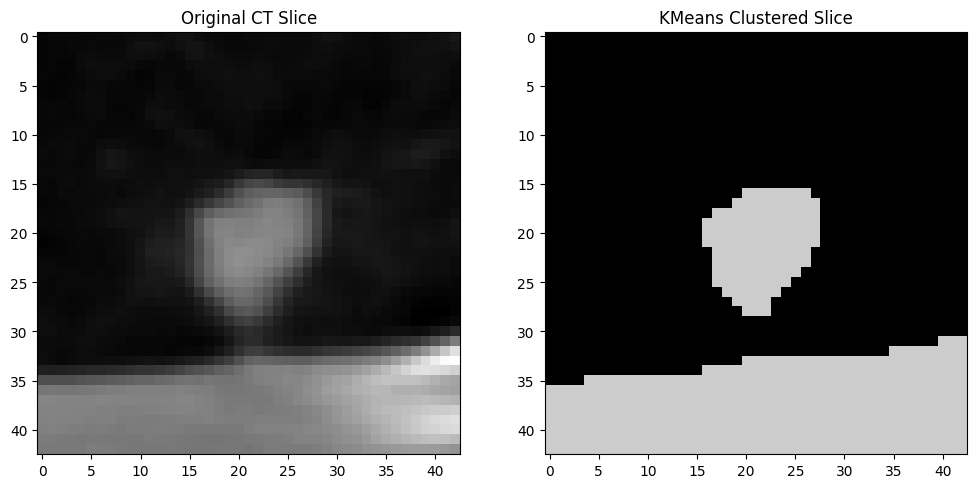

Completed segmentation for LIDC-IDRI-0018_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0067_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0067_R_3.nii.gz


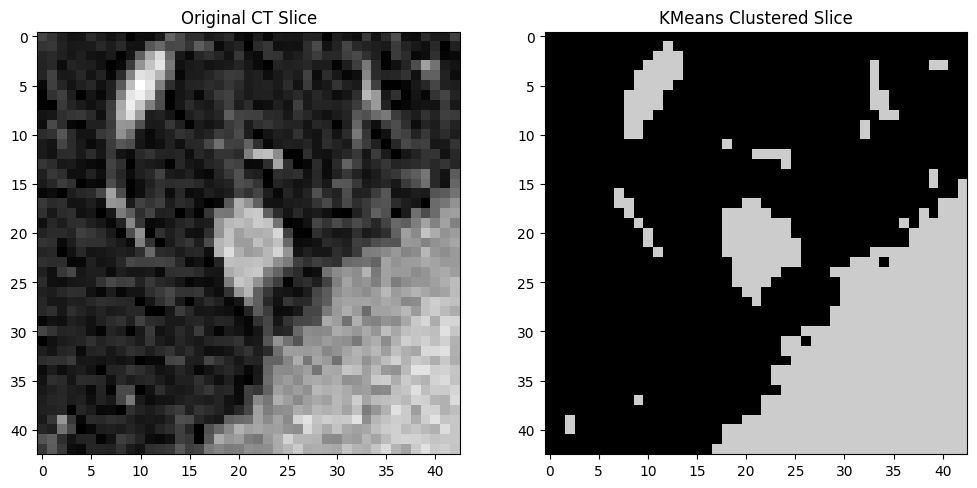

Completed segmentation for LIDC-IDRI-0067_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0051_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0051_R_2.nii.gz


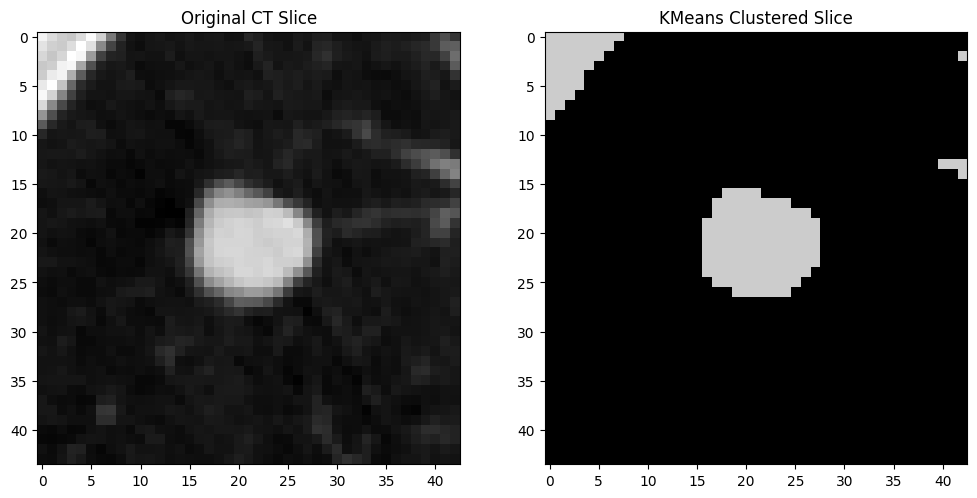

Completed segmentation for LIDC-IDRI-0051_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0135_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0135_R_1.nii.gz


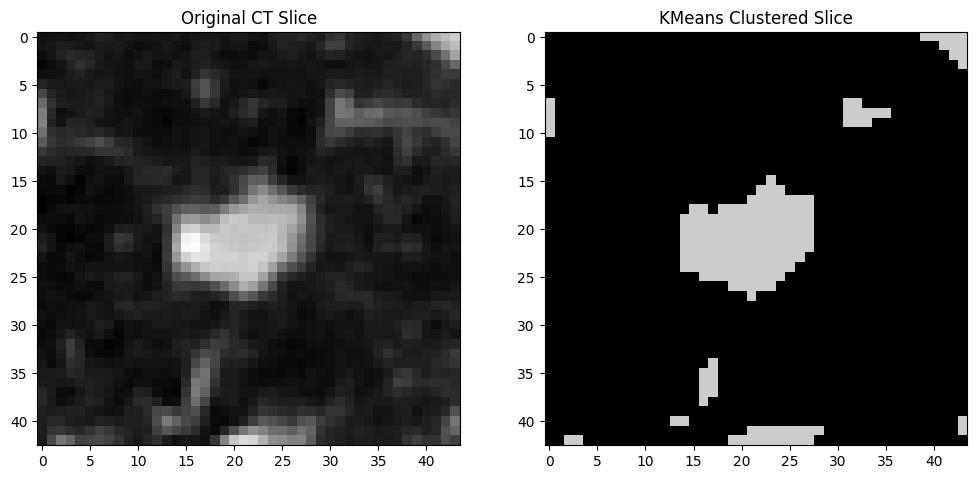

Completed segmentation for LIDC-IDRI-0135_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0087_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0087_R_1.nii.gz


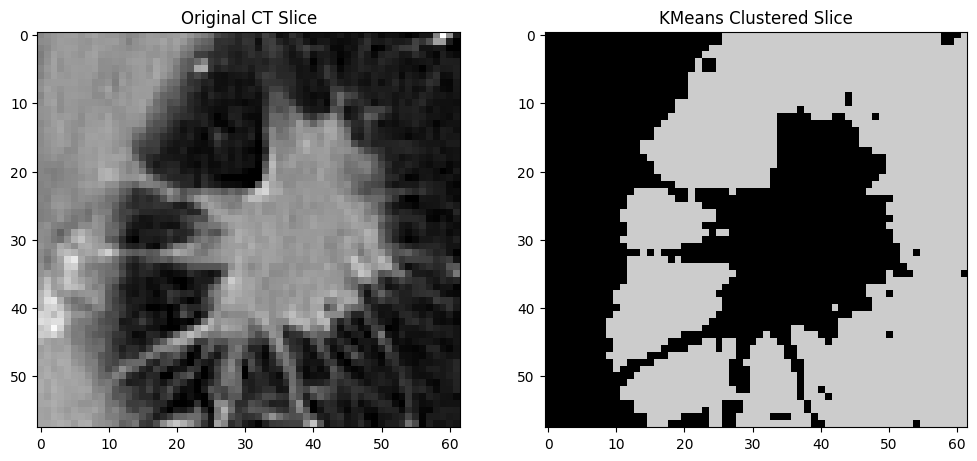

Completed segmentation for LIDC-IDRI-0087_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0017_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0017_R_1.nii.gz


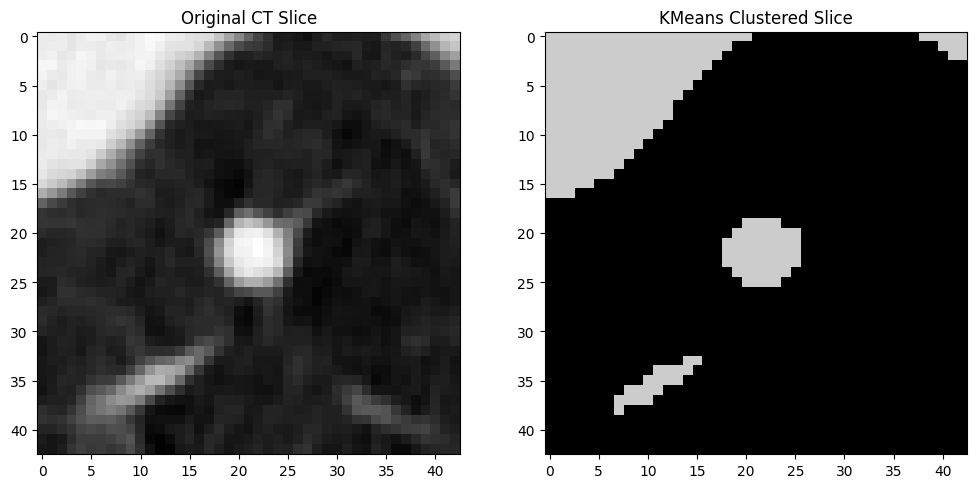

Completed segmentation for LIDC-IDRI-0017_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0011_R_10.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0011_R_10.nii.gz


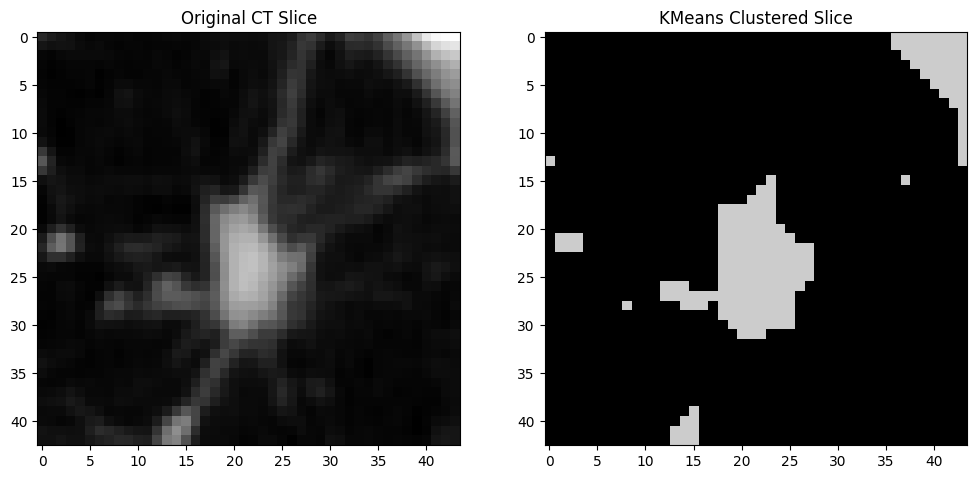

Completed segmentation for LIDC-IDRI-0011_R_10.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0018_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0018_R_4.nii.gz


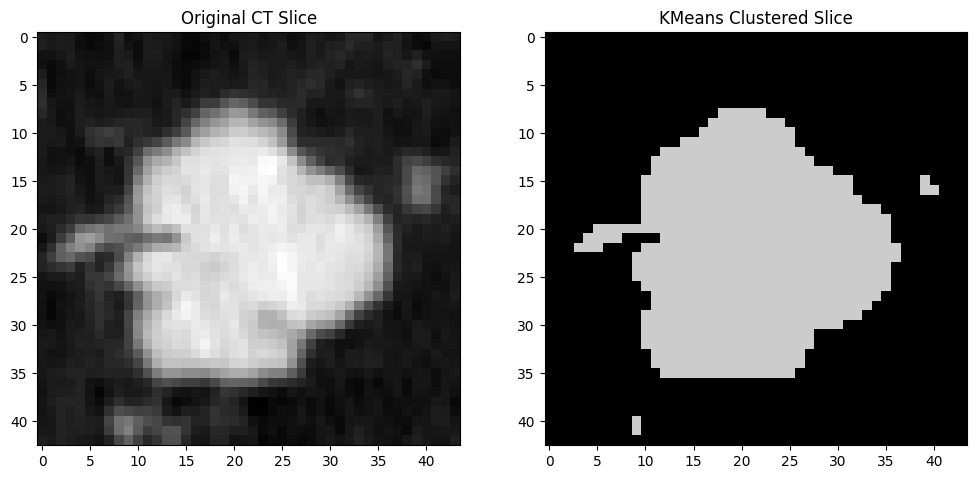

Completed segmentation for LIDC-IDRI-0018_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0046_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0046_R_3.nii.gz


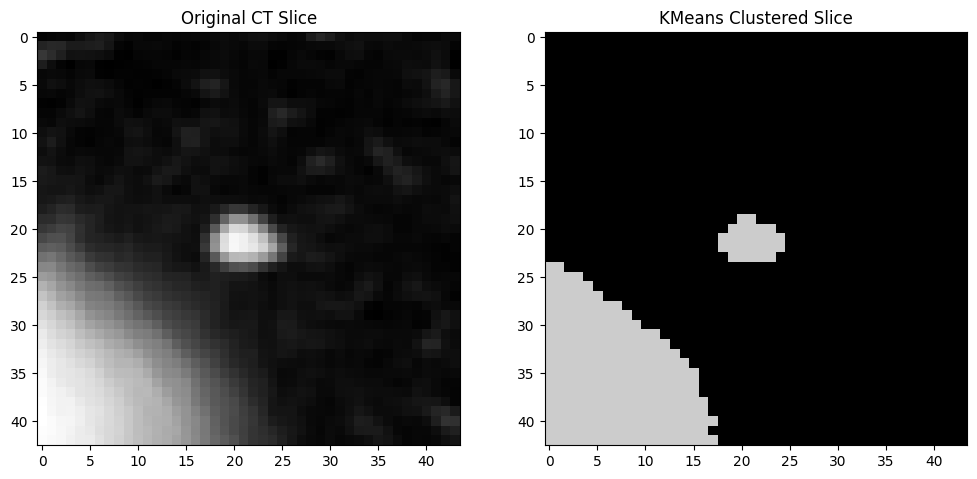

Completed segmentation for LIDC-IDRI-0046_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0045_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0045_R_6.nii.gz


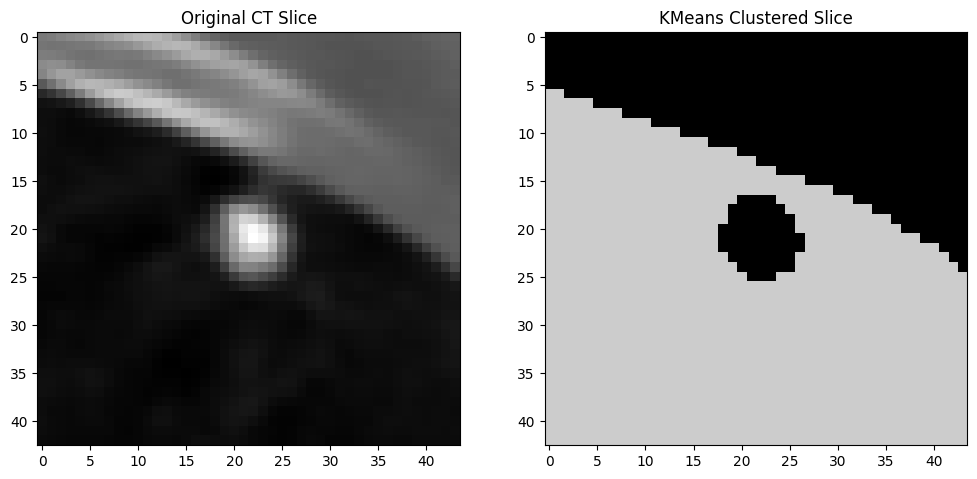

Completed segmentation for LIDC-IDRI-0045_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0111_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0111_R_4.nii.gz


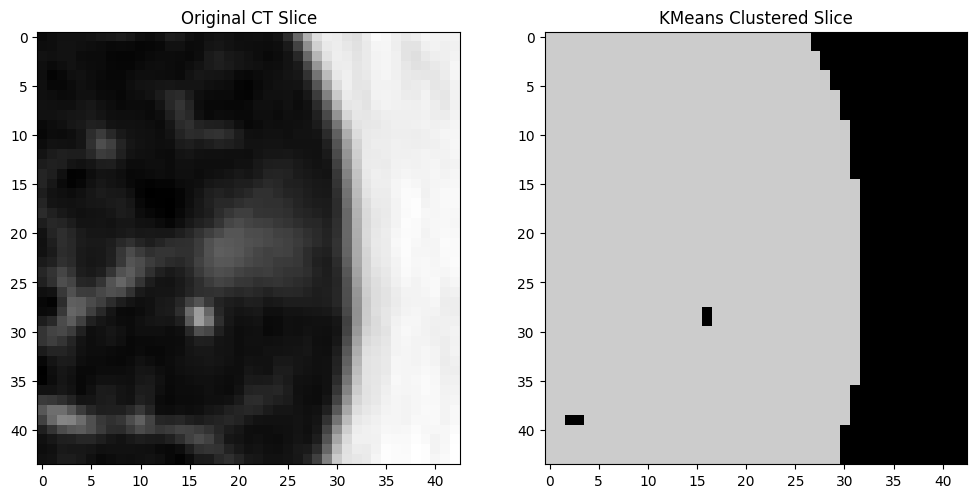

Completed segmentation for LIDC-IDRI-0111_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0067_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0067_R_2.nii.gz


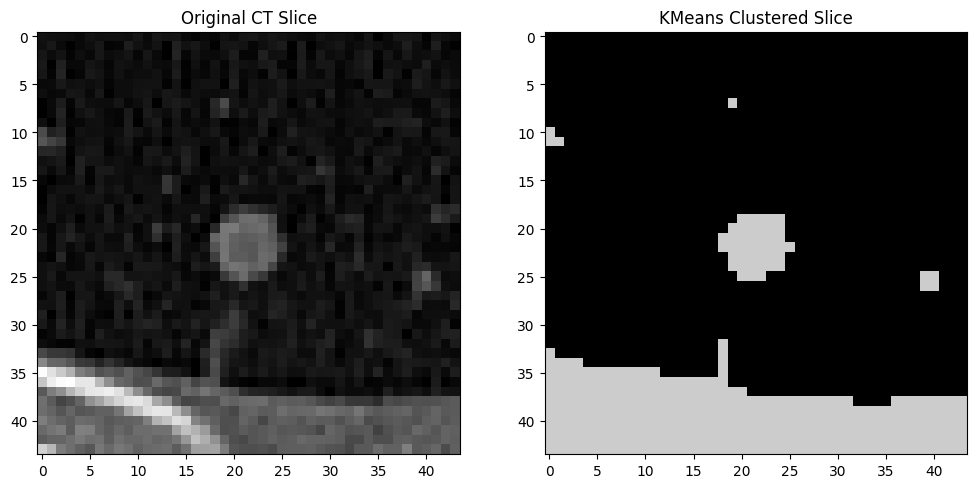

Completed segmentation for LIDC-IDRI-0067_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0045_R_12.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0045_R_12.nii.gz


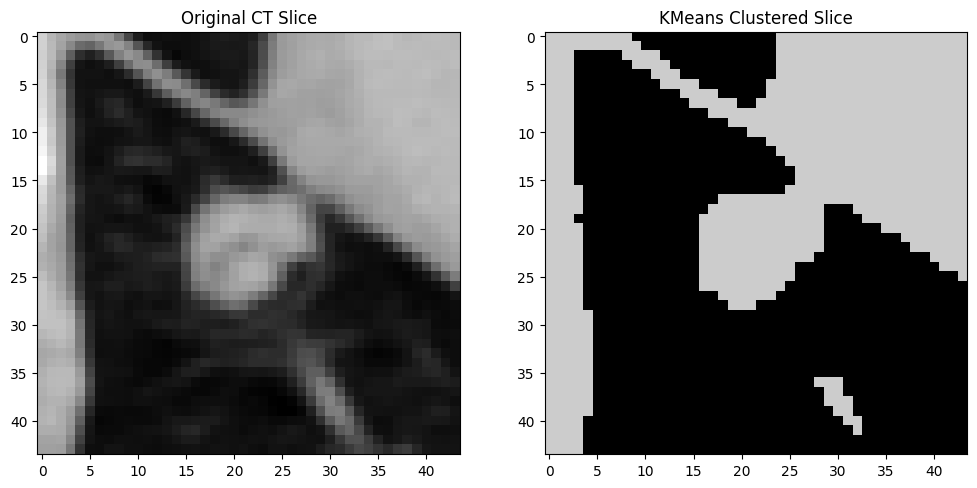

Completed segmentation for LIDC-IDRI-0045_R_12.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0130_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0130_R_2.nii.gz


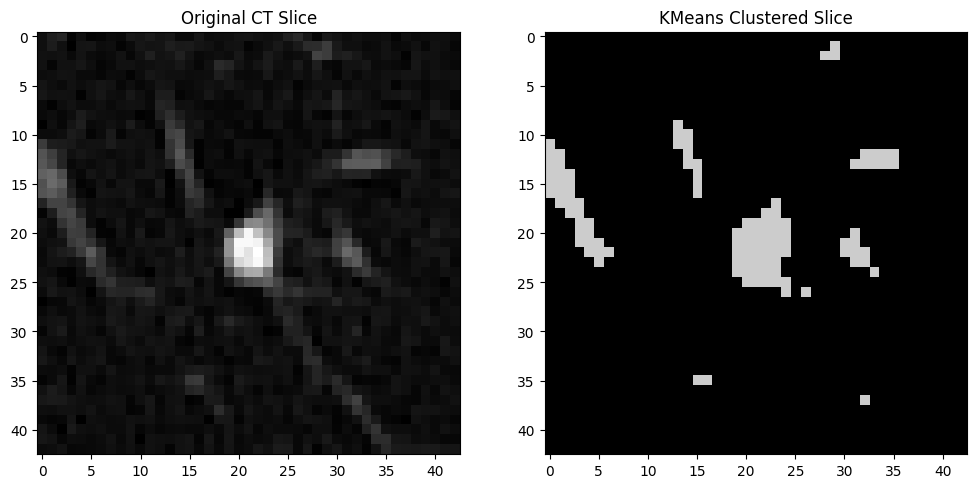

Completed segmentation for LIDC-IDRI-0130_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0111_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0111_R_1.nii.gz


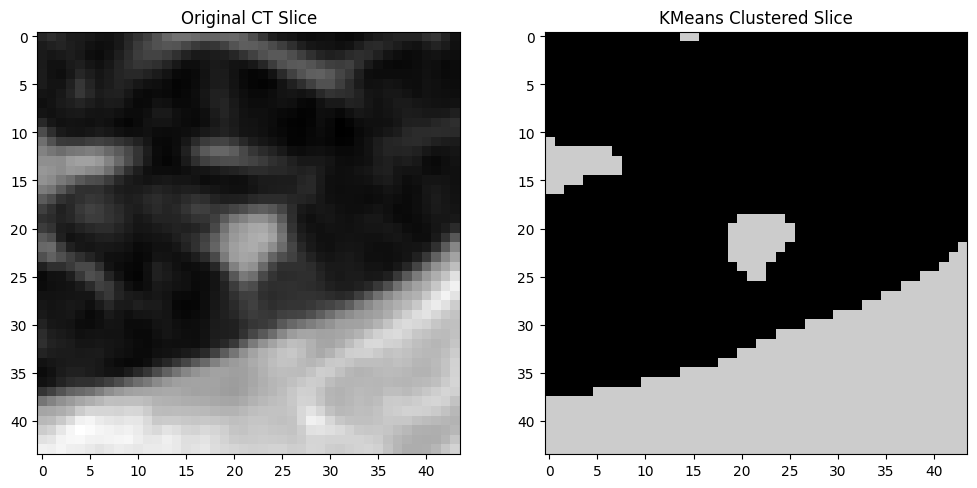

Completed segmentation for LIDC-IDRI-0111_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0068_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0068_R_3.nii.gz


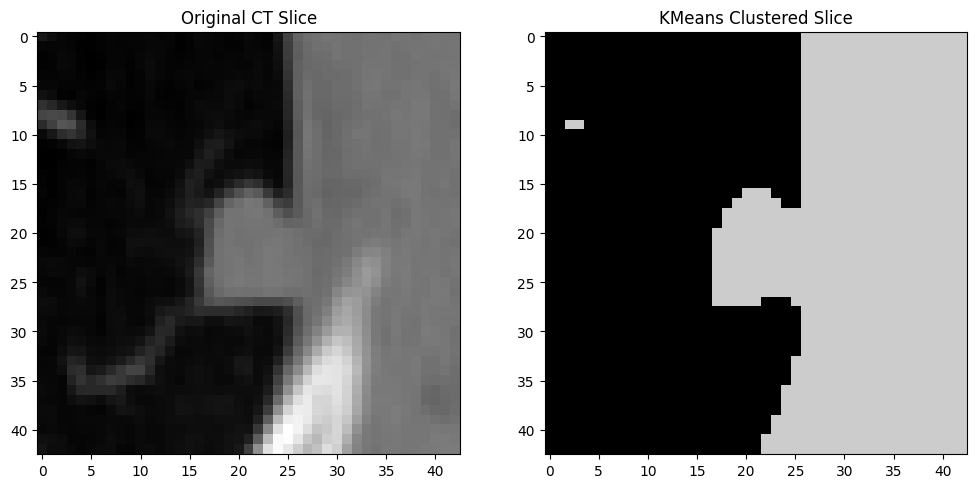

Completed segmentation for LIDC-IDRI-0068_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0034_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0034_R_1.nii.gz


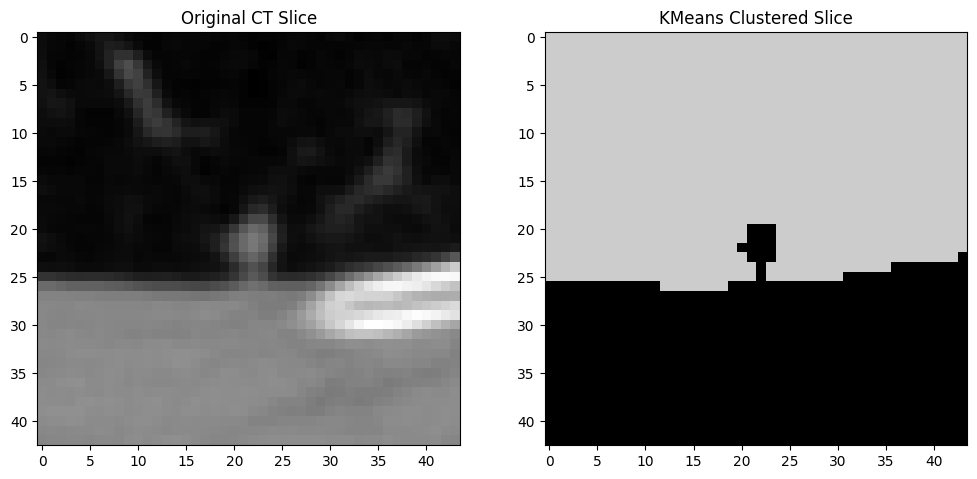

Completed segmentation for LIDC-IDRI-0034_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0050_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0050_R_1.nii.gz


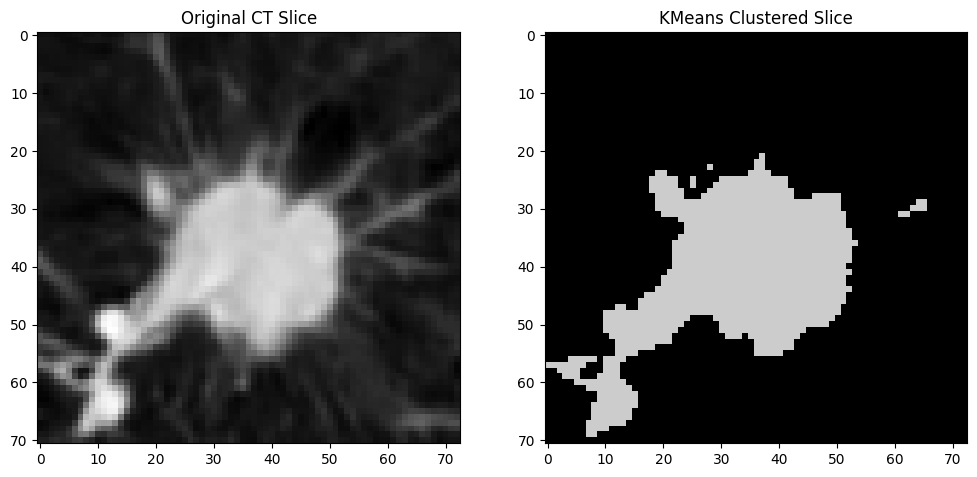

Completed segmentation for LIDC-IDRI-0050_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0041_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0041_R_1.nii.gz


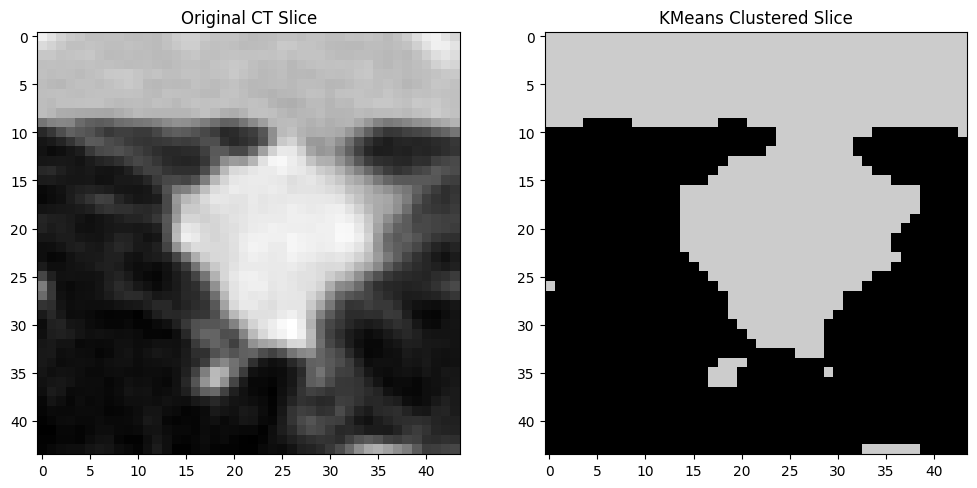

Completed segmentation for LIDC-IDRI-0041_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0042_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0042_R_4.nii.gz


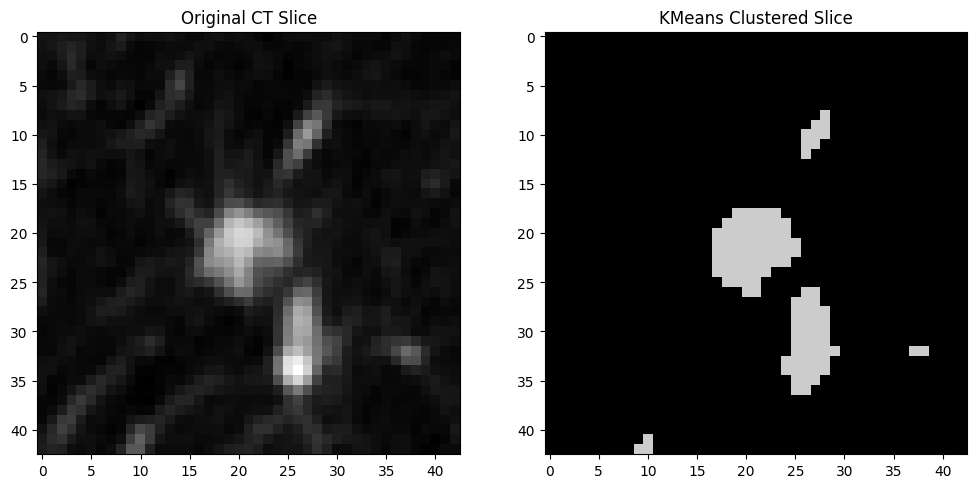

Completed segmentation for LIDC-IDRI-0042_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0111_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0111_R_2.nii.gz


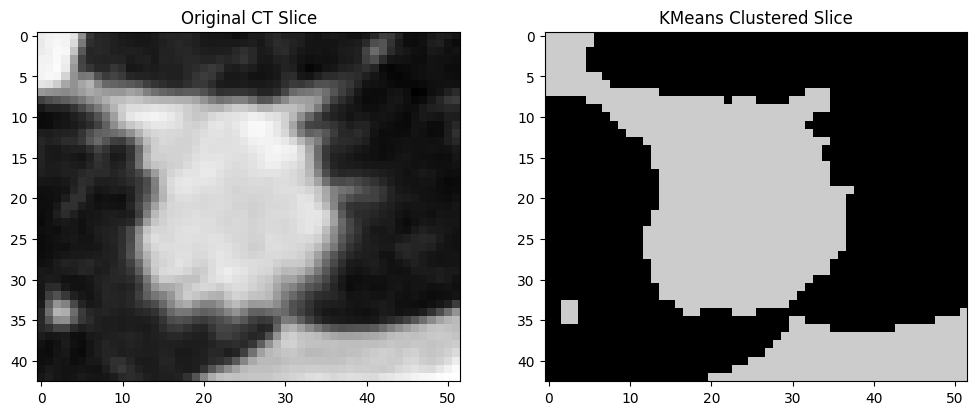

Completed segmentation for LIDC-IDRI-0111_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0044_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0044_R_3.nii.gz


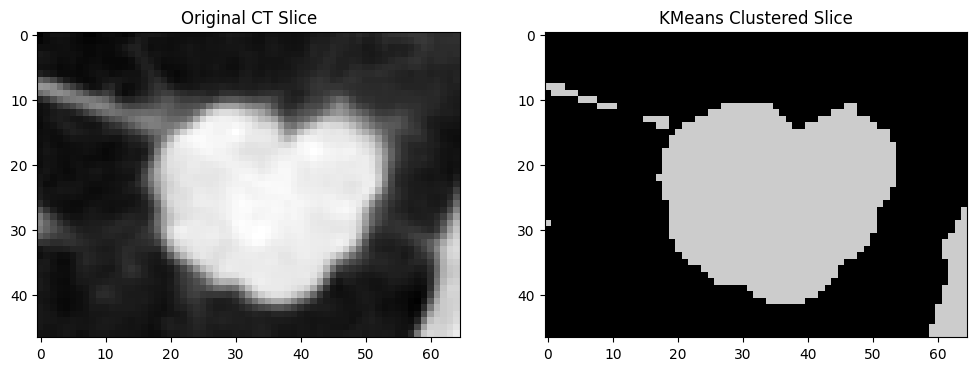

Completed segmentation for LIDC-IDRI-0044_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0088_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0088_R_3.nii.gz


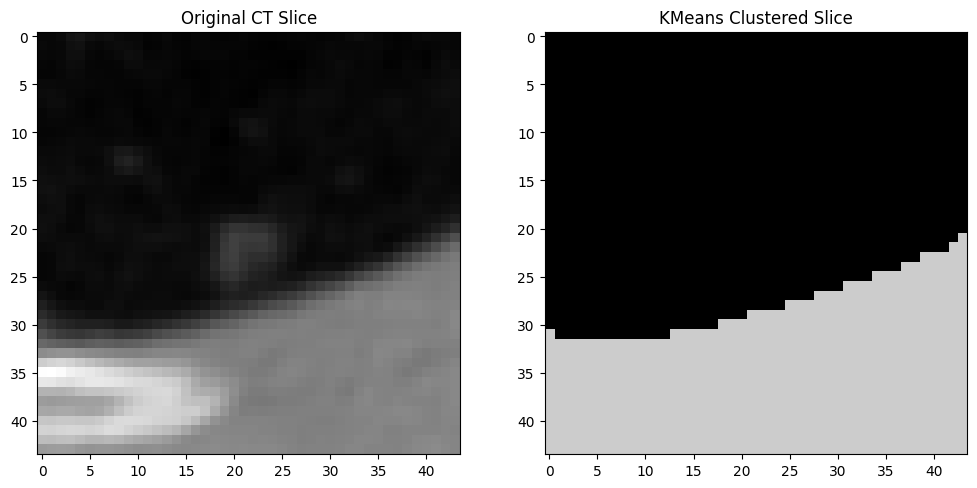

Completed segmentation for LIDC-IDRI-0088_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0091_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0091_R_4.nii.gz


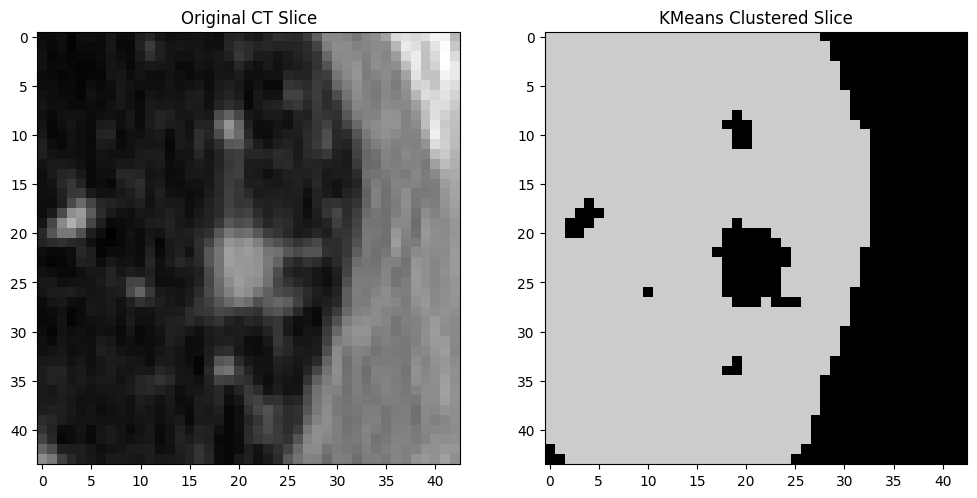

Completed segmentation for LIDC-IDRI-0091_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0126_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0126_R_1.nii.gz


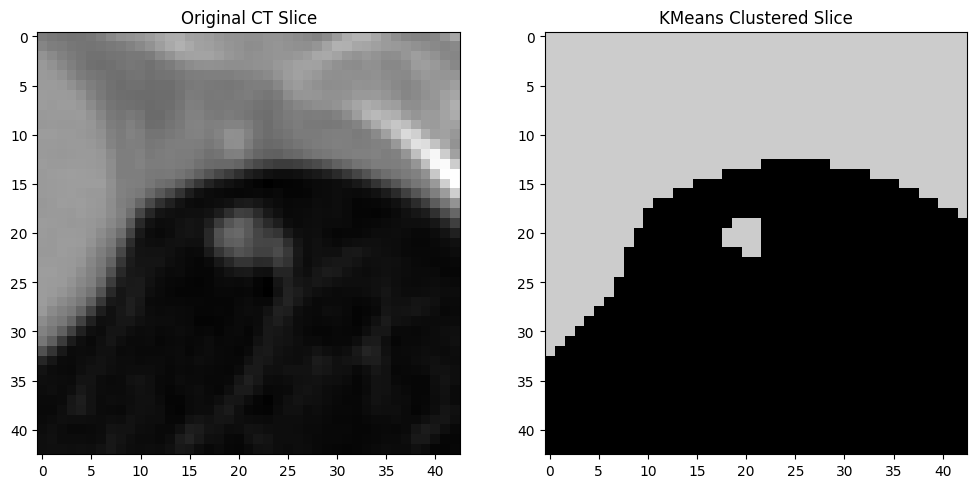

Completed segmentation for LIDC-IDRI-0126_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0036_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0036_R_2.nii.gz


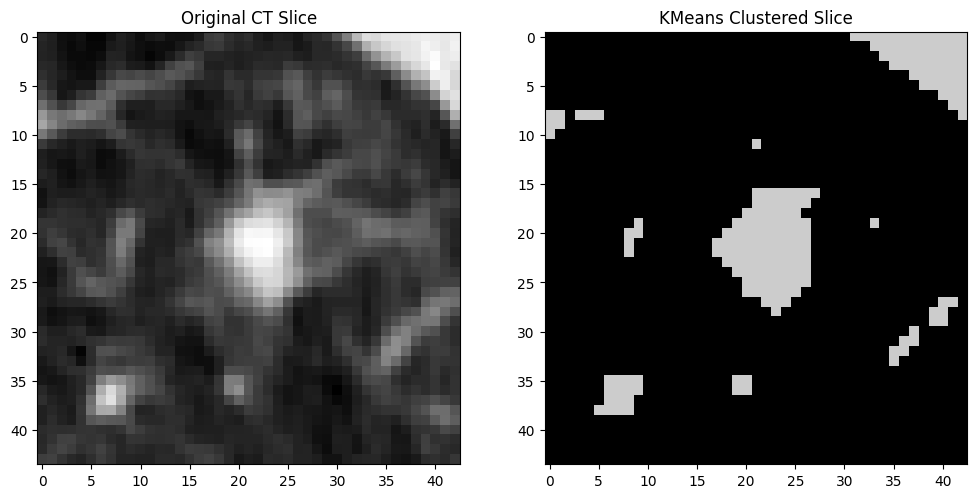

Completed segmentation for LIDC-IDRI-0036_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0027_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0027_R_2.nii.gz


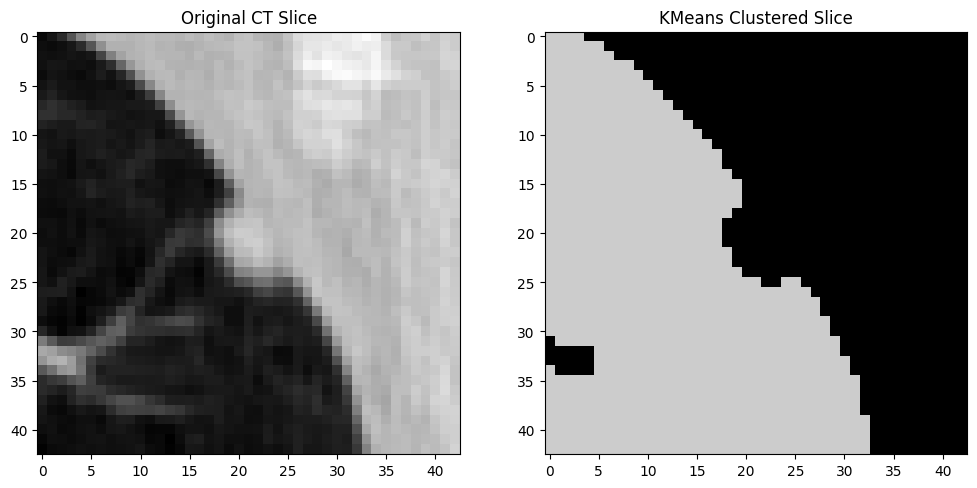

Completed segmentation for LIDC-IDRI-0027_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0001_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0001_R_1.nii.gz


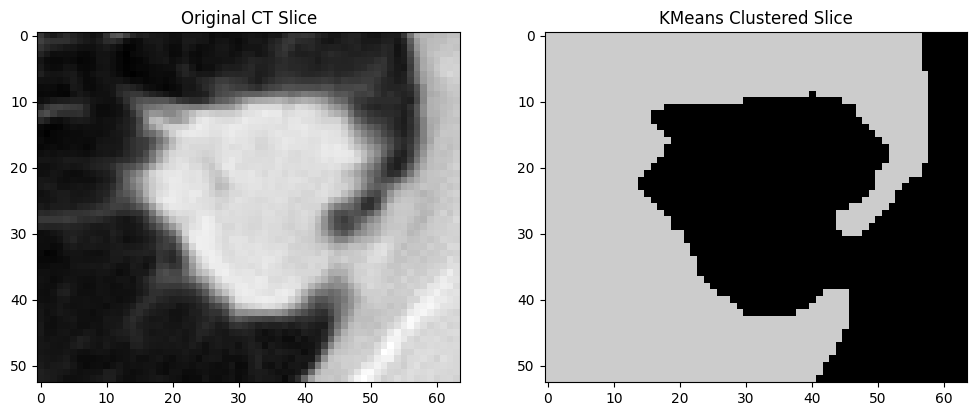

Completed segmentation for LIDC-IDRI-0001_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0083_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0083_R_1.nii.gz


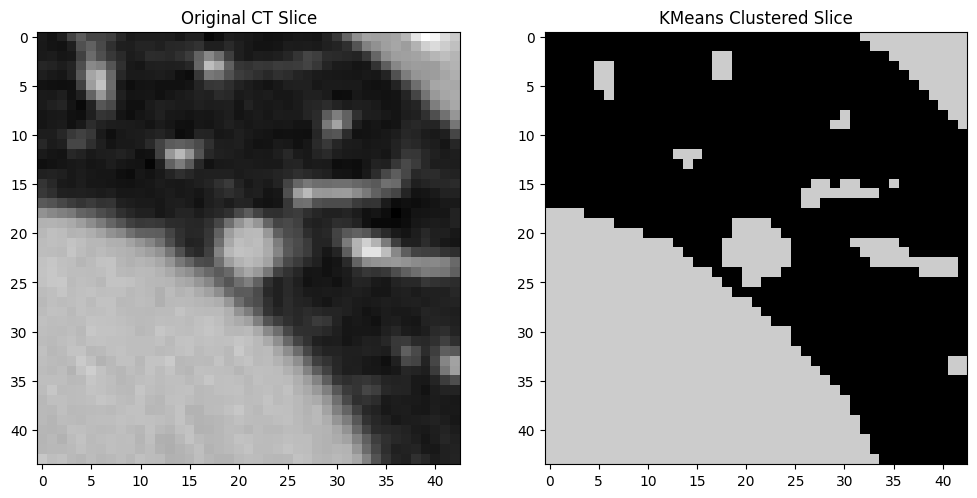

Completed segmentation for LIDC-IDRI-0083_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0012_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0012_R_1.nii.gz


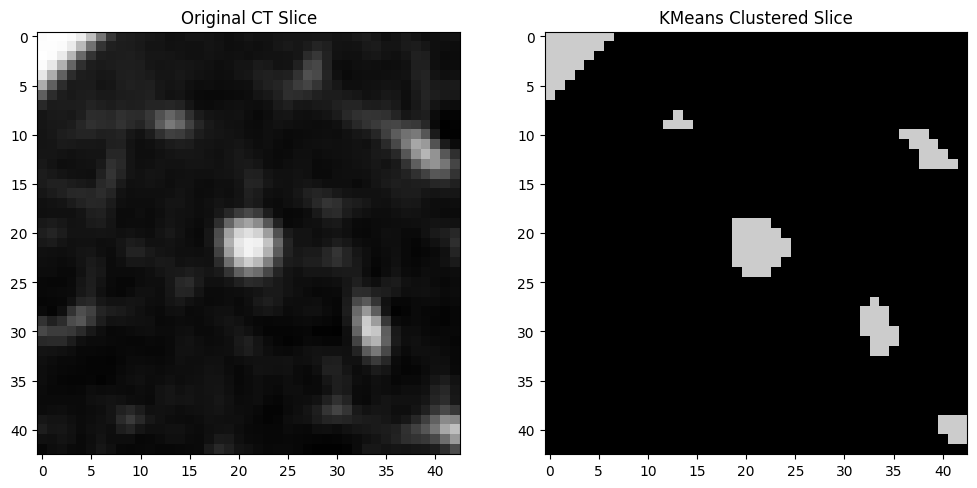

Completed segmentation for LIDC-IDRI-0012_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0060_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0060_R_1.nii.gz


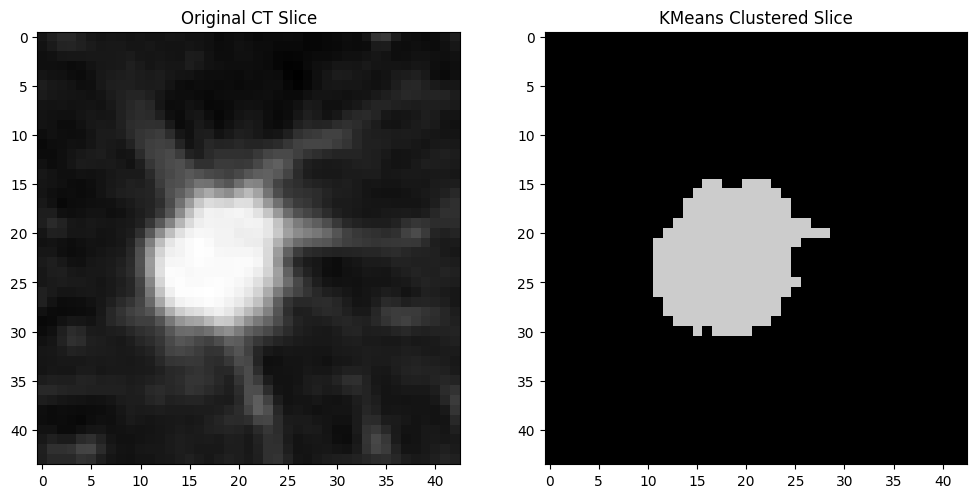

Completed segmentation for LIDC-IDRI-0060_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0010_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0010_R_3.nii.gz


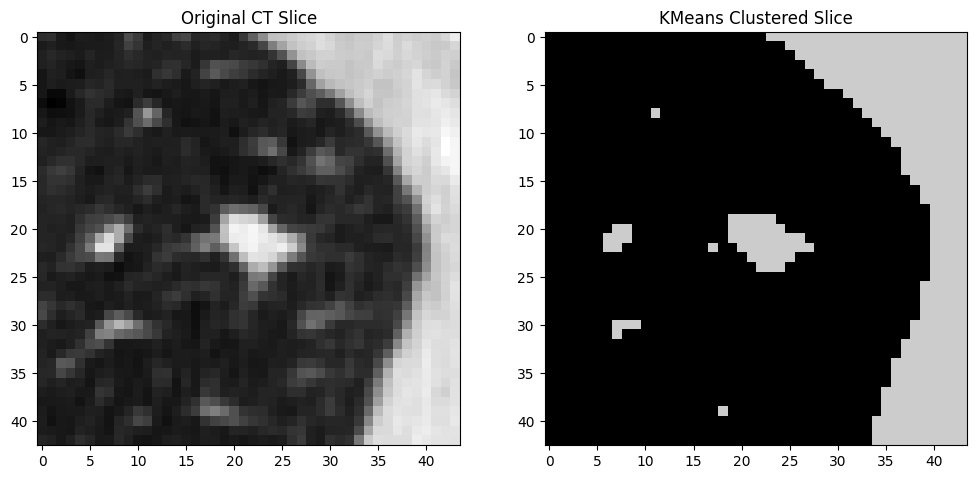

Completed segmentation for LIDC-IDRI-0010_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0111_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0111_R_3.nii.gz


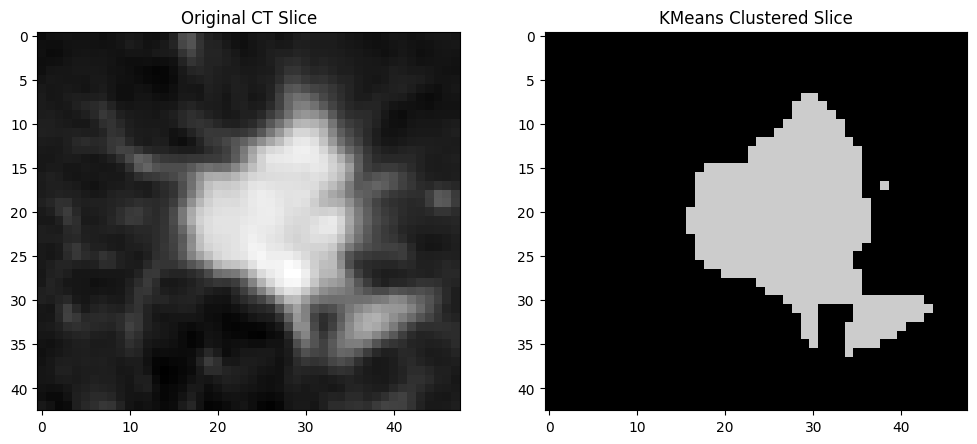

Completed segmentation for LIDC-IDRI-0111_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0031_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0031_R_3.nii.gz


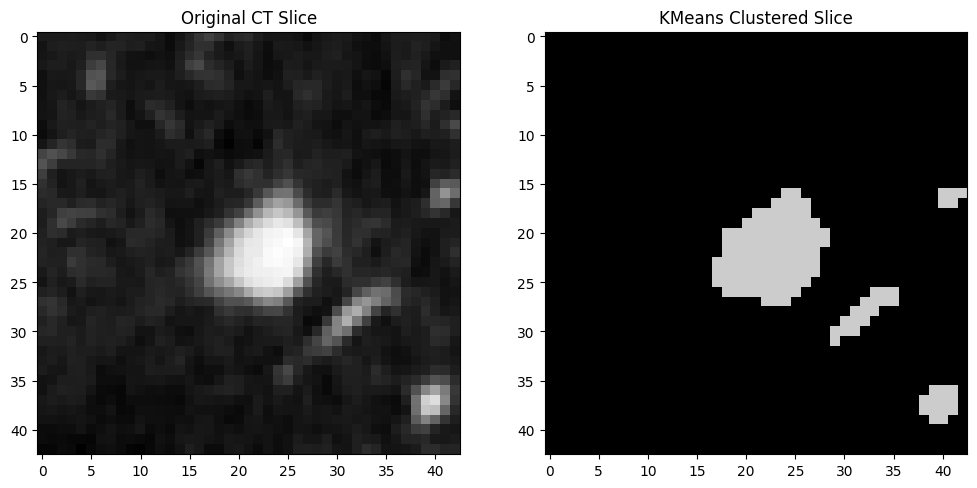

Completed segmentation for LIDC-IDRI-0031_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0061_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0061_R_5.nii.gz


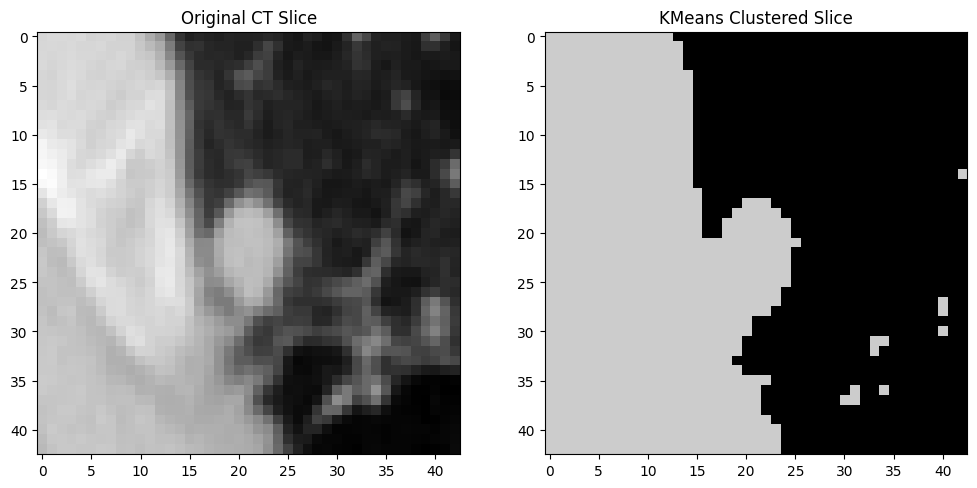

Completed segmentation for LIDC-IDRI-0061_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0069_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0069_R_3.nii.gz


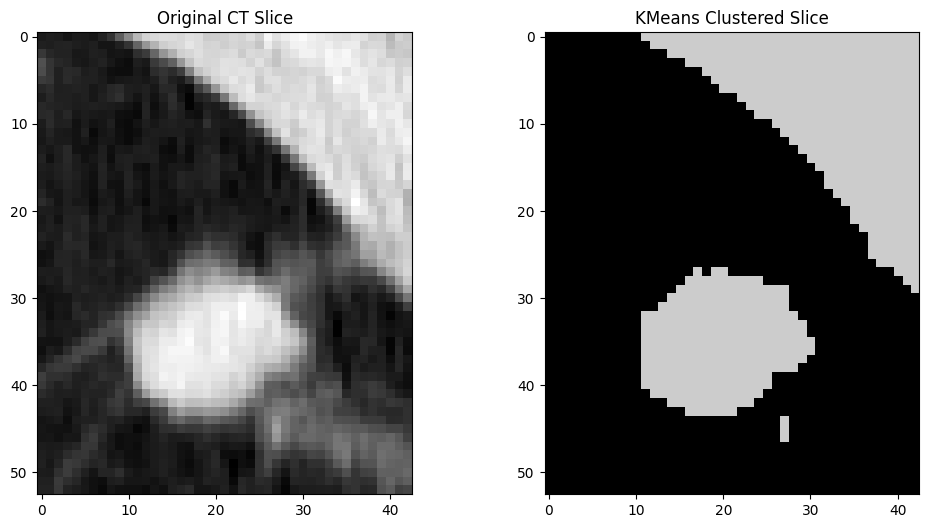

Completed segmentation for LIDC-IDRI-0069_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0091_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0091_R_3.nii.gz


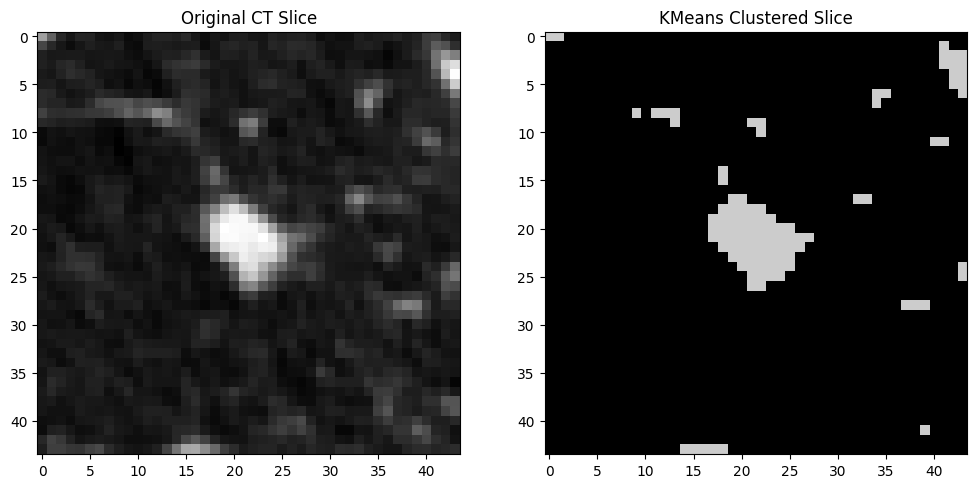

Completed segmentation for LIDC-IDRI-0091_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0004_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0004_R_1.nii.gz


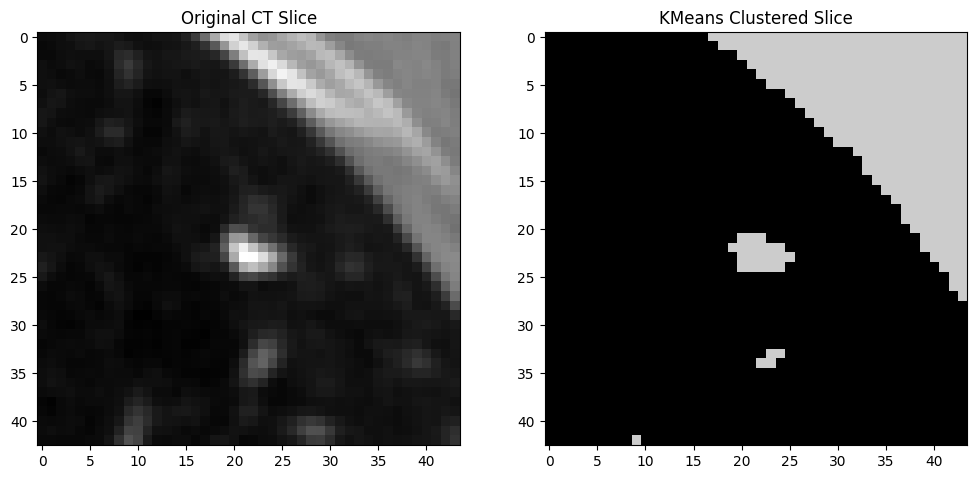

Completed segmentation for LIDC-IDRI-0004_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0005_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0005_R_2.nii.gz


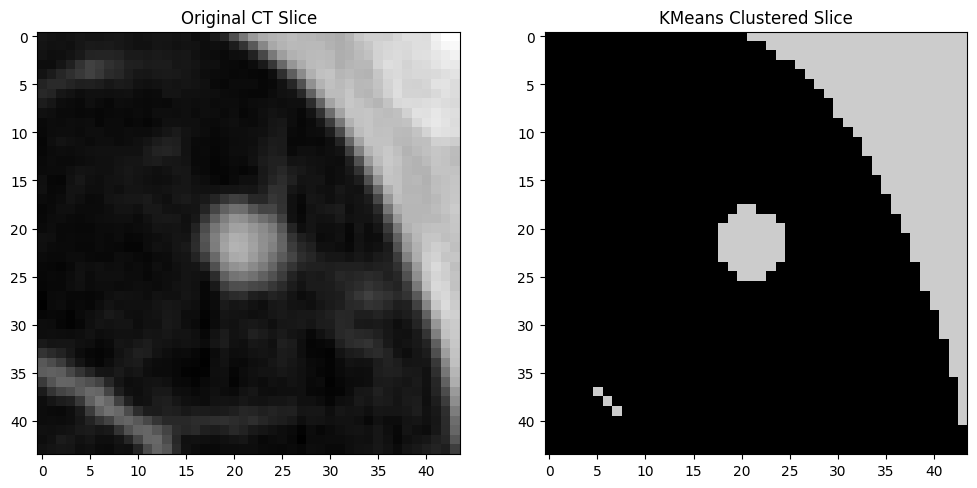

Completed segmentation for LIDC-IDRI-0005_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0043_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0043_R_3.nii.gz


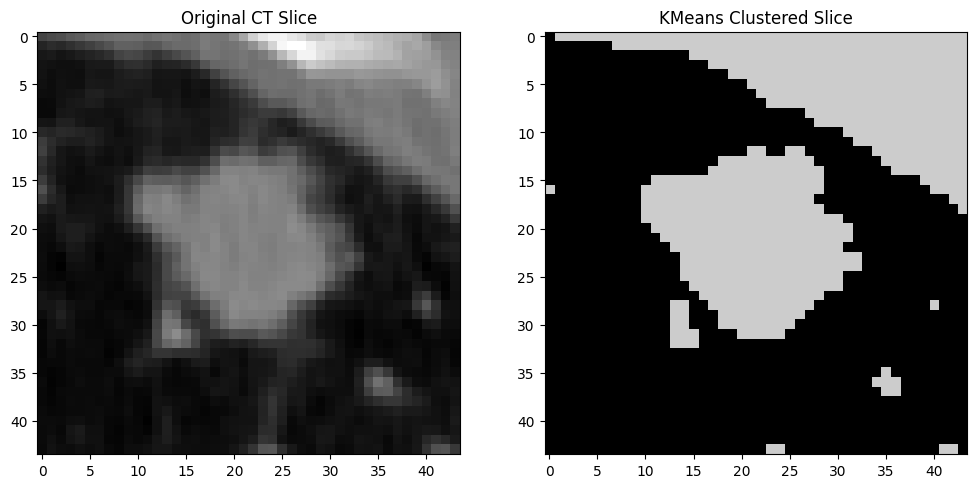

Completed segmentation for LIDC-IDRI-0043_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0091_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0091_R_2.nii.gz


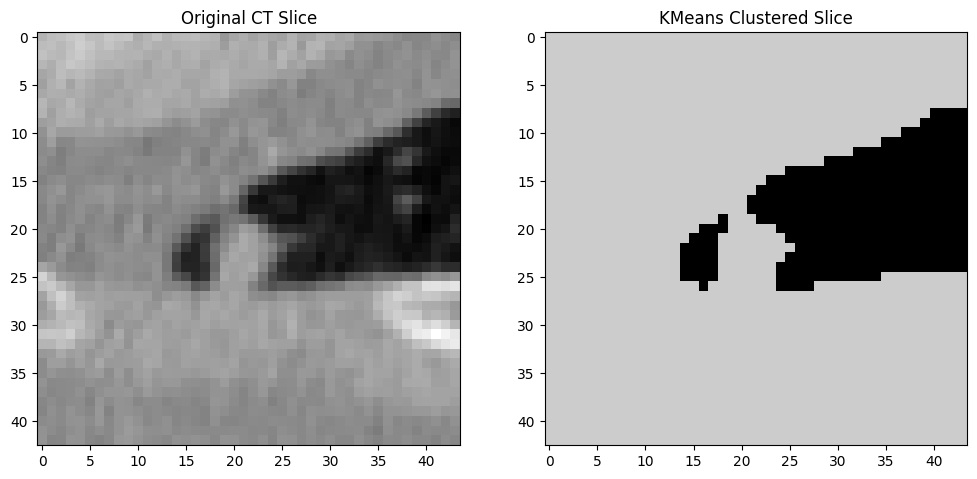

Completed segmentation for LIDC-IDRI-0091_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0144_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0144_R_5.nii.gz


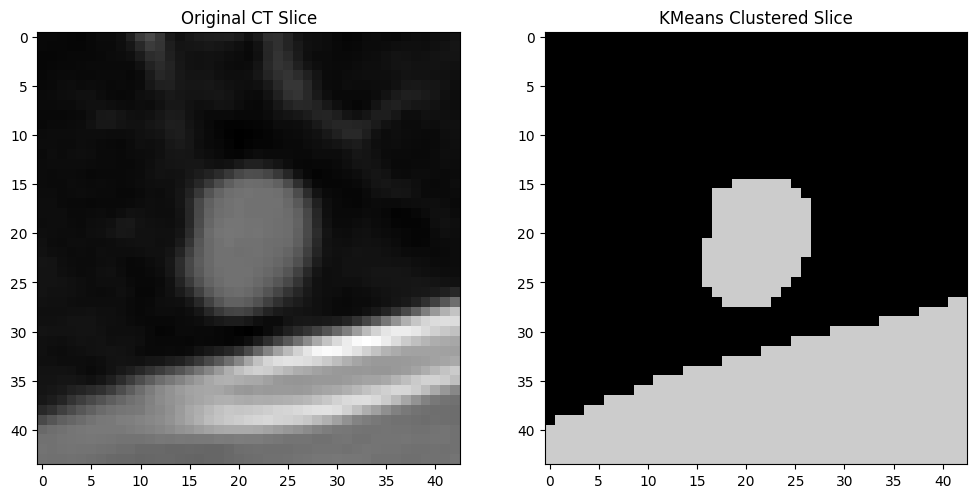

Completed segmentation for LIDC-IDRI-0144_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0048_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0048_R_3.nii.gz


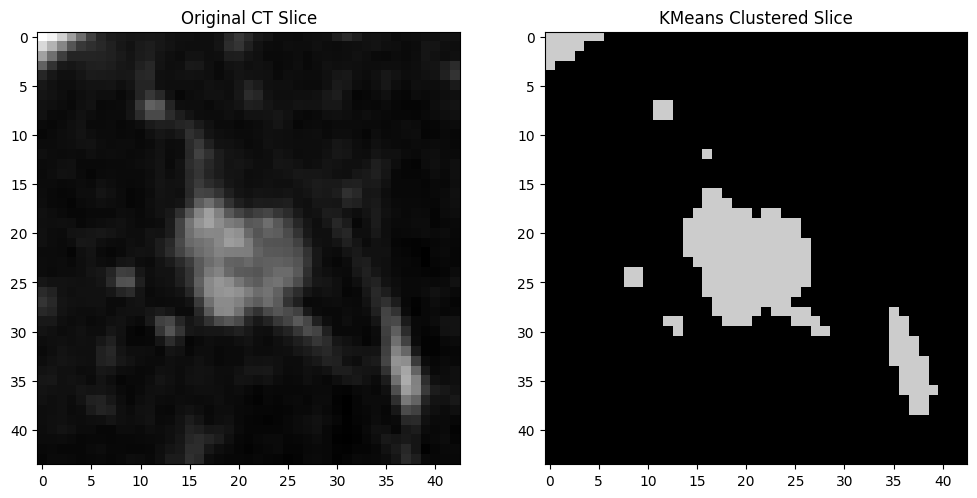

Completed segmentation for LIDC-IDRI-0048_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0046_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0046_R_6.nii.gz


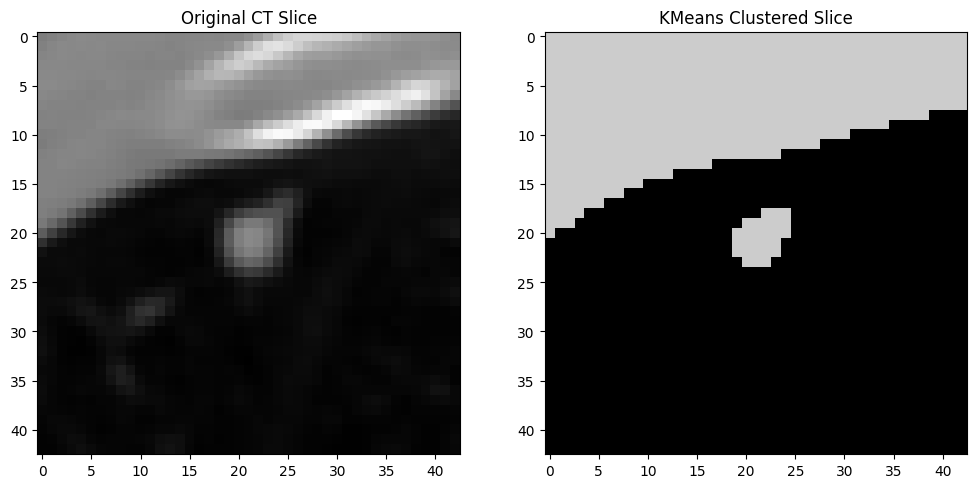

Completed segmentation for LIDC-IDRI-0046_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0113_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0113_R_1.nii.gz


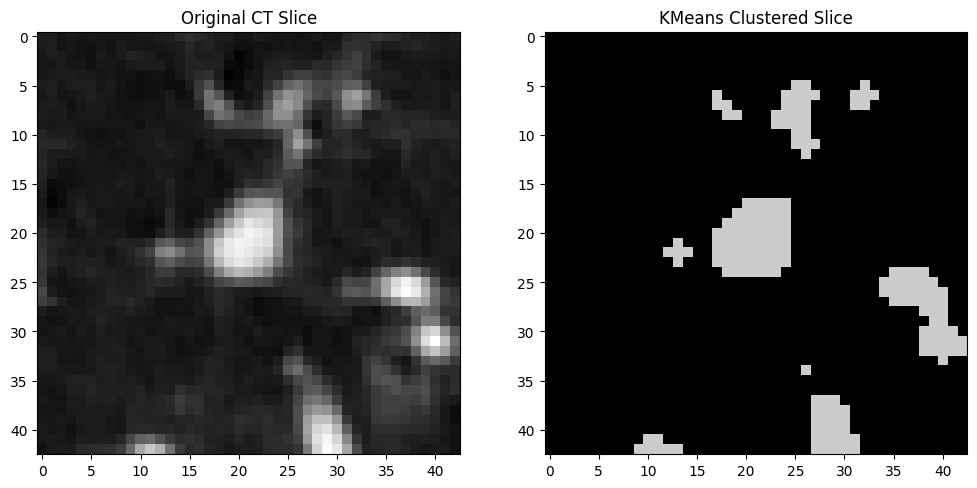

Completed segmentation for LIDC-IDRI-0113_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0081_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0081_R_2.nii.gz


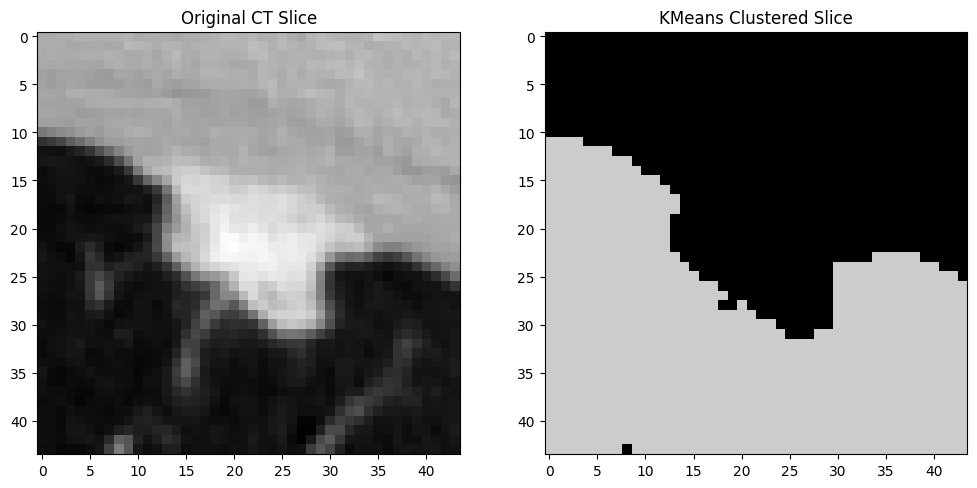

Completed segmentation for LIDC-IDRI-0081_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0039_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0039_R_2.nii.gz


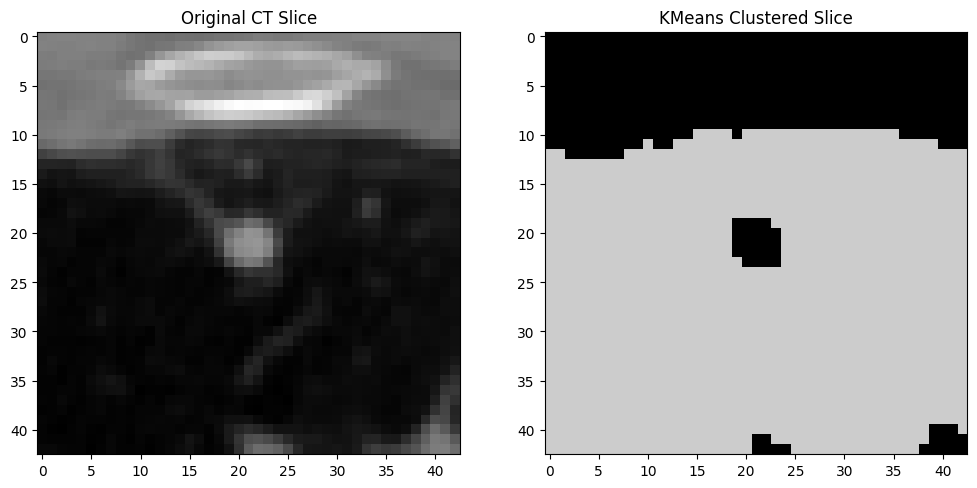

Completed segmentation for LIDC-IDRI-0039_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0095_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0095_R_3.nii.gz


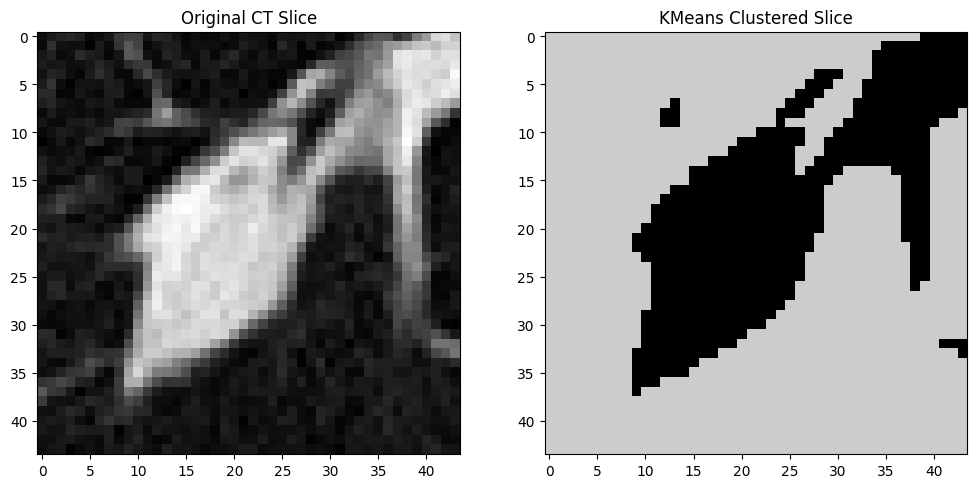

Completed segmentation for LIDC-IDRI-0095_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0066_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0066_R_1.nii.gz


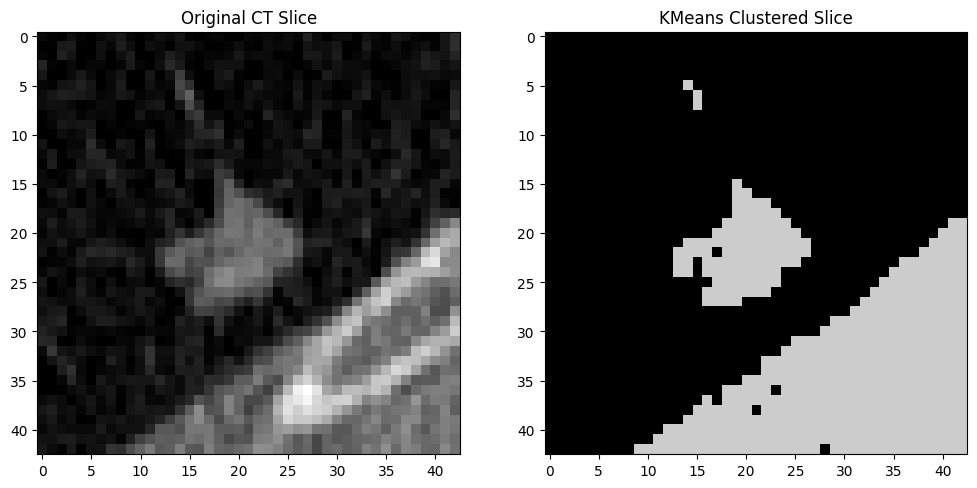

Completed segmentation for LIDC-IDRI-0066_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0141_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0141_R_5.nii.gz


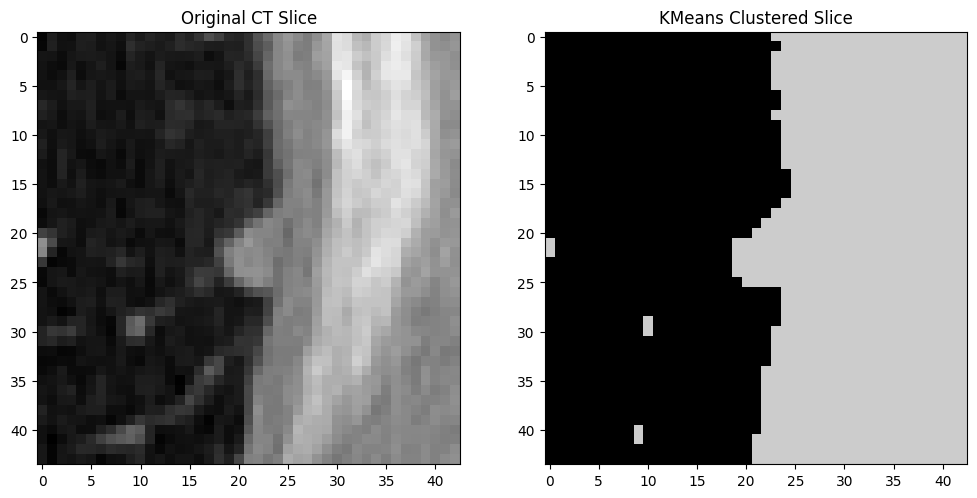

Completed segmentation for LIDC-IDRI-0141_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0027_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0027_R_1.nii.gz


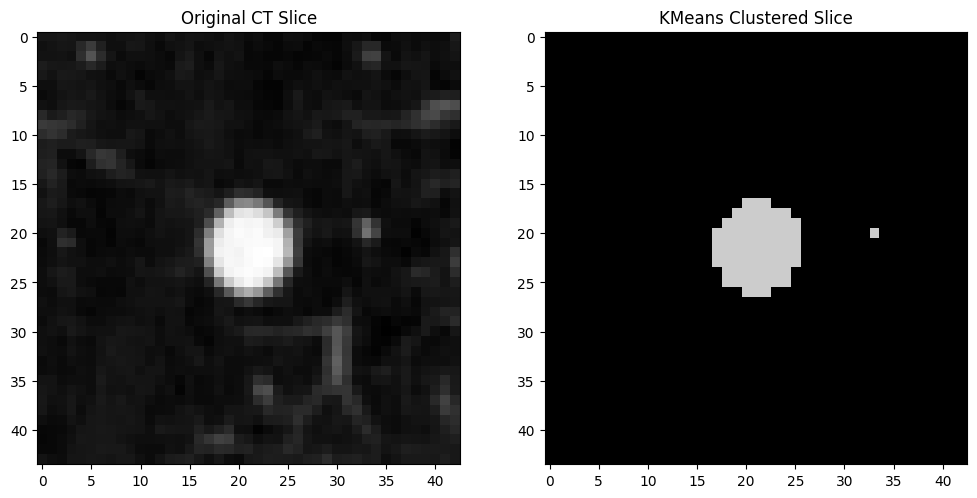

Completed segmentation for LIDC-IDRI-0027_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0012_R_7.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0012_R_7.nii.gz


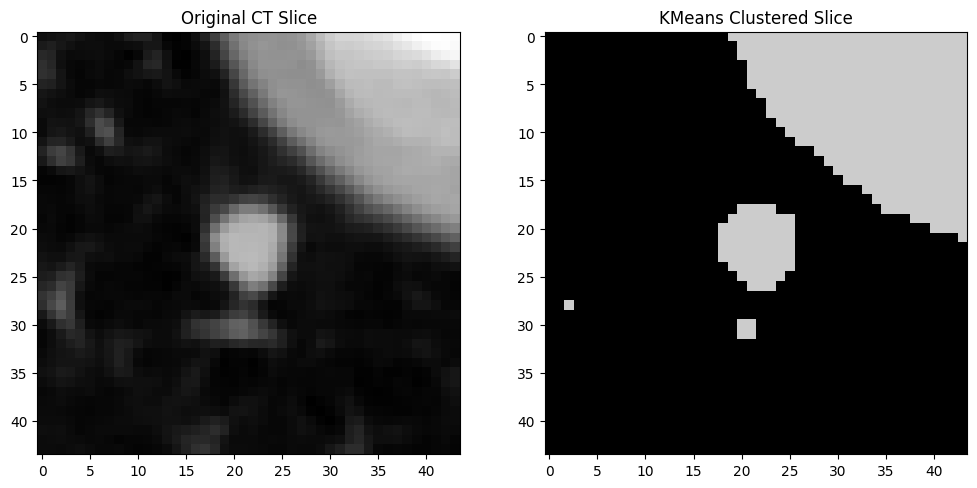

Completed segmentation for LIDC-IDRI-0012_R_7.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0058_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0058_R_3.nii.gz


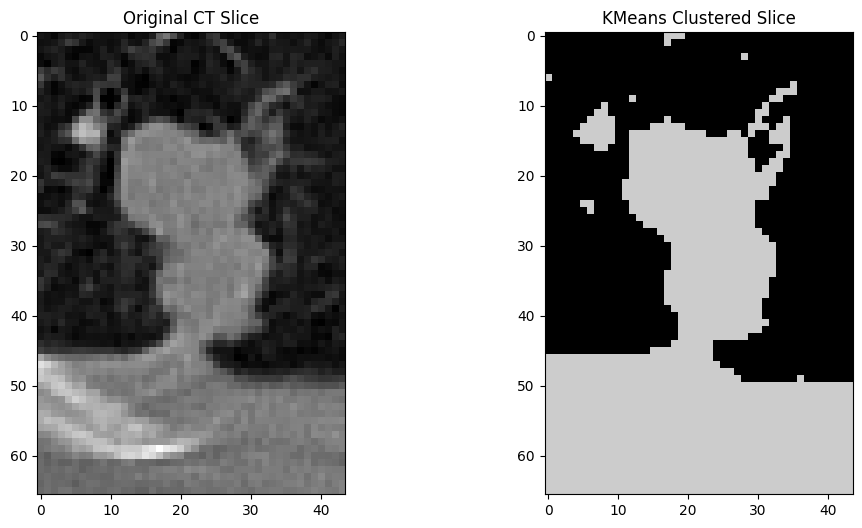

Completed segmentation for LIDC-IDRI-0058_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0135_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0135_R_4.nii.gz


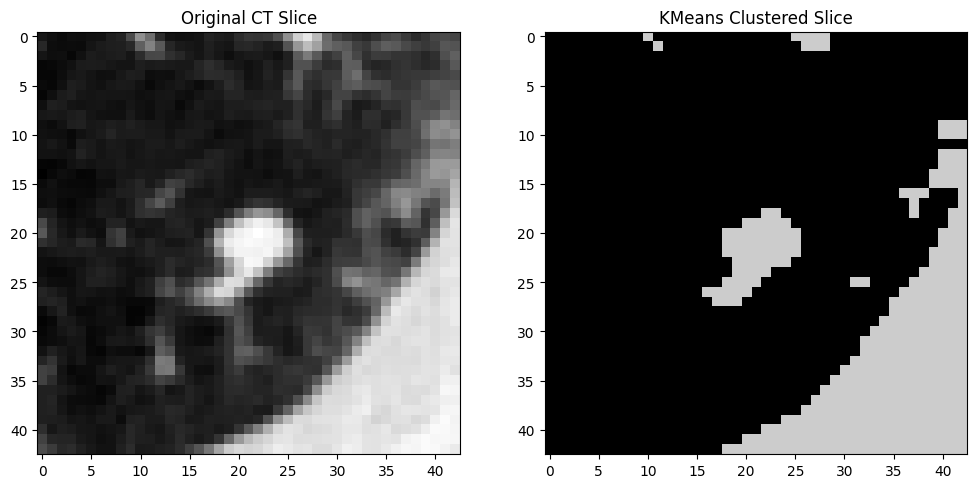

Completed segmentation for LIDC-IDRI-0135_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0122_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0122_R_1.nii.gz


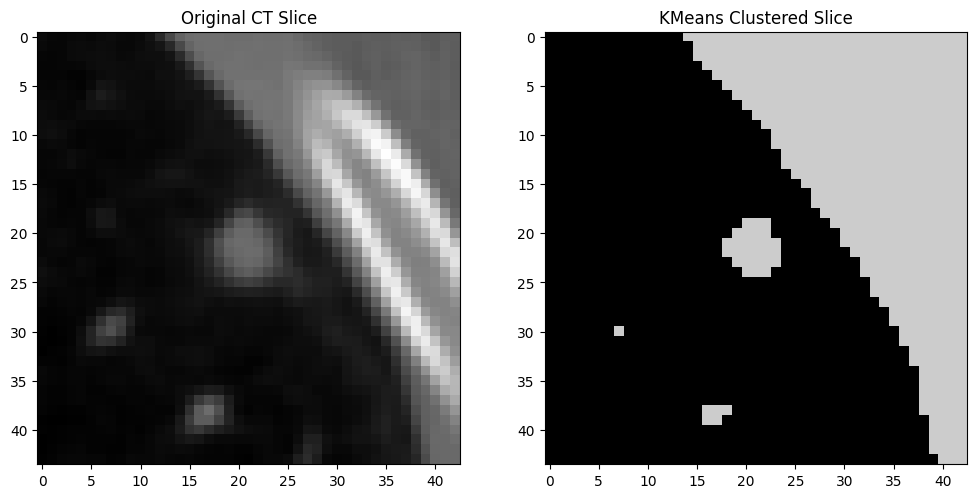

Completed segmentation for LIDC-IDRI-0122_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0005_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0005_R_1.nii.gz


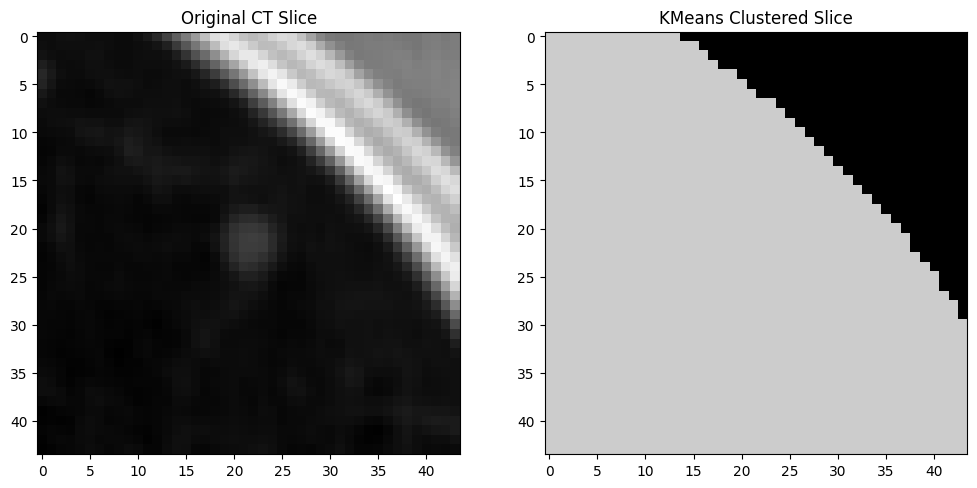

Completed segmentation for LIDC-IDRI-0005_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0039_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0039_R_5.nii.gz


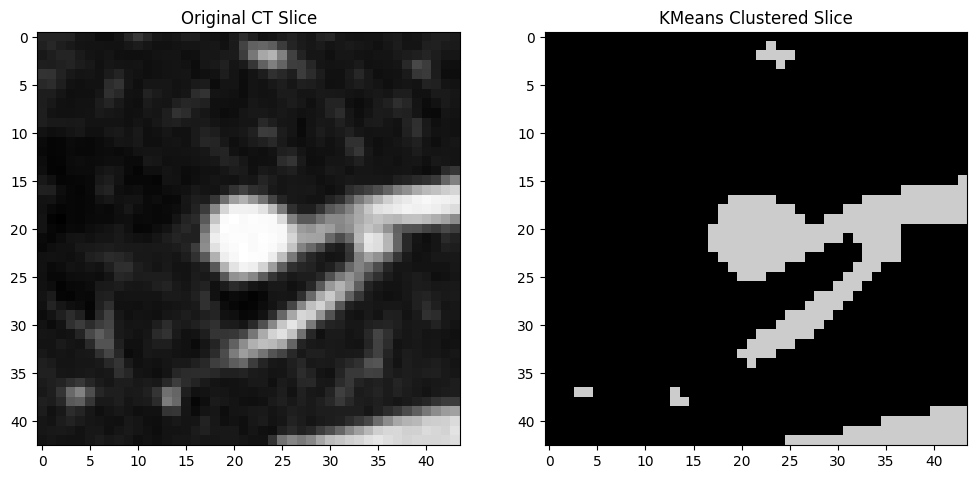

Completed segmentation for LIDC-IDRI-0039_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0114_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0114_R_1.nii.gz


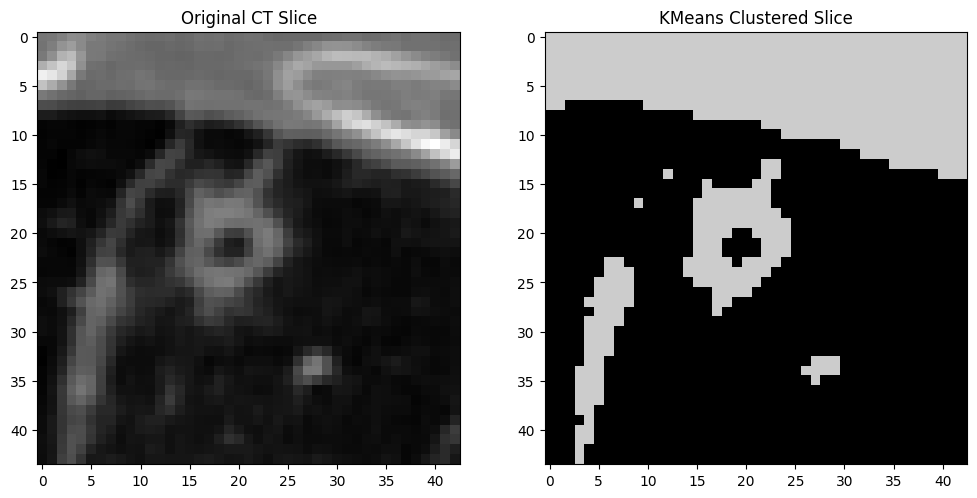

Completed segmentation for LIDC-IDRI-0114_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0130_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0130_R_1.nii.gz


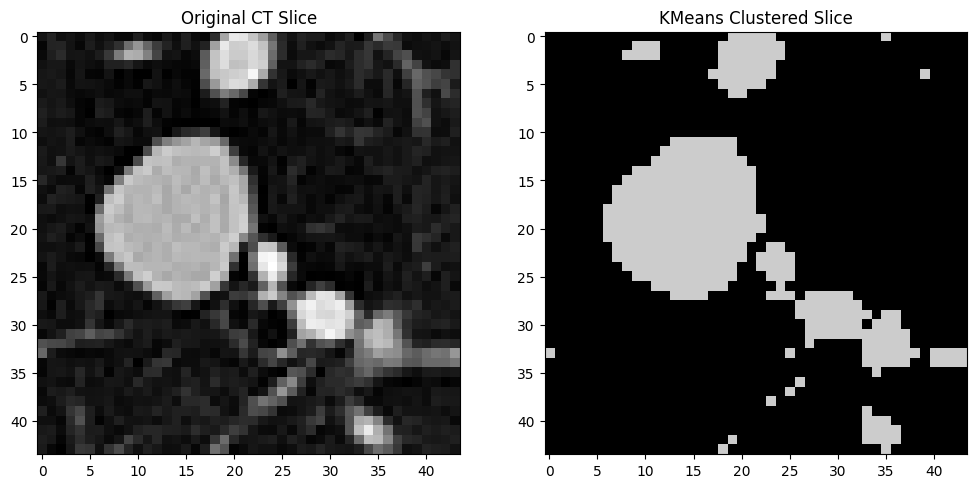

Completed segmentation for LIDC-IDRI-0130_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0075_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0075_R_4.nii.gz


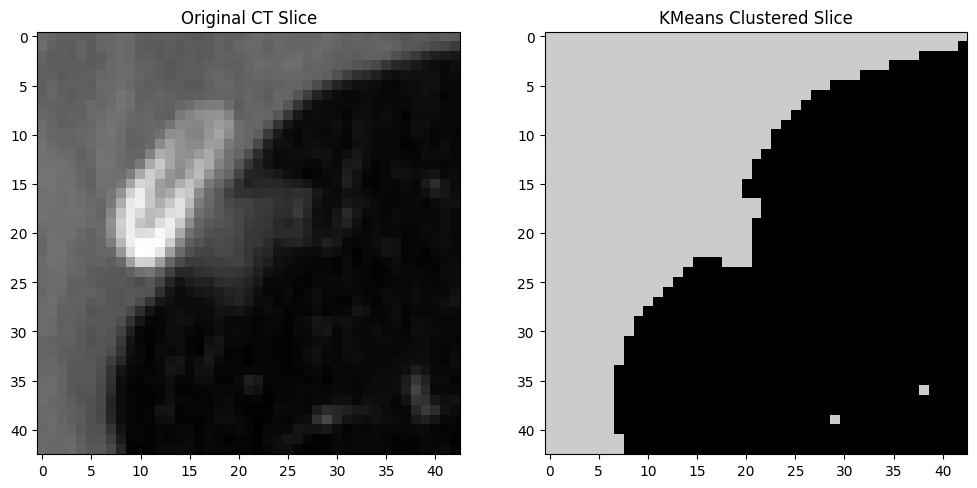

Completed segmentation for LIDC-IDRI-0075_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0059_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0059_R_1.nii.gz


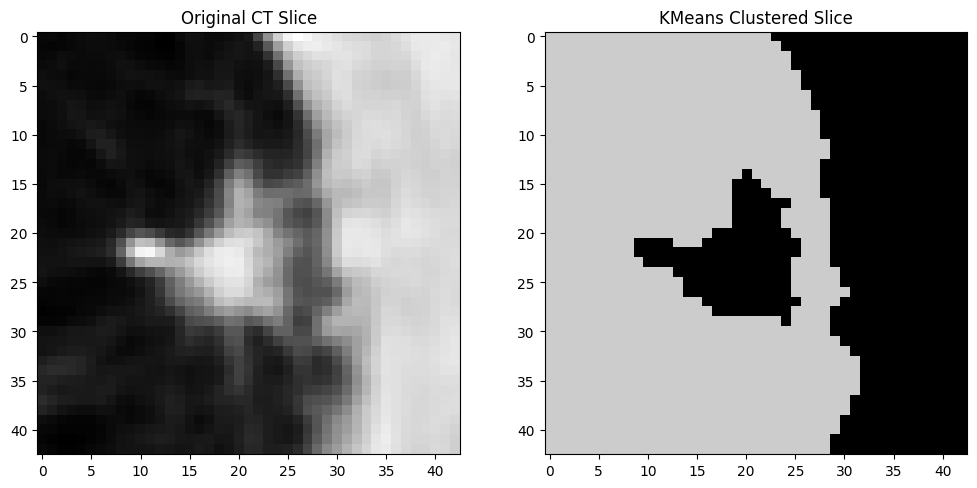

Completed segmentation for LIDC-IDRI-0059_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0090_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0090_R_1.nii.gz


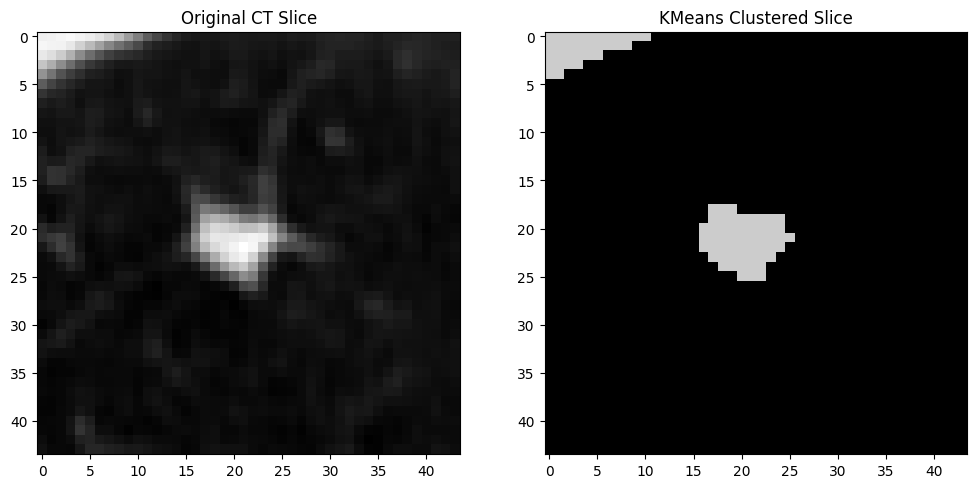

Completed segmentation for LIDC-IDRI-0090_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0128_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0128_R_1.nii.gz


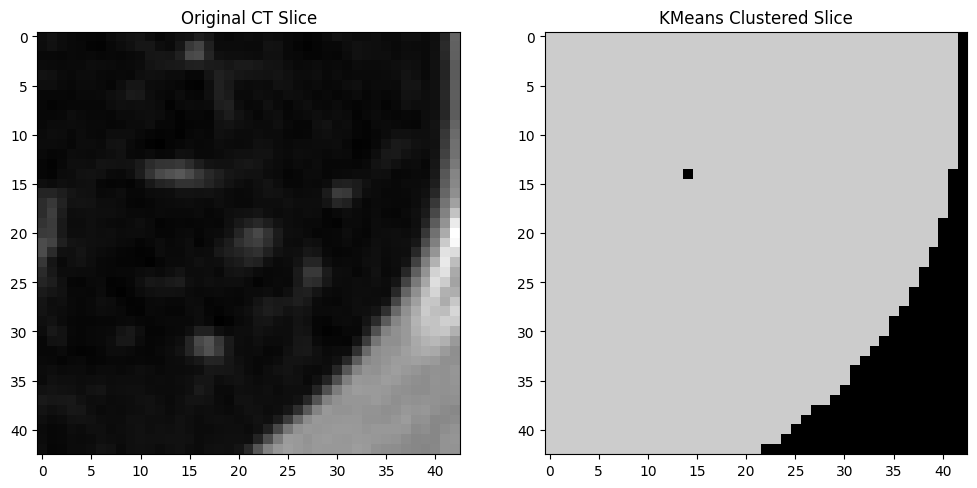

Completed segmentation for LIDC-IDRI-0128_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0092_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0092_R_1.nii.gz


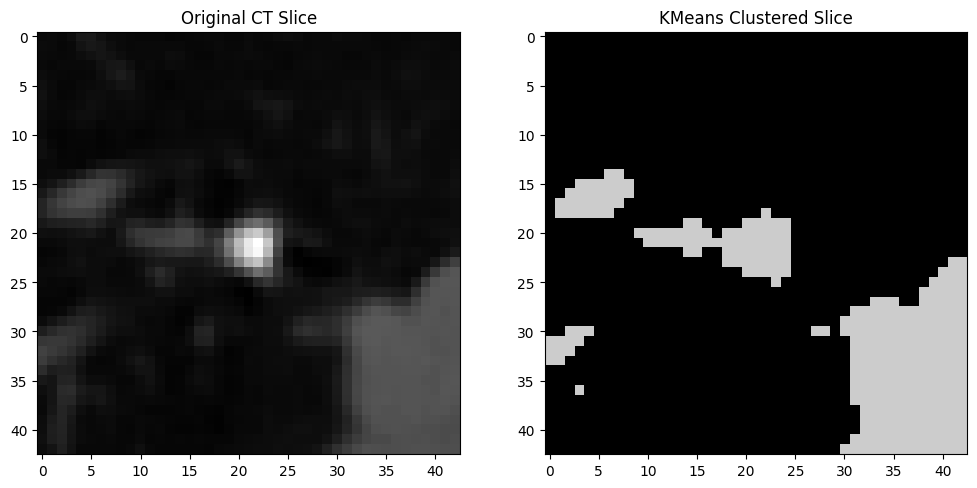

Completed segmentation for LIDC-IDRI-0092_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0012_R_9.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0012_R_9.nii.gz


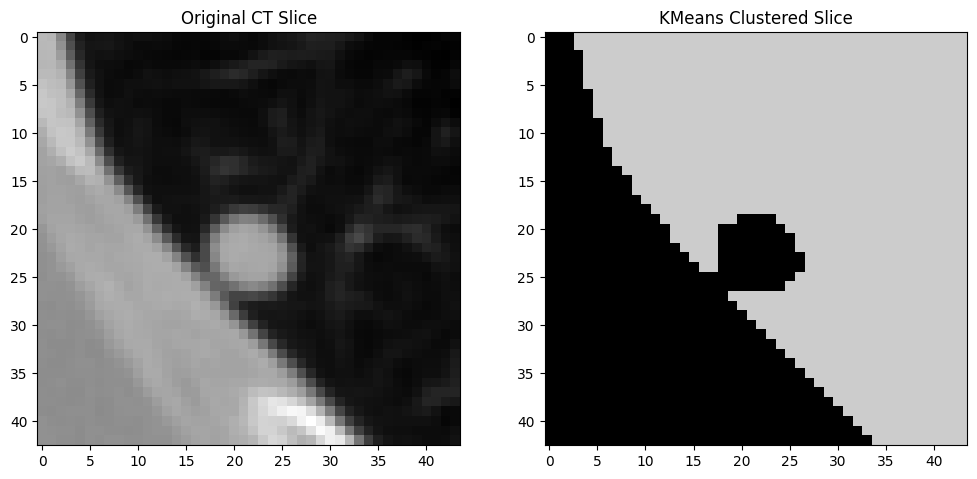

Completed segmentation for LIDC-IDRI-0012_R_9.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0118_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0118_R_4.nii.gz


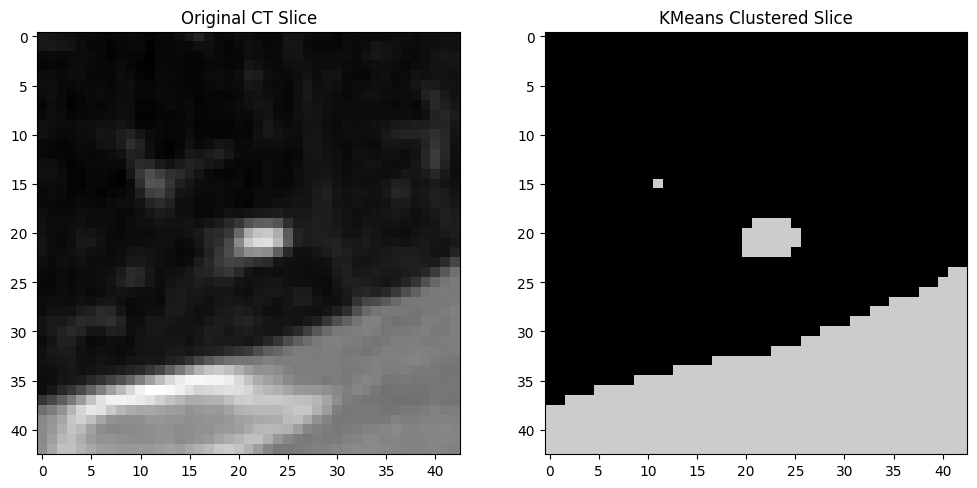

Completed segmentation for LIDC-IDRI-0118_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0042_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0042_R_3.nii.gz


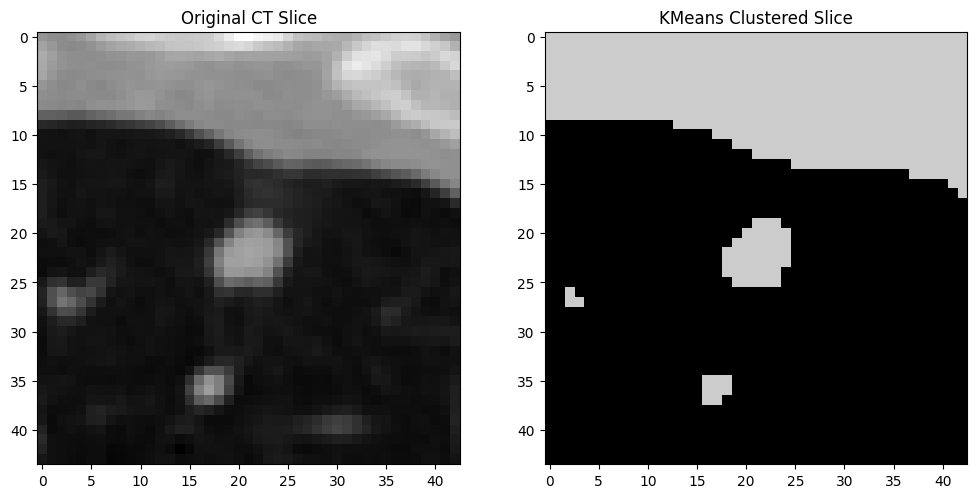

Completed segmentation for LIDC-IDRI-0042_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0129_R_11.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0129_R_11.nii.gz


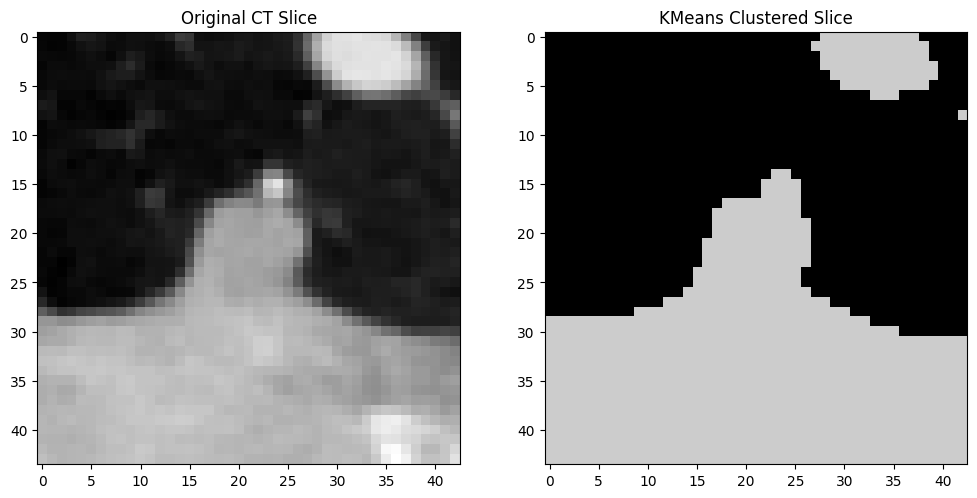

Completed segmentation for LIDC-IDRI-0129_R_11.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0044_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0044_R_4.nii.gz


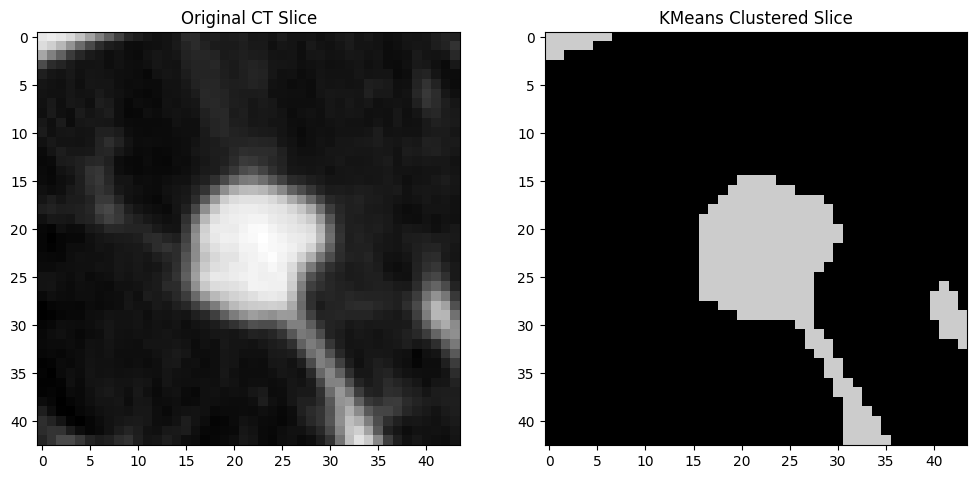

Completed segmentation for LIDC-IDRI-0044_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0119_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0119_R_2.nii.gz


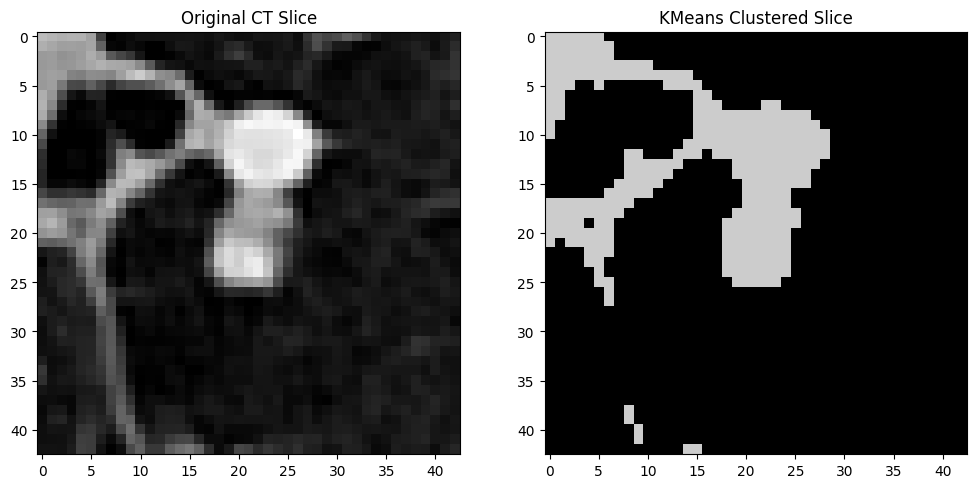

Completed segmentation for LIDC-IDRI-0119_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0068_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0068_R_1.nii.gz


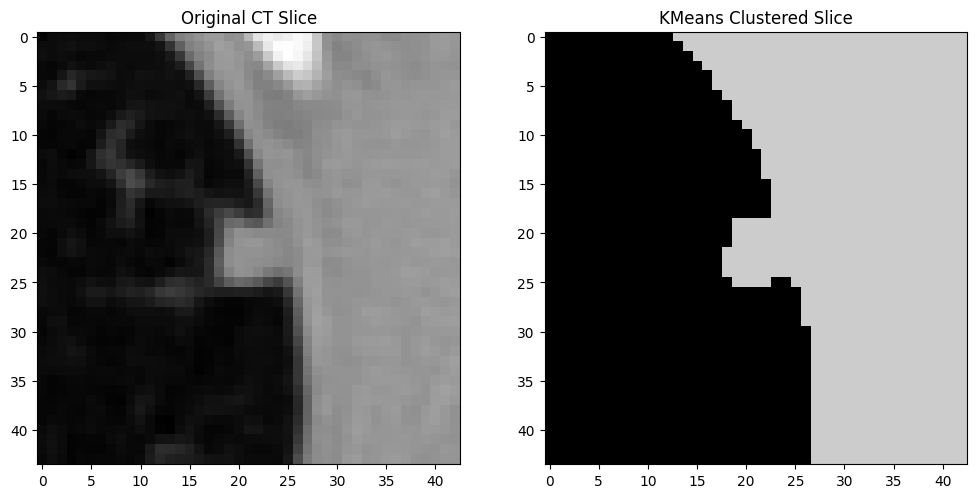

Completed segmentation for LIDC-IDRI-0068_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0045_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0045_R_5.nii.gz


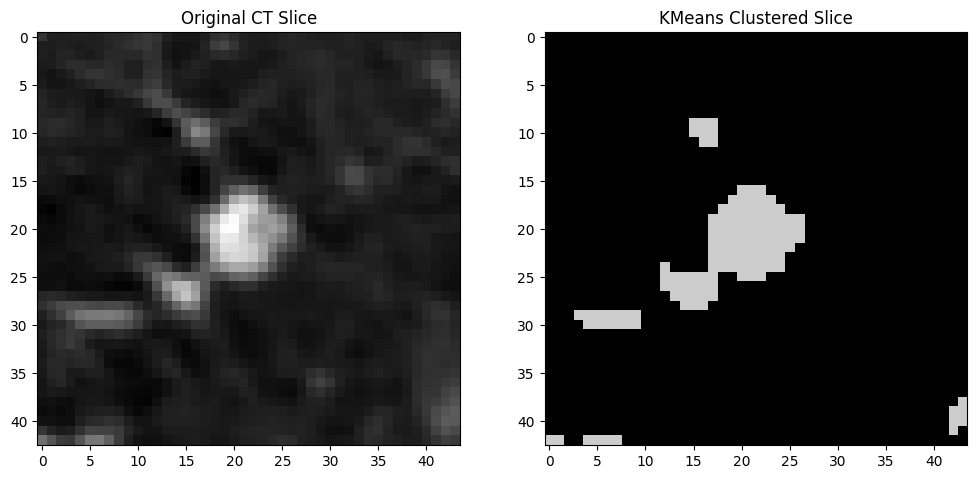

Completed segmentation for LIDC-IDRI-0045_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0015_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0015_R_1.nii.gz


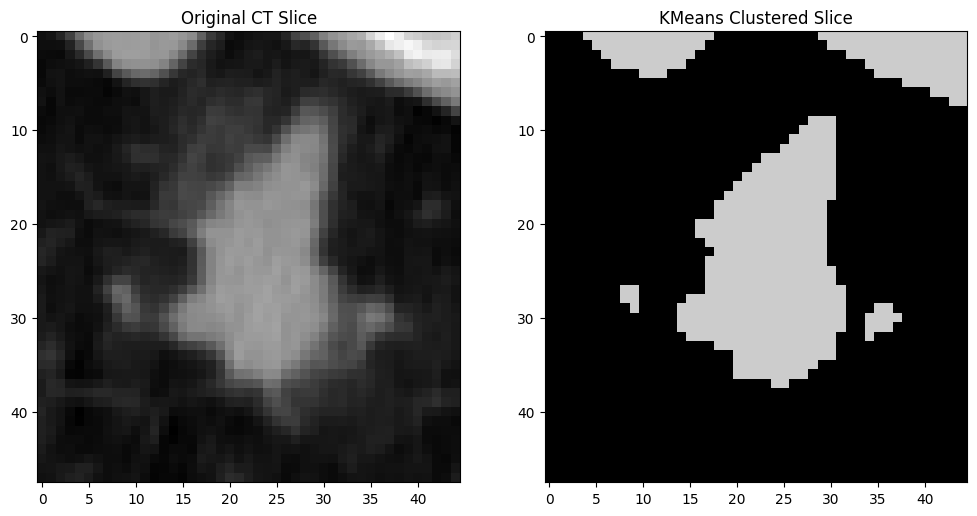

Completed segmentation for LIDC-IDRI-0015_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0128_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0128_R_3.nii.gz


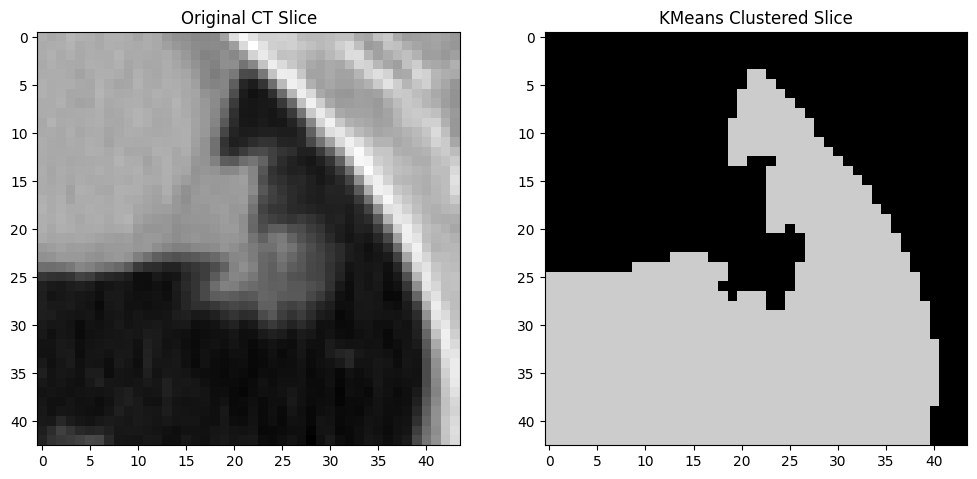

Completed segmentation for LIDC-IDRI-0128_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0068_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0068_R_6.nii.gz


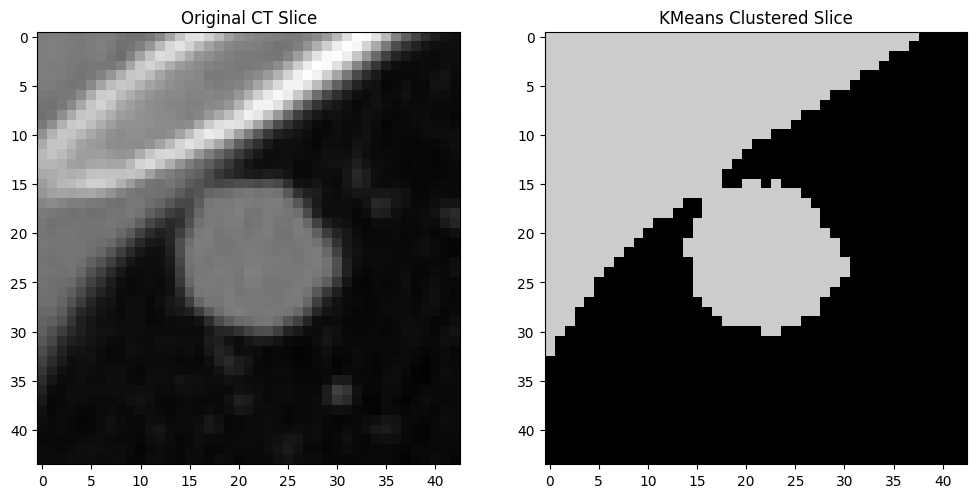

Completed segmentation for LIDC-IDRI-0068_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0095_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0095_R_1.nii.gz


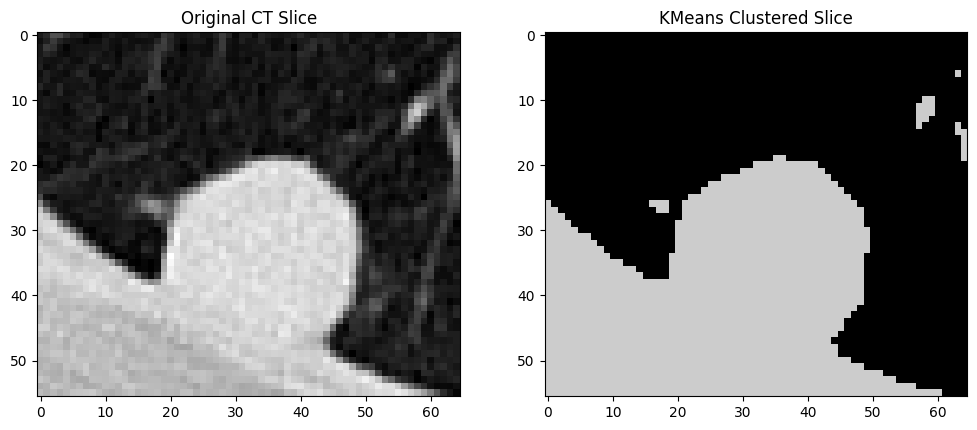

Completed segmentation for LIDC-IDRI-0095_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0044_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0044_R_2.nii.gz


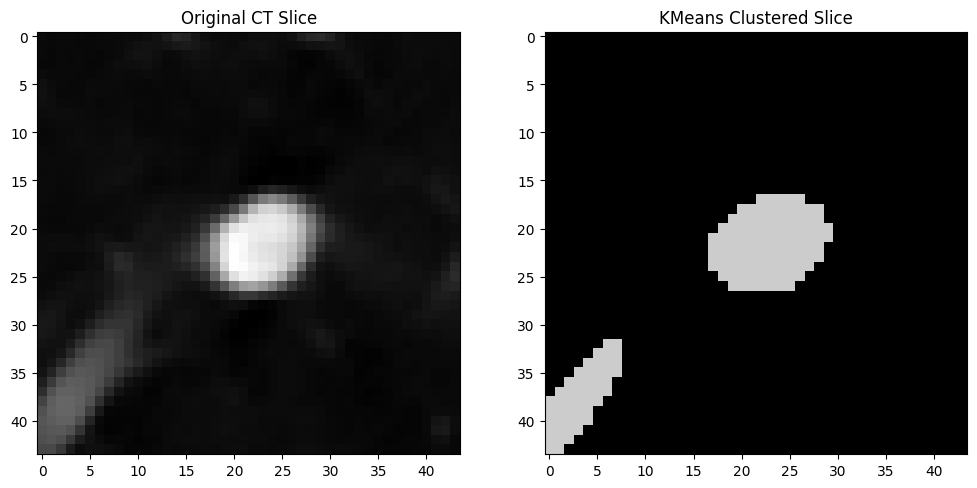

Completed segmentation for LIDC-IDRI-0044_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0011_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0011_R_1.nii.gz


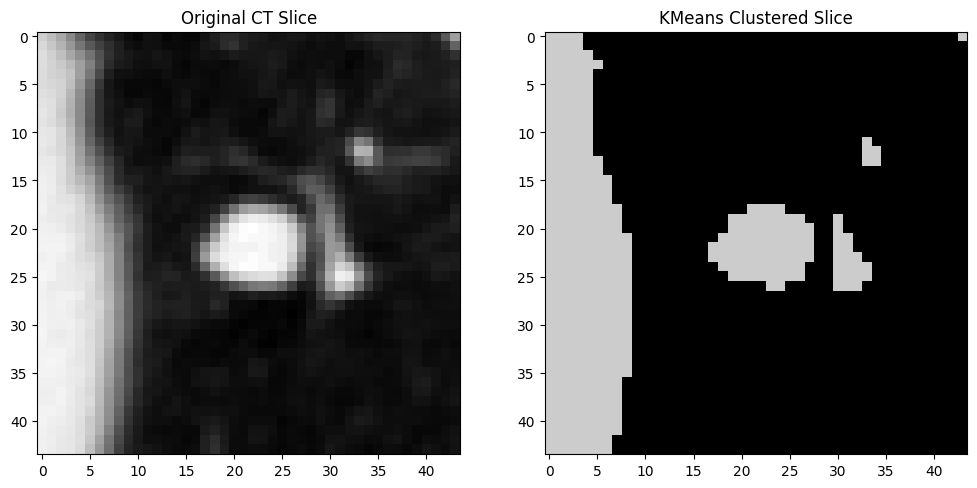

Completed segmentation for LIDC-IDRI-0011_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0120_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0120_R_3.nii.gz


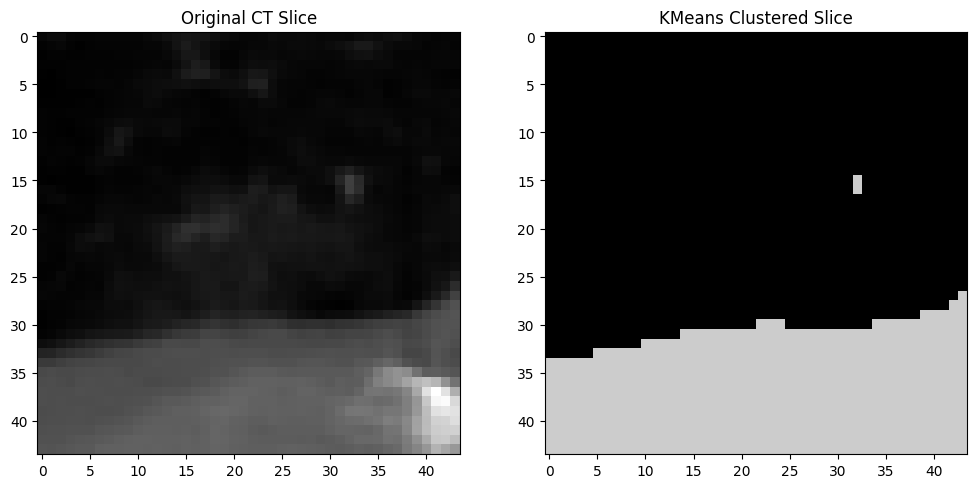

Completed segmentation for LIDC-IDRI-0120_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0037_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0037_R_1.nii.gz


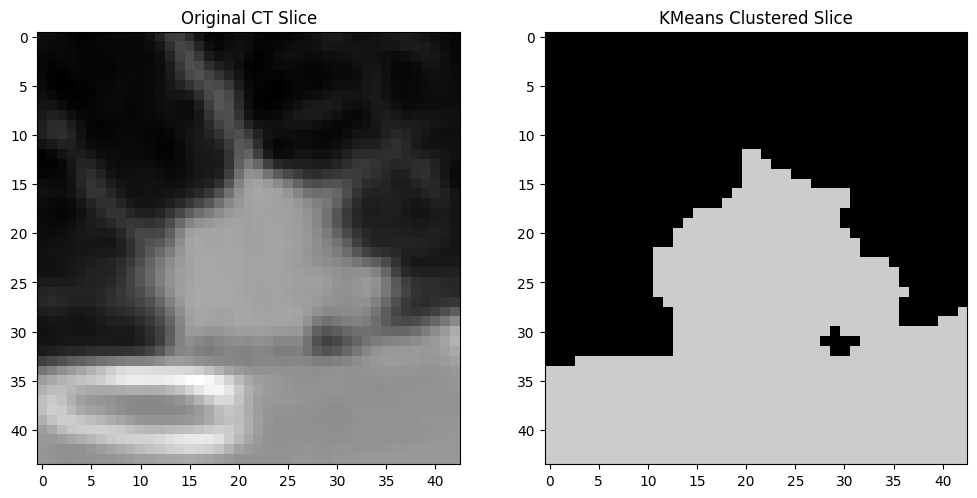

Completed segmentation for LIDC-IDRI-0037_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0075_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0075_R_2.nii.gz


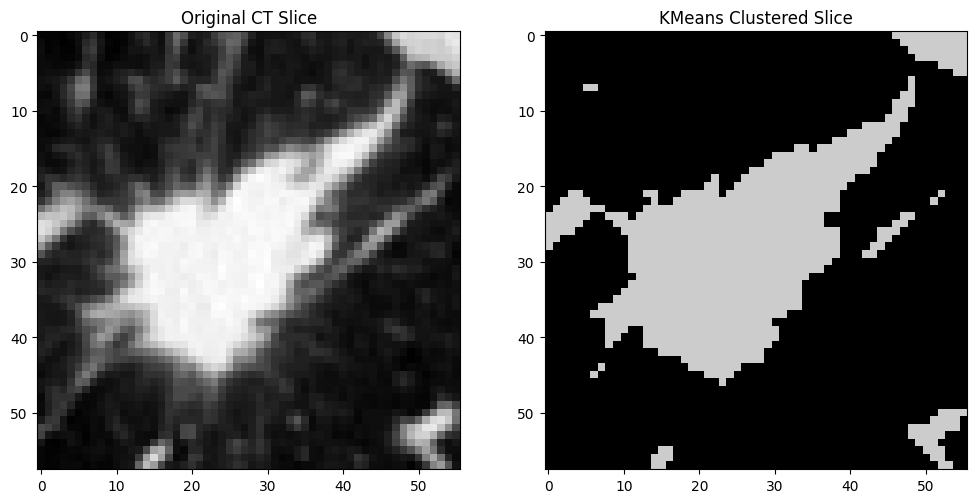

Completed segmentation for LIDC-IDRI-0075_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0018_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0018_R_1.nii.gz


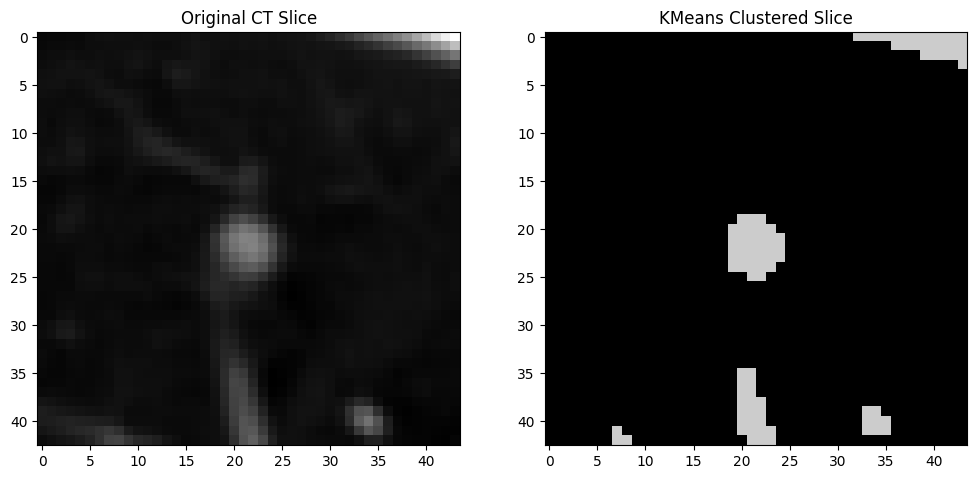

Completed segmentation for LIDC-IDRI-0018_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0119_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0119_R_1.nii.gz


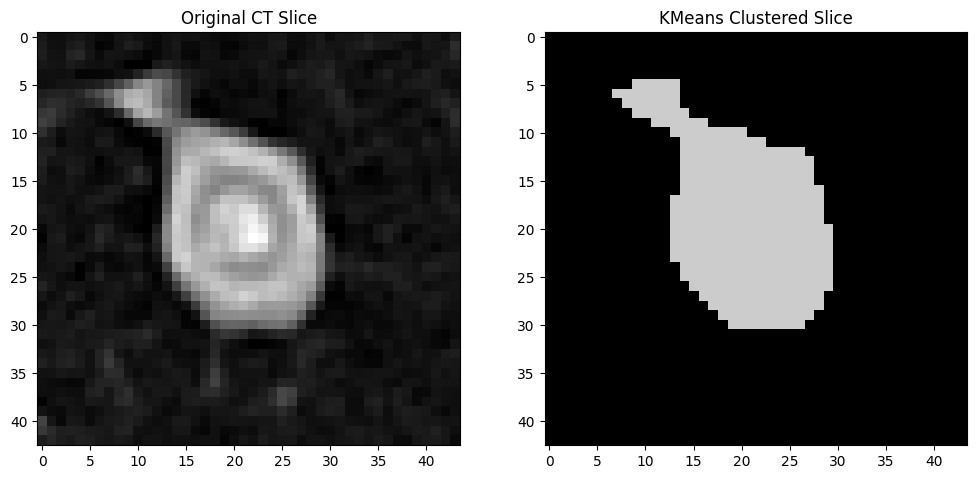

Completed segmentation for LIDC-IDRI-0119_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0080_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0080_R_1.nii.gz


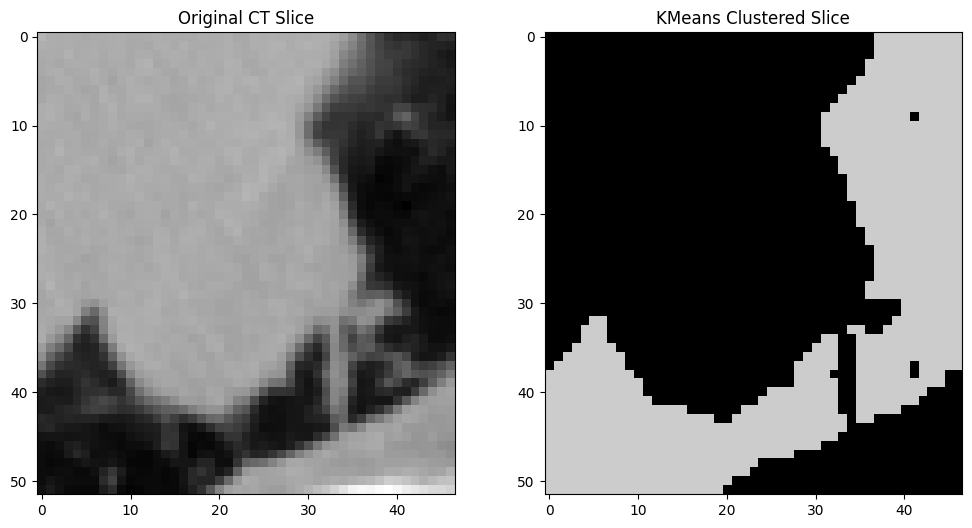

Completed segmentation for LIDC-IDRI-0080_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0003_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0003_R_4.nii.gz


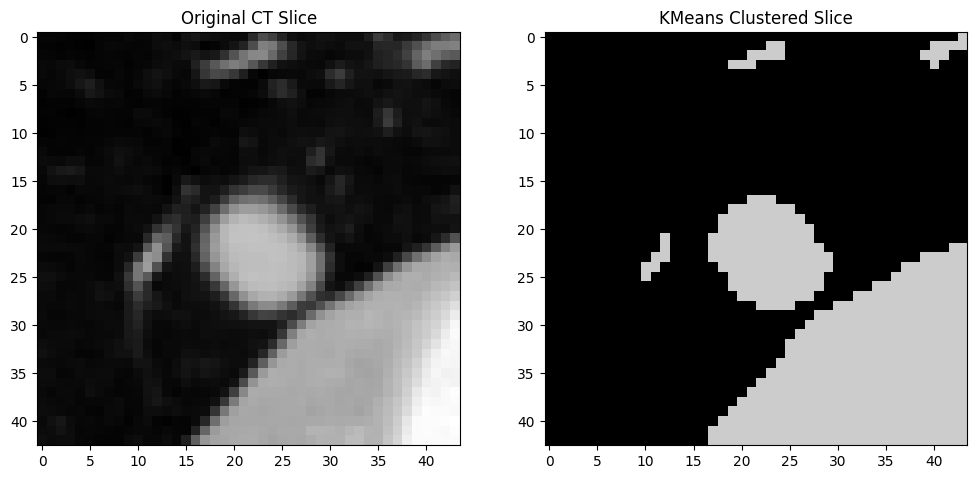

Completed segmentation for LIDC-IDRI-0003_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0109_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0109_R_1.nii.gz


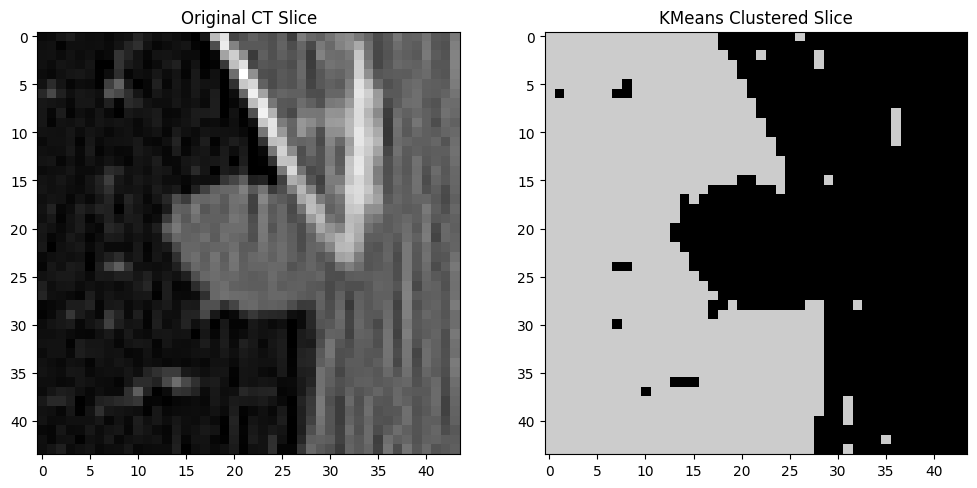

Completed segmentation for LIDC-IDRI-0109_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0112_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0112_R_1.nii.gz


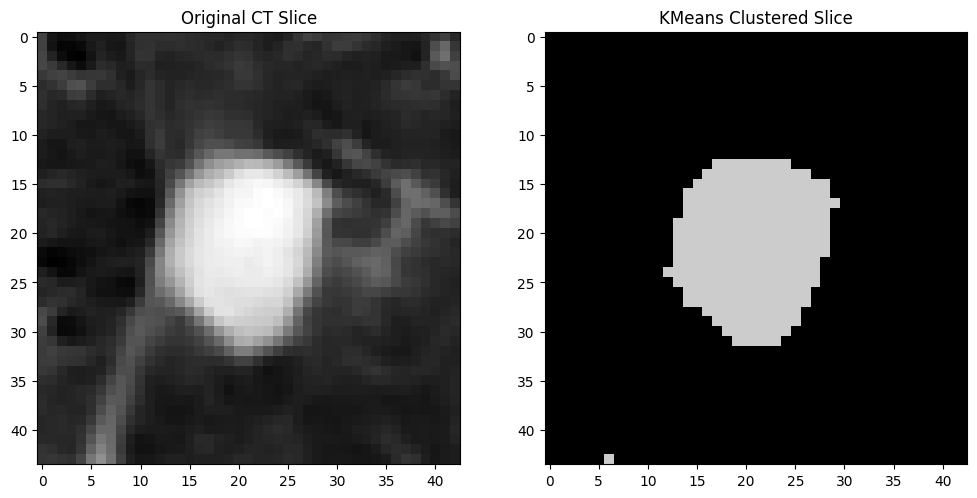

Completed segmentation for LIDC-IDRI-0112_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0057_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0057_R_1.nii.gz


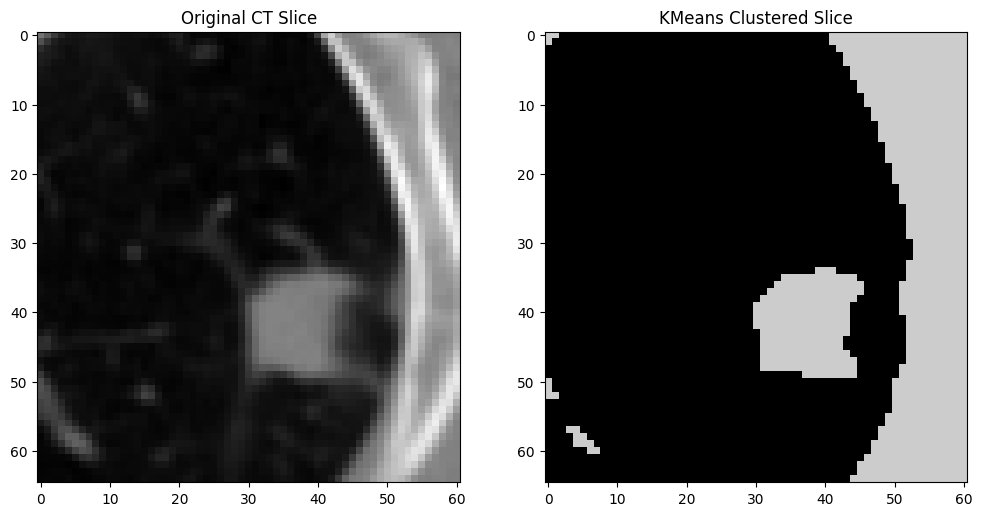

Completed segmentation for LIDC-IDRI-0057_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0096_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0096_R_1.nii.gz


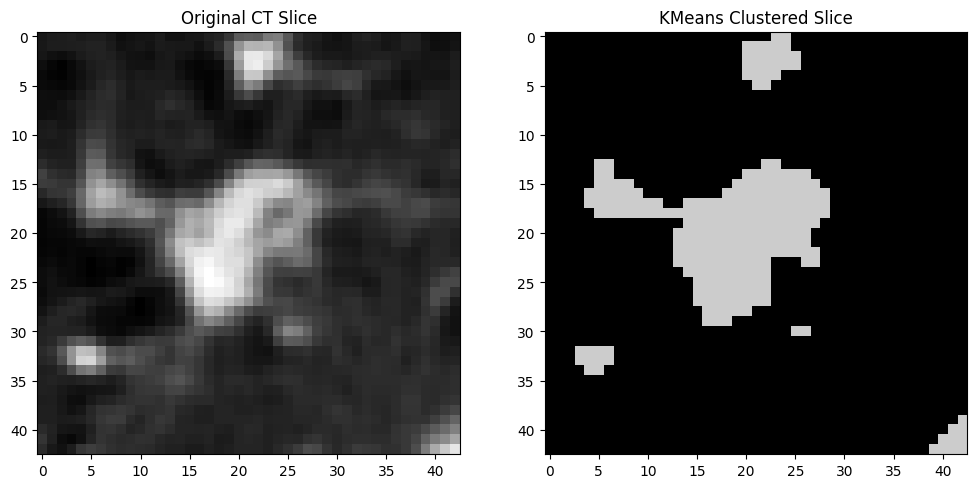

Completed segmentation for LIDC-IDRI-0096_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0089_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0089_R_1.nii.gz


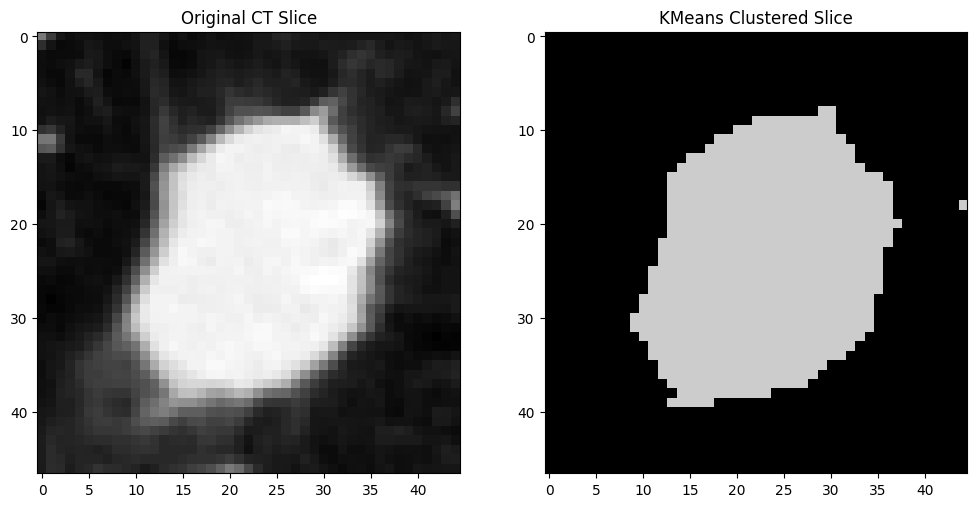

Completed segmentation for LIDC-IDRI-0089_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0124_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0124_R_2.nii.gz


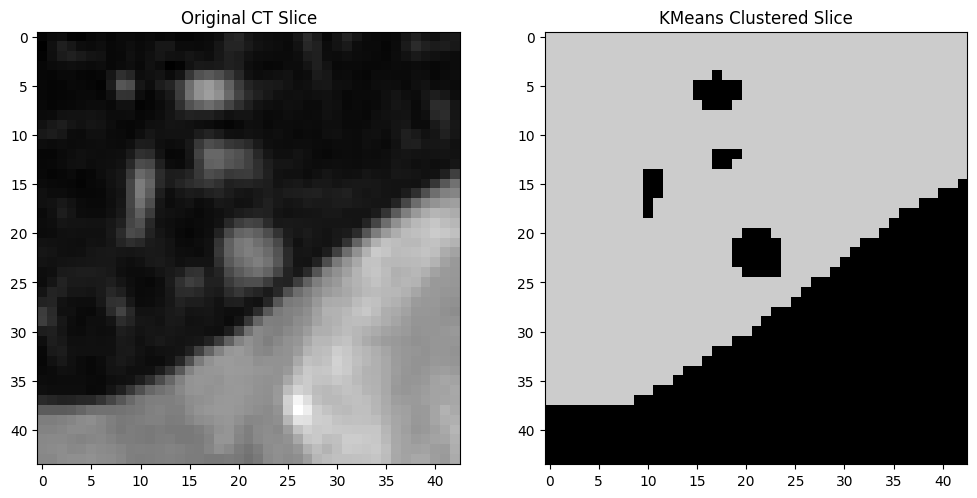

Completed segmentation for LIDC-IDRI-0124_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0144_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0144_R_4.nii.gz


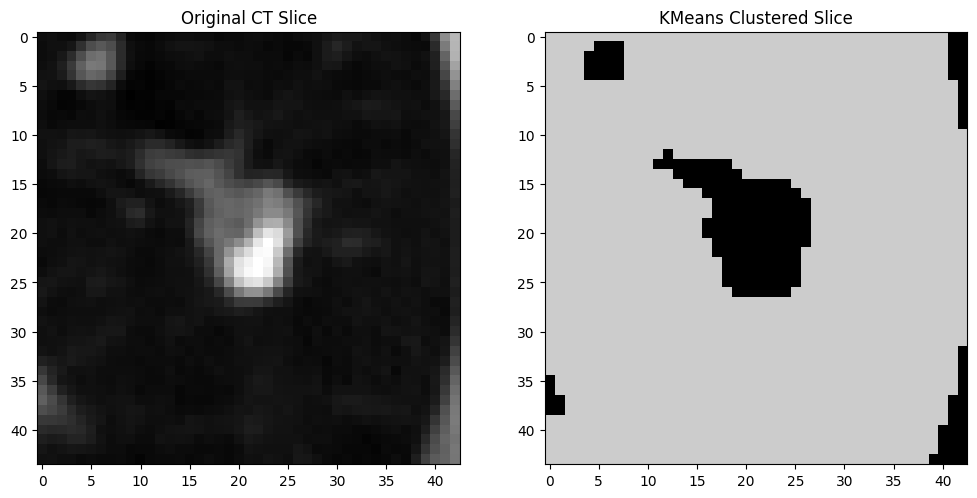

Completed segmentation for LIDC-IDRI-0144_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0014_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0014_R_1.nii.gz


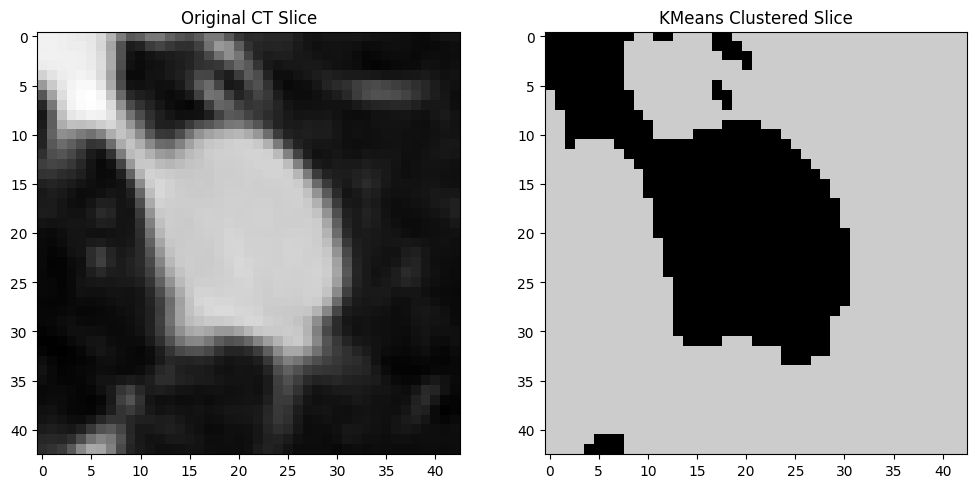

Completed segmentation for LIDC-IDRI-0014_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0129_R_14.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0129_R_14.nii.gz


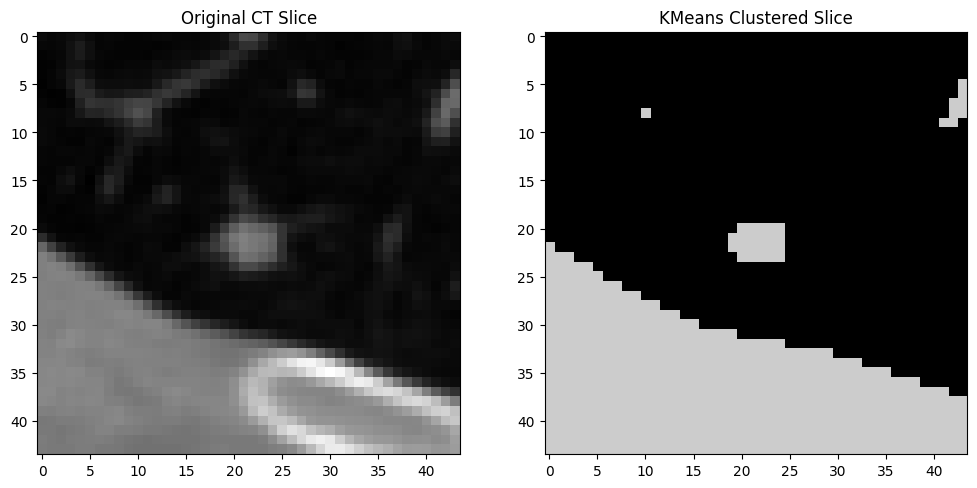

Completed segmentation for LIDC-IDRI-0129_R_14.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0007_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0007_R_1.nii.gz


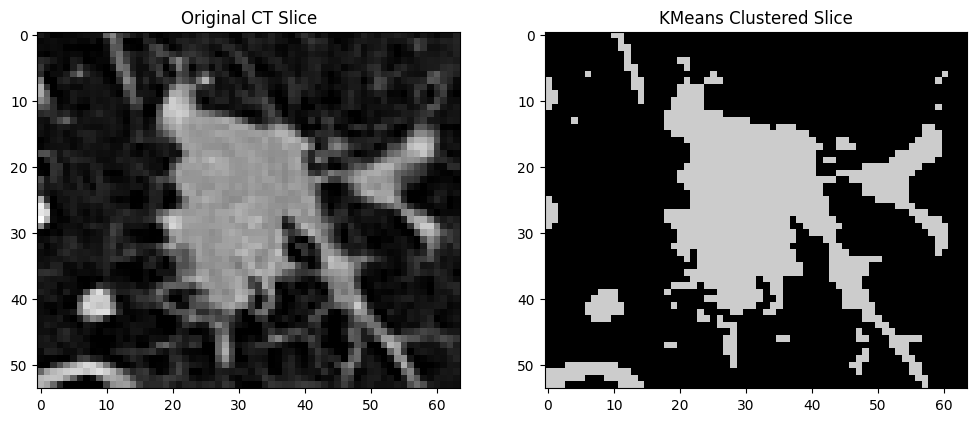

Completed segmentation for LIDC-IDRI-0007_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0116_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0116_R_2.nii.gz


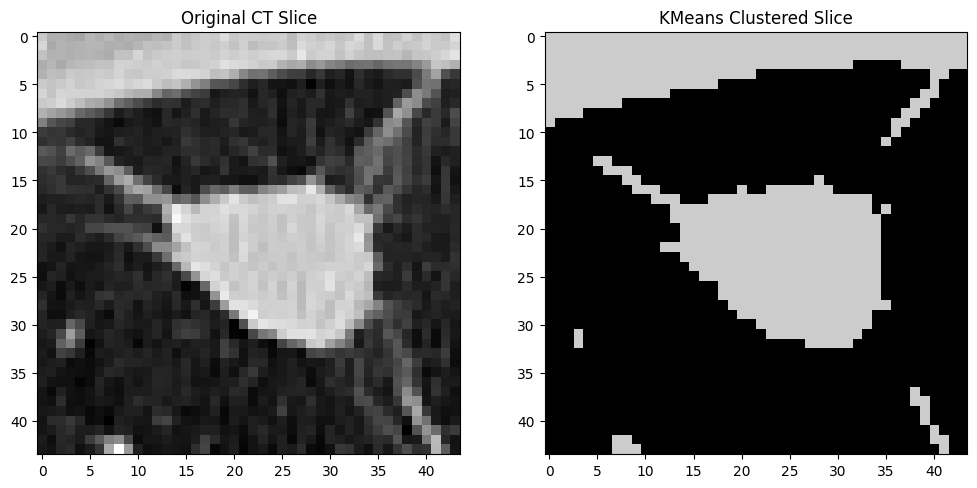

Completed segmentation for LIDC-IDRI-0116_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0129_R_9.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0129_R_9.nii.gz


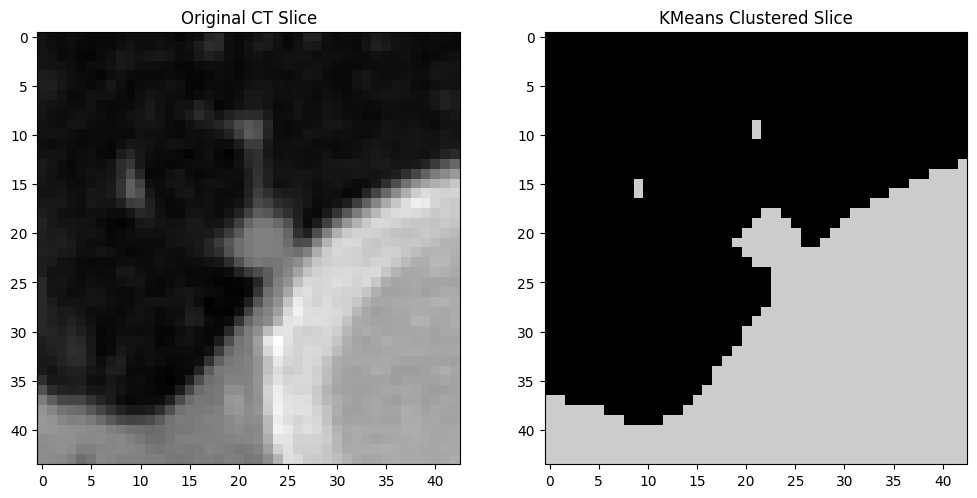

Completed segmentation for LIDC-IDRI-0129_R_9.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0084_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0084_R_3.nii.gz


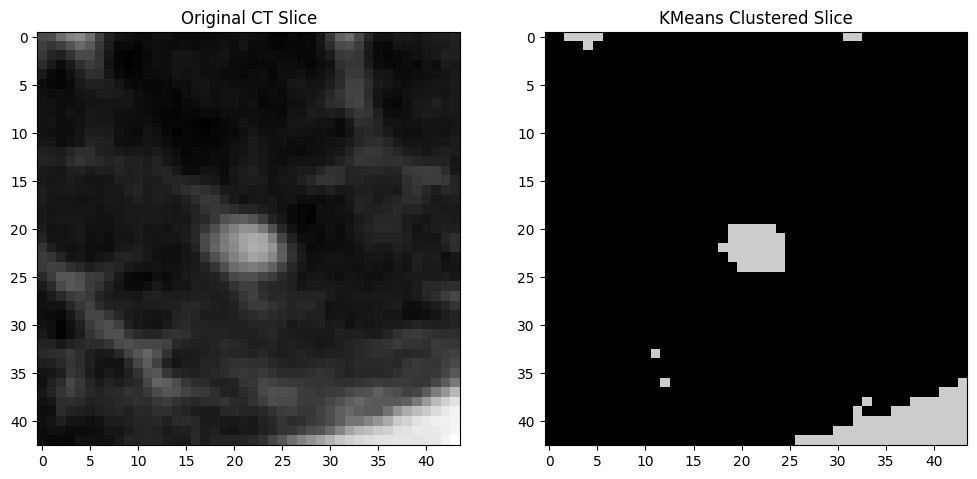

Completed segmentation for LIDC-IDRI-0084_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0069_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0069_R_1.nii.gz


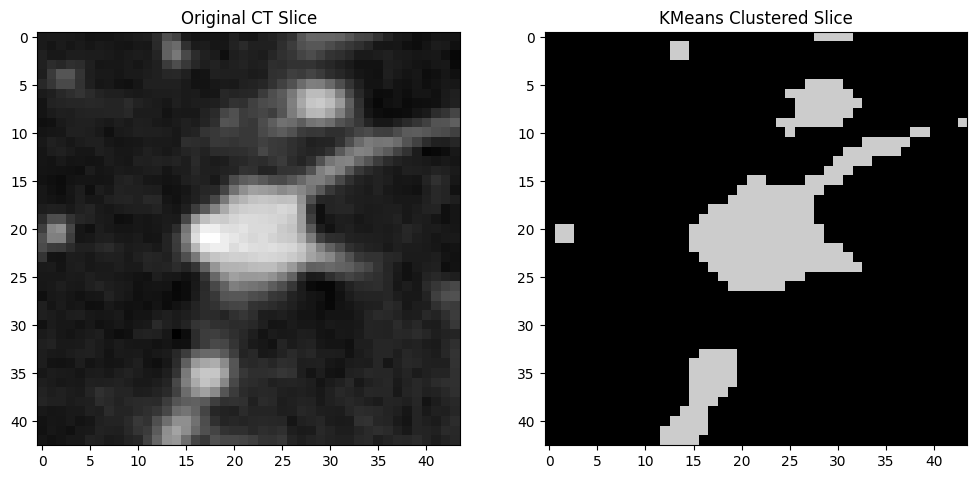

Completed segmentation for LIDC-IDRI-0069_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0013_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0013_R_3.nii.gz


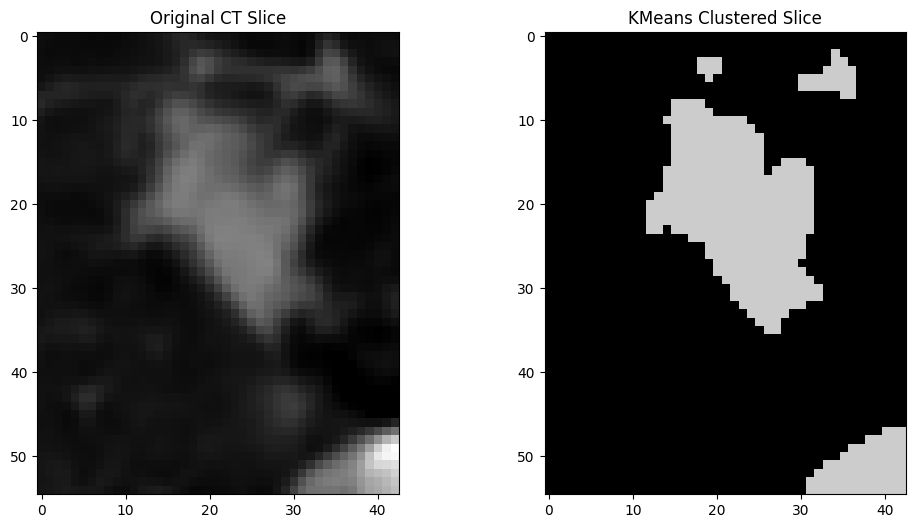

Completed segmentation for LIDC-IDRI-0013_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0049_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0049_R_6.nii.gz


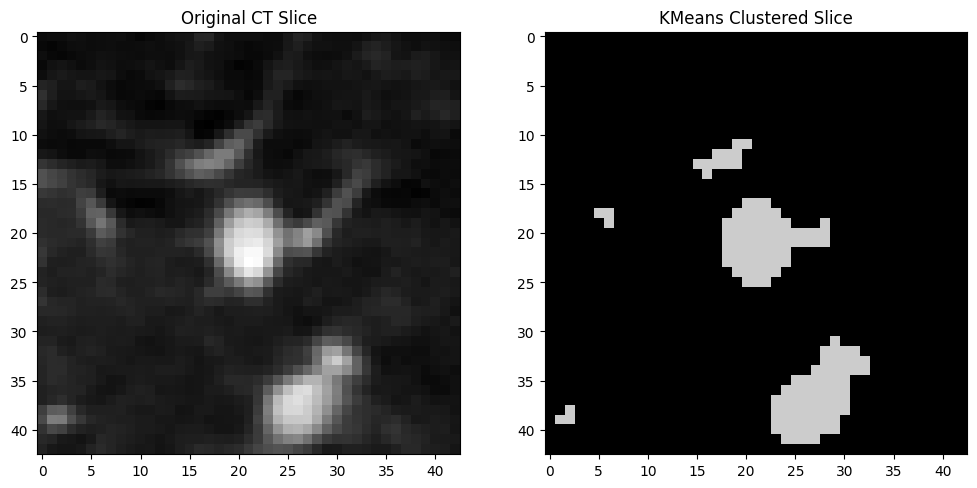

Completed segmentation for LIDC-IDRI-0049_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0008_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0008_R_2.nii.gz


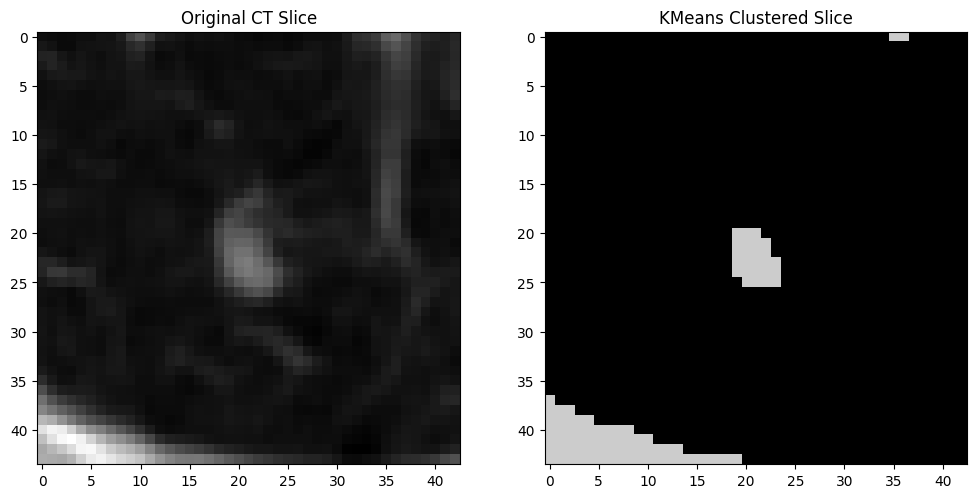

Completed segmentation for LIDC-IDRI-0008_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0023_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0023_R_1.nii.gz


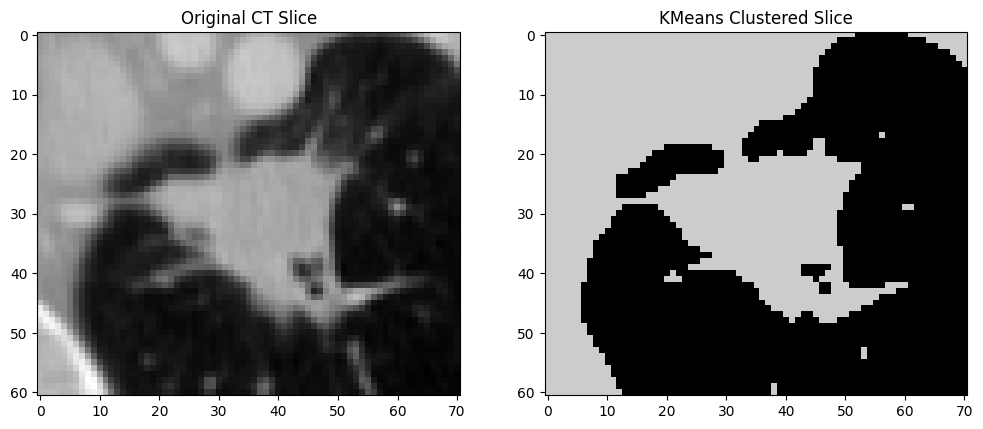

Completed segmentation for LIDC-IDRI-0023_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0016_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0016_R_6.nii.gz


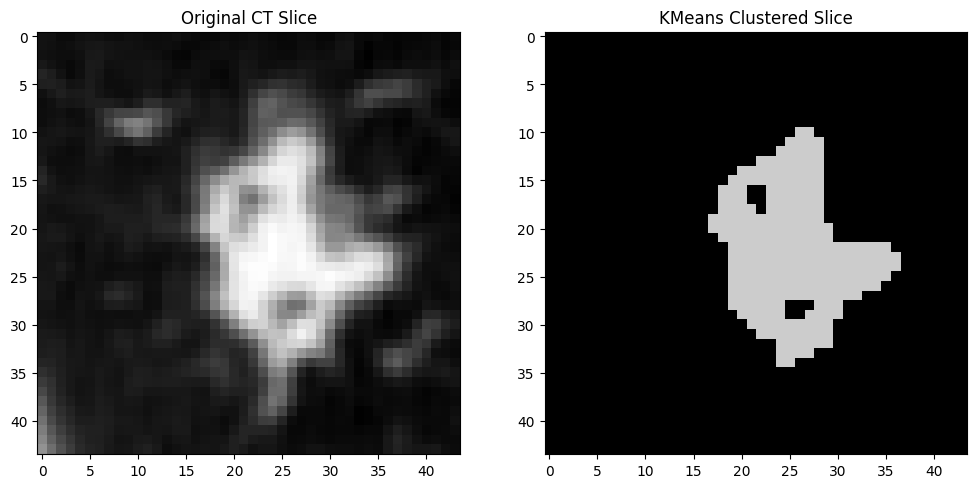

Completed segmentation for LIDC-IDRI-0016_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0027_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0027_R_4.nii.gz


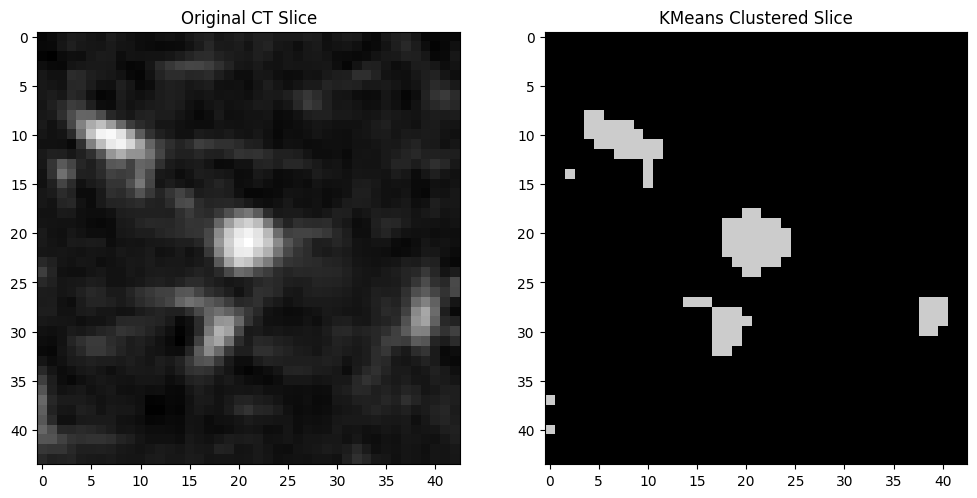

Completed segmentation for LIDC-IDRI-0027_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0092_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0092_R_4.nii.gz


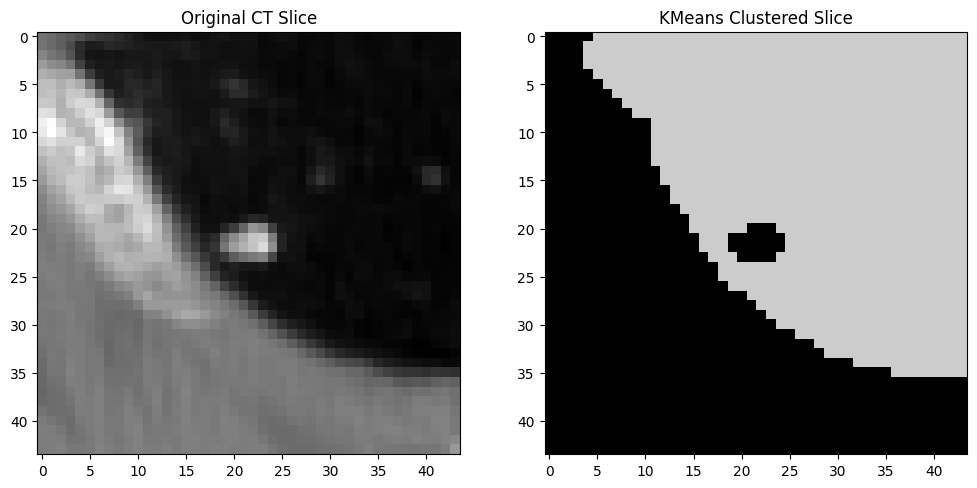

Completed segmentation for LIDC-IDRI-0092_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0056_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0056_R_1.nii.gz


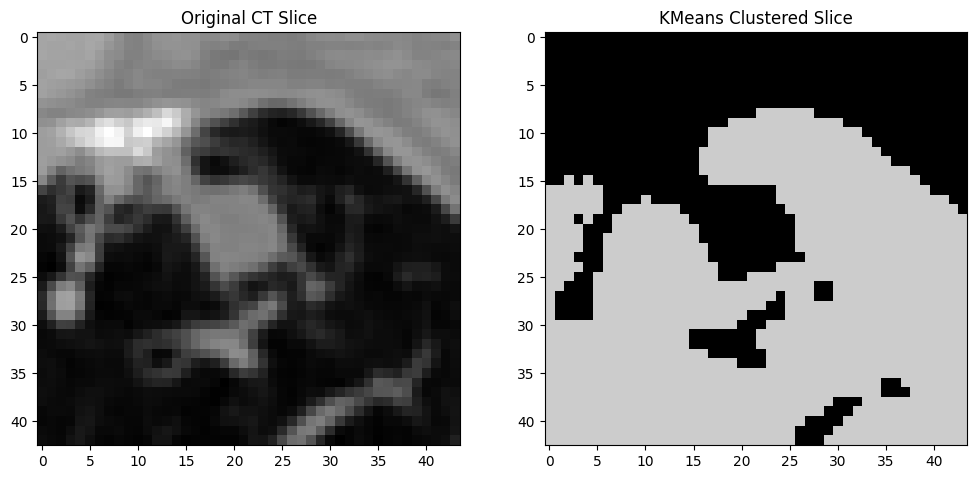

Completed segmentation for LIDC-IDRI-0056_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0024_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0024_R_1.nii.gz


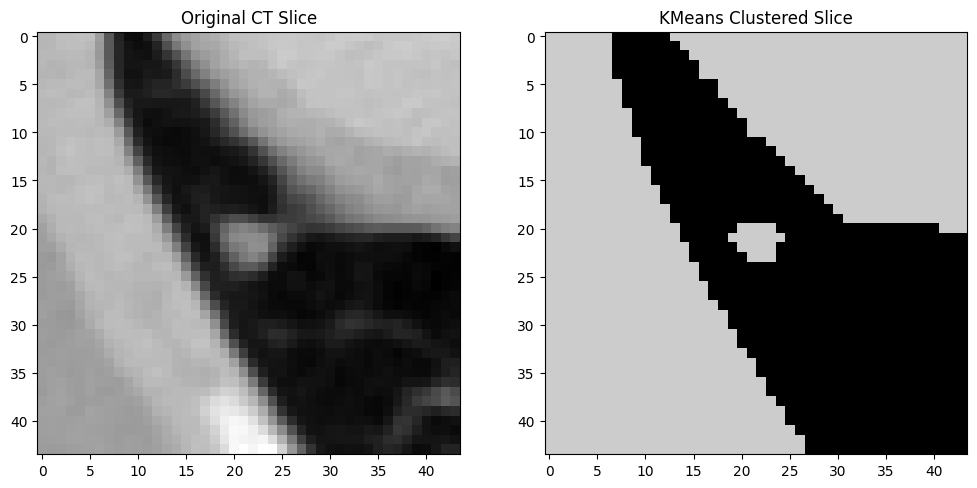

Completed segmentation for LIDC-IDRI-0024_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0139_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0139_R_3.nii.gz


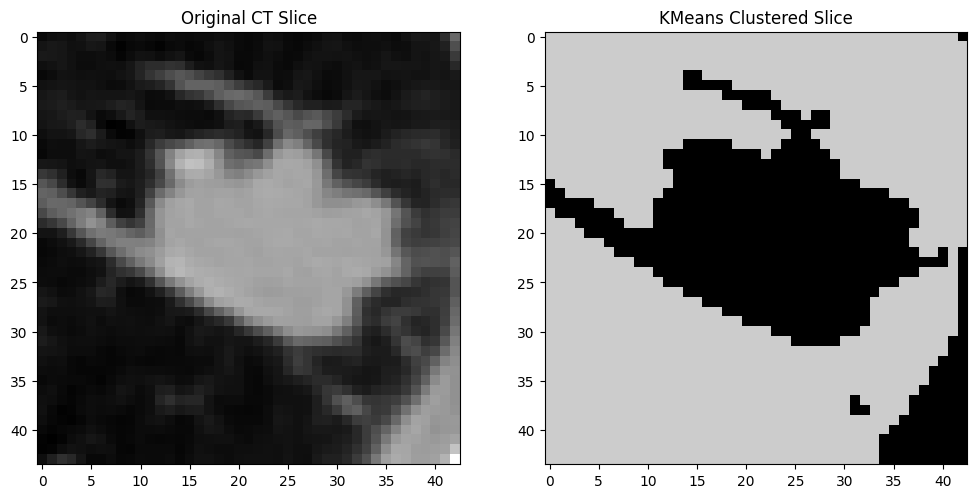

Completed segmentation for LIDC-IDRI-0139_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0142_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0142_R_3.nii.gz


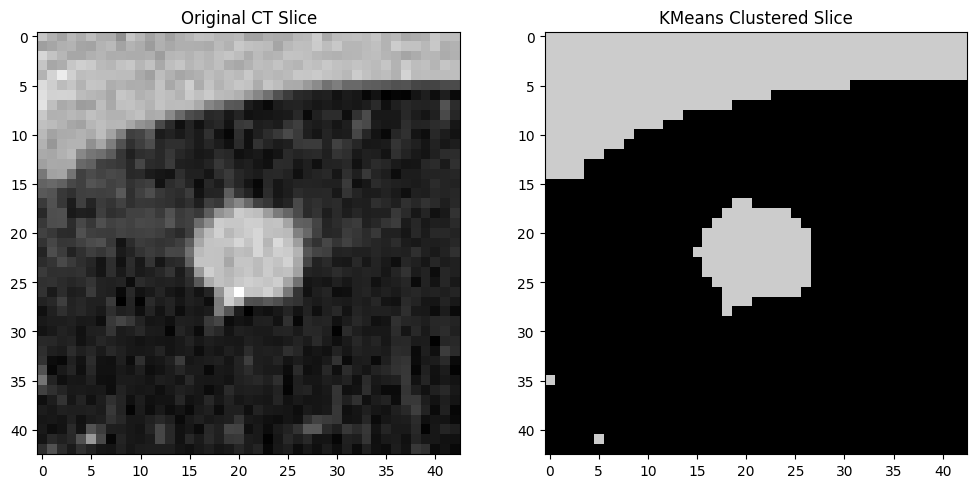

Completed segmentation for LIDC-IDRI-0142_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0046_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0046_R_4.nii.gz


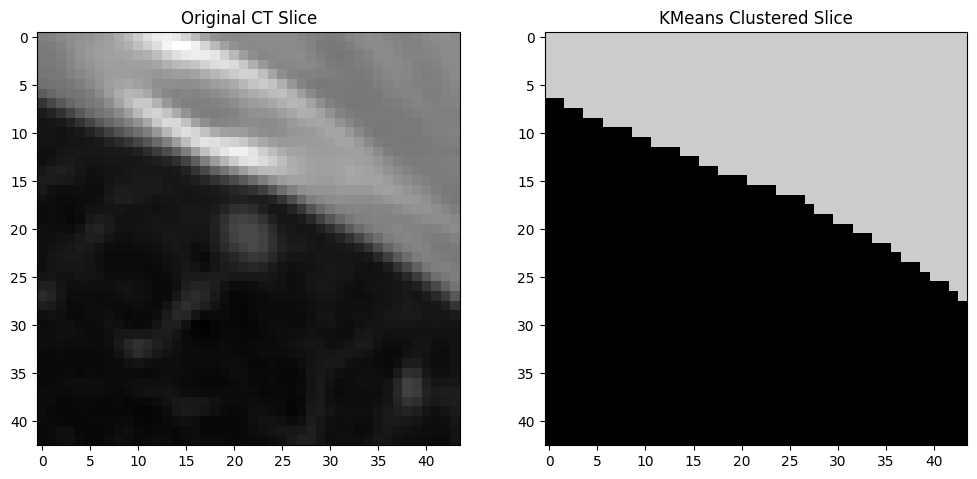

Completed segmentation for LIDC-IDRI-0046_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0141_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0141_R_4.nii.gz


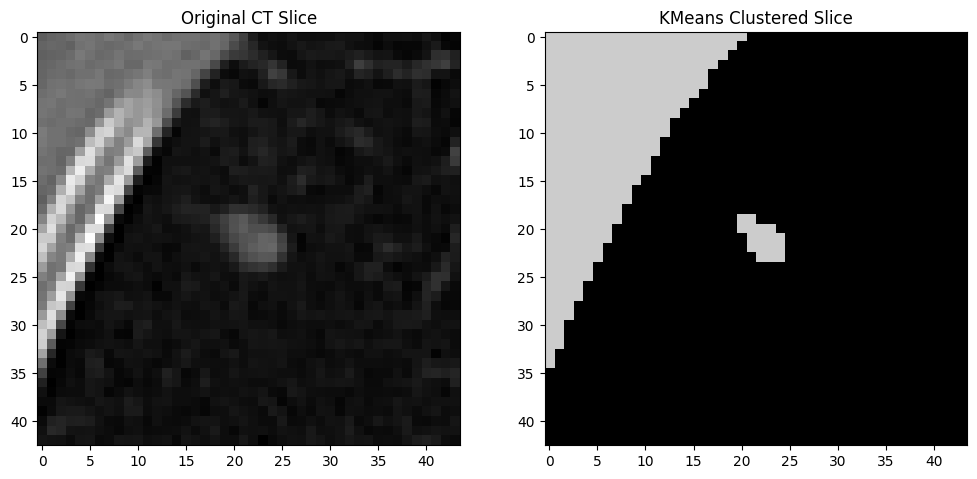

Completed segmentation for LIDC-IDRI-0141_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0016_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0016_R_1.nii.gz


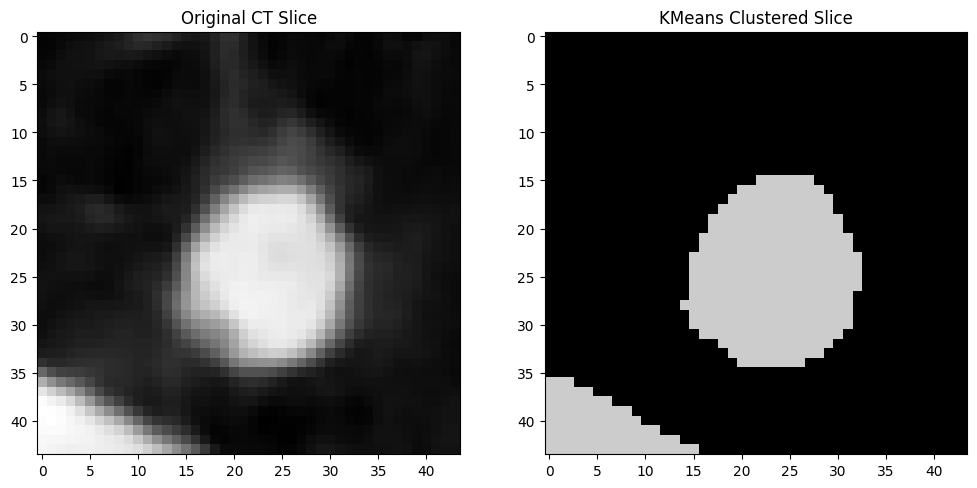

Completed segmentation for LIDC-IDRI-0016_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0012_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0012_R_2.nii.gz


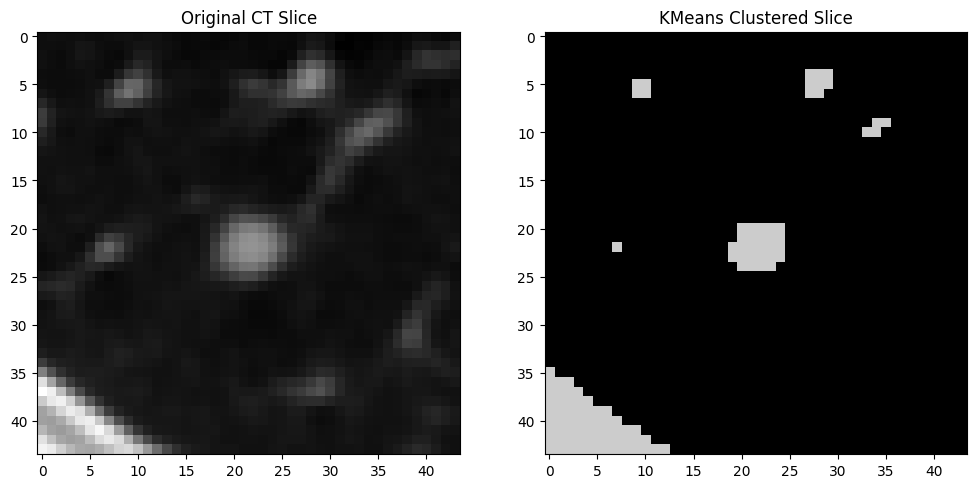

Completed segmentation for LIDC-IDRI-0012_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0061_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0061_R_3.nii.gz


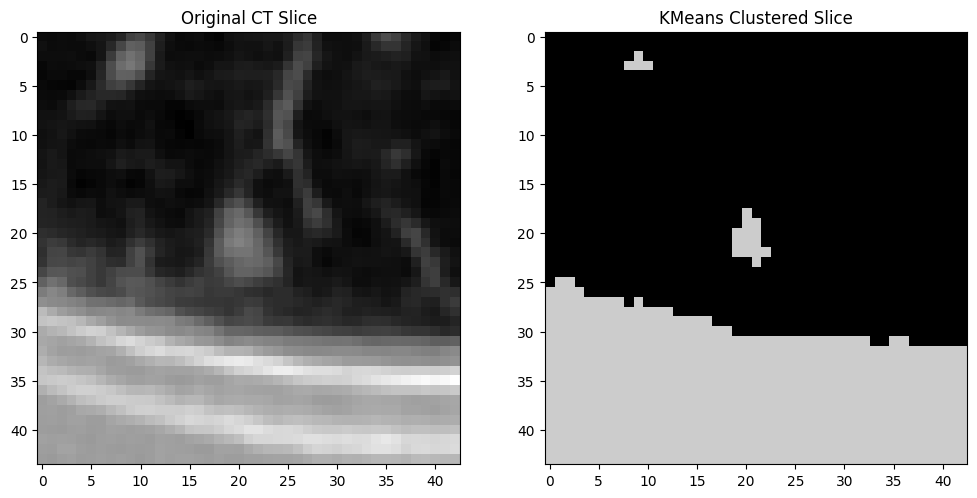

Completed segmentation for LIDC-IDRI-0061_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0020_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0020_R_2.nii.gz


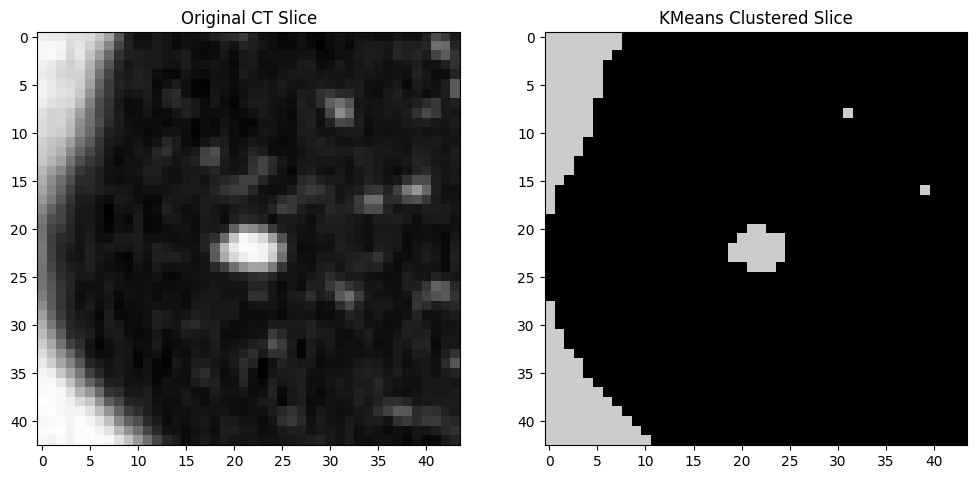

Completed segmentation for LIDC-IDRI-0020_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0120_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0120_R_4.nii.gz


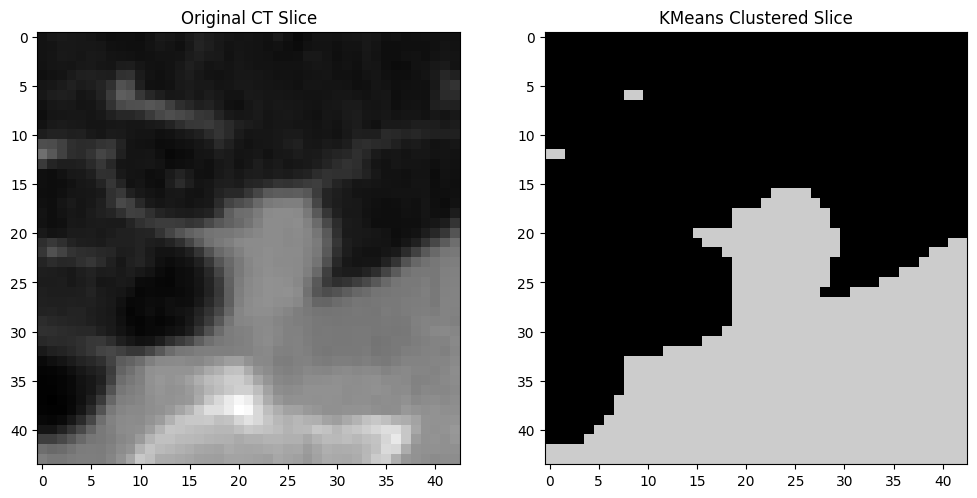

Completed segmentation for LIDC-IDRI-0120_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0099_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0099_R_1.nii.gz


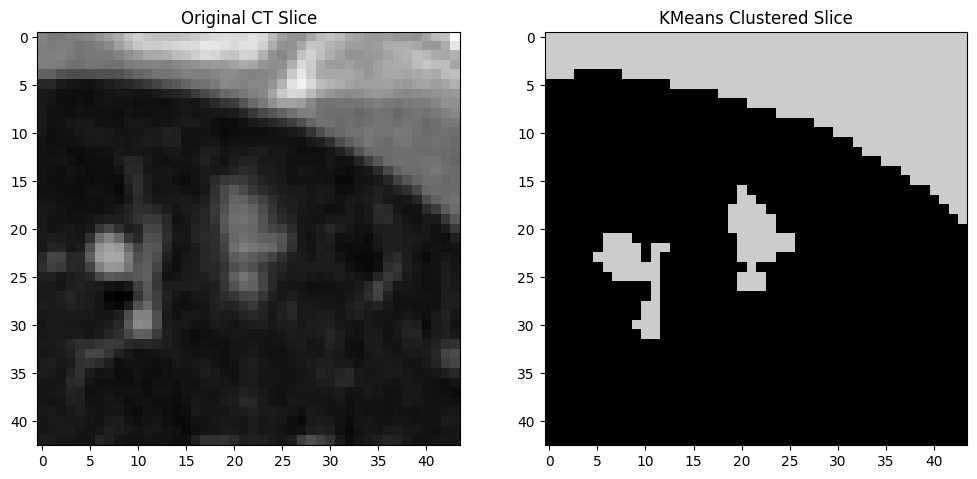

Completed segmentation for LIDC-IDRI-0099_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0124_R_13.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0124_R_13.nii.gz


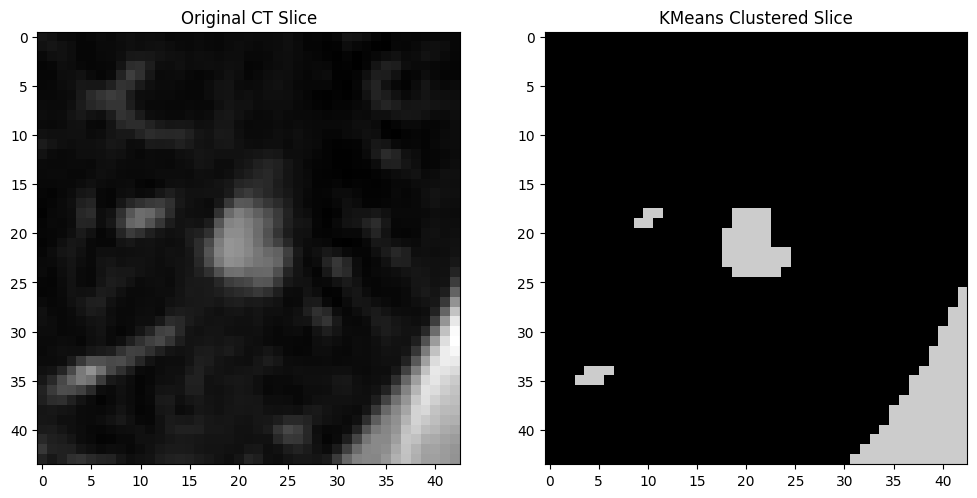

Completed segmentation for LIDC-IDRI-0124_R_13.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0208_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0208_R_1.nii.gz


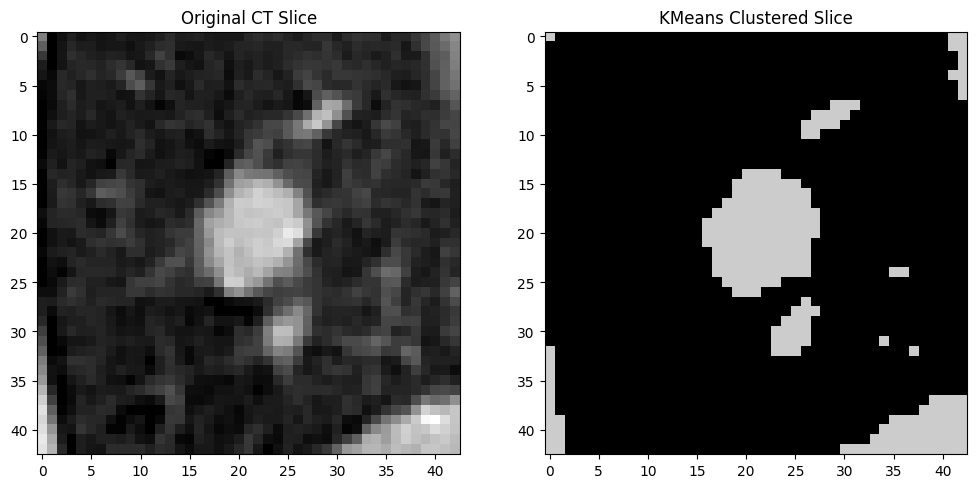

Completed segmentation for LIDC-IDRI-0208_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0466_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0466_R_2.nii.gz


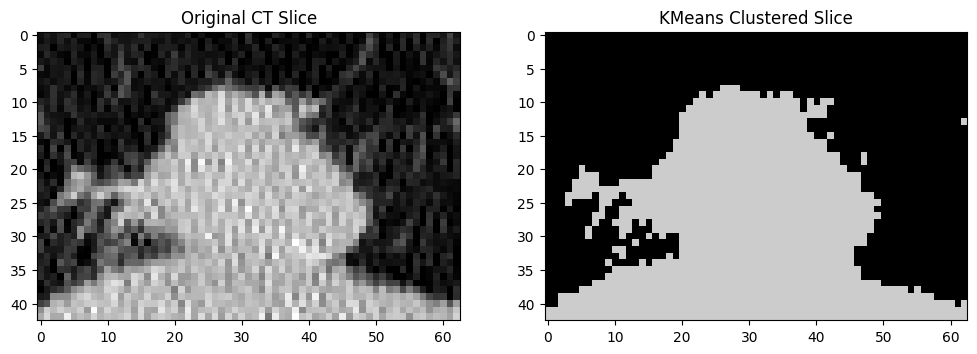

Completed segmentation for LIDC-IDRI-0466_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0617_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0617_R_2.nii.gz


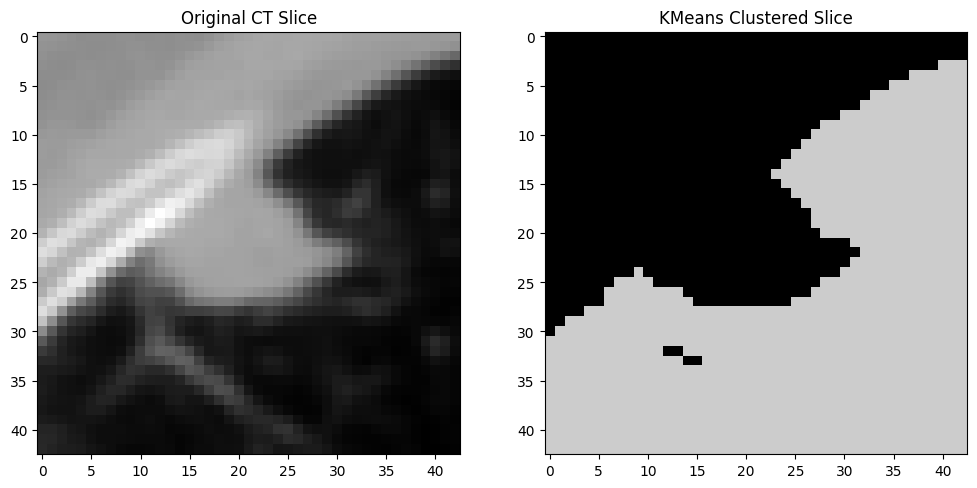

Completed segmentation for LIDC-IDRI-0617_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0605_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0605_R_4.nii.gz


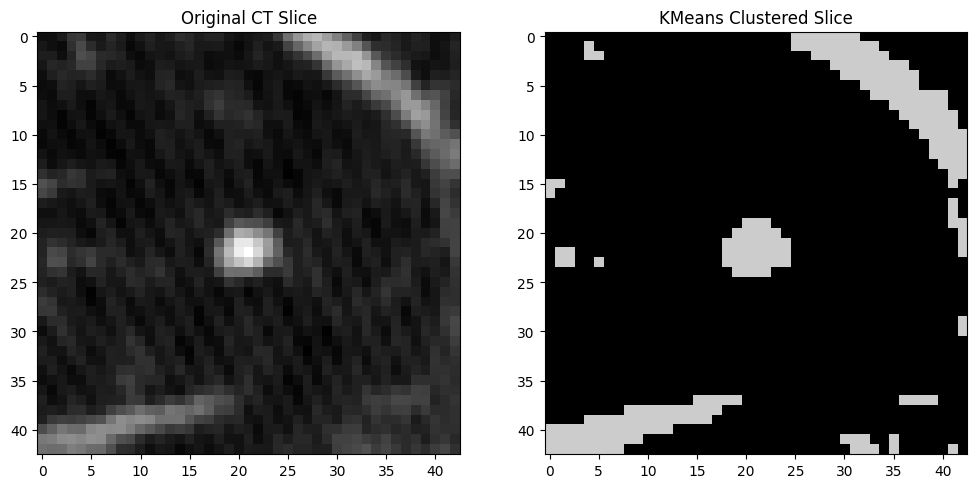

Completed segmentation for LIDC-IDRI-0605_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0649_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0649_R_2.nii.gz


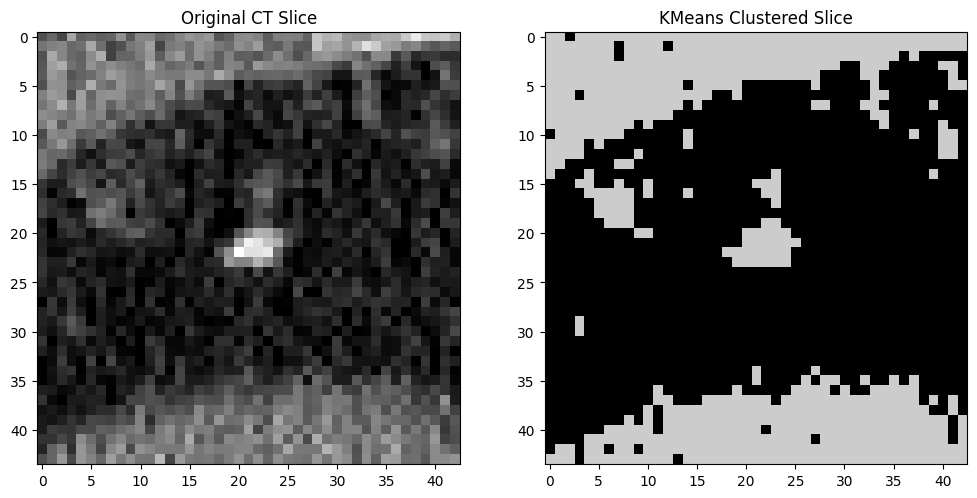

Completed segmentation for LIDC-IDRI-0649_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0454_R_7.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0454_R_7.nii.gz


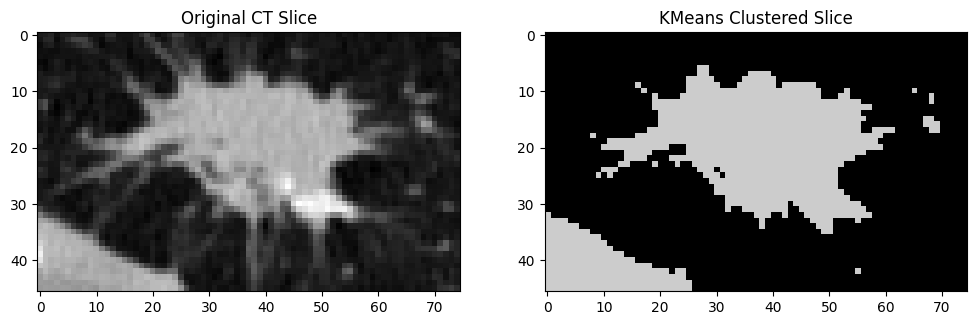

Completed segmentation for LIDC-IDRI-0454_R_7.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0565_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0565_R_4.nii.gz


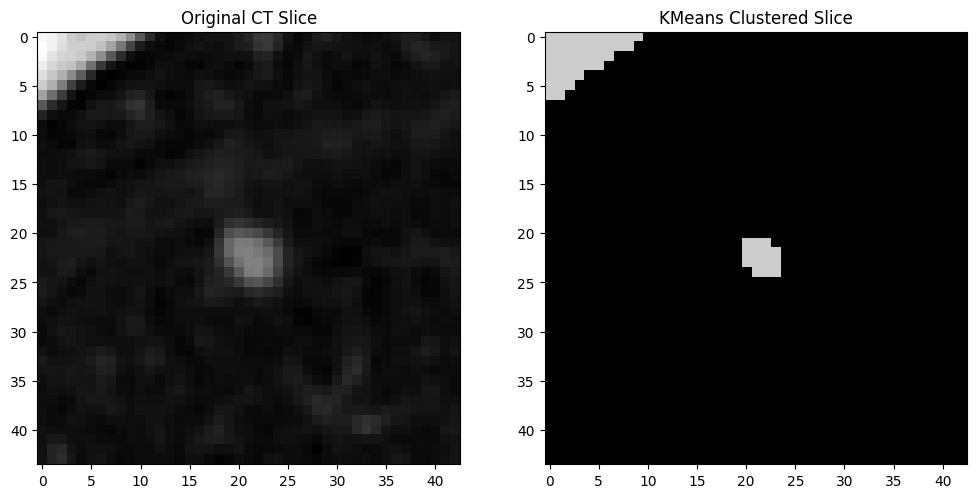

Completed segmentation for LIDC-IDRI-0565_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0587_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0587_R_1.nii.gz


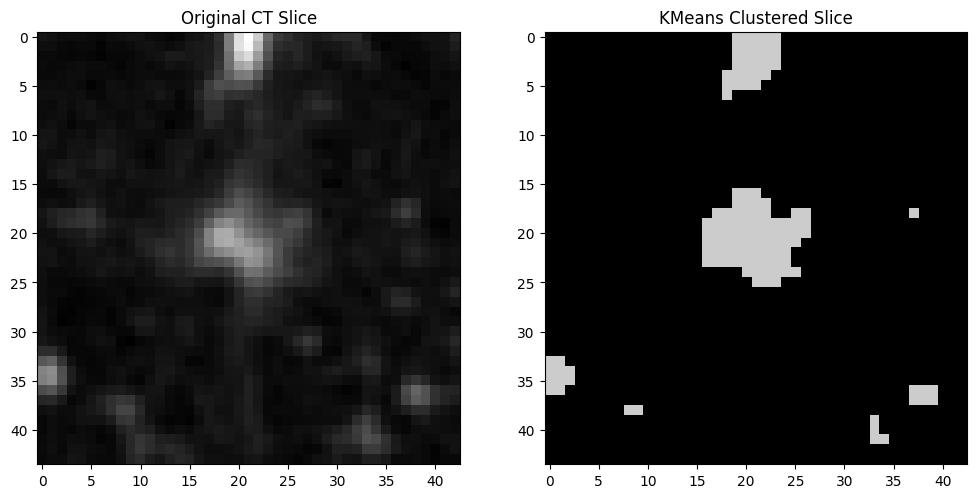

Completed segmentation for LIDC-IDRI-0587_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0294_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0294_R_2.nii.gz


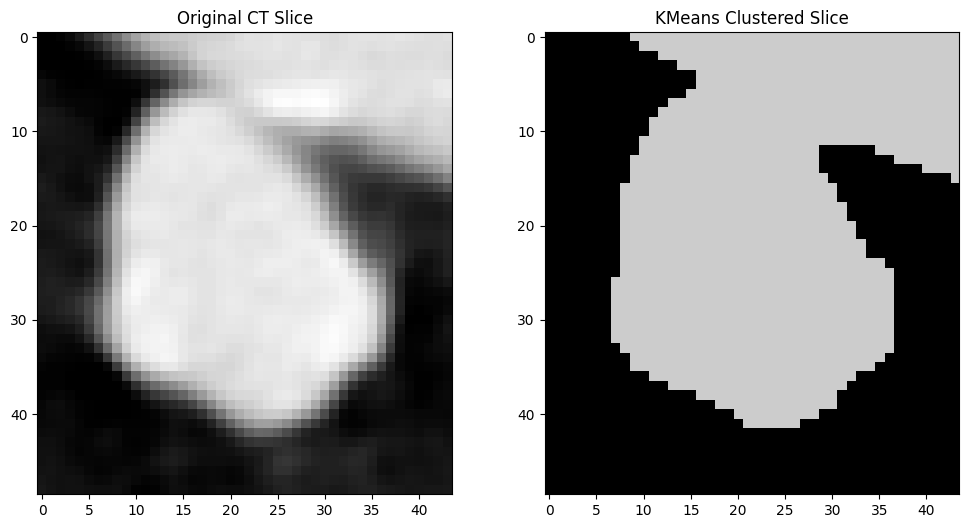

Completed segmentation for LIDC-IDRI-0294_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0458_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0458_R_2.nii.gz


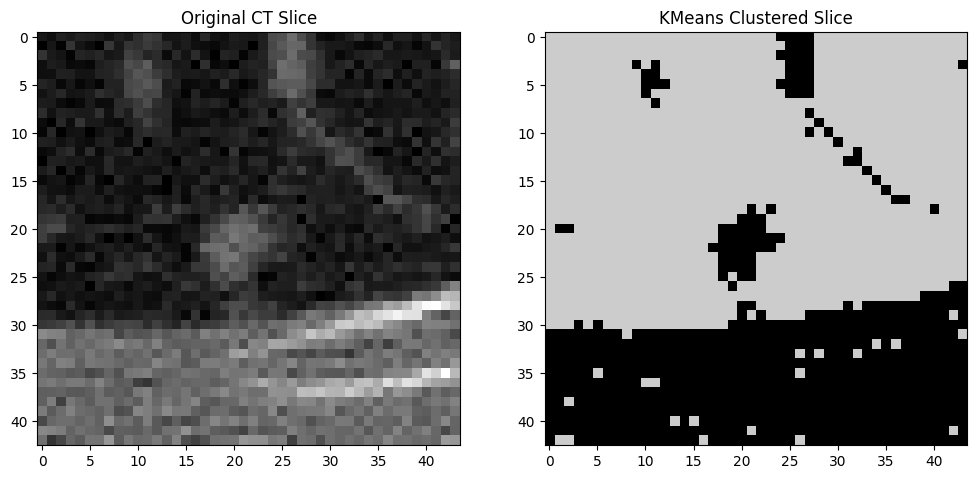

Completed segmentation for LIDC-IDRI-0458_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0644_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0644_R_1.nii.gz


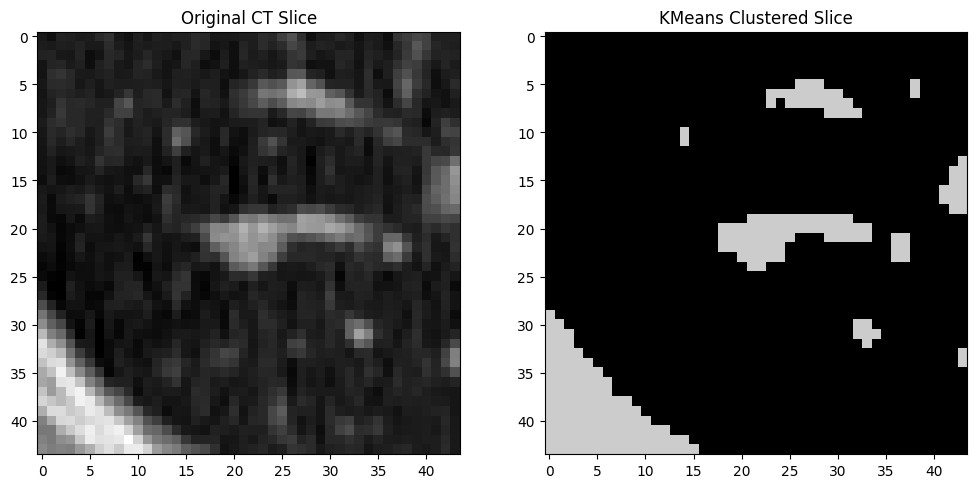

Completed segmentation for LIDC-IDRI-0644_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0309_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0309_R_2.nii.gz


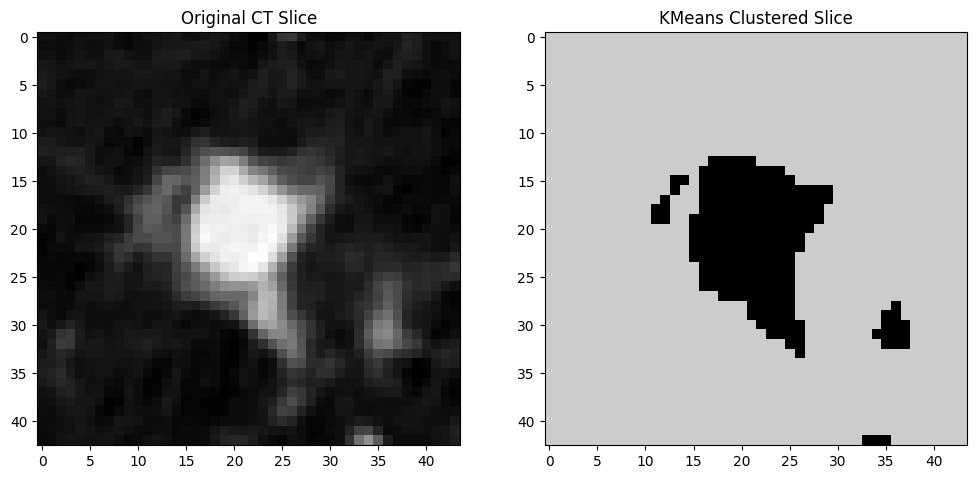

Completed segmentation for LIDC-IDRI-0309_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0641_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0641_R_5.nii.gz


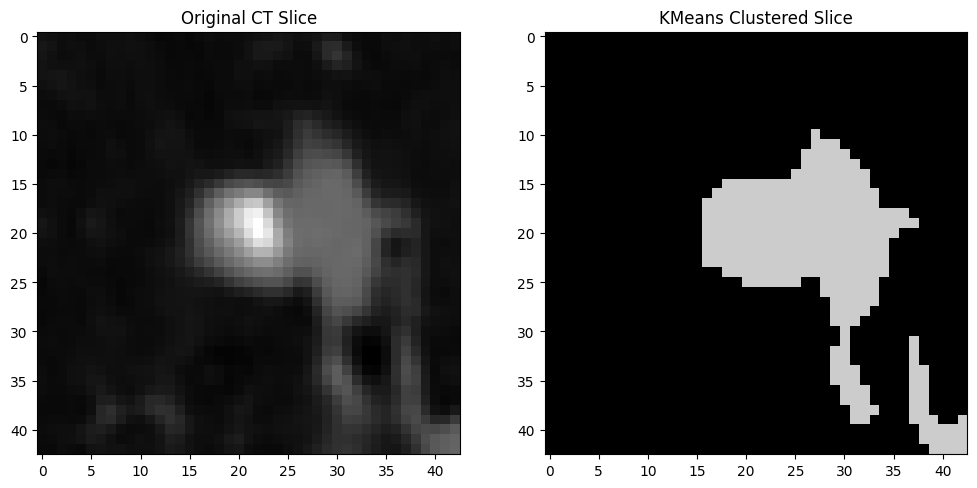

Completed segmentation for LIDC-IDRI-0641_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0524_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0524_R_1.nii.gz


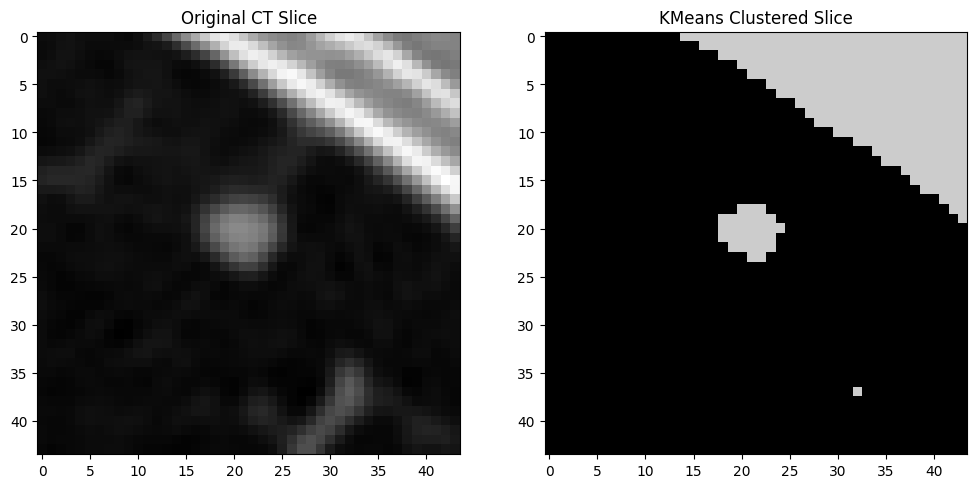

Completed segmentation for LIDC-IDRI-0524_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0148_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0148_R_3.nii.gz


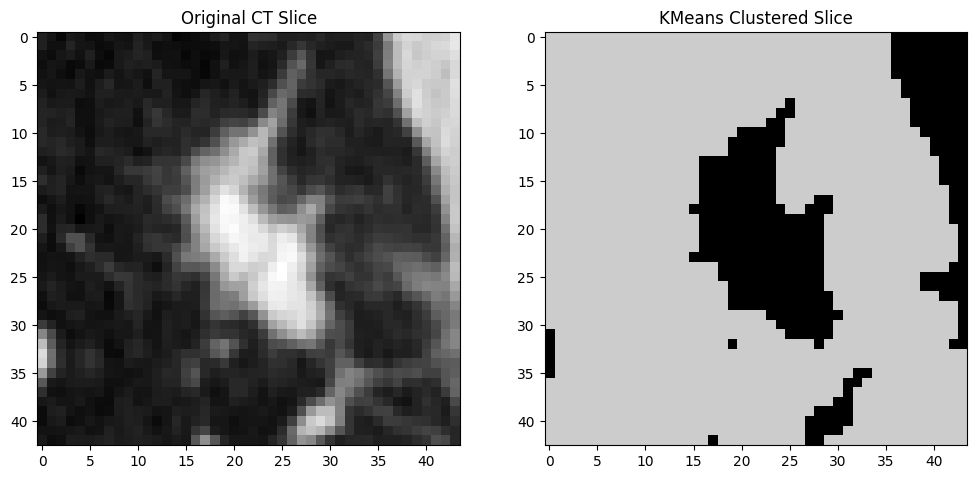

Completed segmentation for LIDC-IDRI-0148_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0485_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0485_R_5.nii.gz


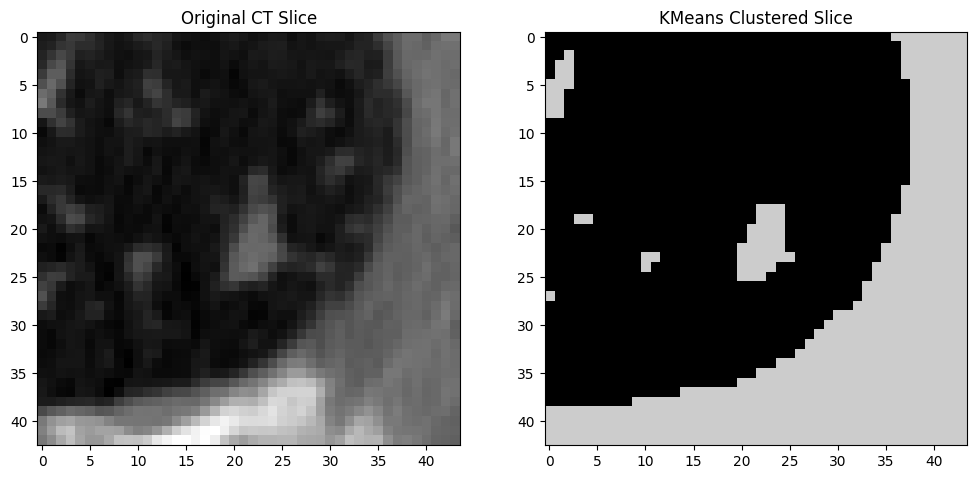

Completed segmentation for LIDC-IDRI-0485_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0510_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0510_R_4.nii.gz


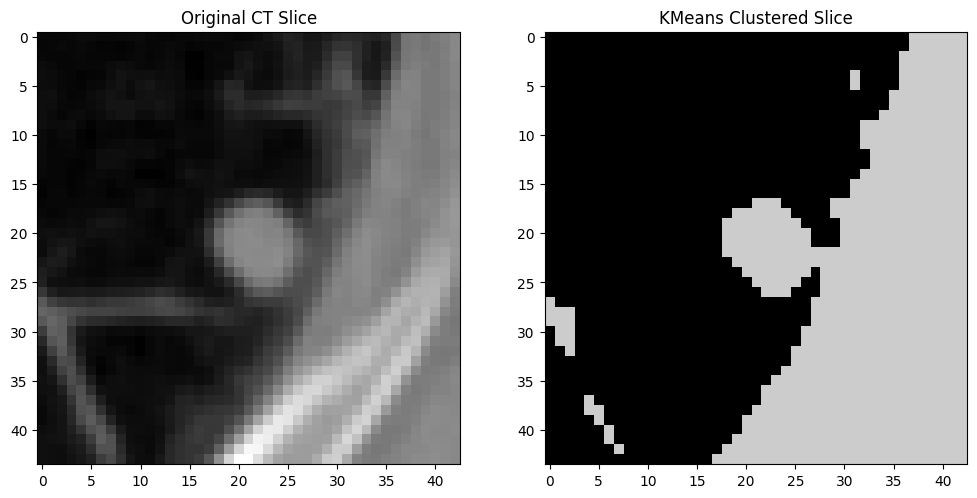

Completed segmentation for LIDC-IDRI-0510_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0430_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0430_R_1.nii.gz


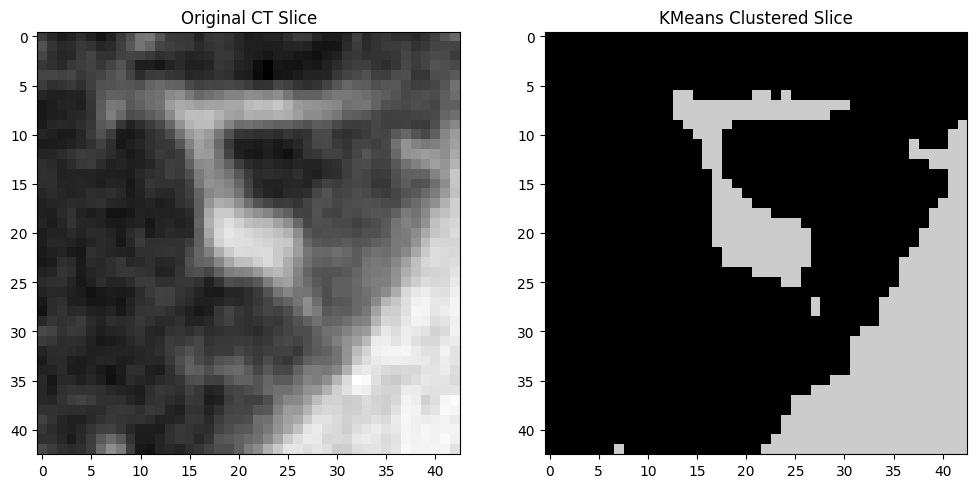

Completed segmentation for LIDC-IDRI-0430_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0386_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0386_R_4.nii.gz


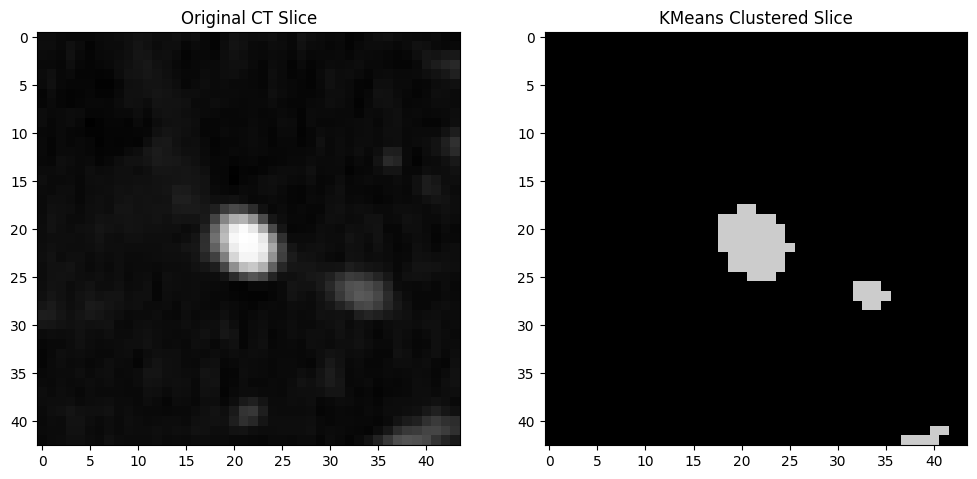

Completed segmentation for LIDC-IDRI-0386_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0660_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0660_R_5.nii.gz


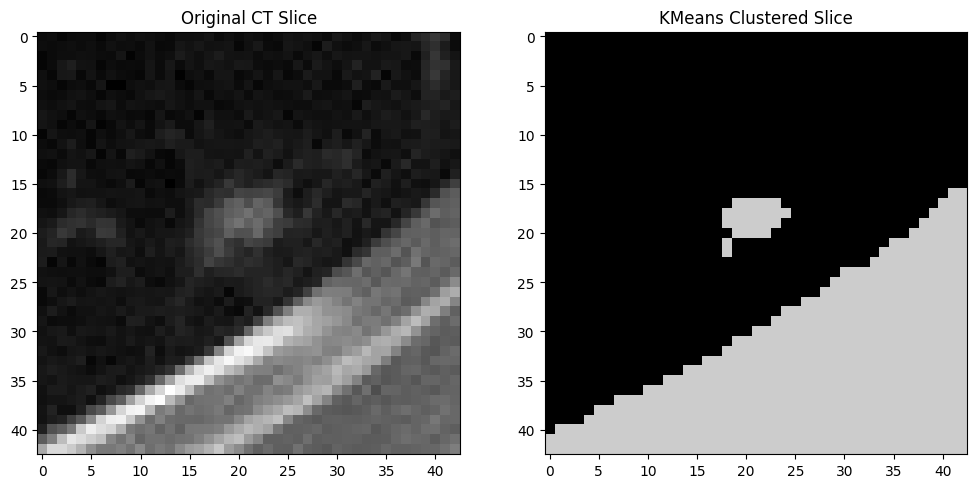

Completed segmentation for LIDC-IDRI-0660_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0353_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0353_R_2.nii.gz


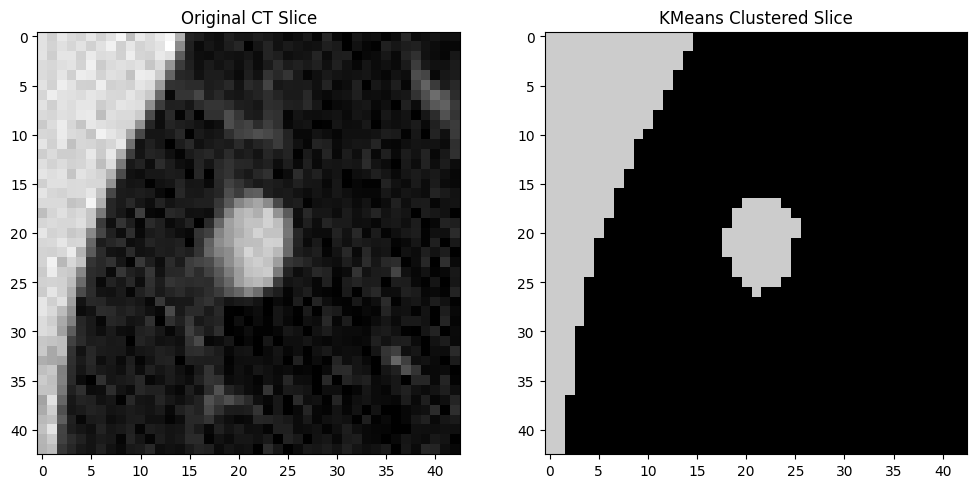

Completed segmentation for LIDC-IDRI-0353_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0590_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0590_R_1.nii.gz


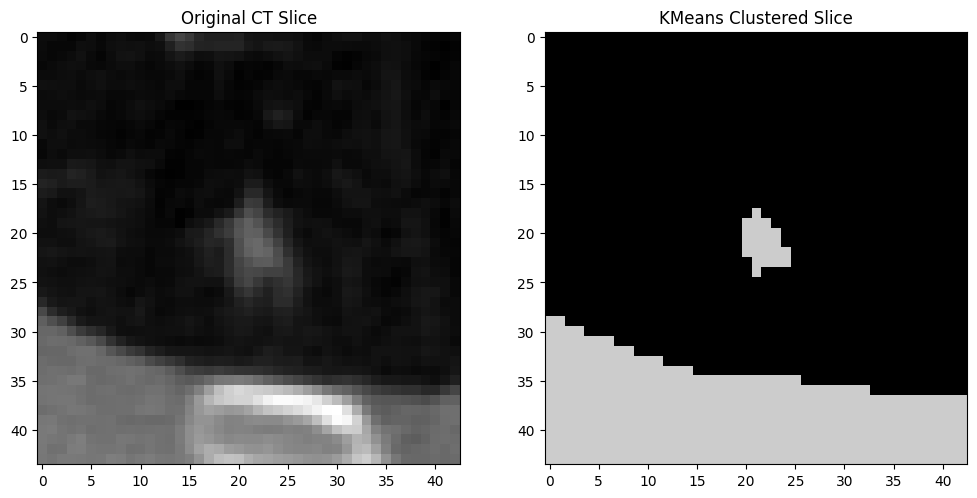

Completed segmentation for LIDC-IDRI-0590_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0184_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0184_R_1.nii.gz


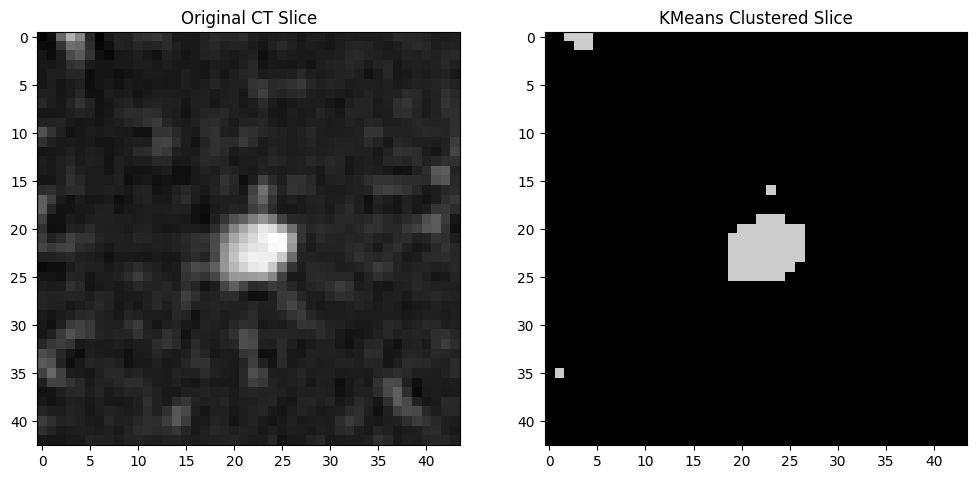

Completed segmentation for LIDC-IDRI-0184_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0285_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0285_R_1.nii.gz


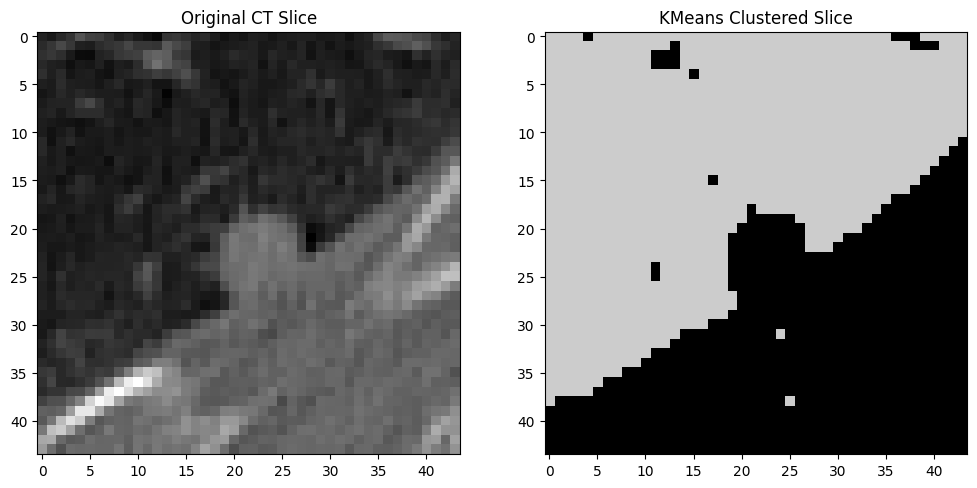

Completed segmentation for LIDC-IDRI-0285_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0169_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0169_R_2.nii.gz


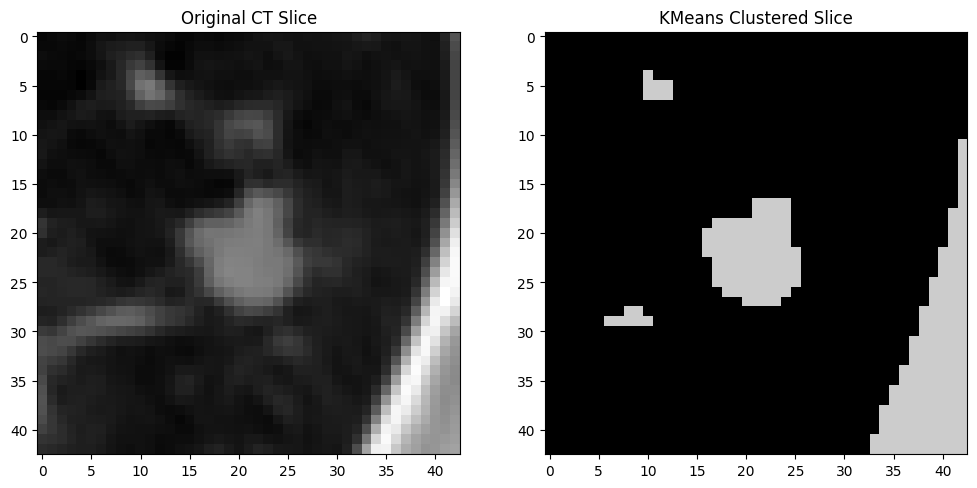

Completed segmentation for LIDC-IDRI-0169_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0416_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0416_R_1.nii.gz


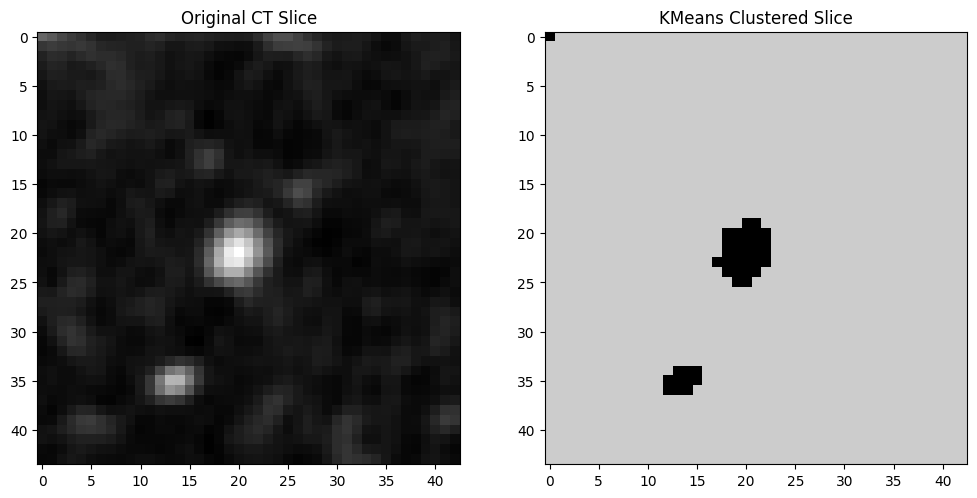

Completed segmentation for LIDC-IDRI-0416_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0164_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0164_R_5.nii.gz


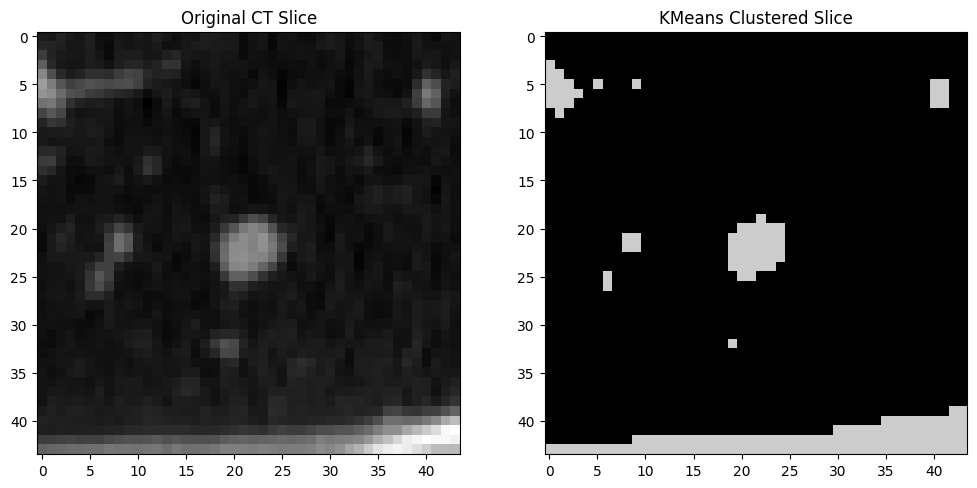

Completed segmentation for LIDC-IDRI-0164_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0362_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0362_R_2.nii.gz


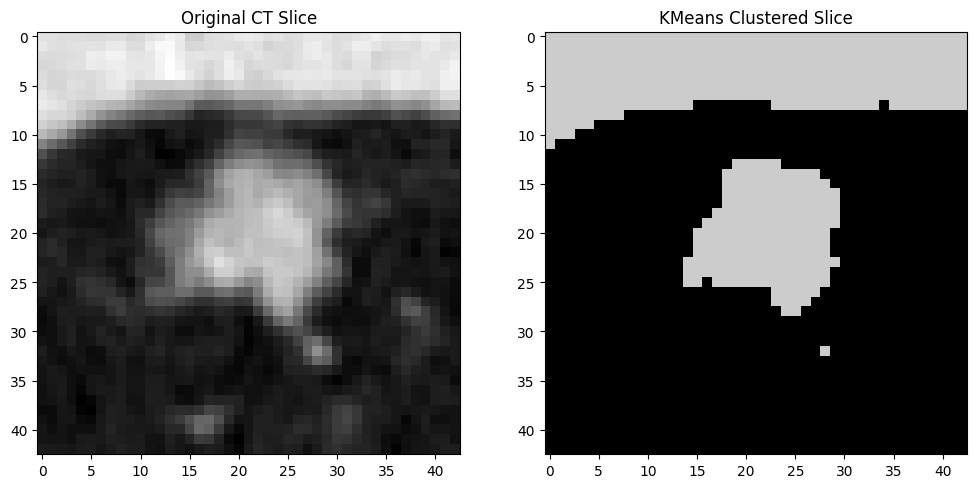

Completed segmentation for LIDC-IDRI-0362_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0469_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0469_R_1.nii.gz


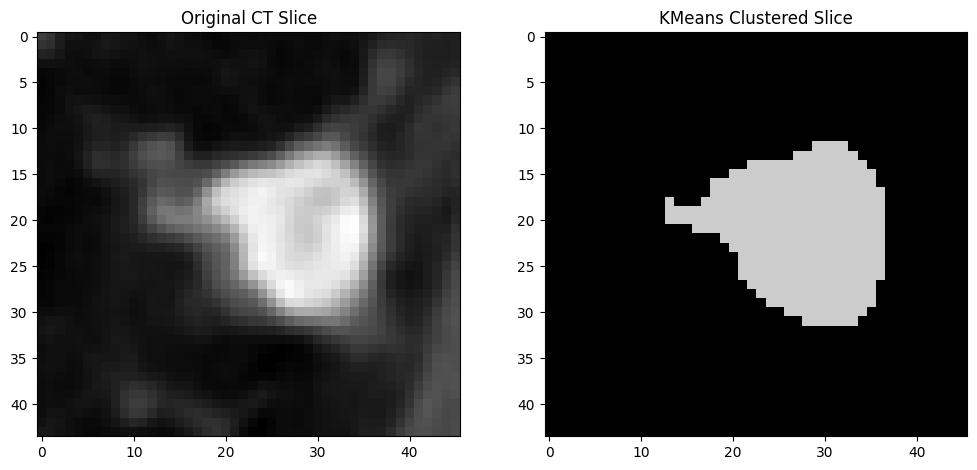

Completed segmentation for LIDC-IDRI-0469_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0241_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0241_R_5.nii.gz


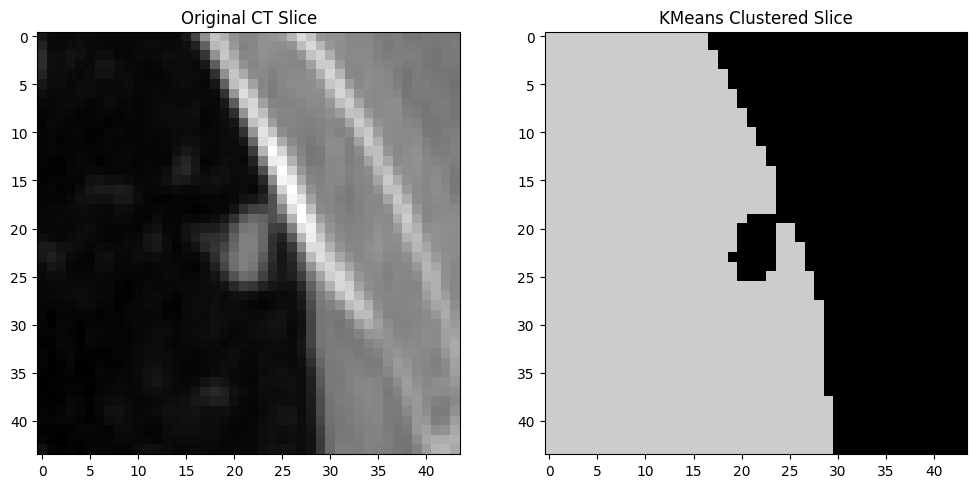

Completed segmentation for LIDC-IDRI-0241_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0605_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0605_R_1.nii.gz


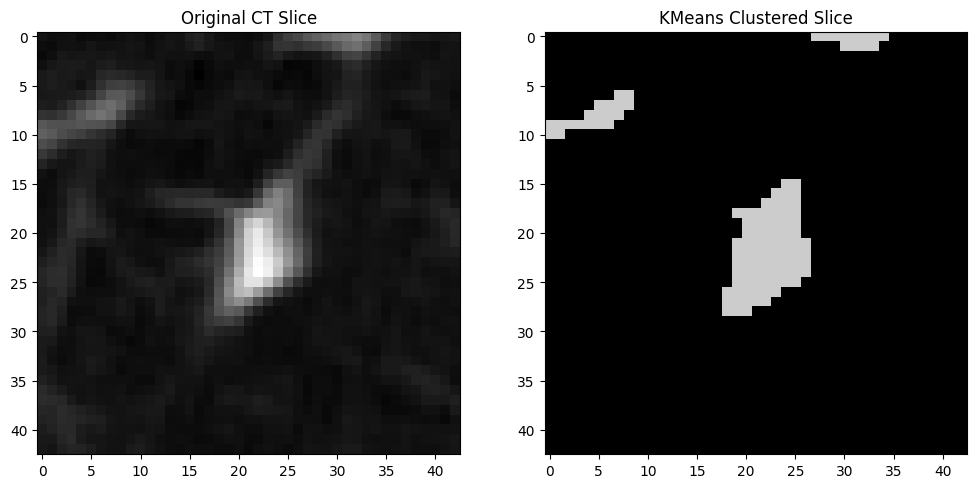

Completed segmentation for LIDC-IDRI-0605_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0282_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0282_R_1.nii.gz


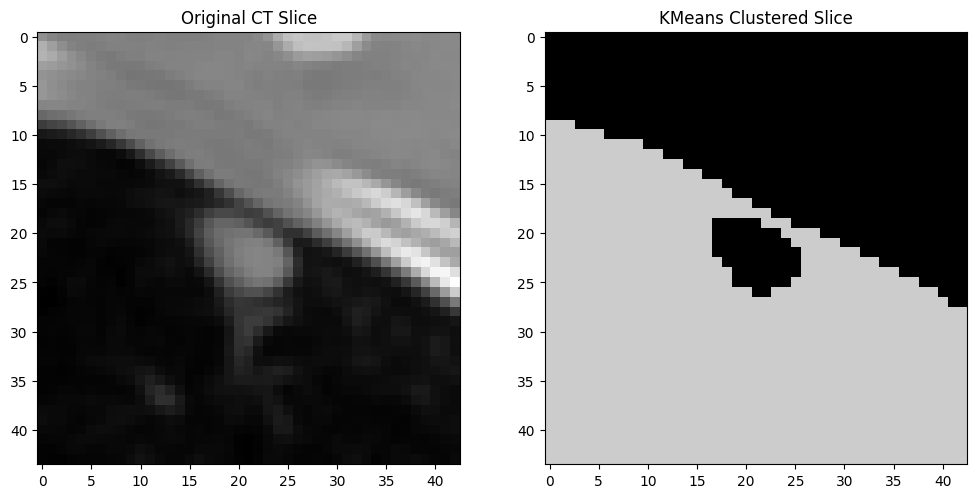

Completed segmentation for LIDC-IDRI-0282_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0450_R_9.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0450_R_9.nii.gz


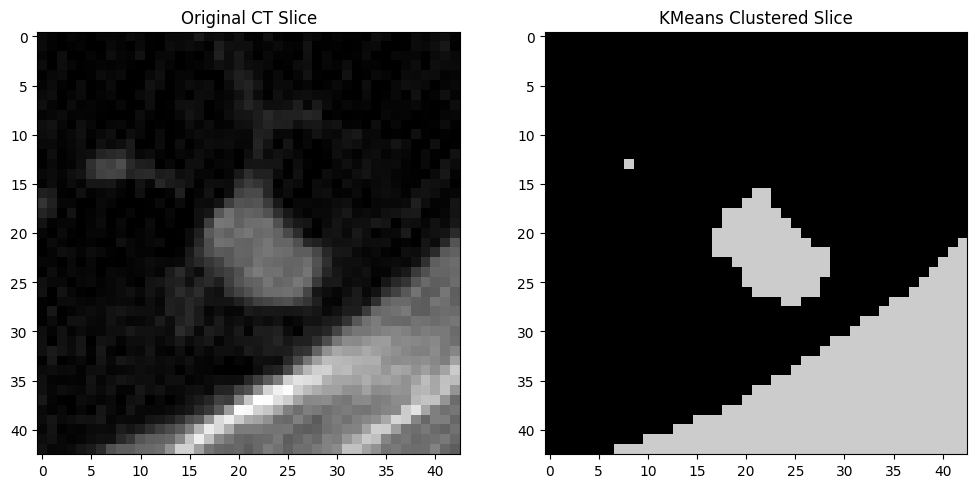

Completed segmentation for LIDC-IDRI-0450_R_9.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0434_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0434_R_1.nii.gz


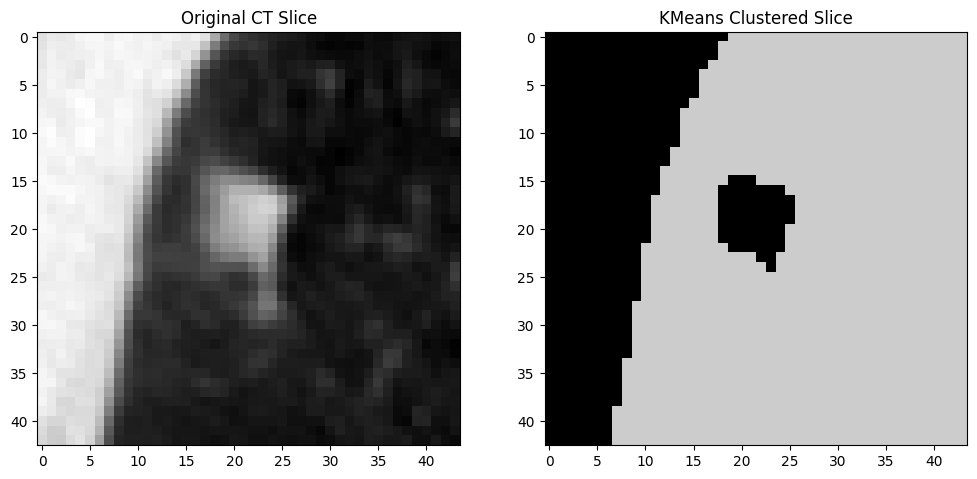

Completed segmentation for LIDC-IDRI-0434_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0186_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0186_R_5.nii.gz


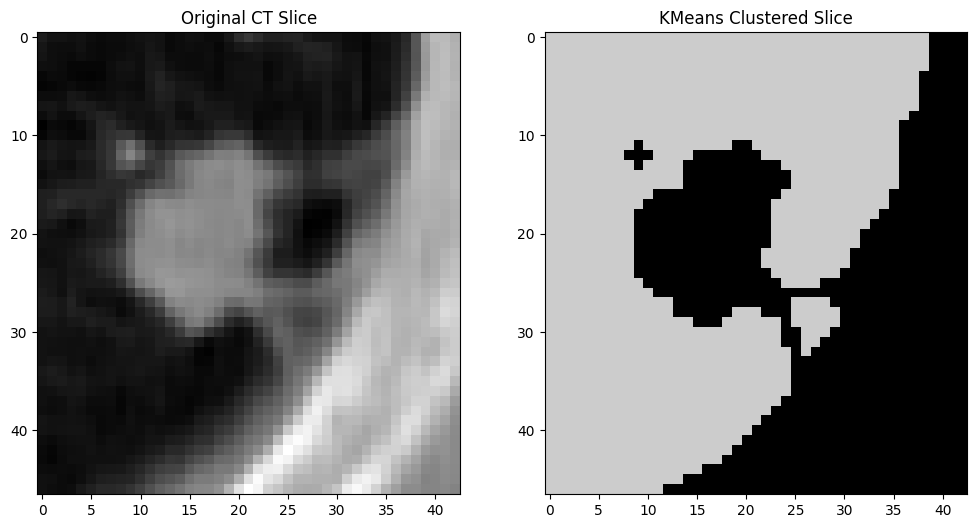

Completed segmentation for LIDC-IDRI-0186_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0568_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0568_R_2.nii.gz


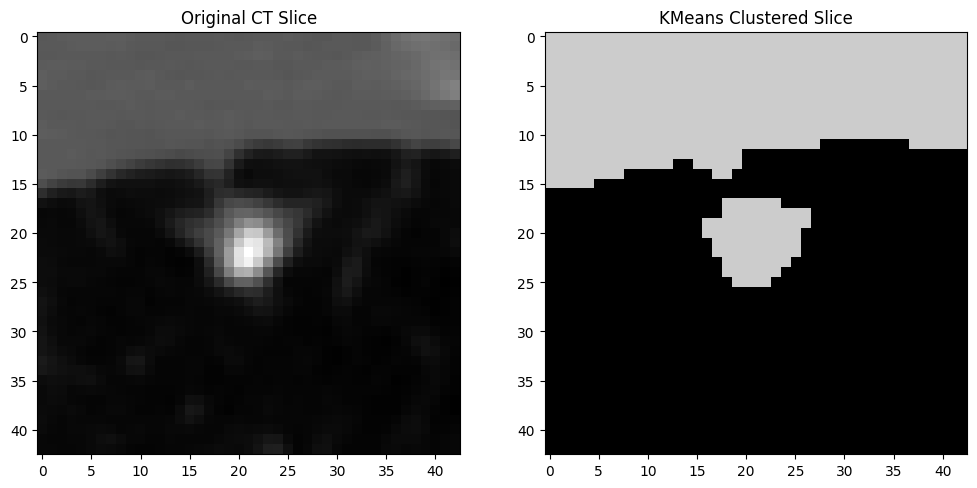

Completed segmentation for LIDC-IDRI-0568_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0437_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0437_R_3.nii.gz


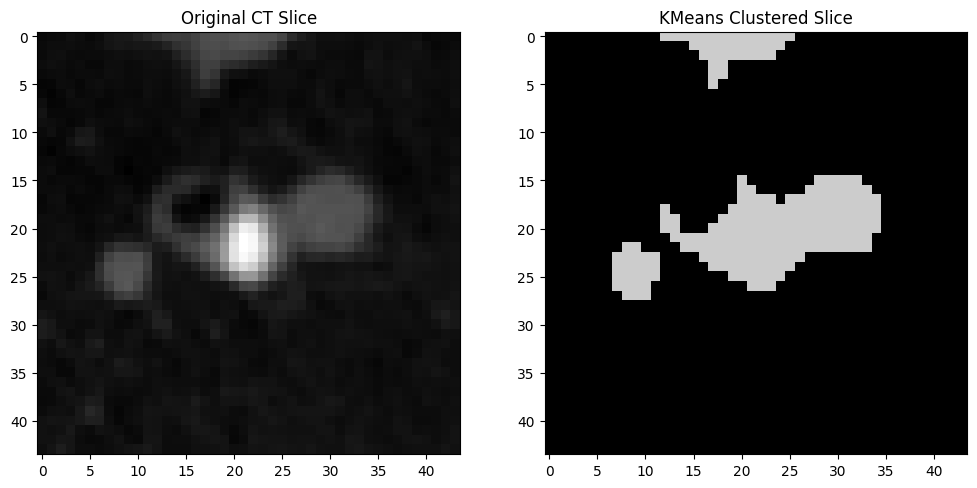

Completed segmentation for LIDC-IDRI-0437_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0492_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0492_R_2.nii.gz


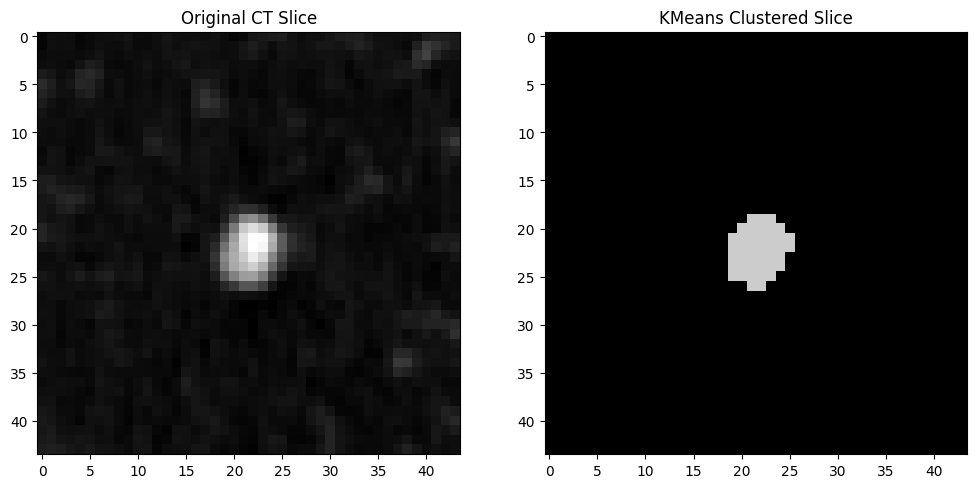

Completed segmentation for LIDC-IDRI-0492_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0356_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0356_R_3.nii.gz


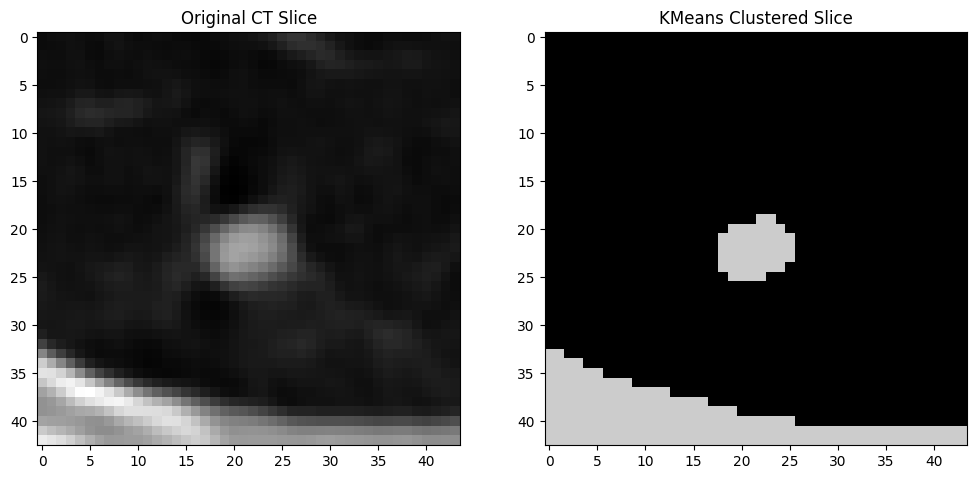

Completed segmentation for LIDC-IDRI-0356_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0220_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0220_R_1.nii.gz


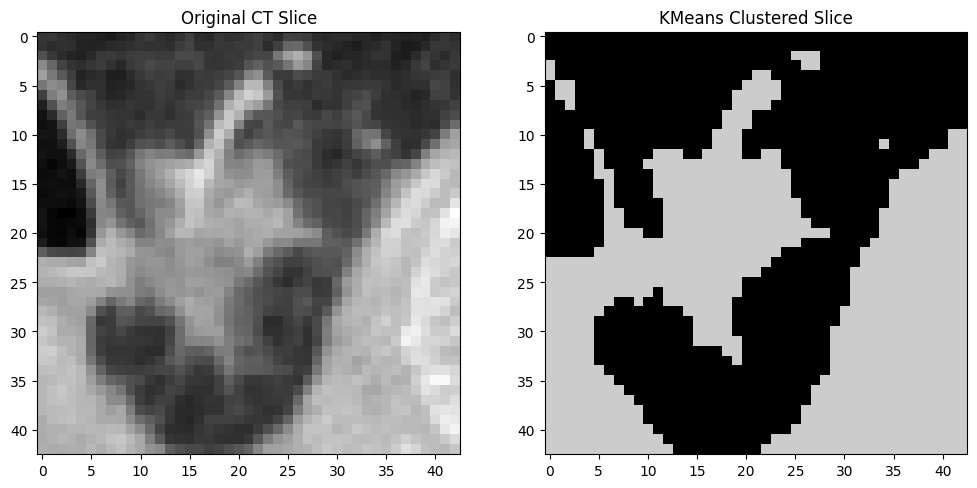

Completed segmentation for LIDC-IDRI-0220_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0698_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0698_R_2.nii.gz


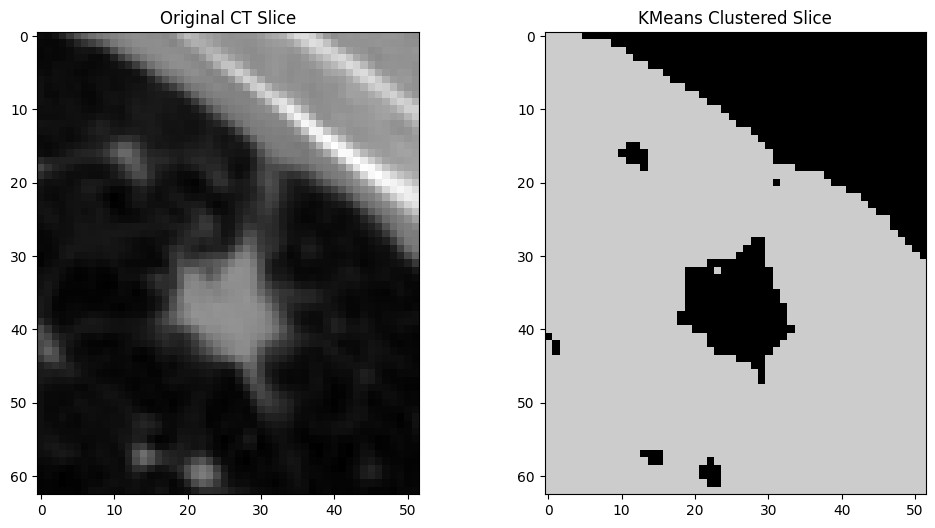

Completed segmentation for LIDC-IDRI-0698_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0487_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0487_R_6.nii.gz


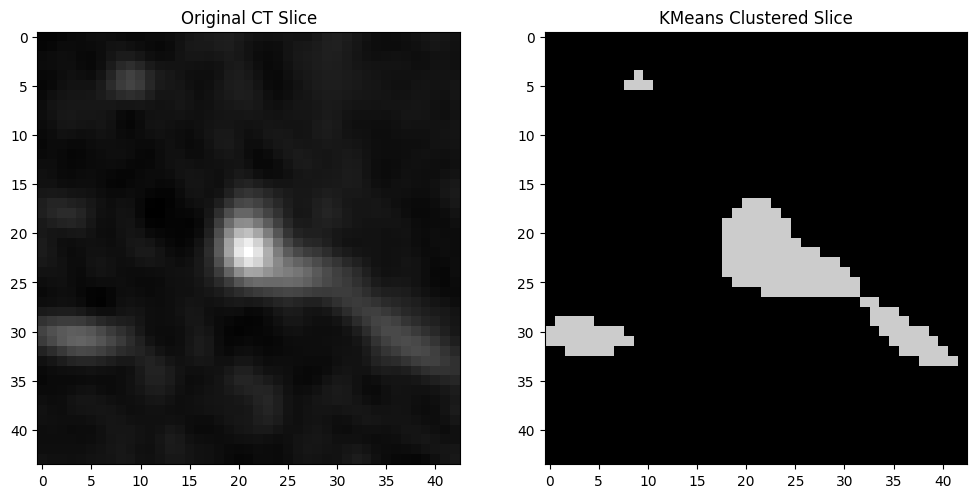

Completed segmentation for LIDC-IDRI-0487_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0380_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0380_R_1.nii.gz


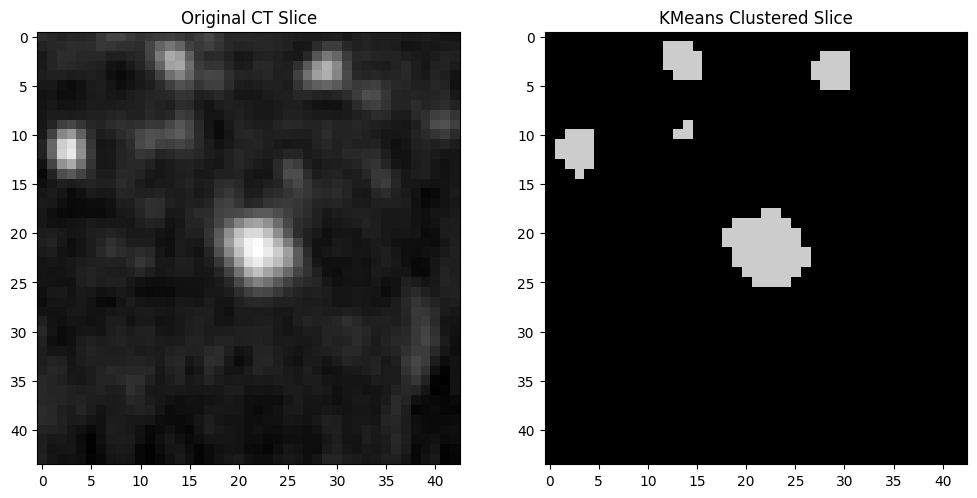

Completed segmentation for LIDC-IDRI-0380_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0649_R_8.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0649_R_8.nii.gz


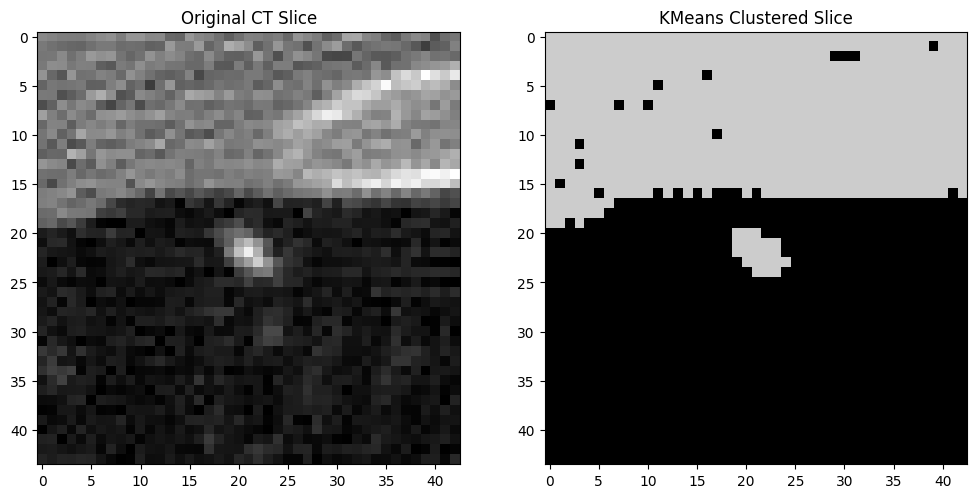

Completed segmentation for LIDC-IDRI-0649_R_8.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0688_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0688_R_3.nii.gz


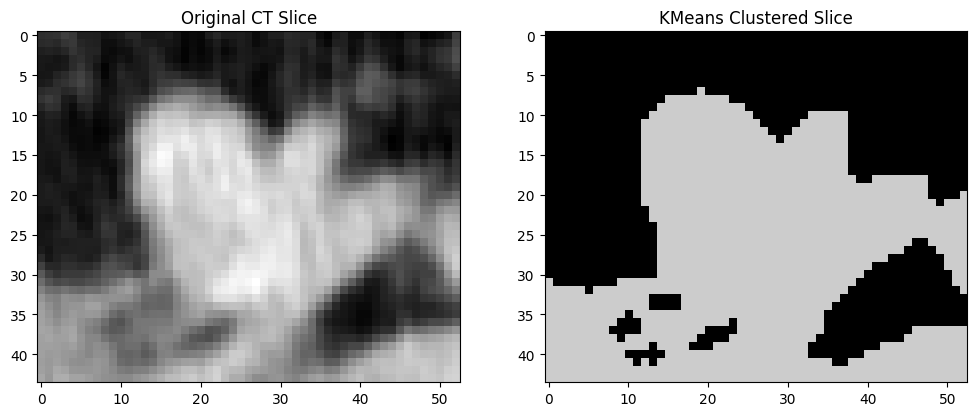

Completed segmentation for LIDC-IDRI-0688_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0237_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0237_R_2.nii.gz


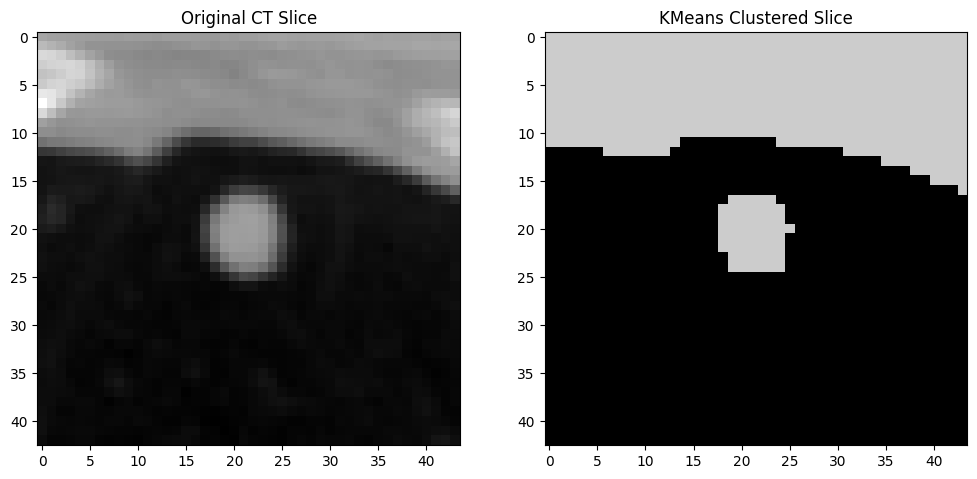

Completed segmentation for LIDC-IDRI-0237_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0341_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0341_R_4.nii.gz


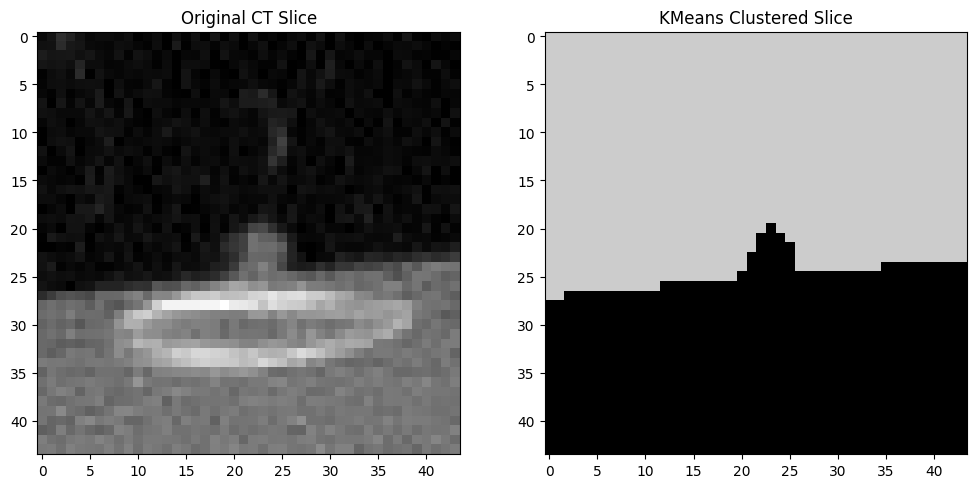

Completed segmentation for LIDC-IDRI-0341_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0260_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0260_R_3.nii.gz


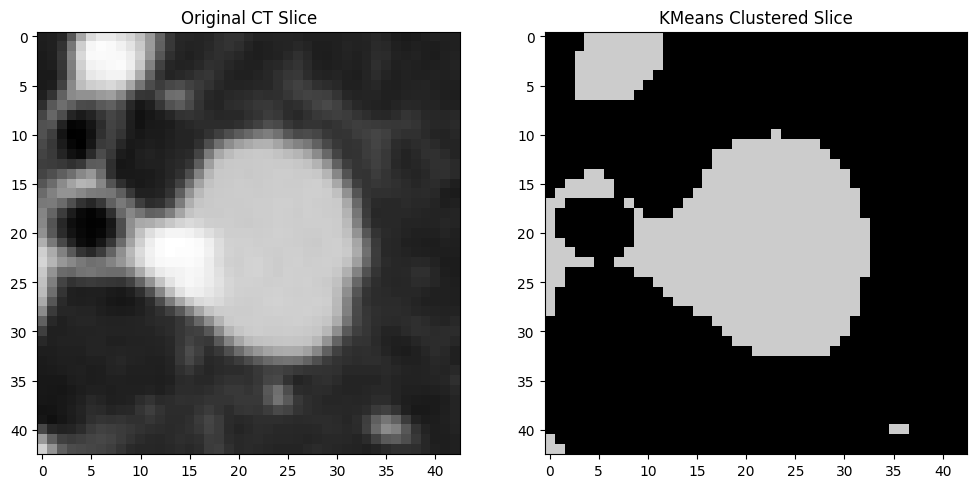

Completed segmentation for LIDC-IDRI-0260_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0257_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0257_R_1.nii.gz


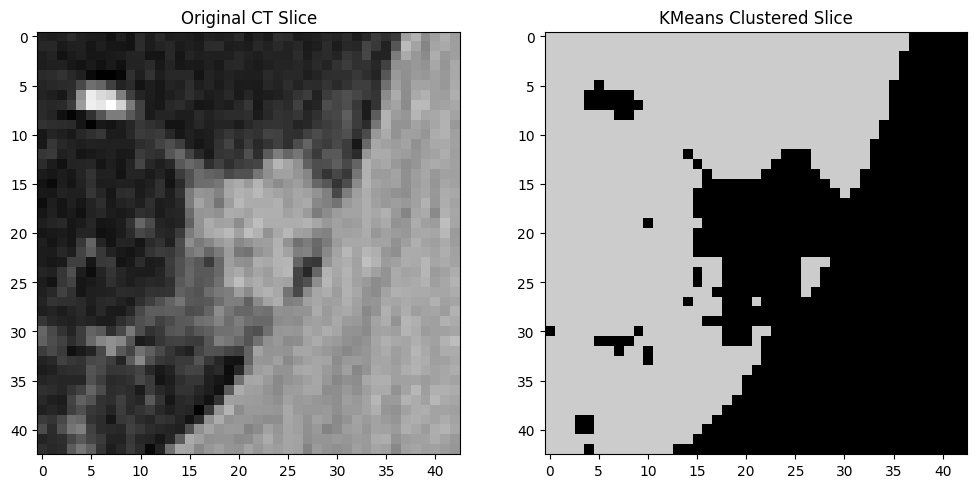

Completed segmentation for LIDC-IDRI-0257_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0450_R_8.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0450_R_8.nii.gz


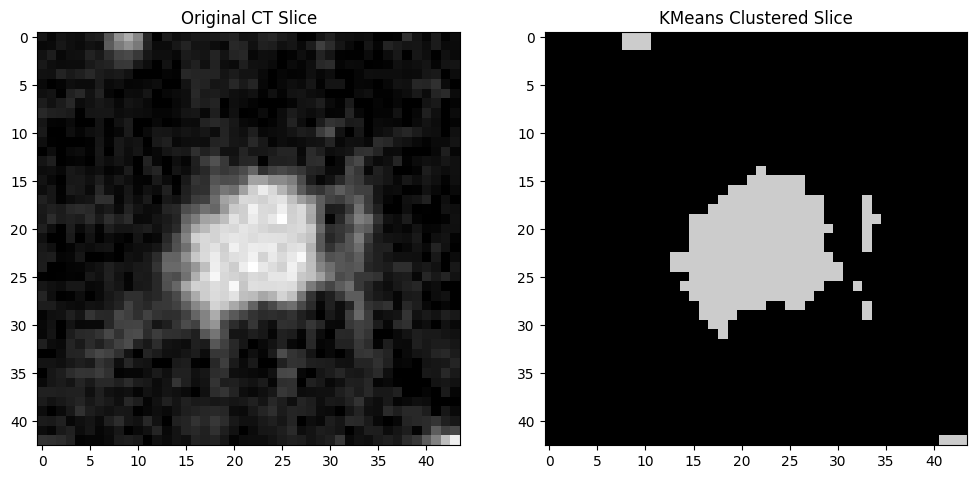

Completed segmentation for LIDC-IDRI-0450_R_8.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0211_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0211_R_1.nii.gz


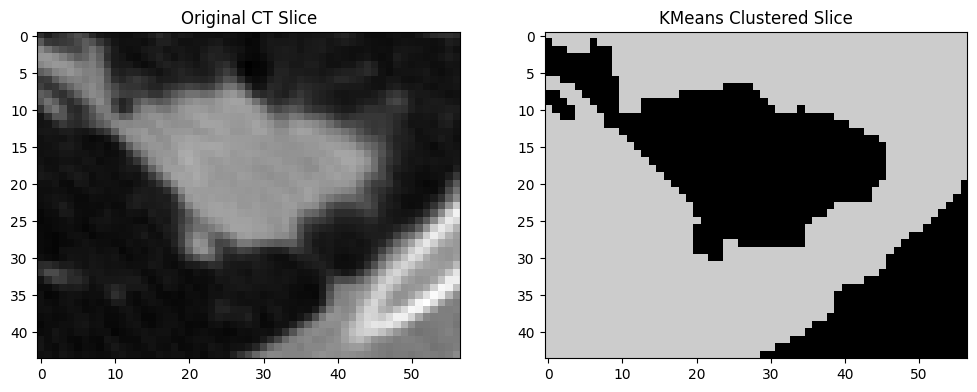

Completed segmentation for LIDC-IDRI-0211_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0353_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0353_R_3.nii.gz


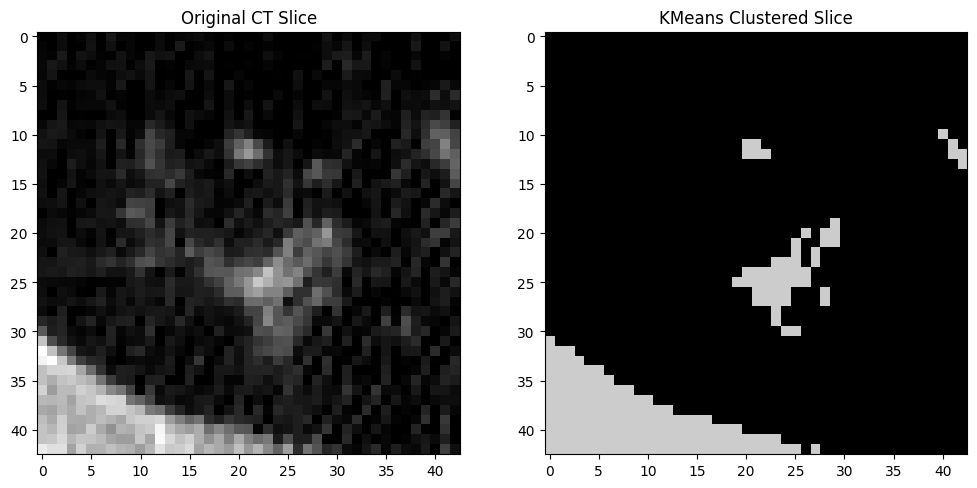

Completed segmentation for LIDC-IDRI-0353_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0473_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0473_R_1.nii.gz


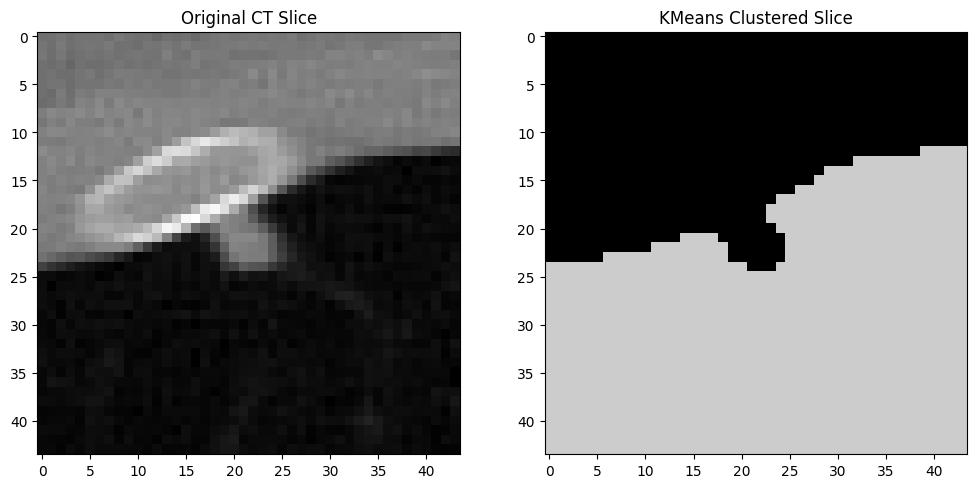

Completed segmentation for LIDC-IDRI-0473_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0510_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0510_R_1.nii.gz


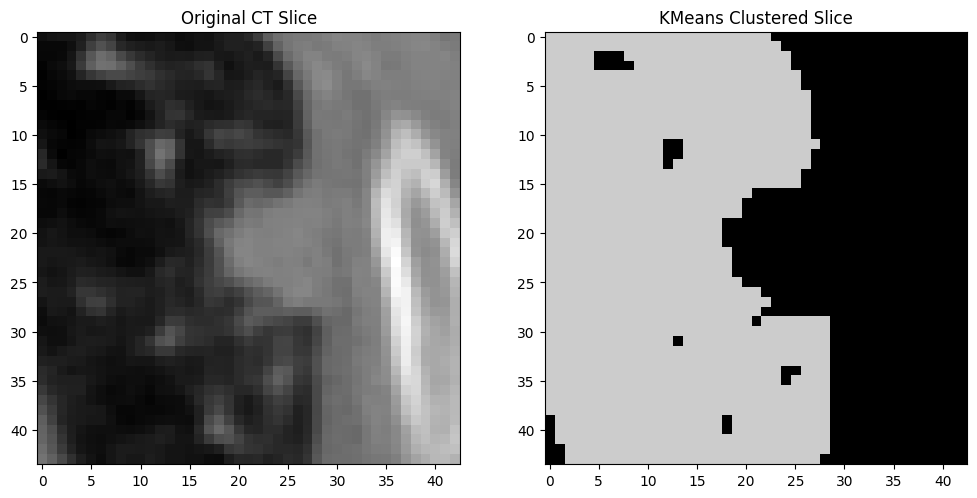

Completed segmentation for LIDC-IDRI-0510_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0385_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0385_R_1.nii.gz


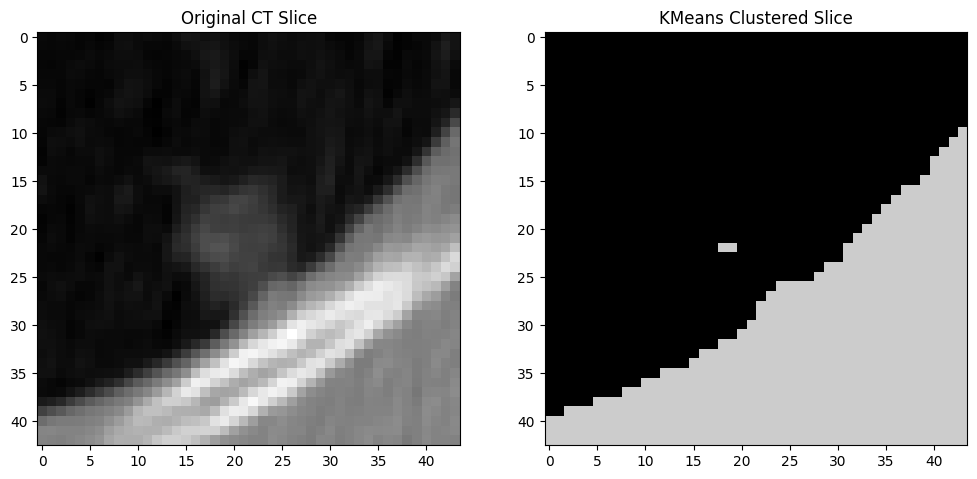

Completed segmentation for LIDC-IDRI-0385_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0601_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0601_R_4.nii.gz


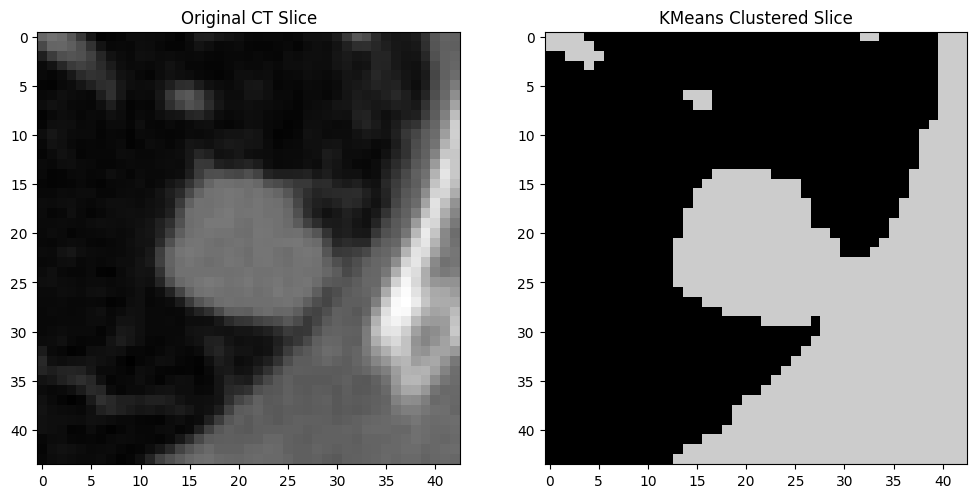

Completed segmentation for LIDC-IDRI-0601_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0452_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0452_R_3.nii.gz


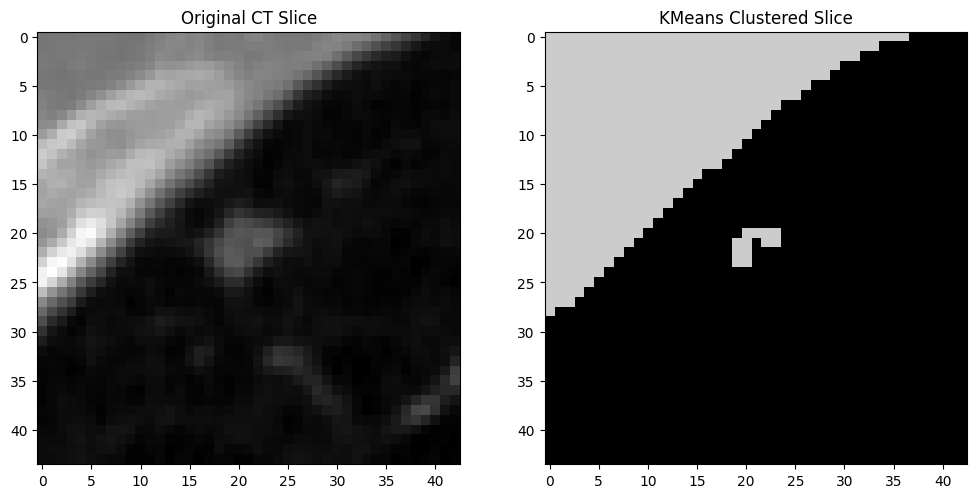

Completed segmentation for LIDC-IDRI-0452_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0655_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0655_R_5.nii.gz


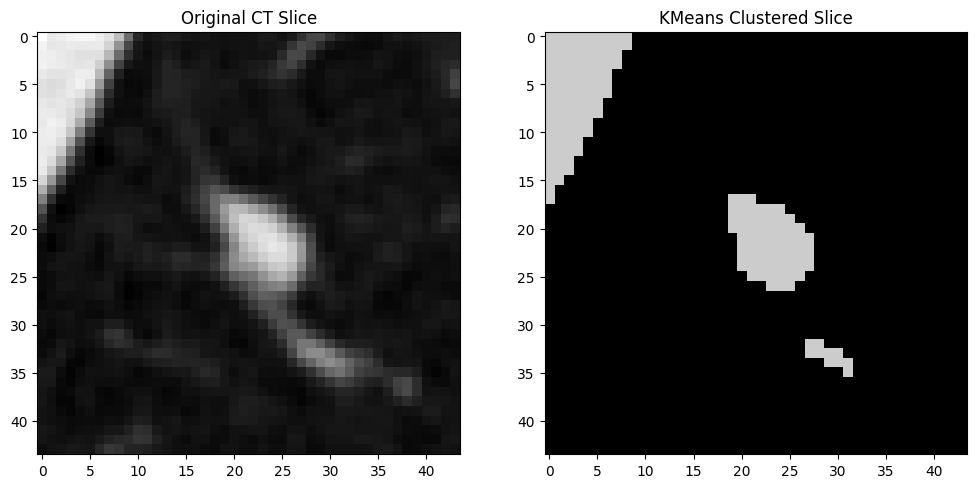

Completed segmentation for LIDC-IDRI-0655_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0655_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0655_R_6.nii.gz


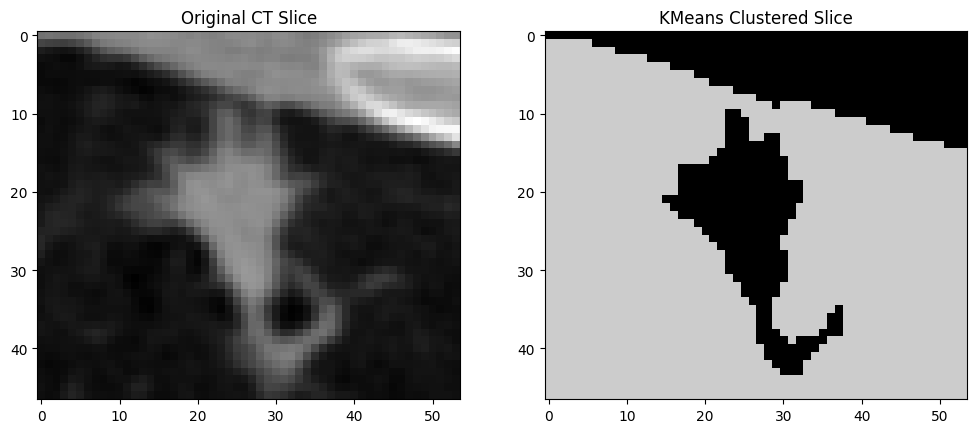

Completed segmentation for LIDC-IDRI-0655_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0686_R_8.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0686_R_8.nii.gz


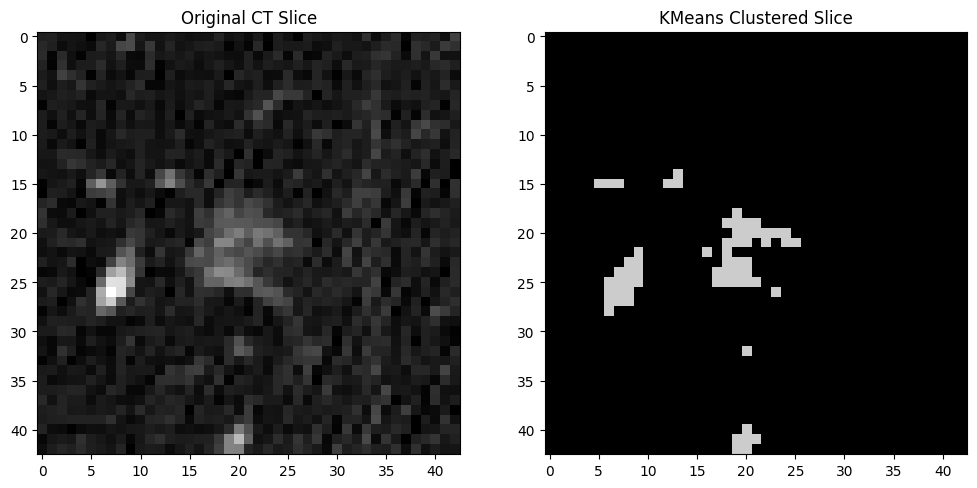

Completed segmentation for LIDC-IDRI-0686_R_8.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0686_R_15.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0686_R_15.nii.gz


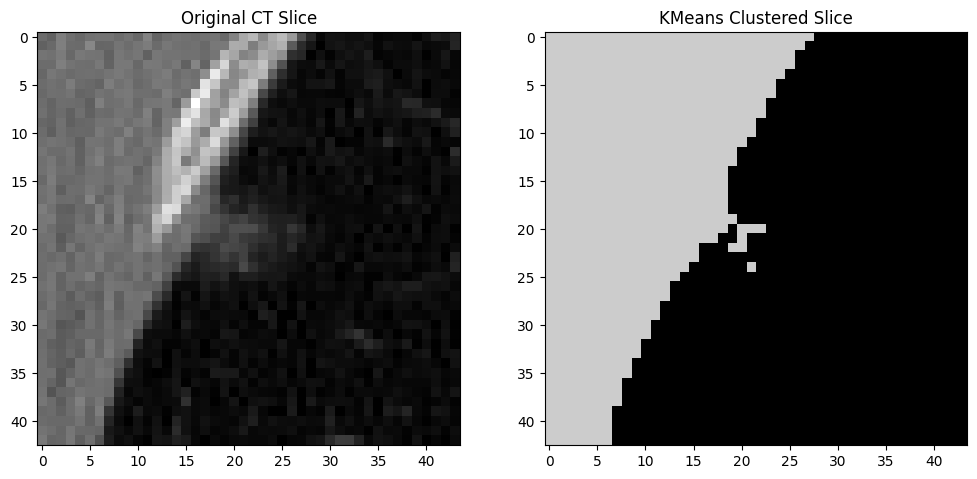

Completed segmentation for LIDC-IDRI-0686_R_15.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0217_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0217_R_1.nii.gz


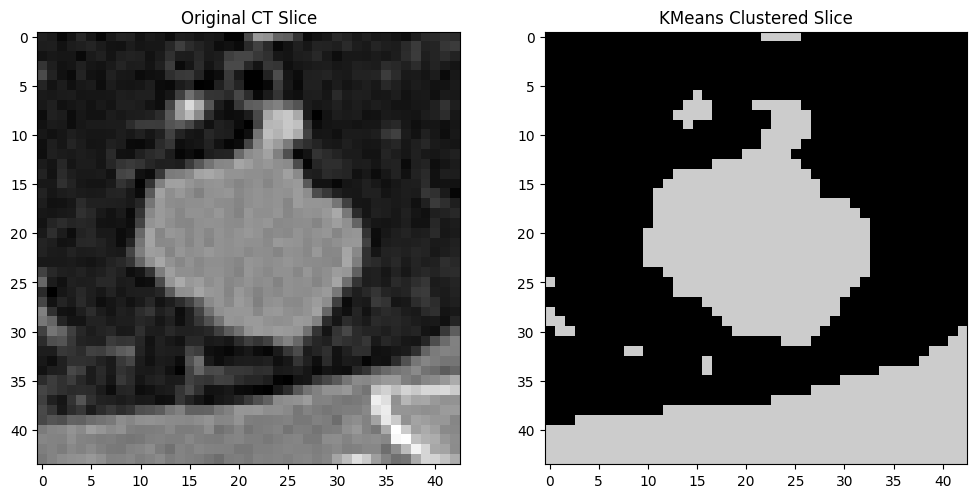

Completed segmentation for LIDC-IDRI-0217_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0485_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0485_R_4.nii.gz


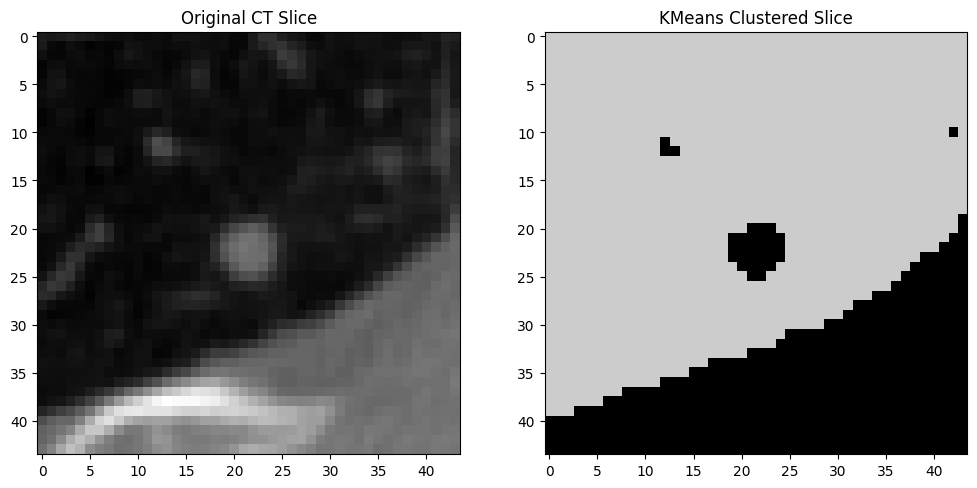

Completed segmentation for LIDC-IDRI-0485_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0191_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0191_R_1.nii.gz


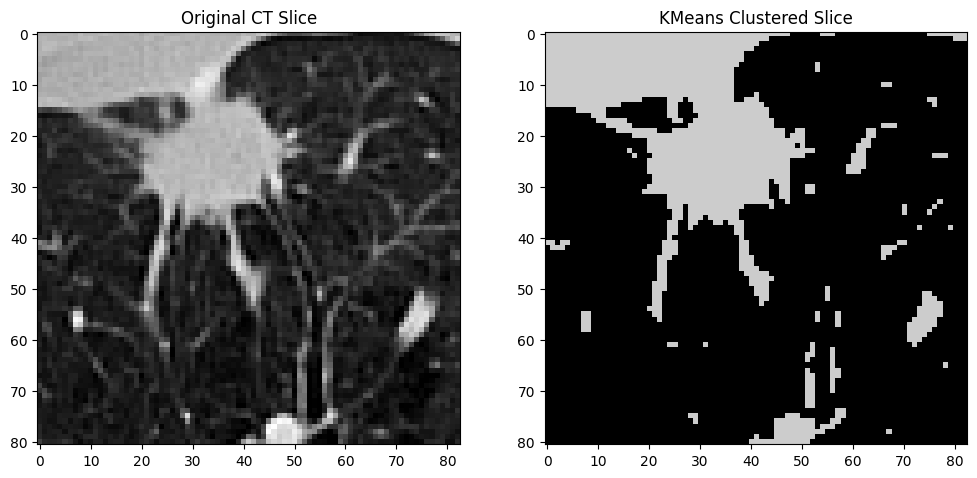

Completed segmentation for LIDC-IDRI-0191_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0547_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0547_R_2.nii.gz


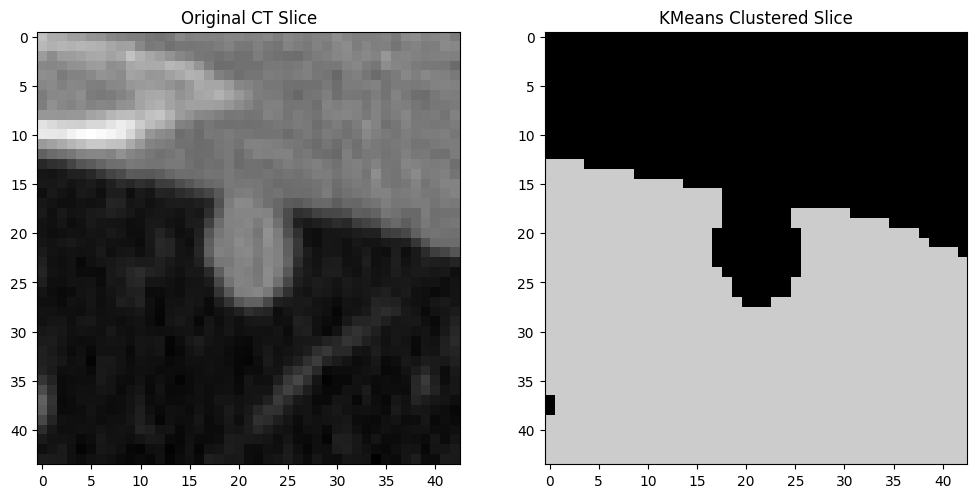

Completed segmentation for LIDC-IDRI-0547_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0663_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0663_R_2.nii.gz


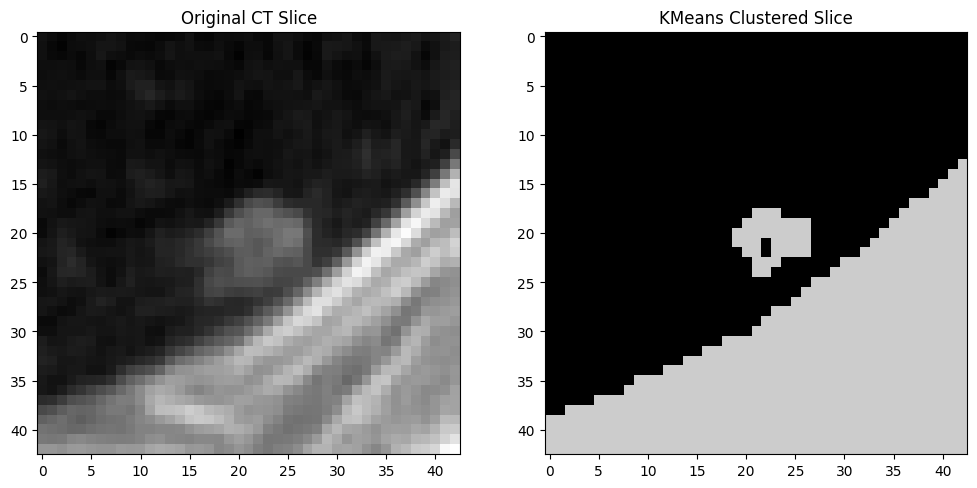

Completed segmentation for LIDC-IDRI-0663_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0175_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0175_R_1.nii.gz


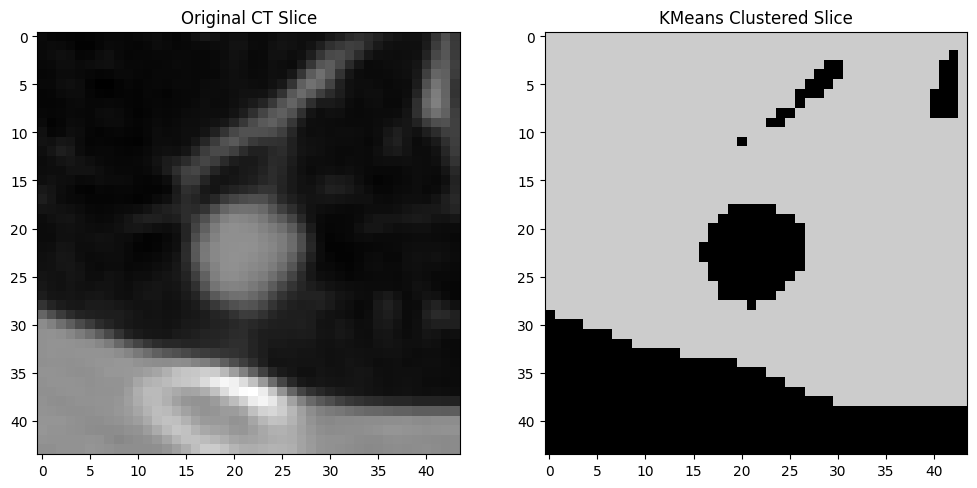

Completed segmentation for LIDC-IDRI-0175_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0476_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0476_R_1.nii.gz


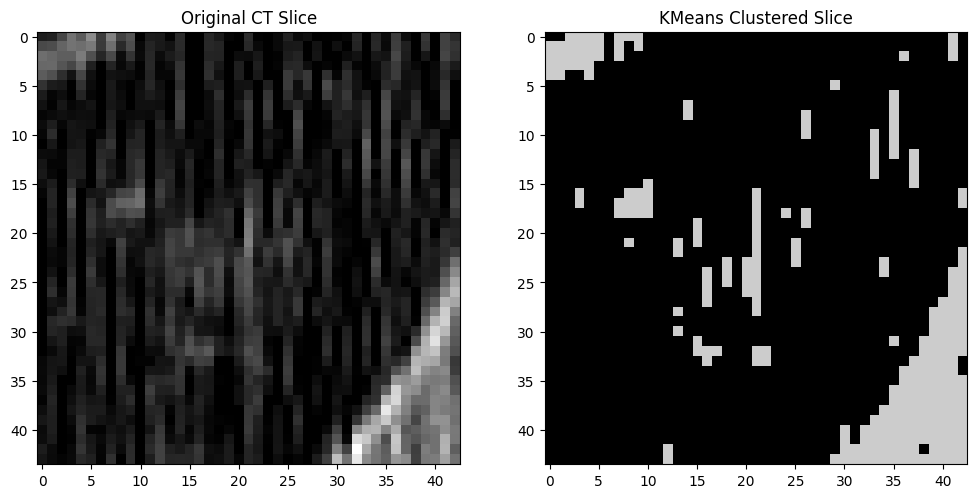

Completed segmentation for LIDC-IDRI-0476_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0476_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0476_R_4.nii.gz


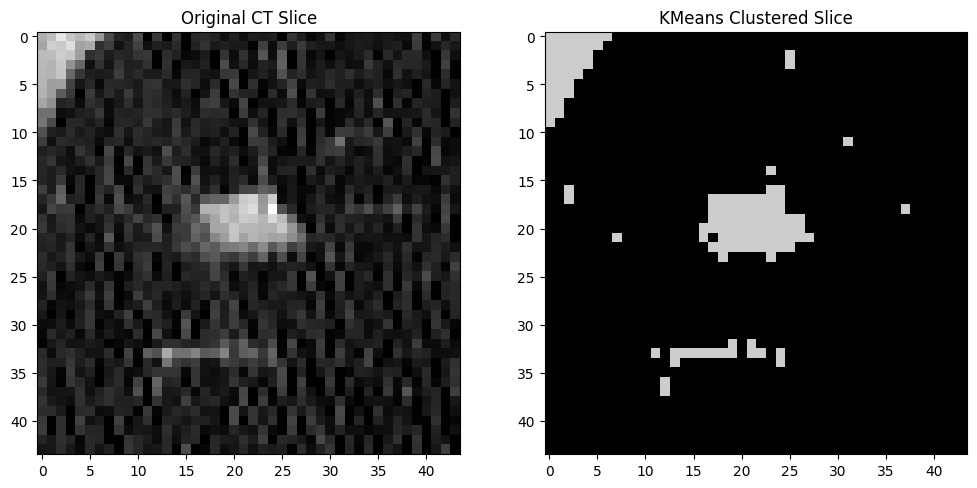

Completed segmentation for LIDC-IDRI-0476_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0298_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0298_R_4.nii.gz


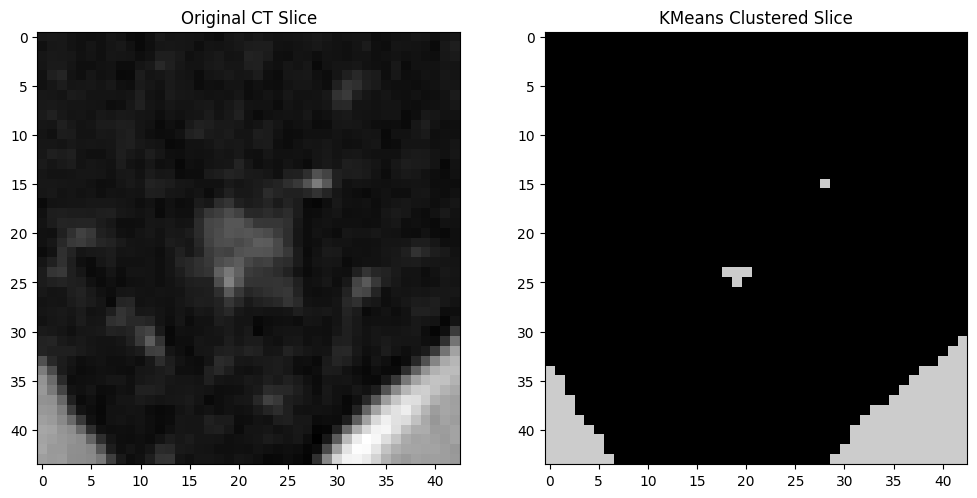

Completed segmentation for LIDC-IDRI-0298_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0521_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0521_R_1.nii.gz


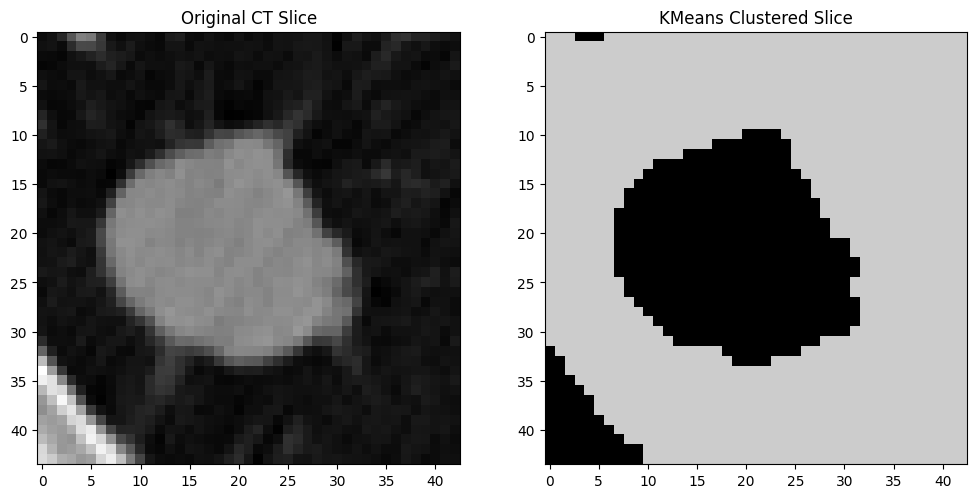

Completed segmentation for LIDC-IDRI-0521_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0453_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0453_R_1.nii.gz


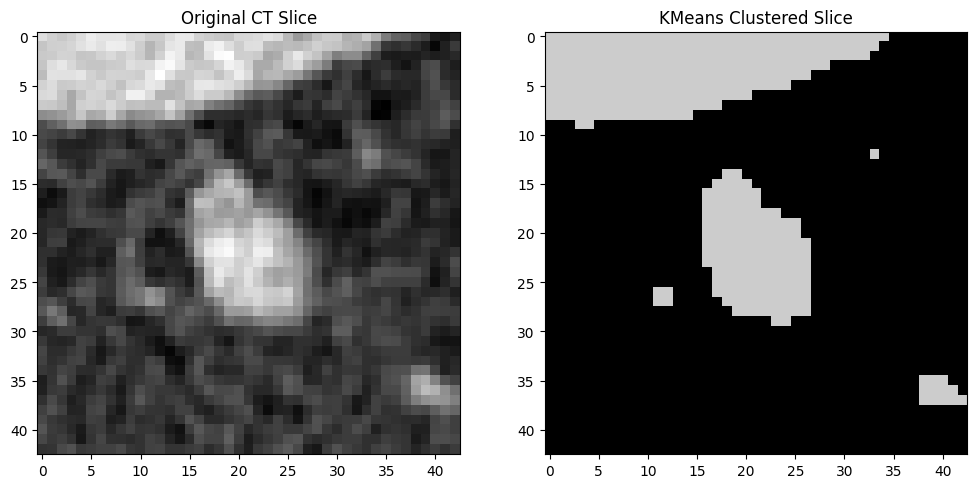

Completed segmentation for LIDC-IDRI-0453_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0210_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0210_R_1.nii.gz


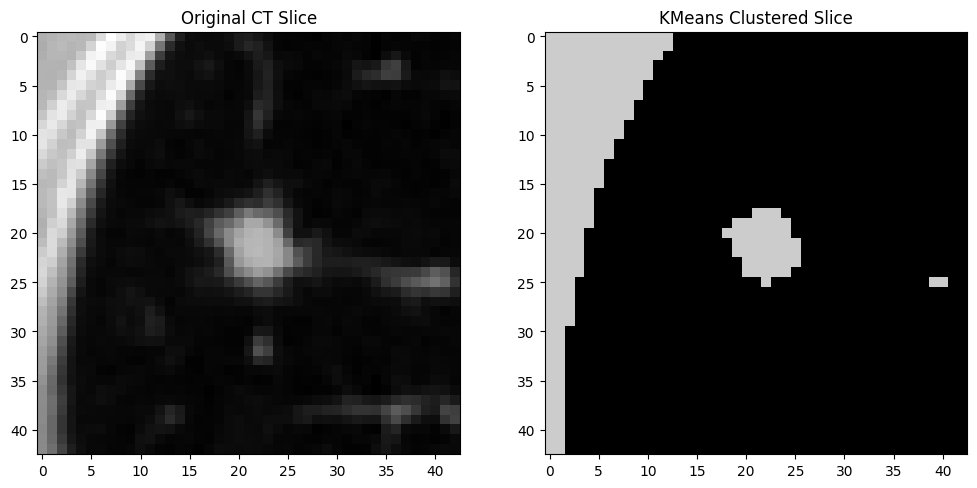

Completed segmentation for LIDC-IDRI-0210_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0557_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0557_R_2.nii.gz


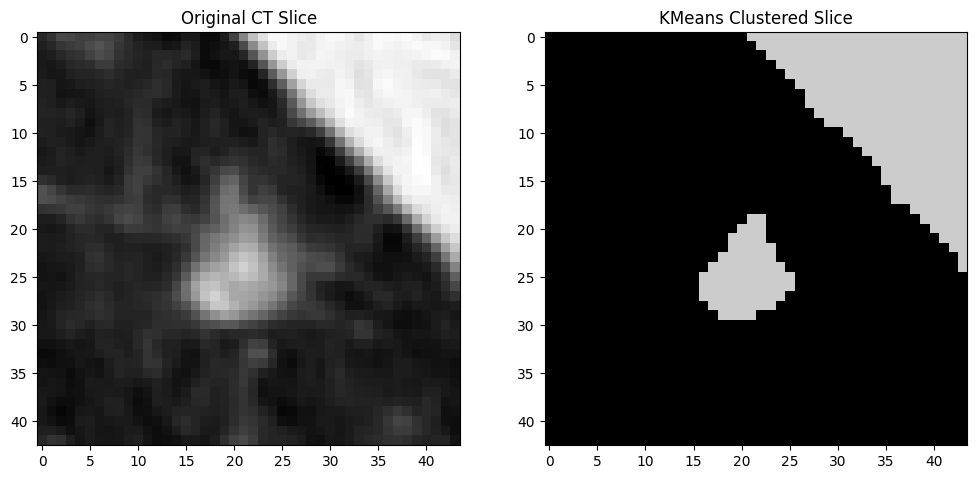

Completed segmentation for LIDC-IDRI-0557_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0605_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0605_R_3.nii.gz


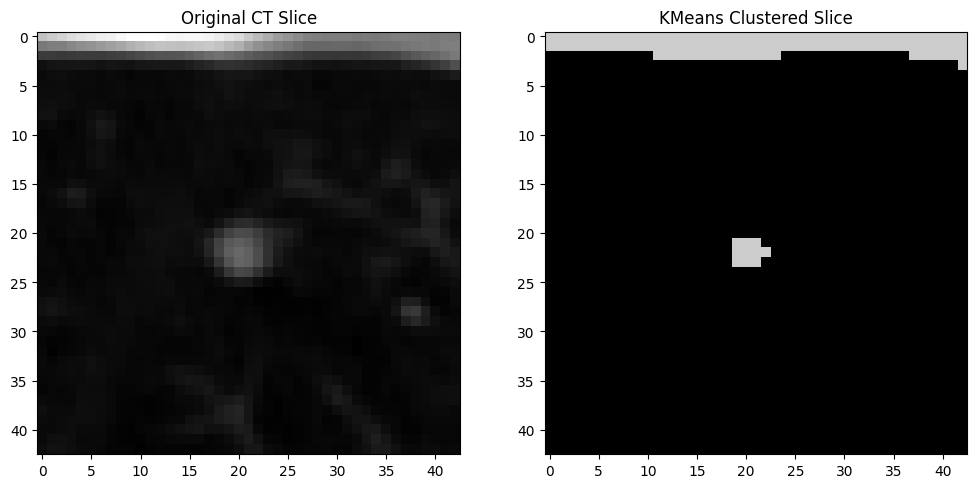

Completed segmentation for LIDC-IDRI-0605_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0587_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0587_R_5.nii.gz


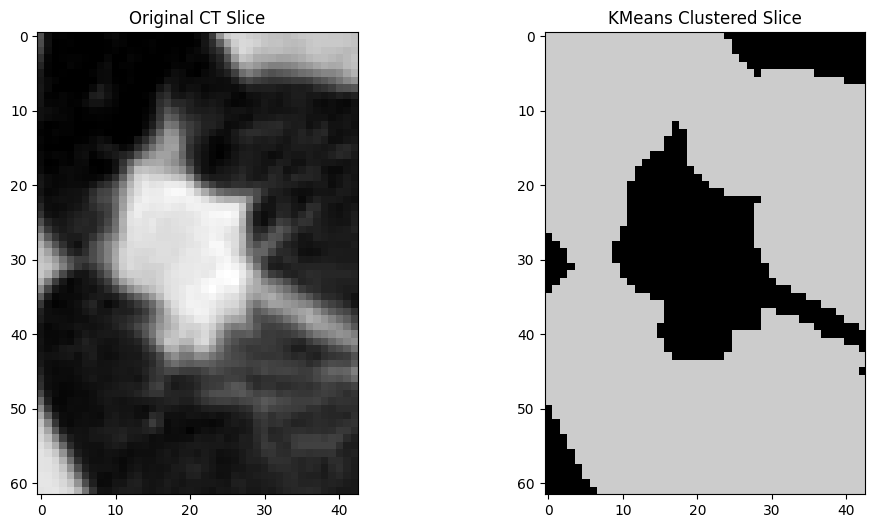

Completed segmentation for LIDC-IDRI-0587_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0661_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0661_R_2.nii.gz


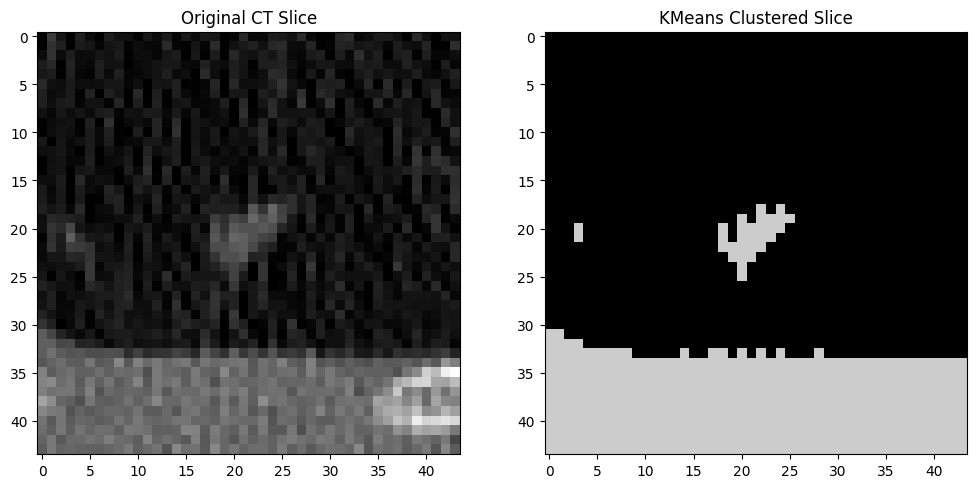

Completed segmentation for LIDC-IDRI-0661_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0183_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0183_R_1.nii.gz


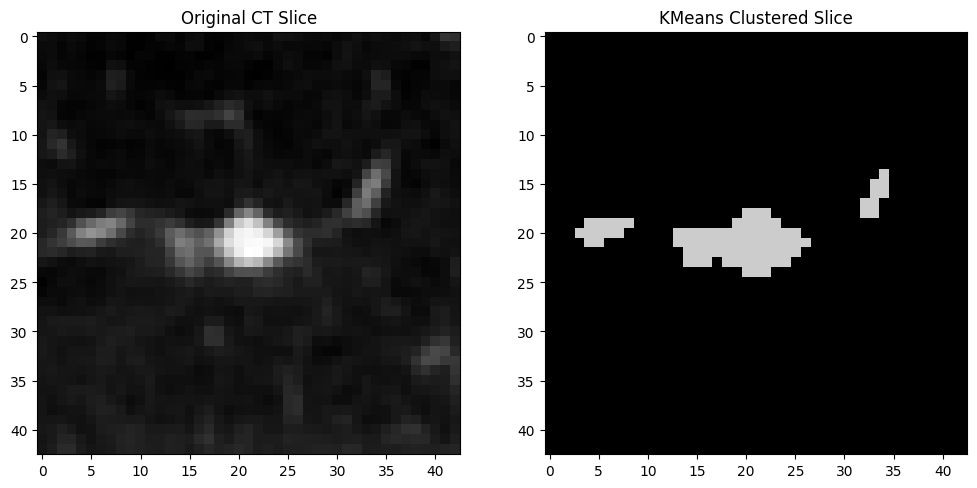

Completed segmentation for LIDC-IDRI-0183_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0636_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0636_R_5.nii.gz


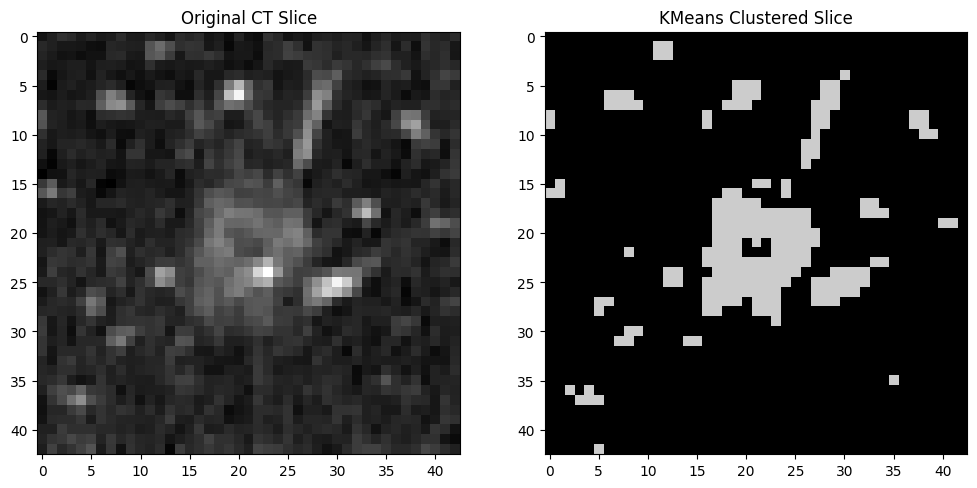

Completed segmentation for LIDC-IDRI-0636_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0582_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0582_R_4.nii.gz


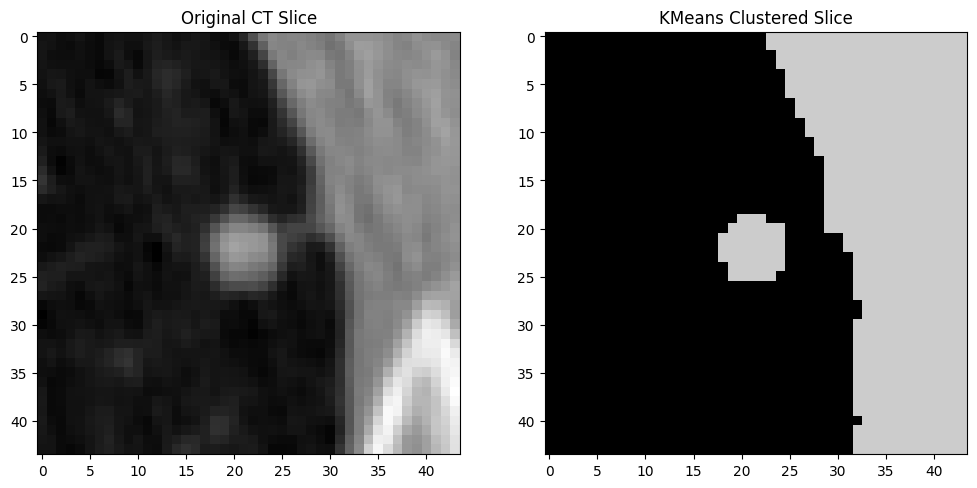

Completed segmentation for LIDC-IDRI-0582_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0276_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0276_R_1.nii.gz


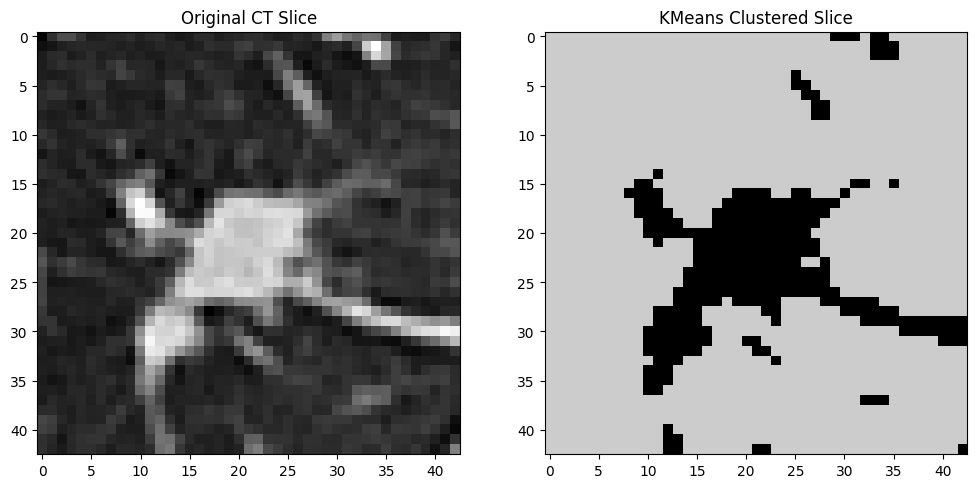

Completed segmentation for LIDC-IDRI-0276_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0579_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0579_R_1.nii.gz


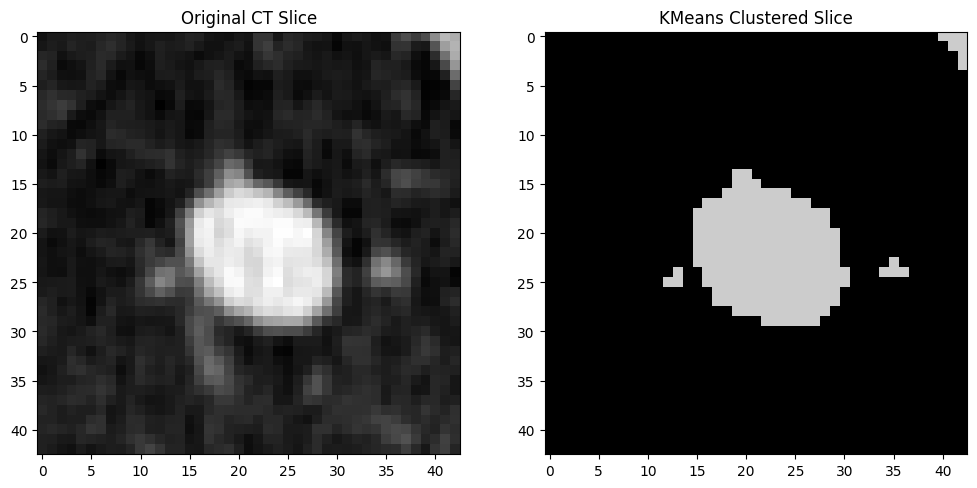

Completed segmentation for LIDC-IDRI-0579_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0673_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0673_R_1.nii.gz


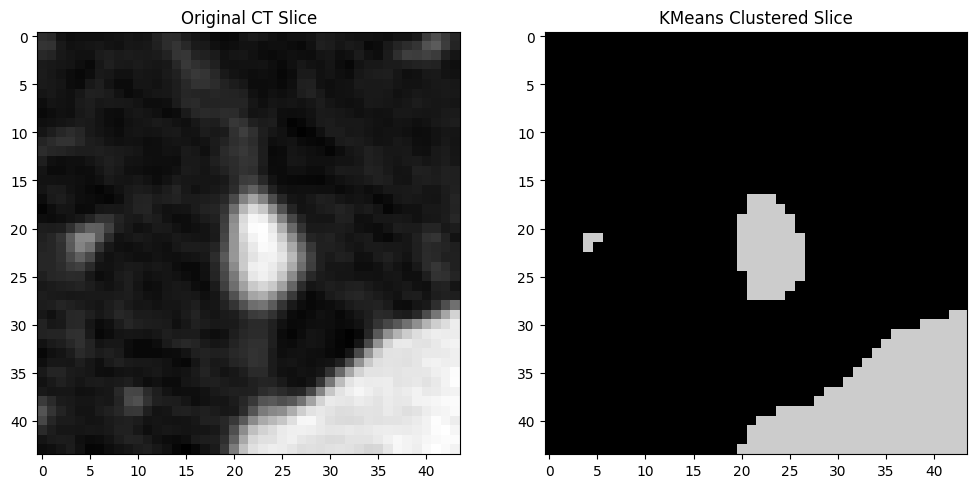

Completed segmentation for LIDC-IDRI-0673_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0149_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0149_R_2.nii.gz


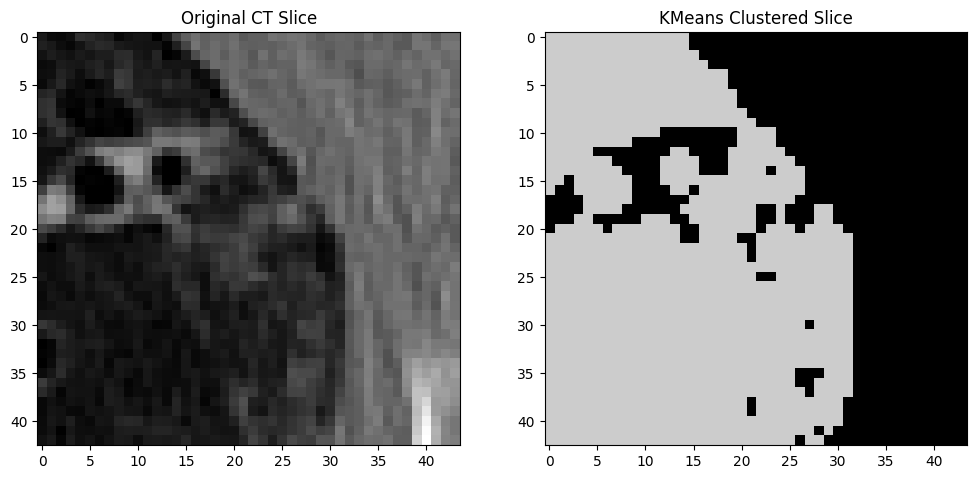

Completed segmentation for LIDC-IDRI-0149_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0450_R_7.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0450_R_7.nii.gz


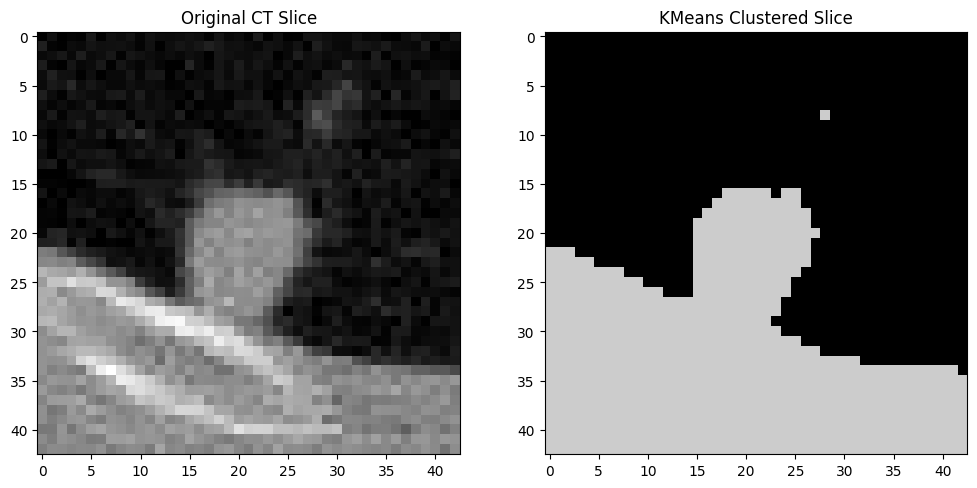

Completed segmentation for LIDC-IDRI-0450_R_7.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0181_R_8.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0181_R_8.nii.gz


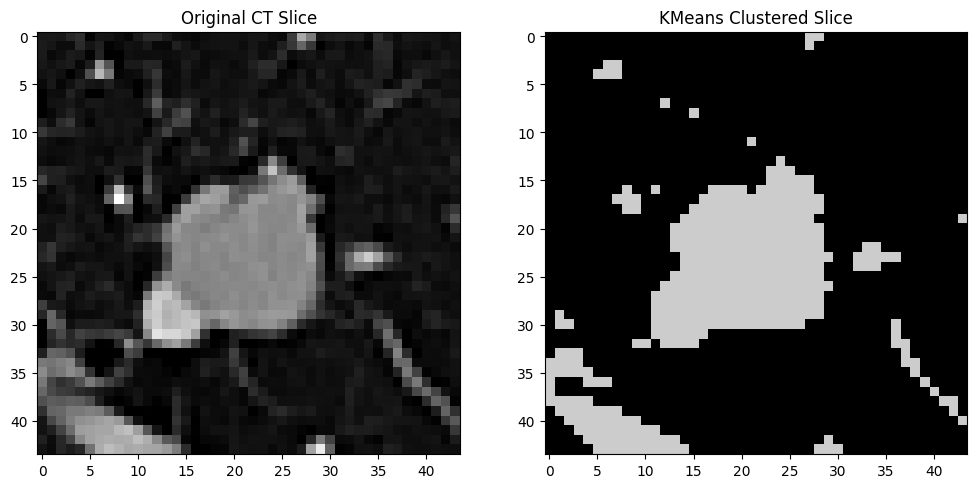

Completed segmentation for LIDC-IDRI-0181_R_8.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0434_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0434_R_2.nii.gz


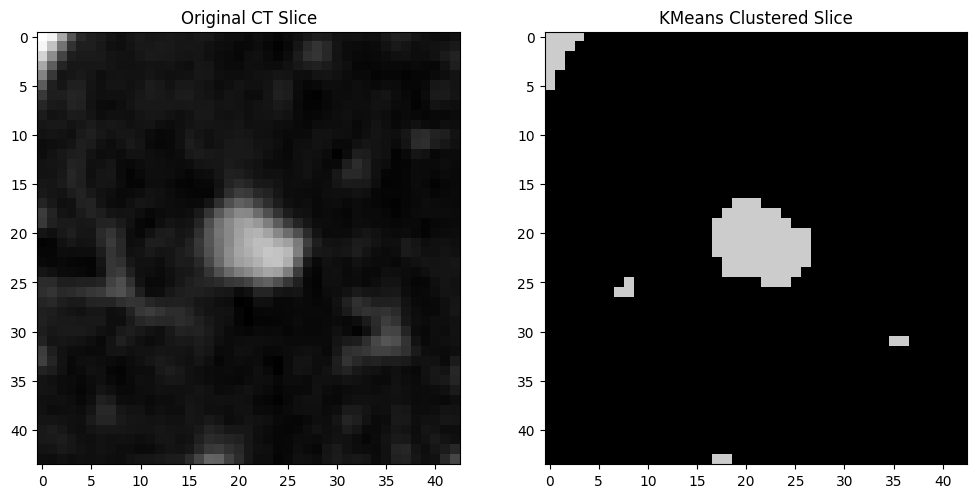

Completed segmentation for LIDC-IDRI-0434_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0182_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0182_R_3.nii.gz


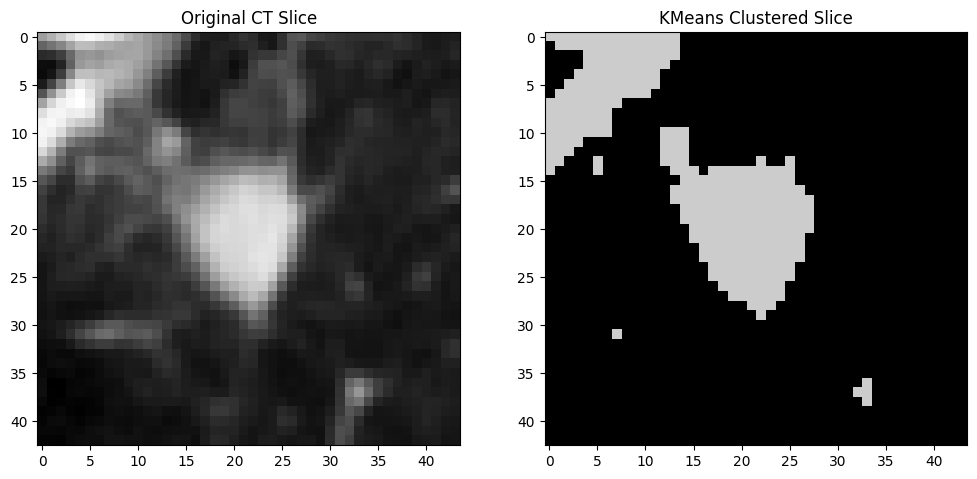

Completed segmentation for LIDC-IDRI-0182_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0523_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0523_R_2.nii.gz


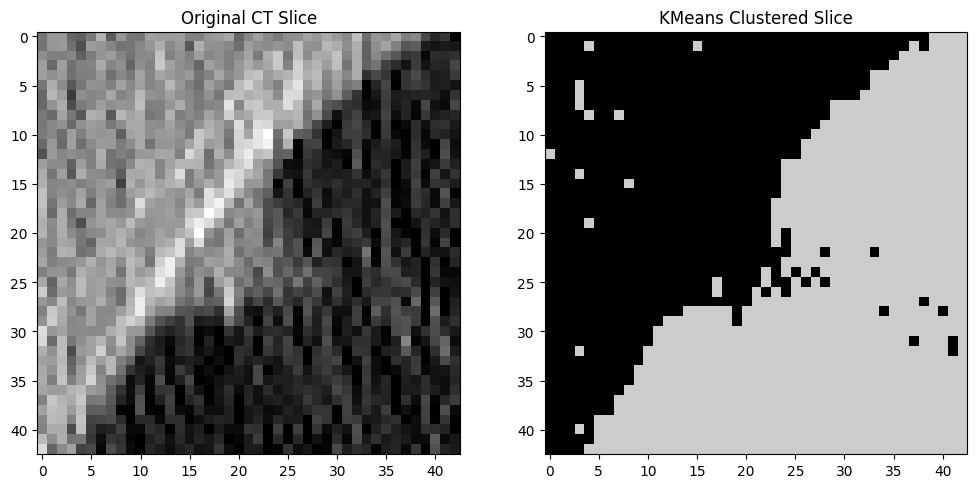

Completed segmentation for LIDC-IDRI-0523_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0376_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0376_R_1.nii.gz


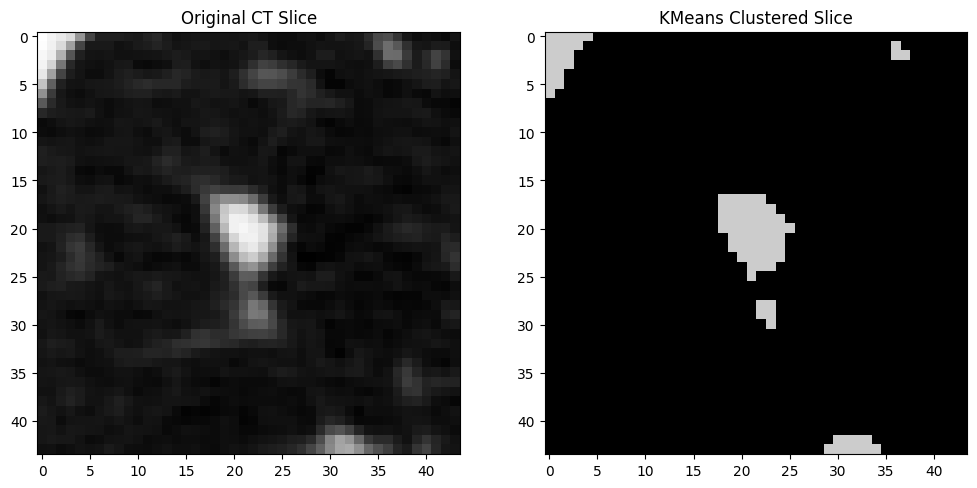

Completed segmentation for LIDC-IDRI-0376_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0503_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0503_R_2.nii.gz


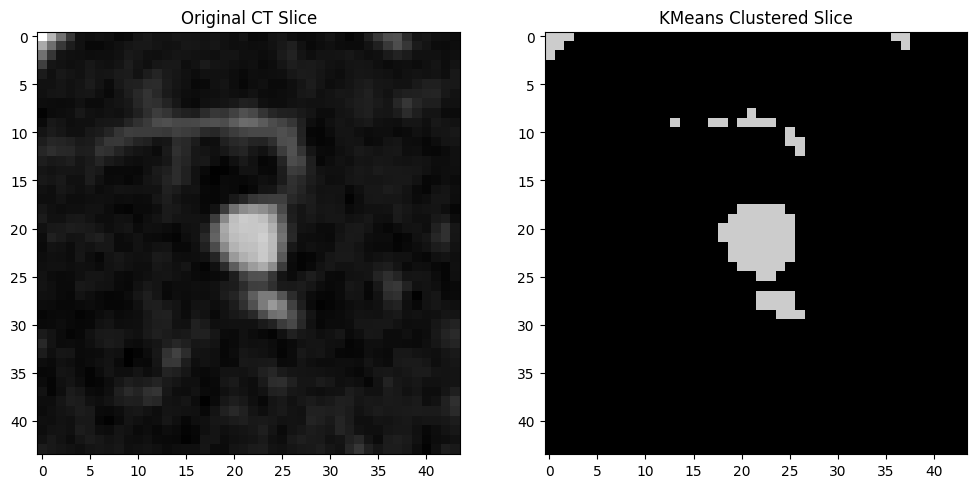

Completed segmentation for LIDC-IDRI-0503_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0641_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0641_R_2.nii.gz


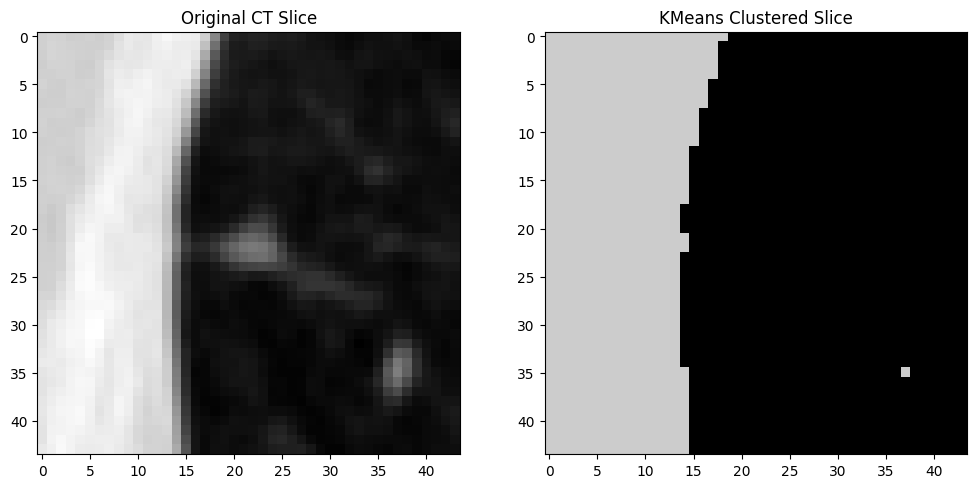

Completed segmentation for LIDC-IDRI-0641_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0299_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0299_R_3.nii.gz


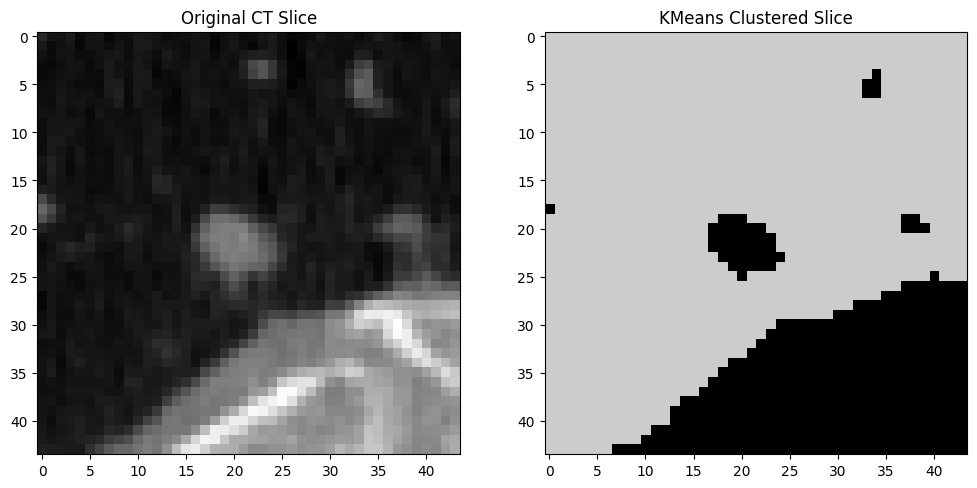

Completed segmentation for LIDC-IDRI-0299_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0162_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0162_R_2.nii.gz


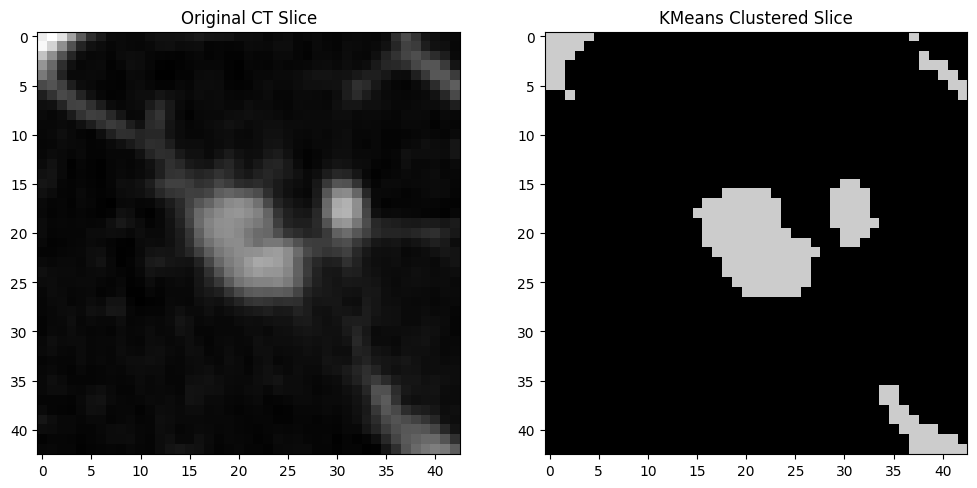

Completed segmentation for LIDC-IDRI-0162_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0486_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0486_R_2.nii.gz


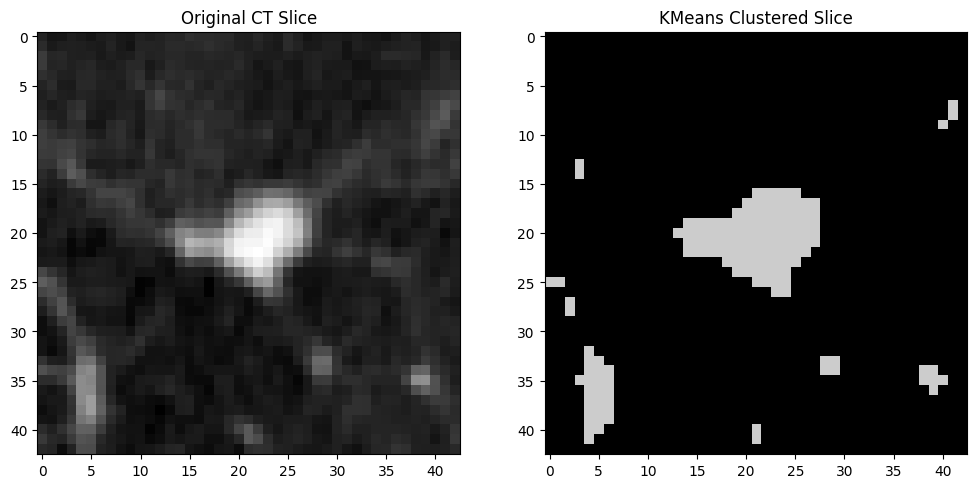

Completed segmentation for LIDC-IDRI-0486_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0655_R_8.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0655_R_8.nii.gz


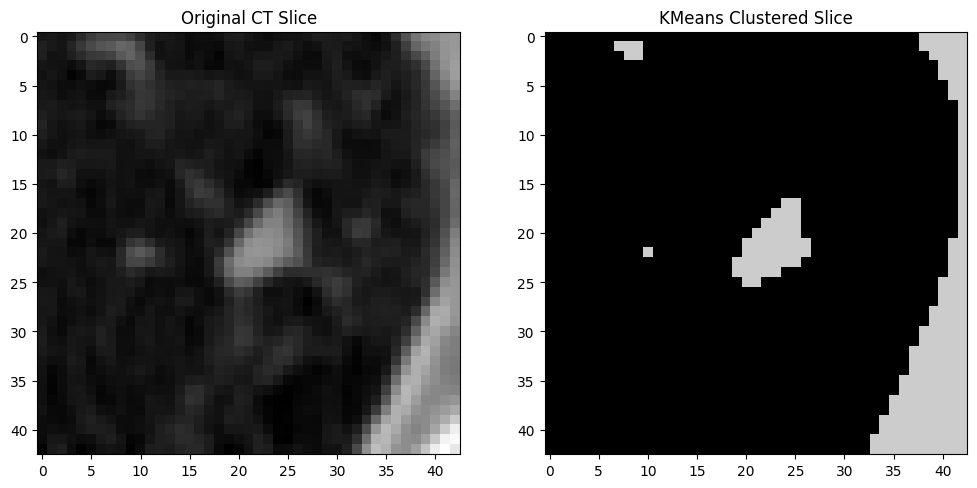

Completed segmentation for LIDC-IDRI-0655_R_8.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0582_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0582_R_2.nii.gz


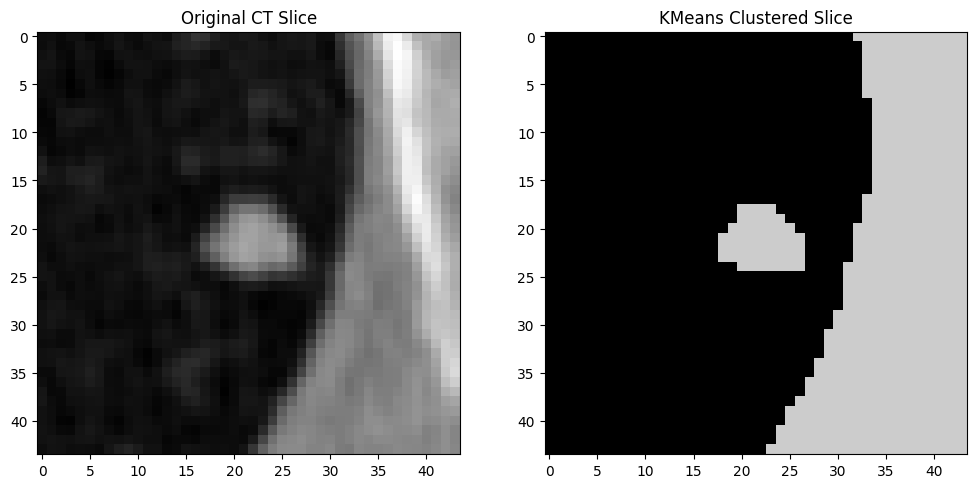

Completed segmentation for LIDC-IDRI-0582_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0325_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0325_R_1.nii.gz


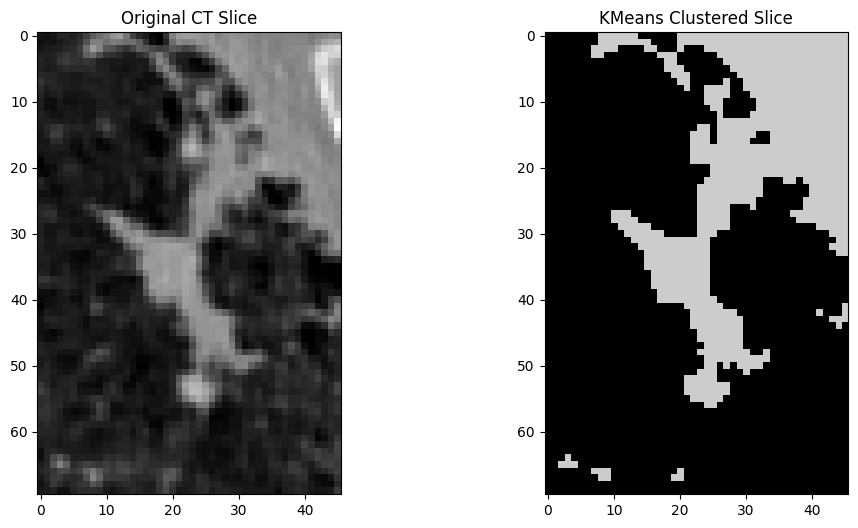

Completed segmentation for LIDC-IDRI-0325_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0678_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0678_R_1.nii.gz


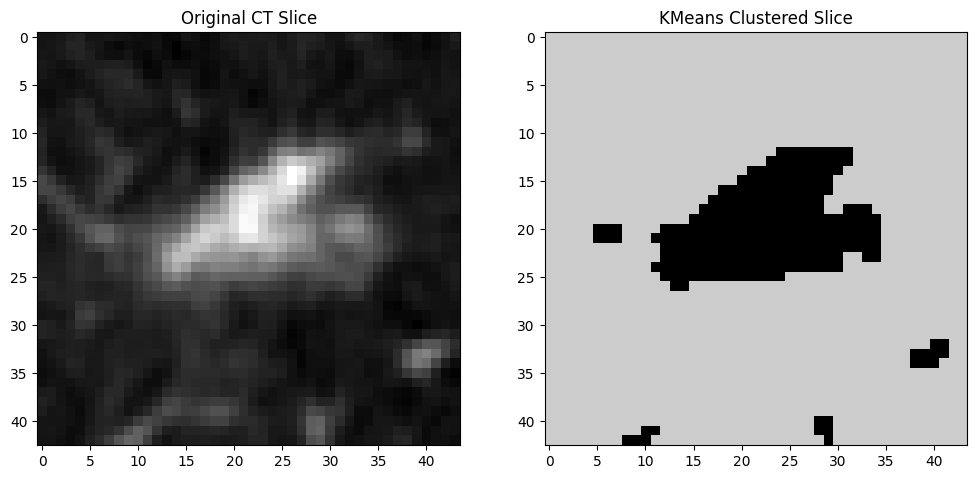

Completed segmentation for LIDC-IDRI-0678_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0530_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0530_R_2.nii.gz


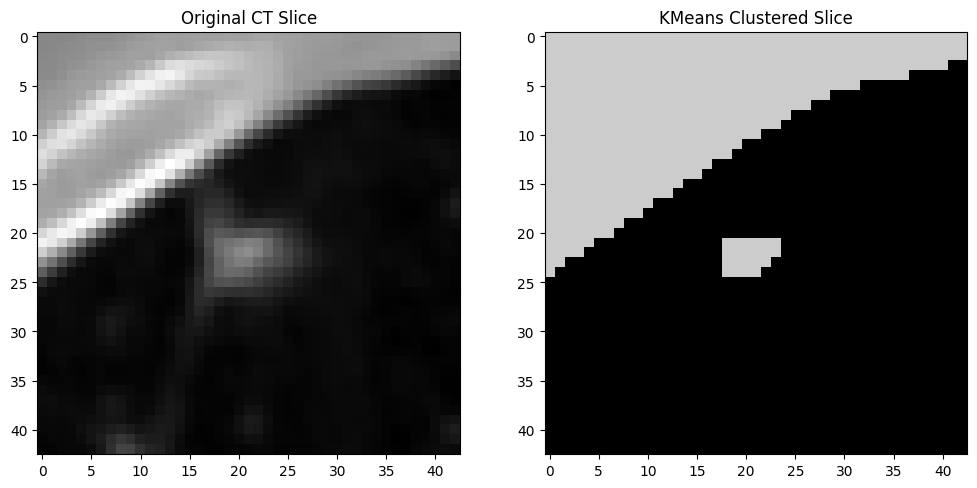

Completed segmentation for LIDC-IDRI-0530_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0456_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0456_R_3.nii.gz


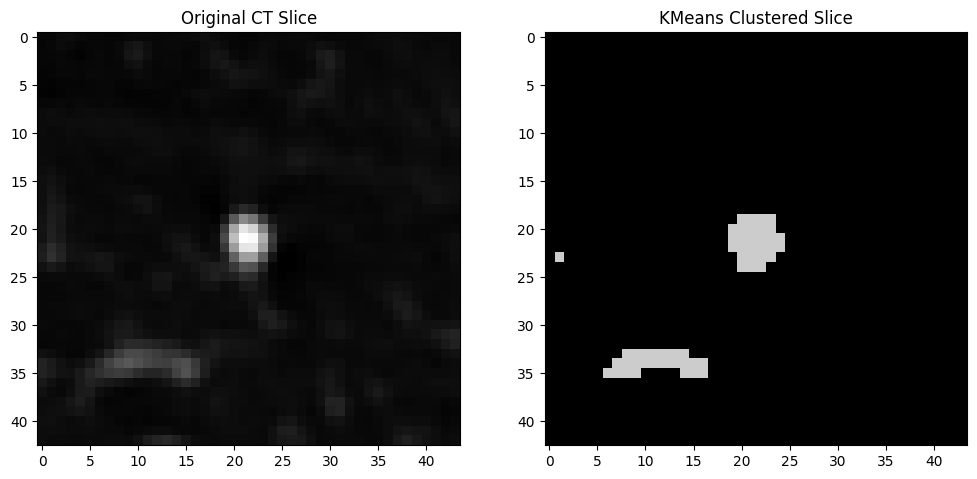

Completed segmentation for LIDC-IDRI-0456_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0686_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0686_R_5.nii.gz


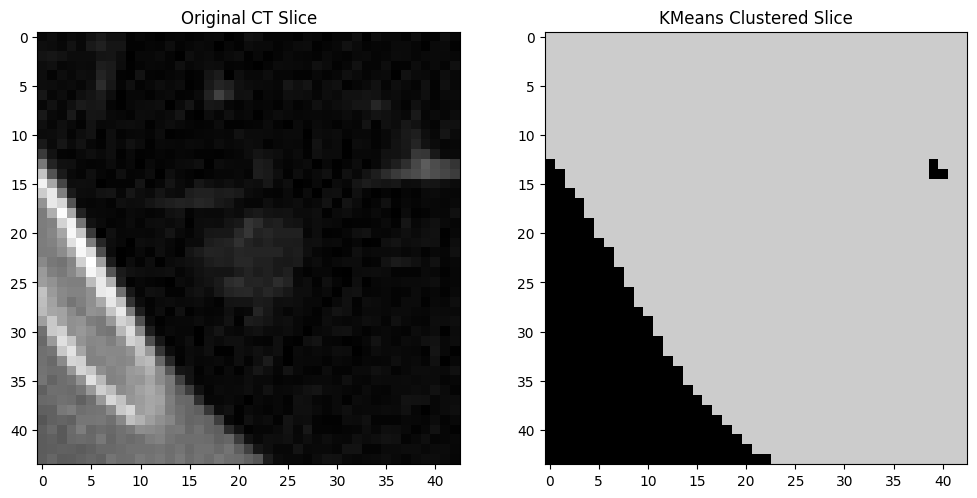

Completed segmentation for LIDC-IDRI-0686_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0496_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0496_R_3.nii.gz


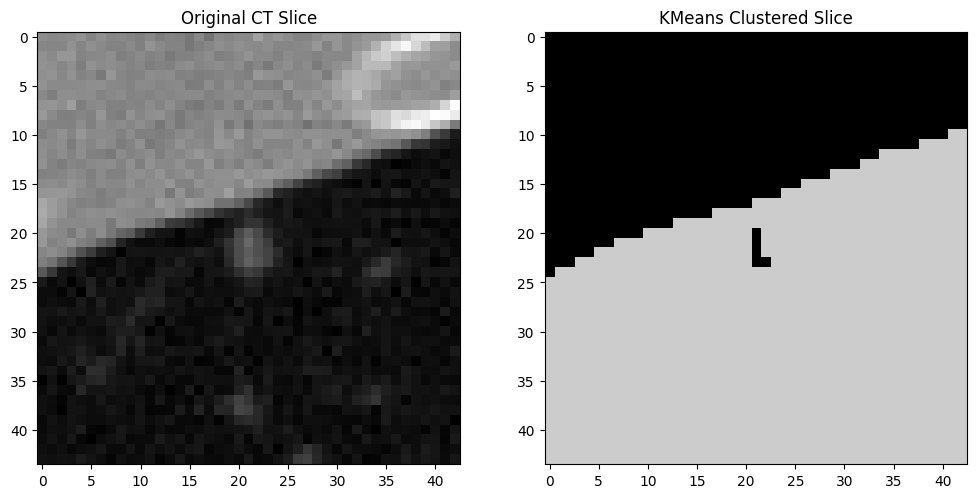

Completed segmentation for LIDC-IDRI-0496_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0338_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0338_R_1.nii.gz


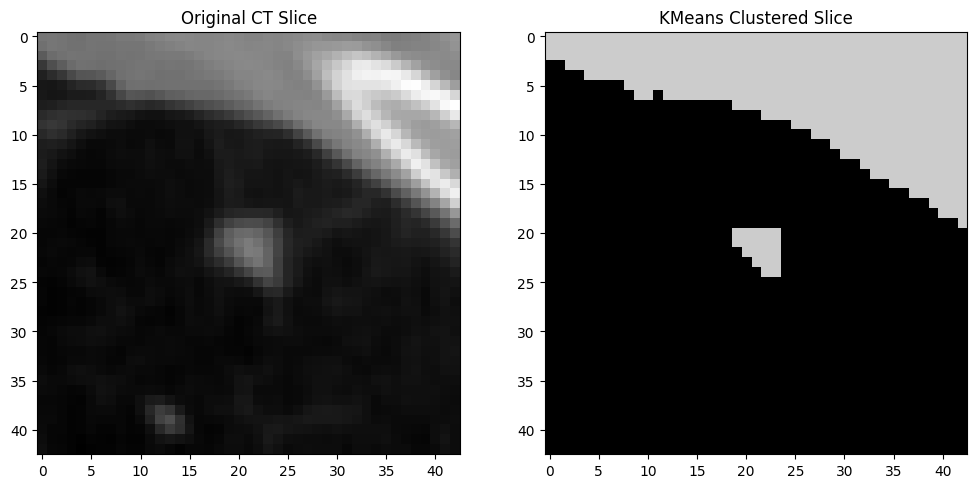

Completed segmentation for LIDC-IDRI-0338_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0312_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0312_R_1.nii.gz


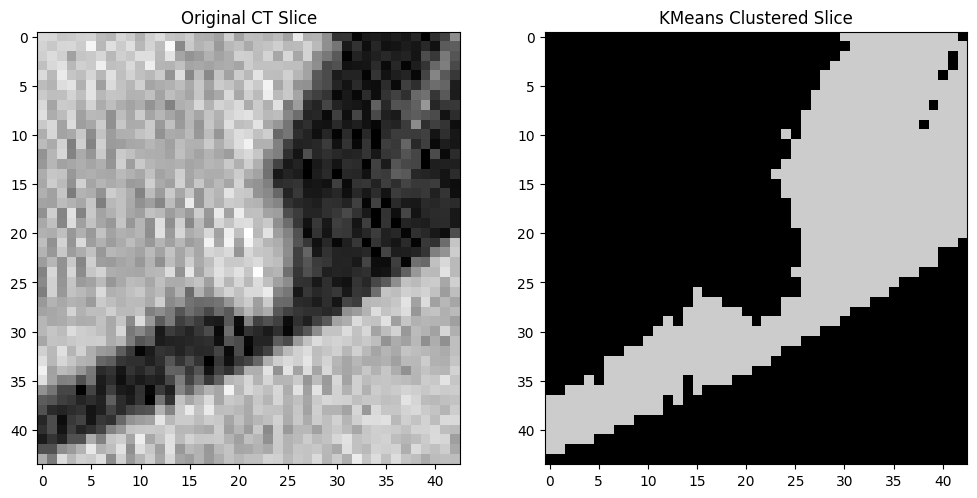

Completed segmentation for LIDC-IDRI-0312_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0641_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0641_R_6.nii.gz


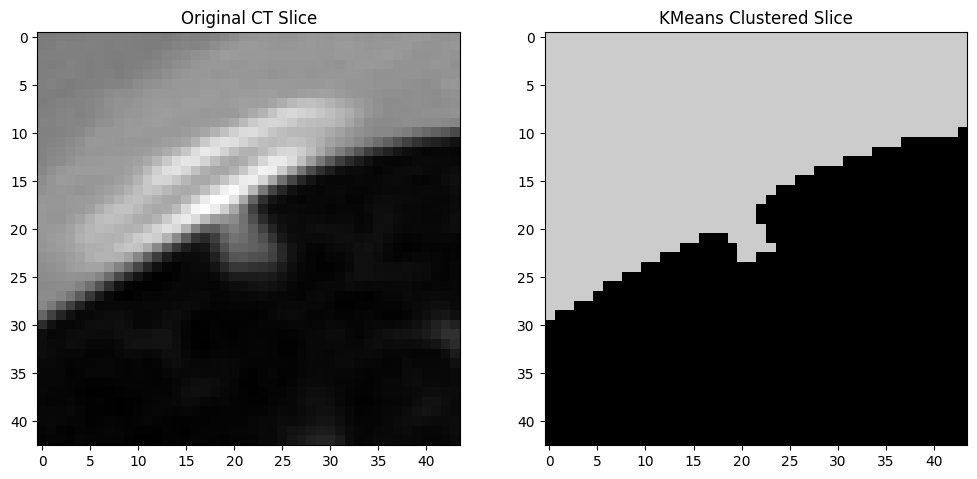

Completed segmentation for LIDC-IDRI-0641_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0171_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0171_R_2.nii.gz


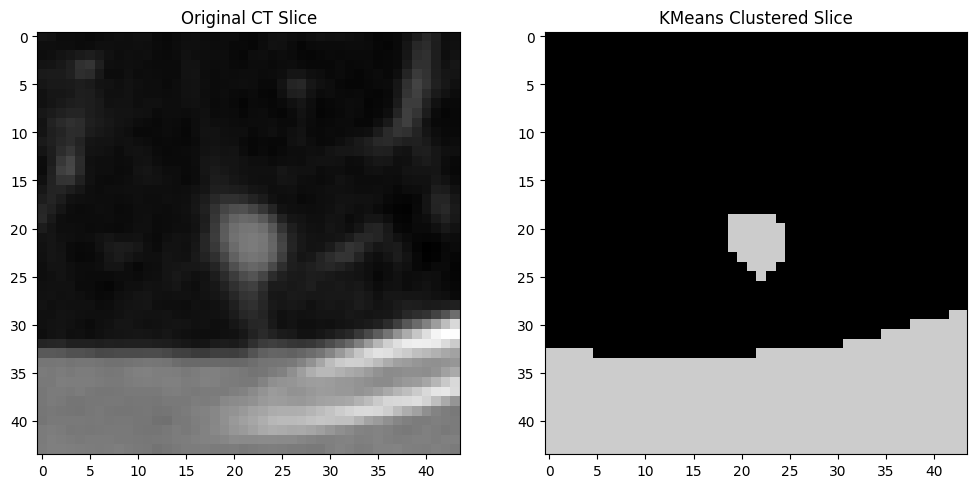

Completed segmentation for LIDC-IDRI-0171_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0236_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0236_R_1.nii.gz


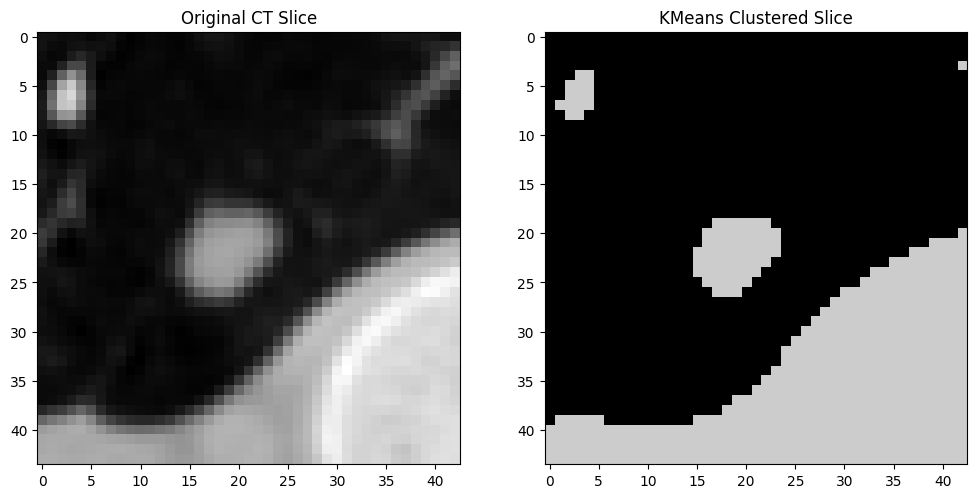

Completed segmentation for LIDC-IDRI-0236_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0649_R_7.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0649_R_7.nii.gz


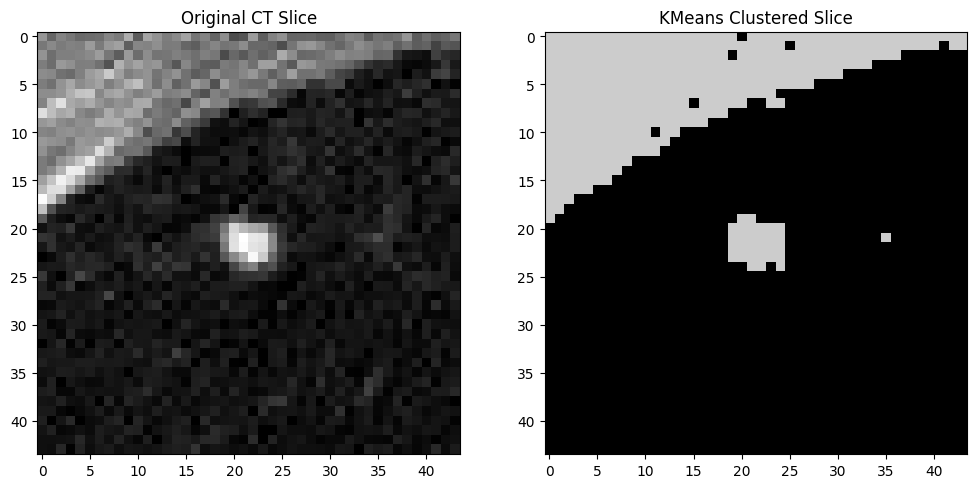

Completed segmentation for LIDC-IDRI-0649_R_7.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0407_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0407_R_2.nii.gz


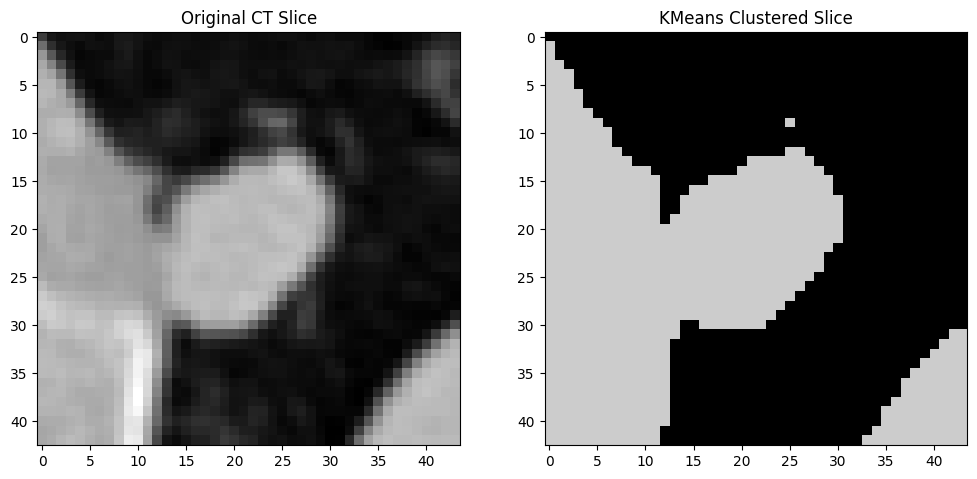

Completed segmentation for LIDC-IDRI-0407_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0229_R_7.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0229_R_7.nii.gz


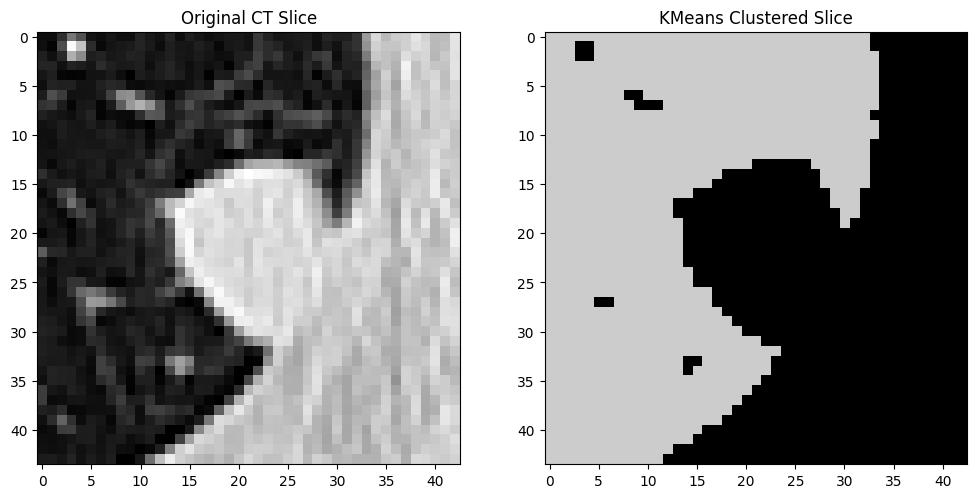

Completed segmentation for LIDC-IDRI-0229_R_7.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0185_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0185_R_1.nii.gz


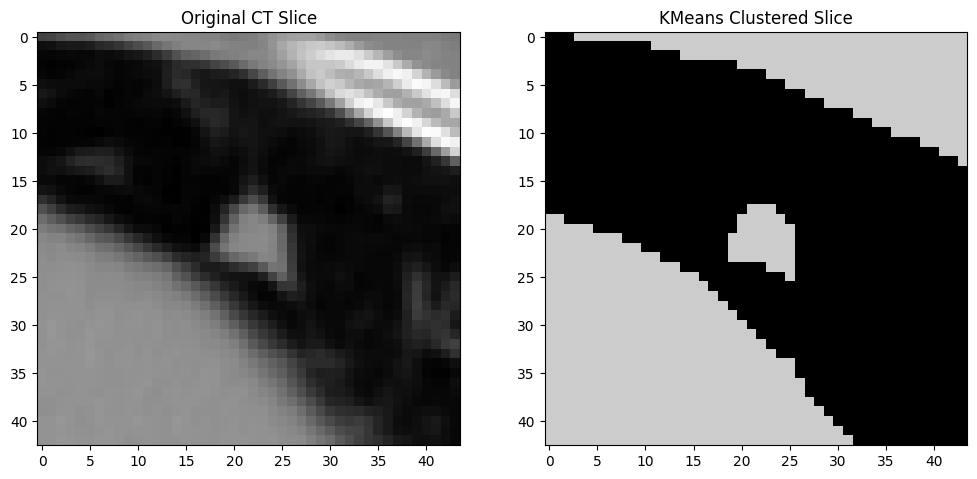

Completed segmentation for LIDC-IDRI-0185_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0282_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0282_R_2.nii.gz


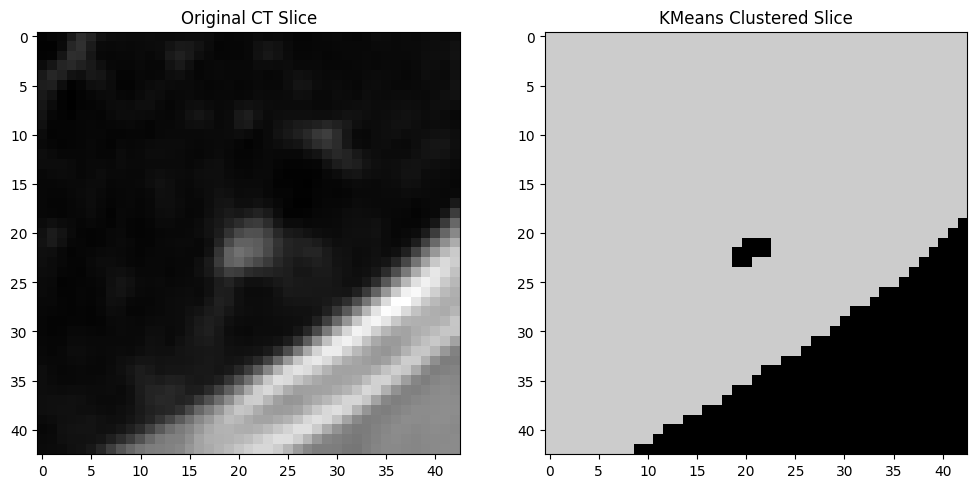

Completed segmentation for LIDC-IDRI-0282_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0614_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0614_R_3.nii.gz


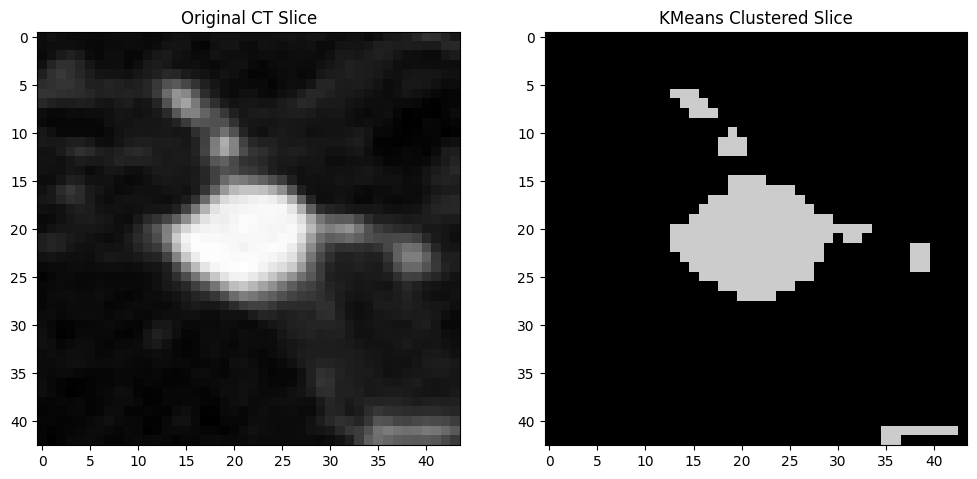

Completed segmentation for LIDC-IDRI-0614_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0535_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0535_R_2.nii.gz


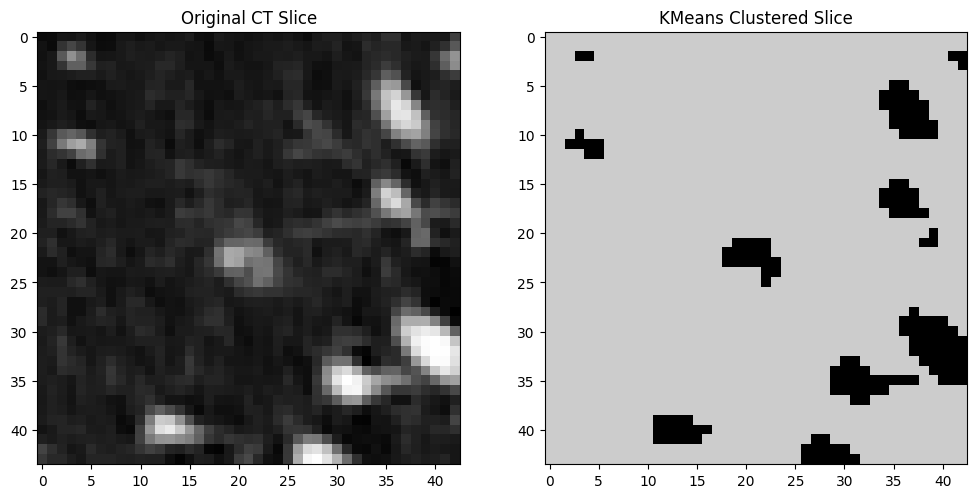

Completed segmentation for LIDC-IDRI-0535_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0404_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0404_R_2.nii.gz


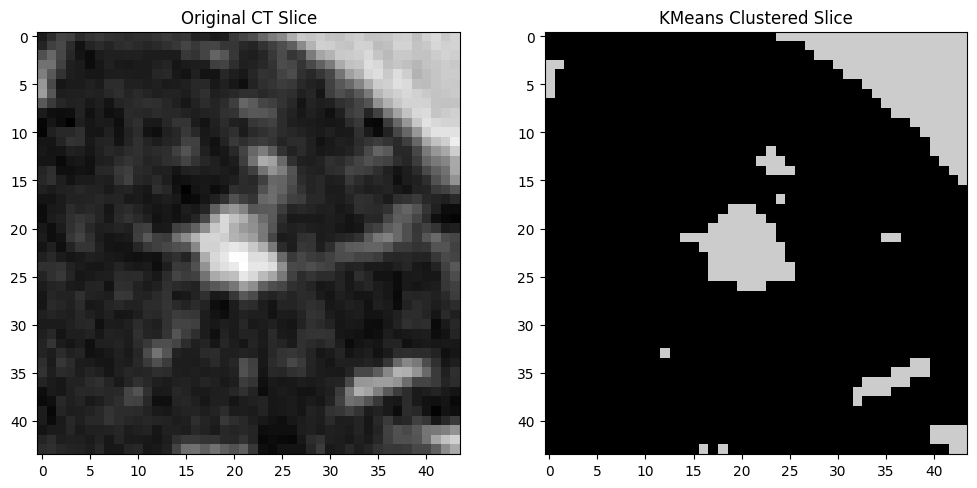

Completed segmentation for LIDC-IDRI-0404_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0661_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0661_R_4.nii.gz


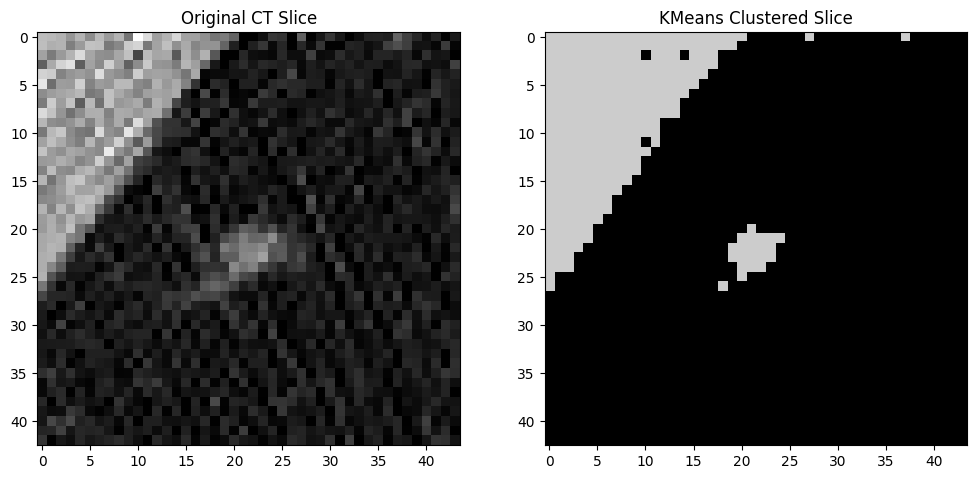

Completed segmentation for LIDC-IDRI-0661_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0686_R_16.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0686_R_16.nii.gz


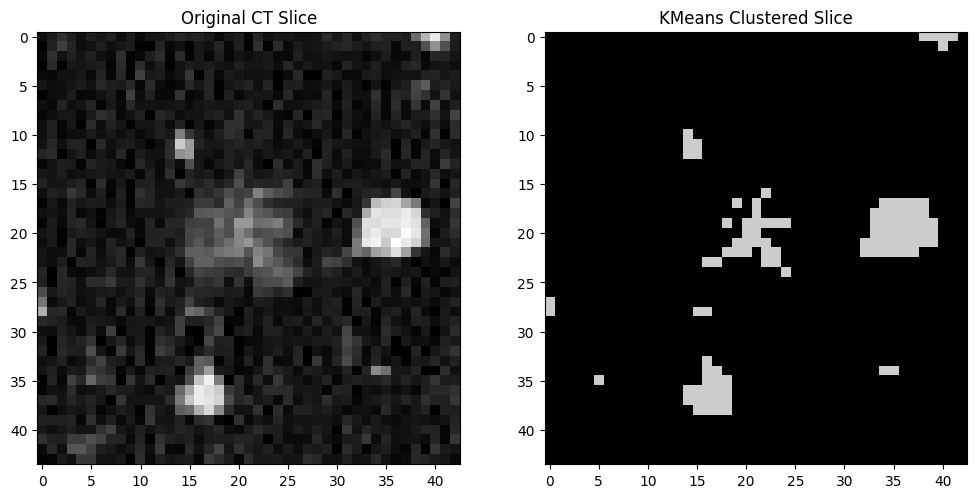

Completed segmentation for LIDC-IDRI-0686_R_16.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0559_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0559_R_1.nii.gz


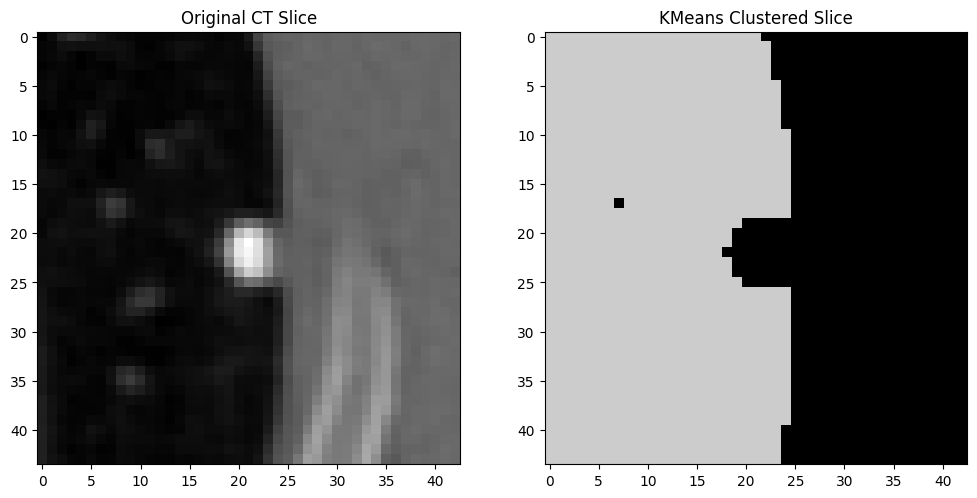

Completed segmentation for LIDC-IDRI-0559_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0206_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0206_R_2.nii.gz


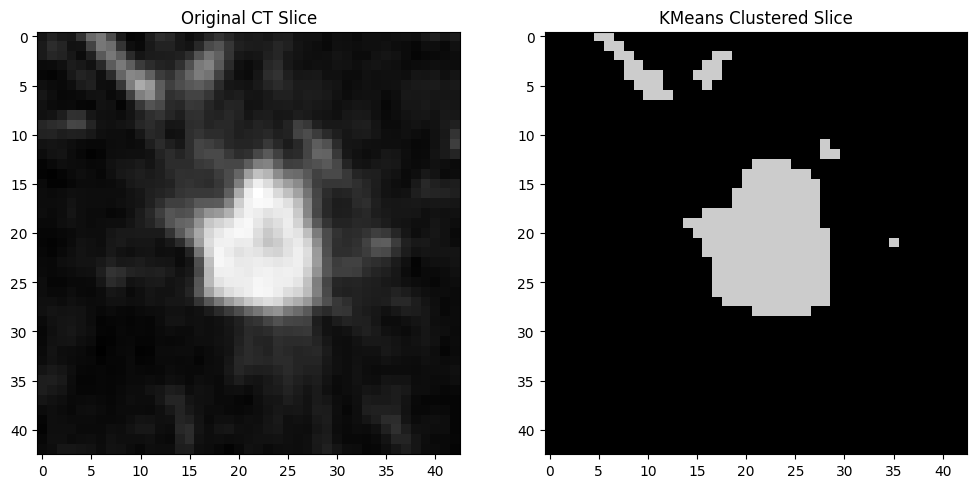

Completed segmentation for LIDC-IDRI-0206_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0412_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0412_R_3.nii.gz


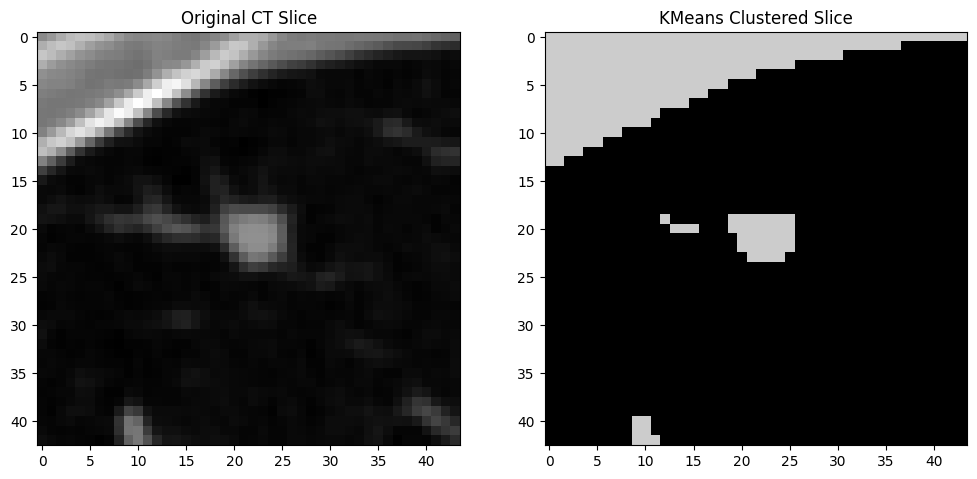

Completed segmentation for LIDC-IDRI-0412_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0192_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0192_R_3.nii.gz


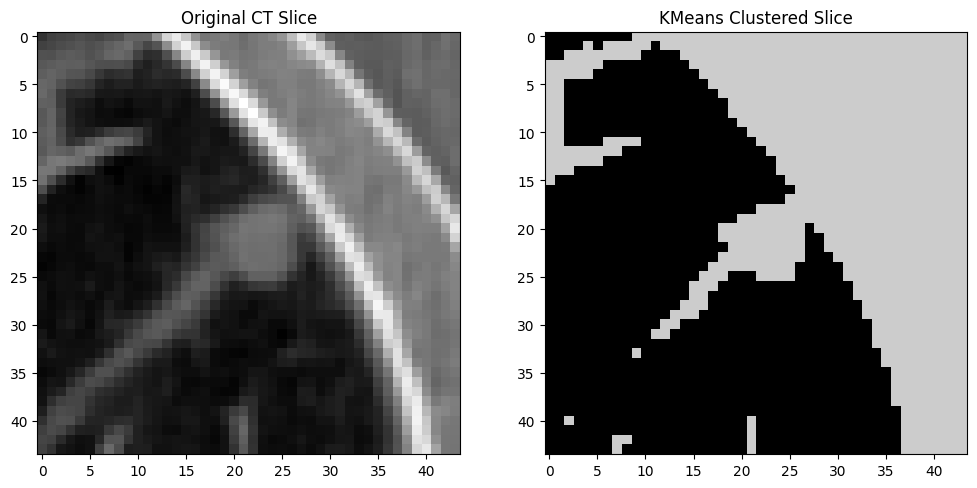

Completed segmentation for LIDC-IDRI-0192_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0415_R_7.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0415_R_7.nii.gz


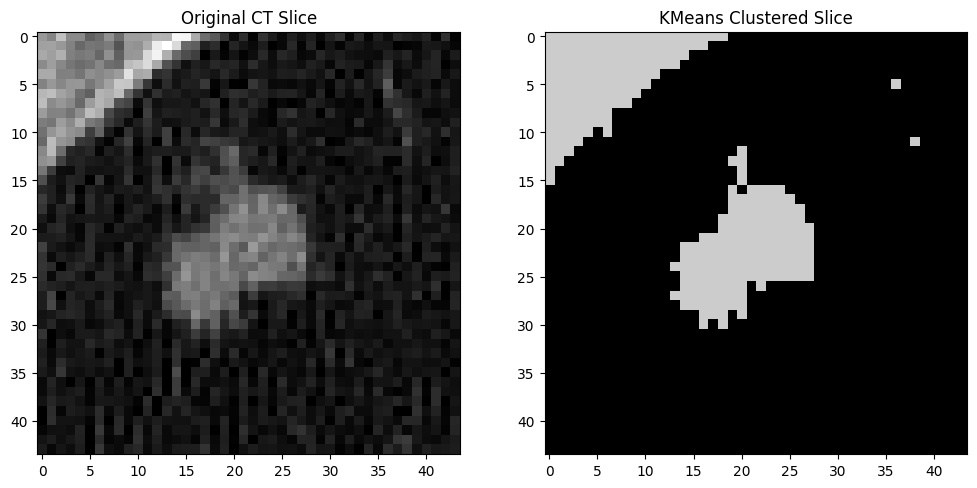

Completed segmentation for LIDC-IDRI-0415_R_7.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0598_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0598_R_1.nii.gz


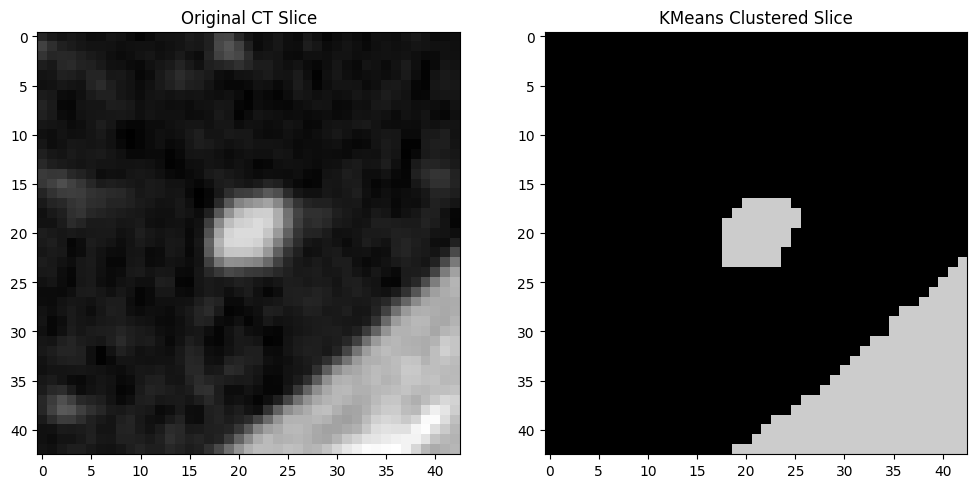

Completed segmentation for LIDC-IDRI-0598_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0405_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0405_R_2.nii.gz


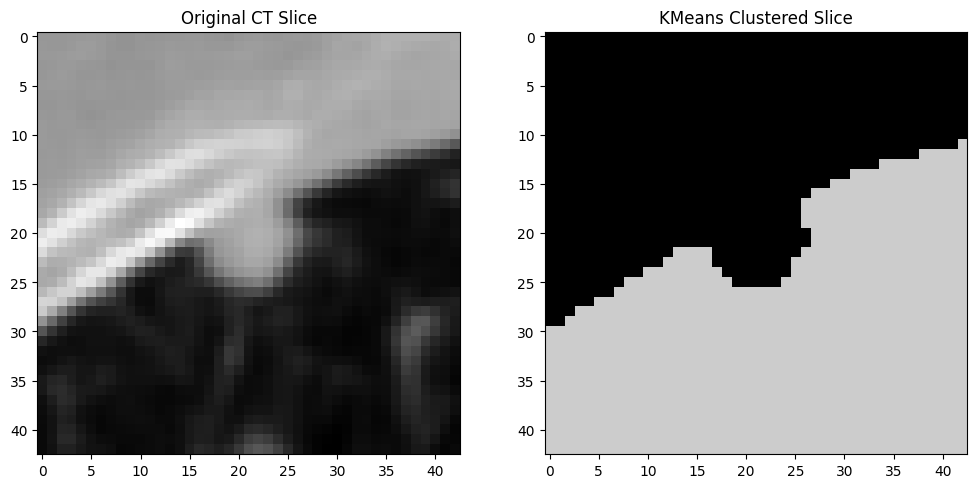

Completed segmentation for LIDC-IDRI-0405_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0234_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0234_R_1.nii.gz


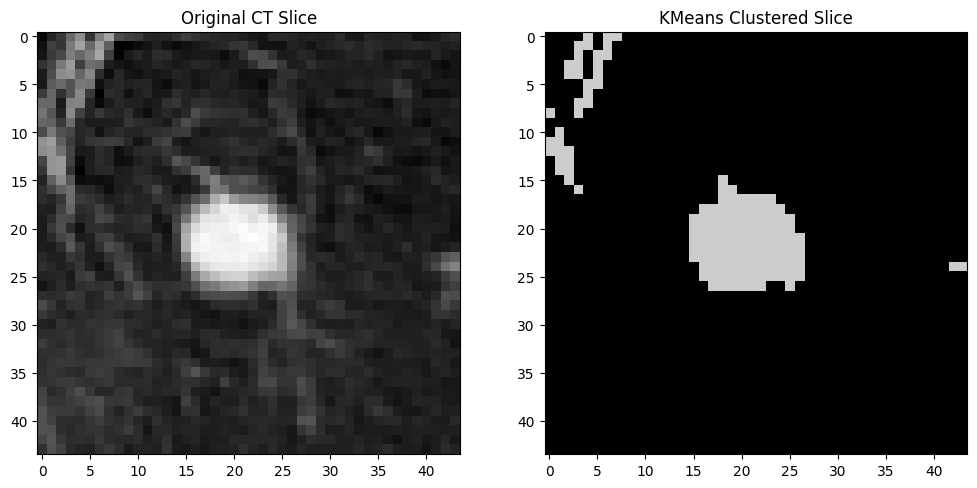

Completed segmentation for LIDC-IDRI-0234_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0427_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0427_R_1.nii.gz


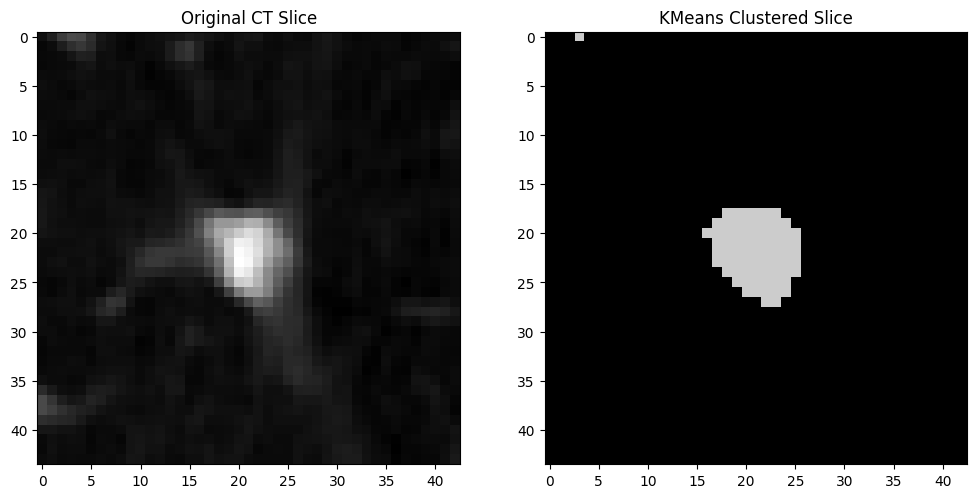

Completed segmentation for LIDC-IDRI-0427_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0194_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0194_R_2.nii.gz


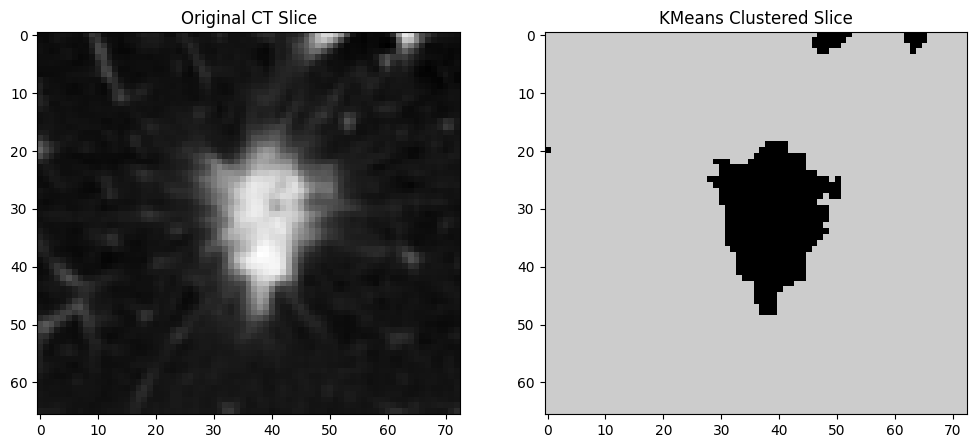

Completed segmentation for LIDC-IDRI-0194_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0284_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0284_R_3.nii.gz


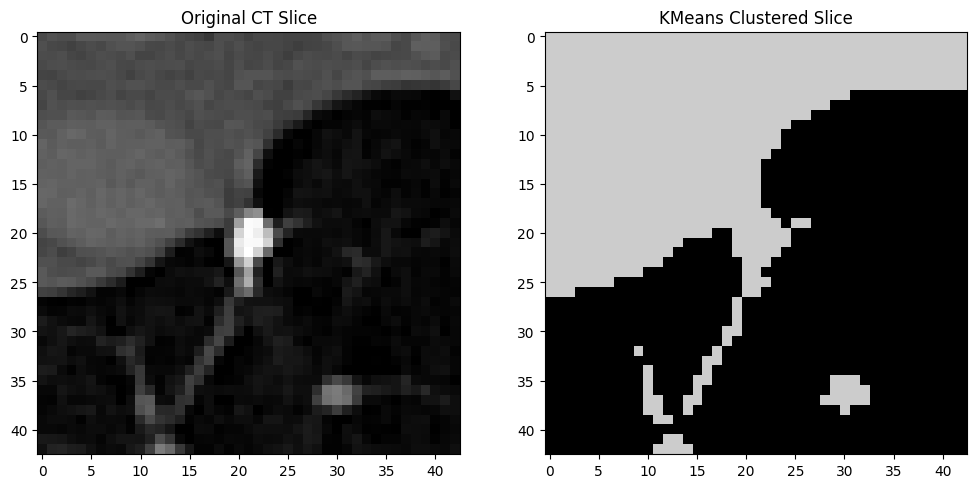

Completed segmentation for LIDC-IDRI-0284_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0215_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0215_R_4.nii.gz


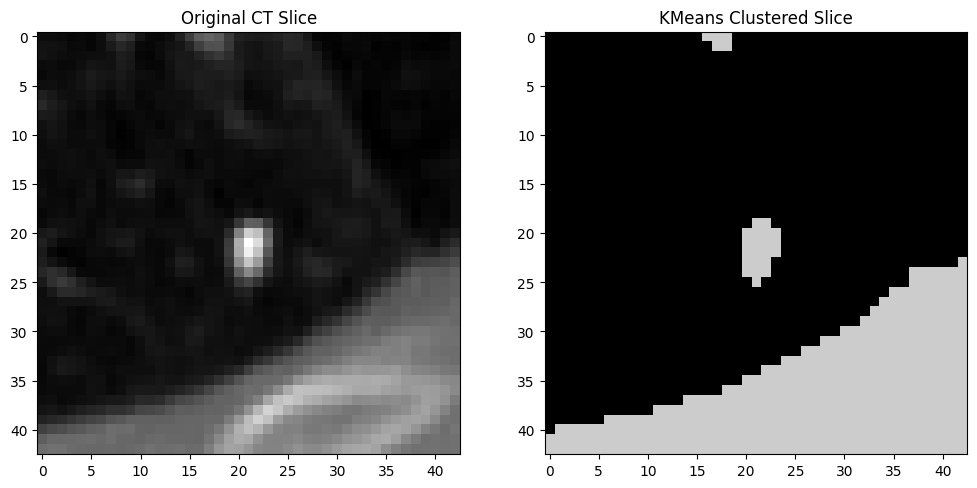

Completed segmentation for LIDC-IDRI-0215_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0565_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0565_R_1.nii.gz


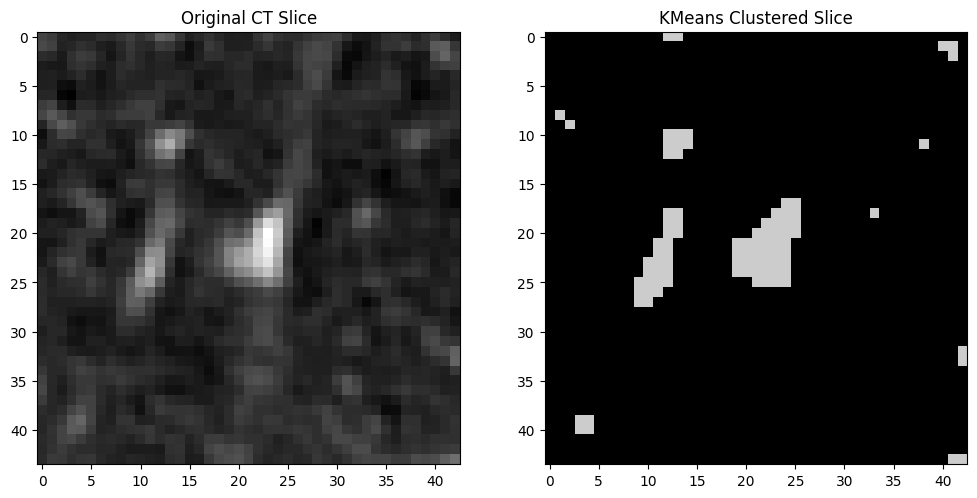

Completed segmentation for LIDC-IDRI-0565_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0217_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0217_R_3.nii.gz


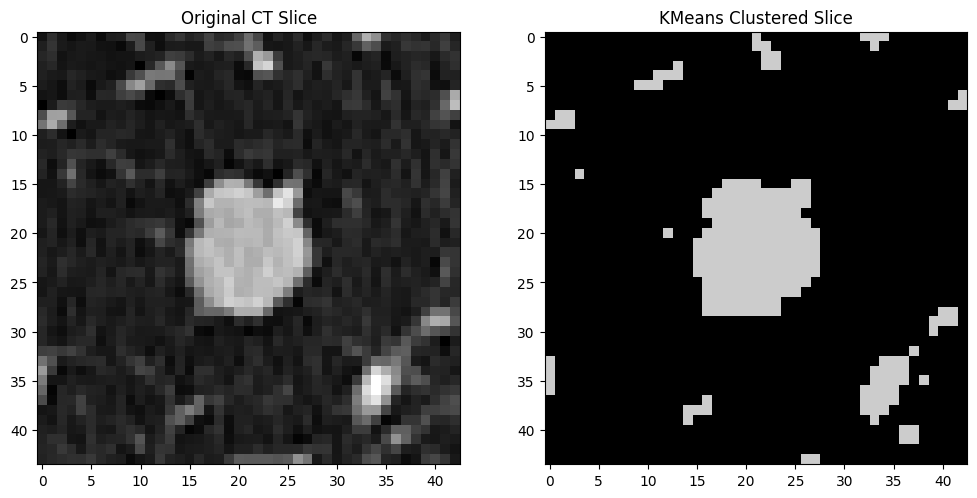

Completed segmentation for LIDC-IDRI-0217_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0398_R_11.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0398_R_11.nii.gz


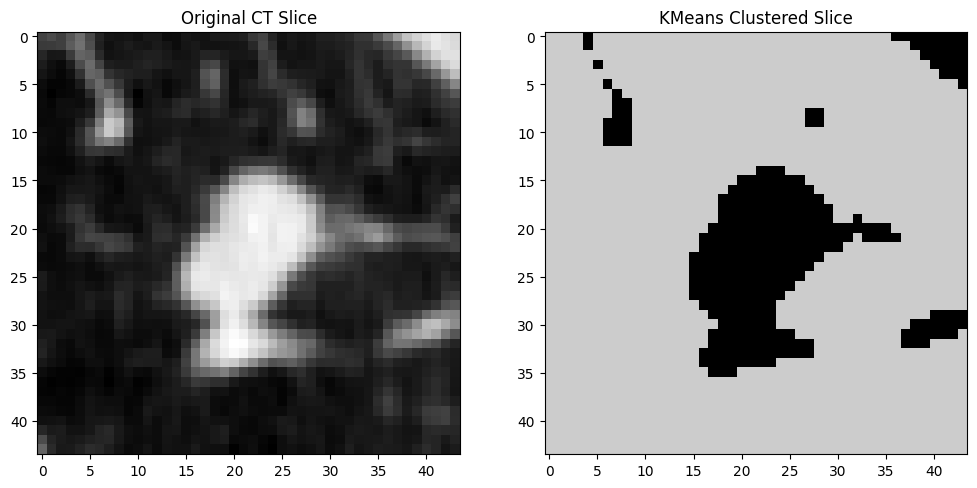

Completed segmentation for LIDC-IDRI-0398_R_11.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0491_R_9.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0491_R_9.nii.gz


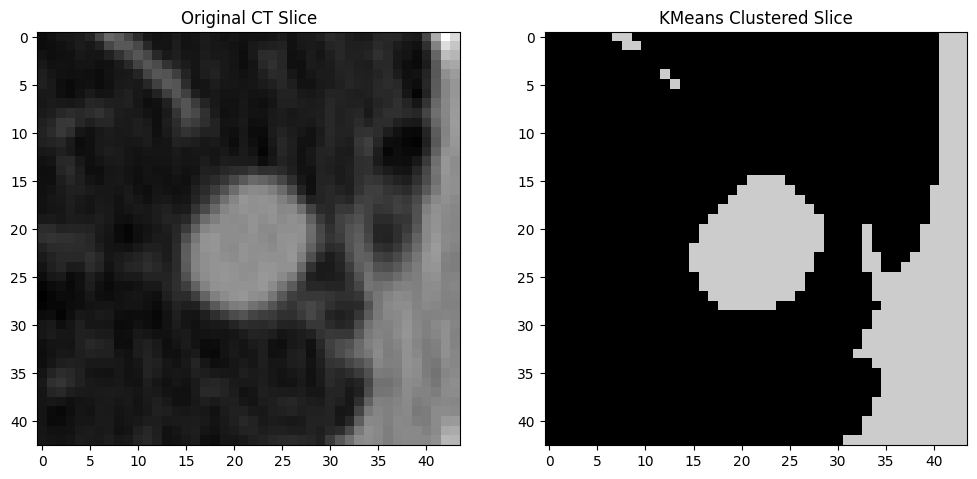

Completed segmentation for LIDC-IDRI-0491_R_9.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0649_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0649_R_1.nii.gz


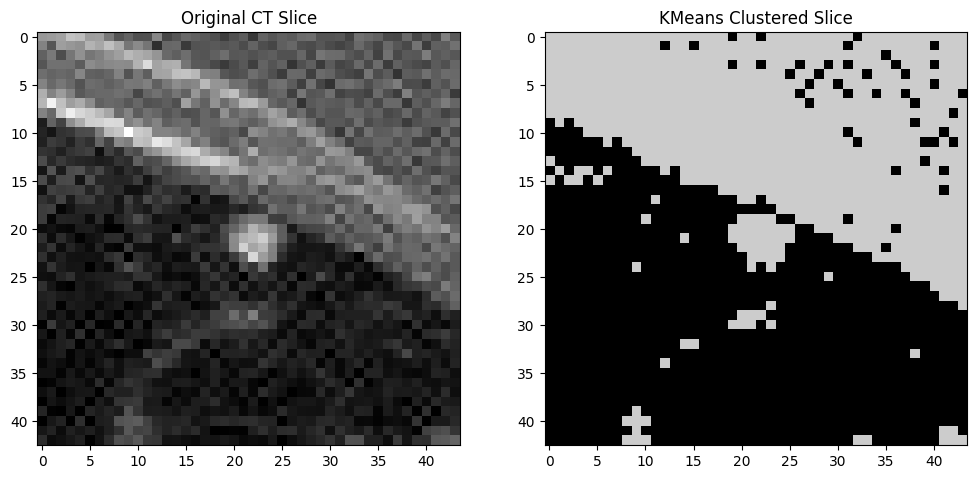

Completed segmentation for LIDC-IDRI-0649_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0576_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0576_R_3.nii.gz


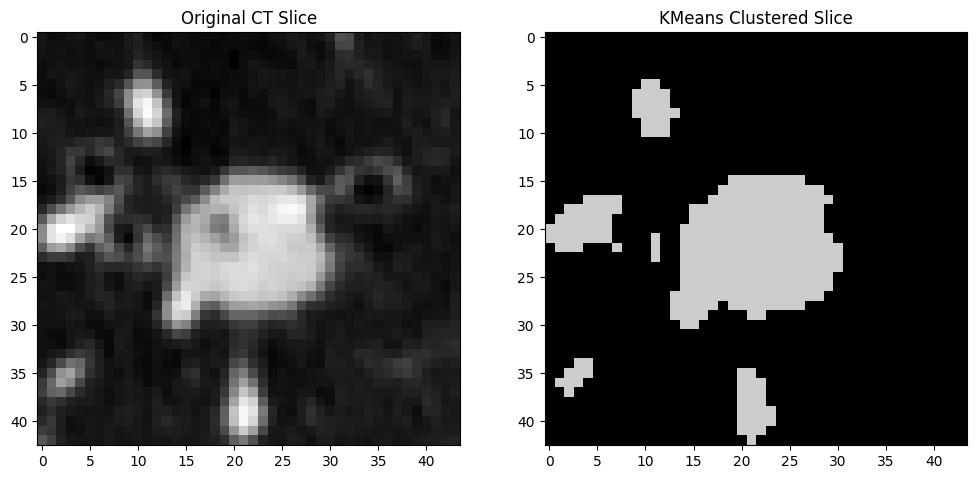

Completed segmentation for LIDC-IDRI-0576_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0613_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0613_R_1.nii.gz


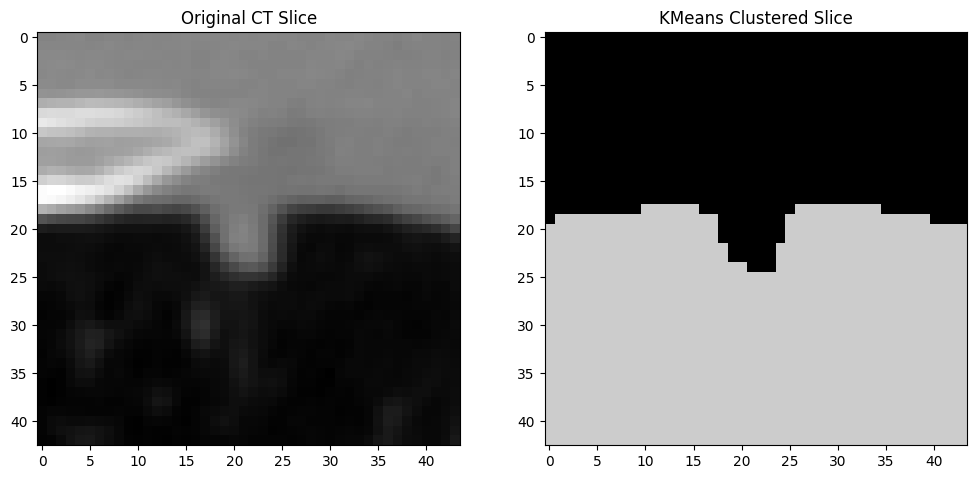

Completed segmentation for LIDC-IDRI-0613_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0192_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0192_R_4.nii.gz


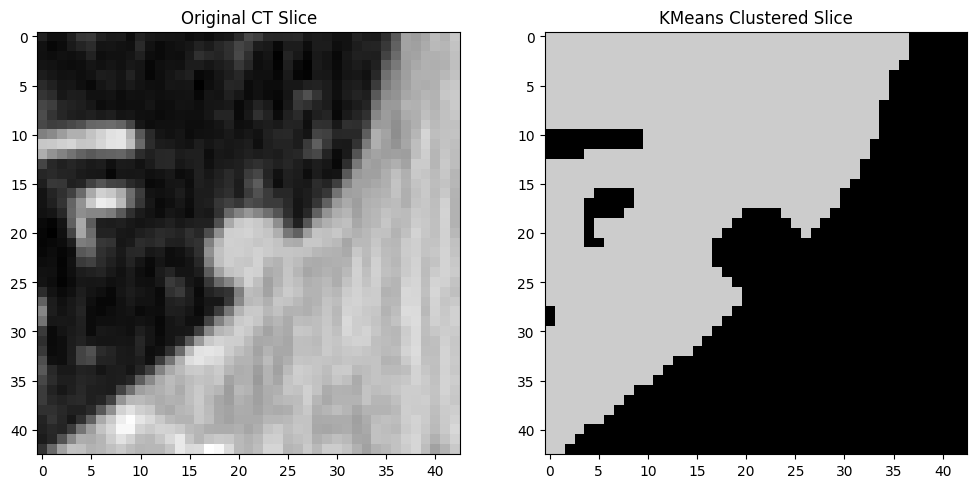

Completed segmentation for LIDC-IDRI-0192_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0311_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0311_R_2.nii.gz


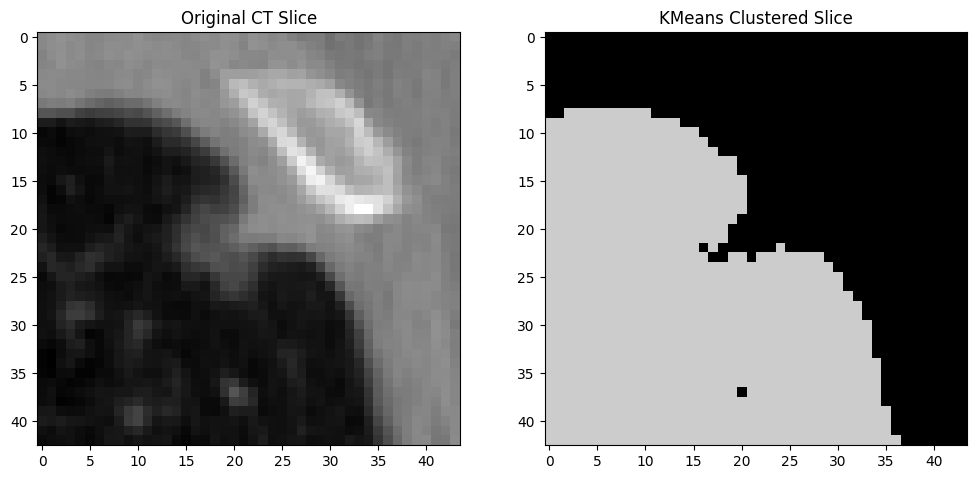

Completed segmentation for LIDC-IDRI-0311_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0394_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0394_R_4.nii.gz


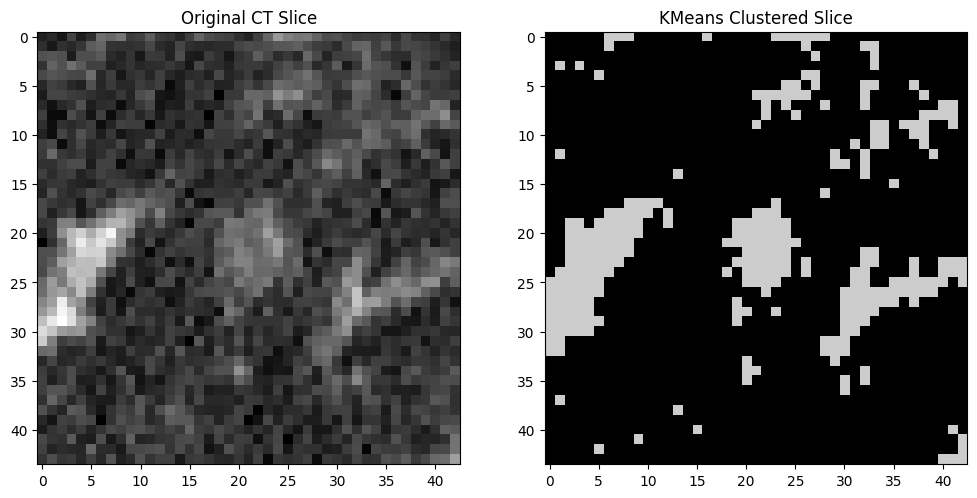

Completed segmentation for LIDC-IDRI-0394_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0448_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0448_R_2.nii.gz


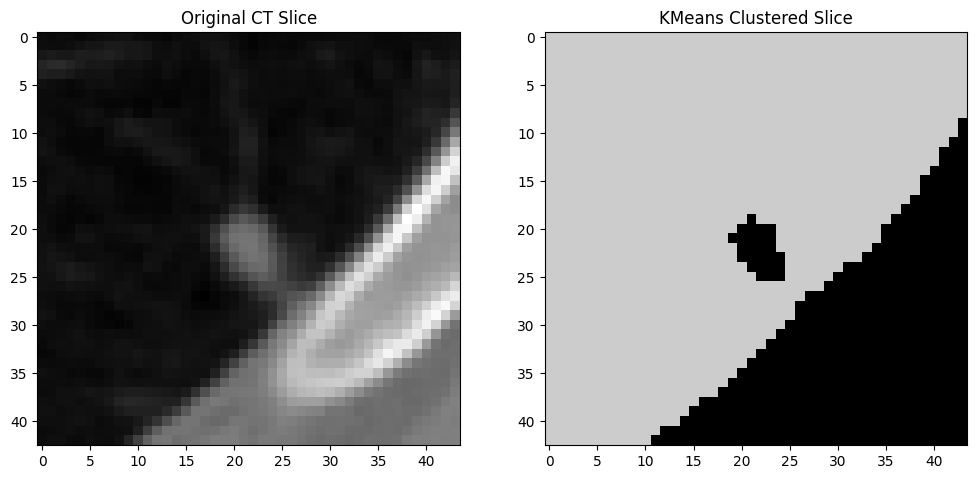

Completed segmentation for LIDC-IDRI-0448_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0651_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0651_R_1.nii.gz


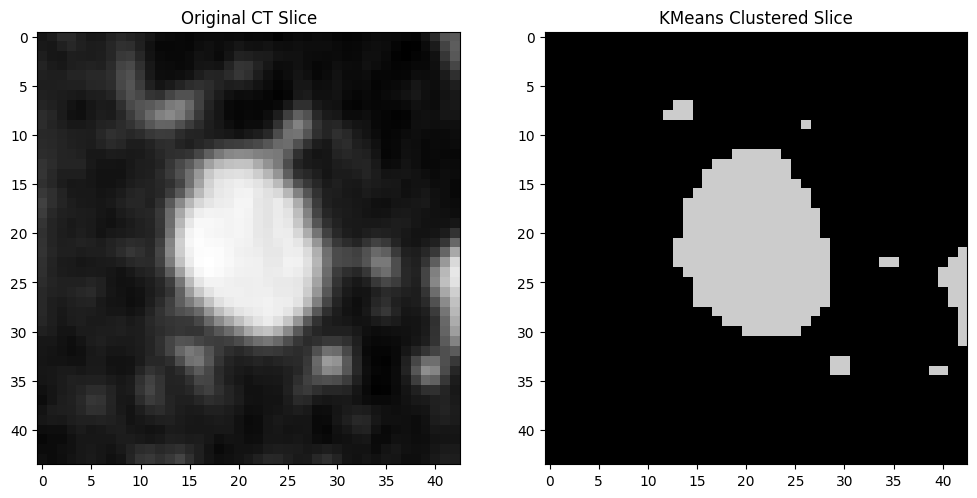

Completed segmentation for LIDC-IDRI-0651_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0604_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0604_R_2.nii.gz


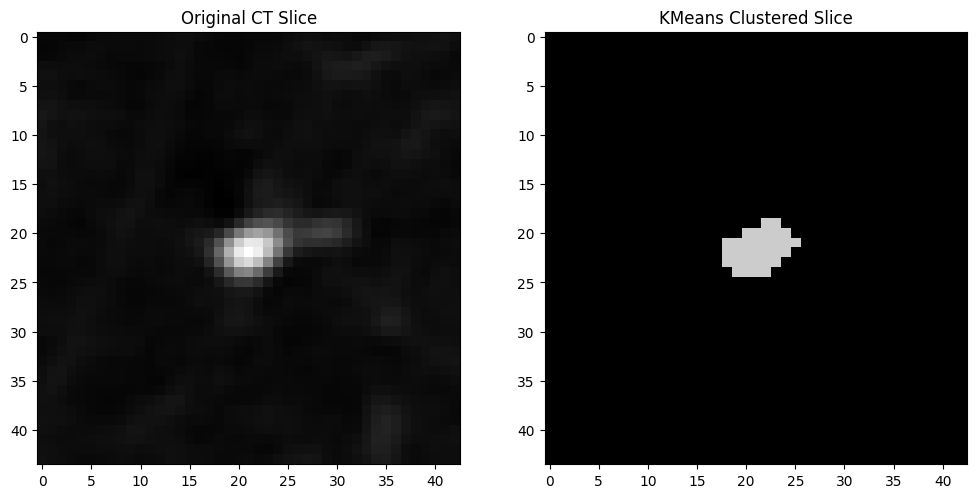

Completed segmentation for LIDC-IDRI-0604_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0163_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0163_R_1.nii.gz


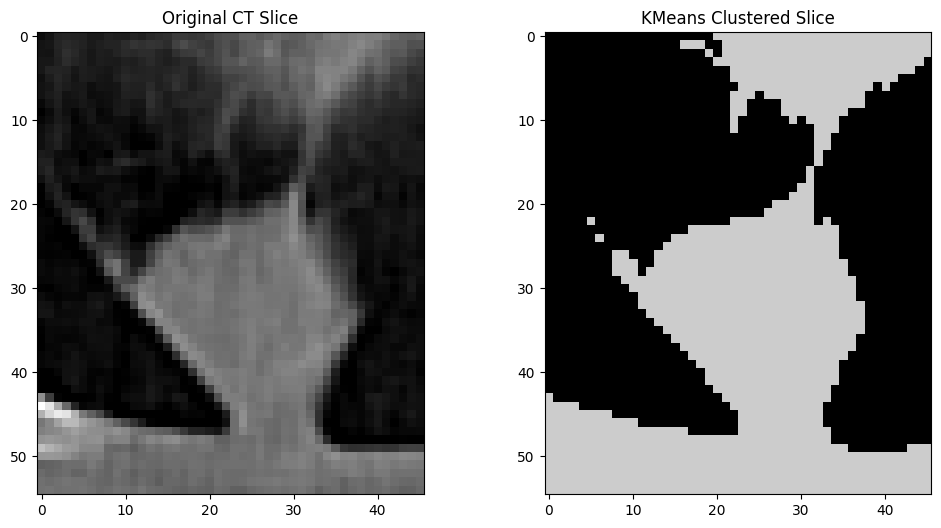

Completed segmentation for LIDC-IDRI-0163_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0164_R_11.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0164_R_11.nii.gz


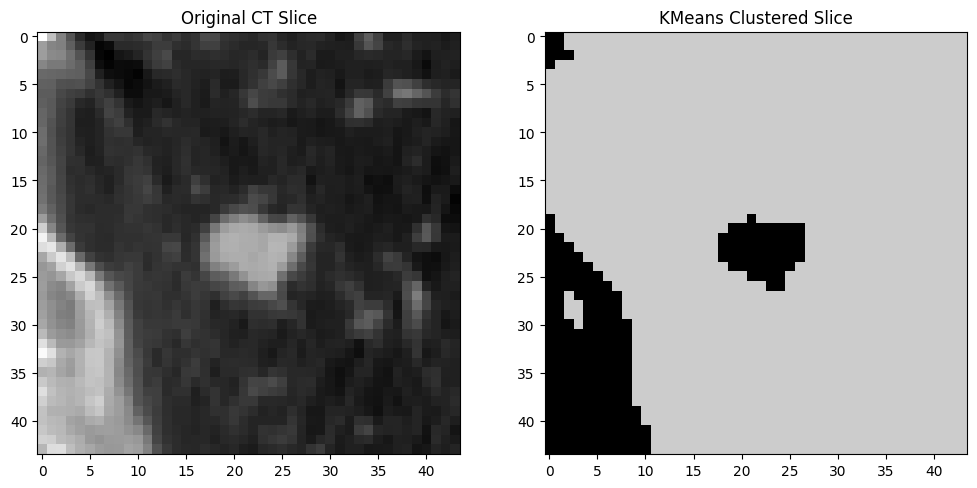

Completed segmentation for LIDC-IDRI-0164_R_11.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0460_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0460_R_1.nii.gz


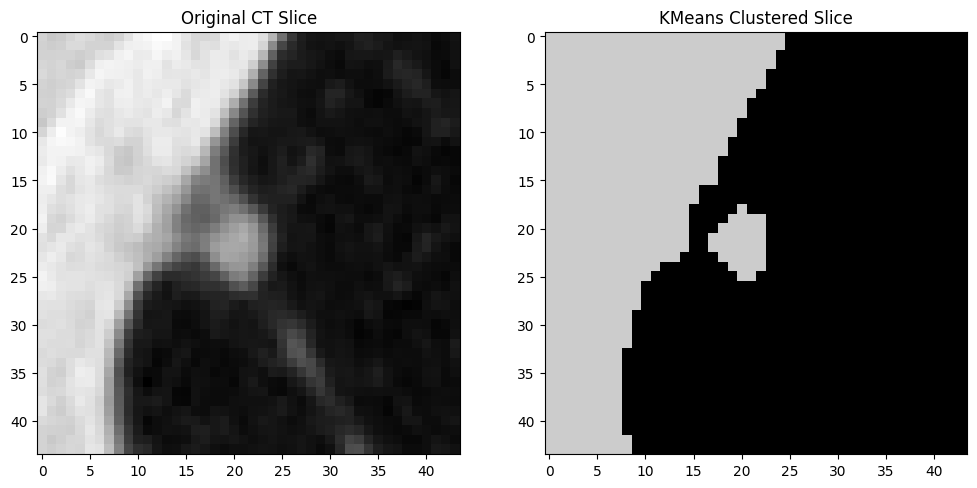

Completed segmentation for LIDC-IDRI-0460_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0451_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0451_R_1.nii.gz


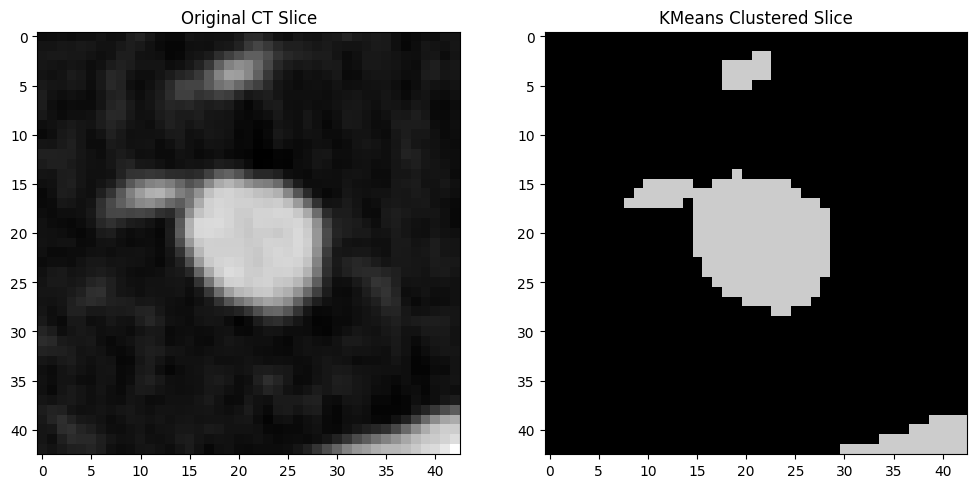

Completed segmentation for LIDC-IDRI-0451_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0371_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0371_R_1.nii.gz


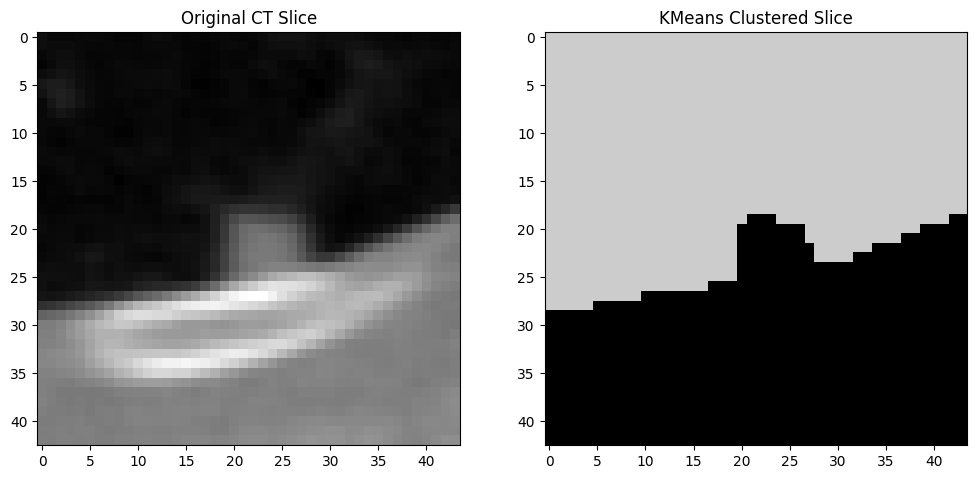

Completed segmentation for LIDC-IDRI-0371_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0398_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0398_R_4.nii.gz


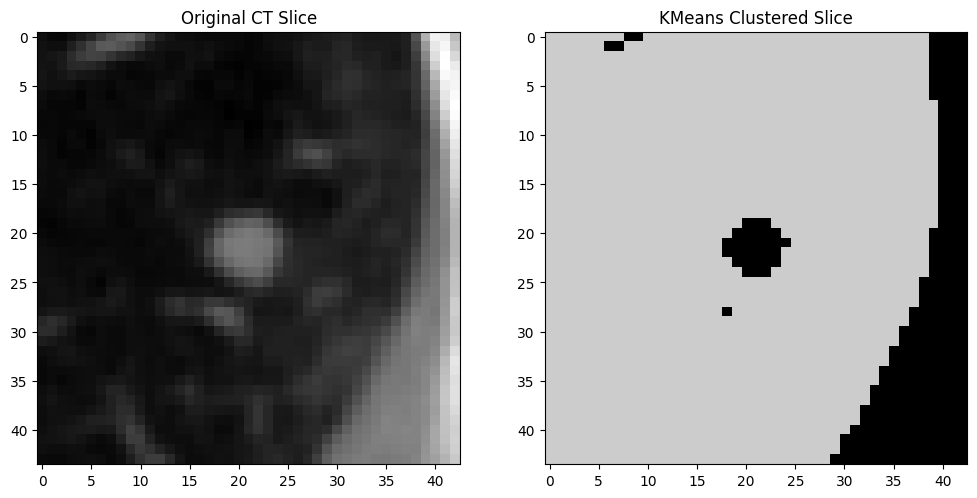

Completed segmentation for LIDC-IDRI-0398_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0298_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0298_R_1.nii.gz


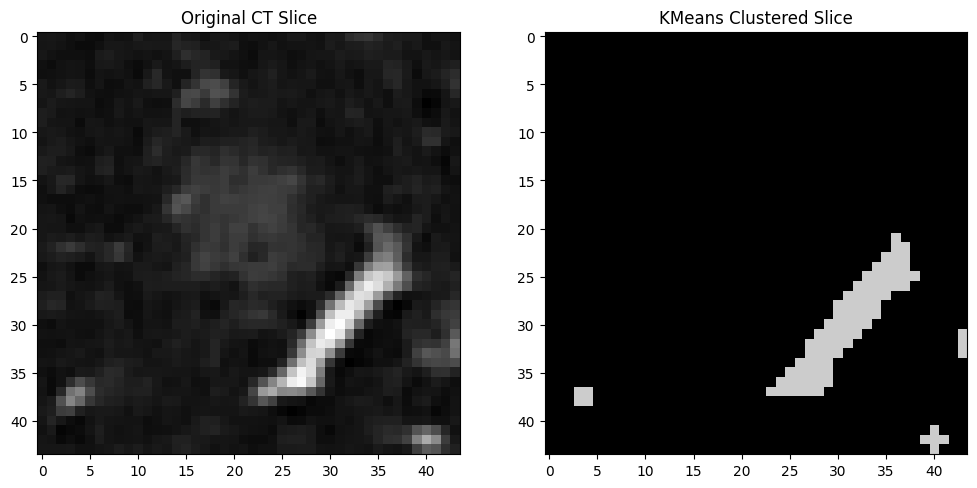

Completed segmentation for LIDC-IDRI-0298_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0583_R_10.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0583_R_10.nii.gz


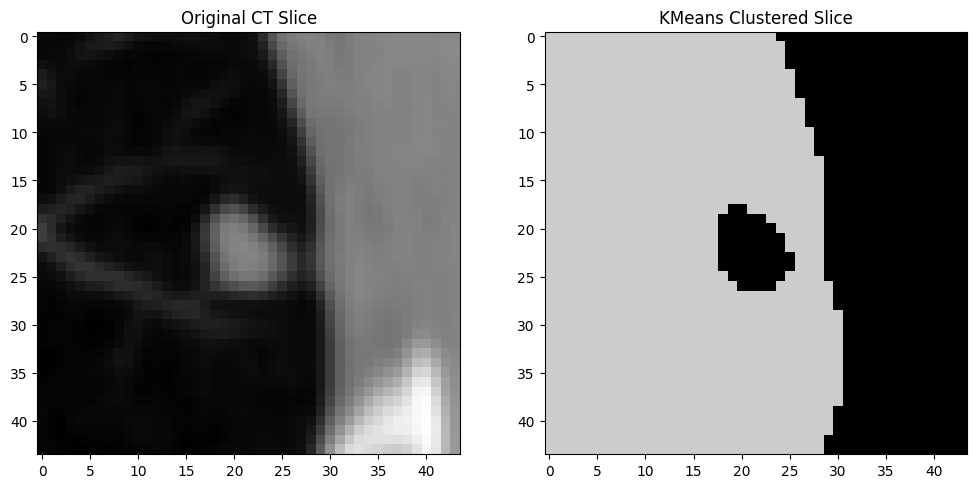

Completed segmentation for LIDC-IDRI-0583_R_10.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0408_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0408_R_2.nii.gz


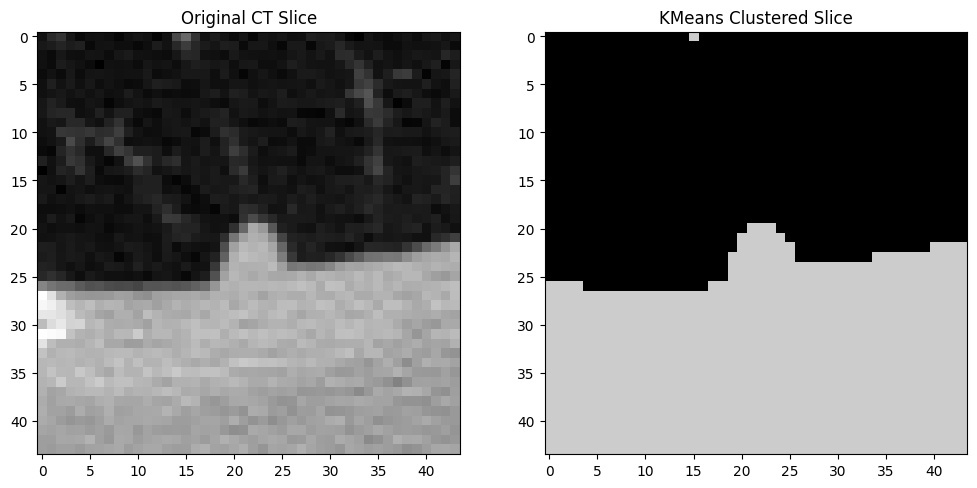

Completed segmentation for LIDC-IDRI-0408_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0250_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0250_R_2.nii.gz


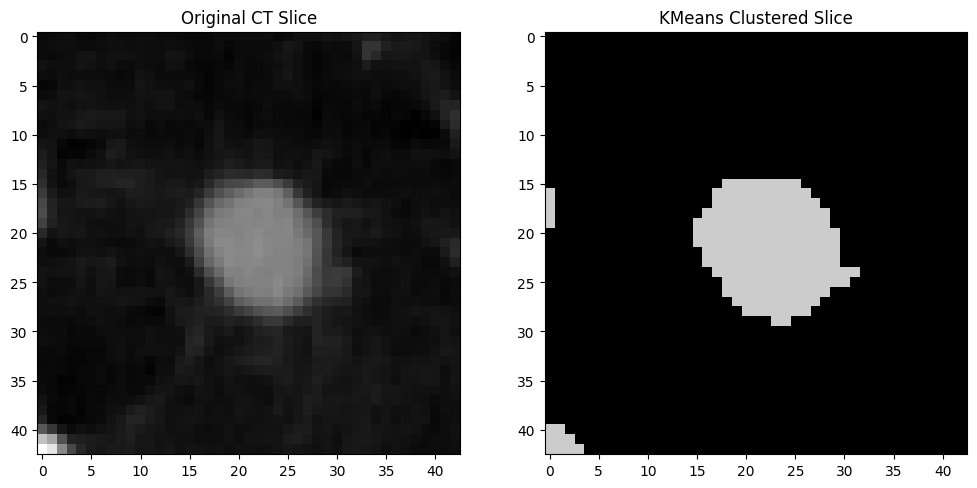

Completed segmentation for LIDC-IDRI-0250_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0409_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0409_R_1.nii.gz


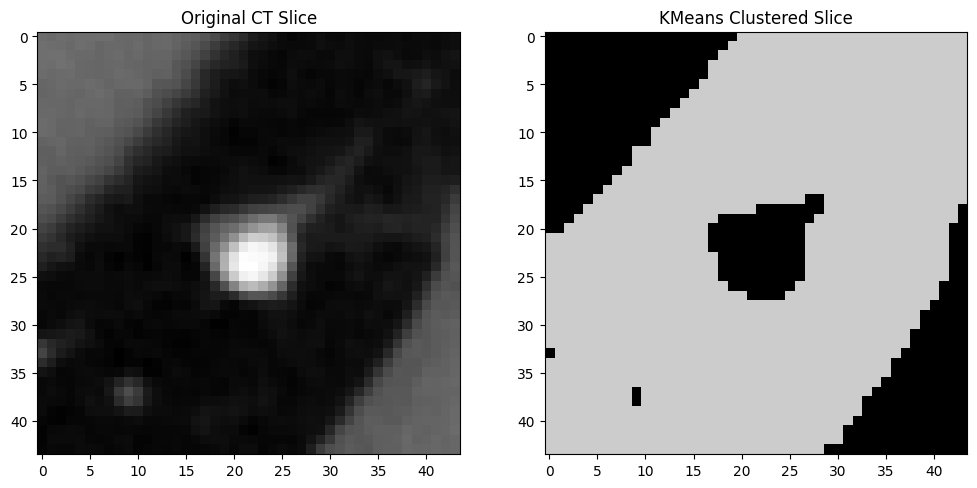

Completed segmentation for LIDC-IDRI-0409_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0440_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0440_R_2.nii.gz


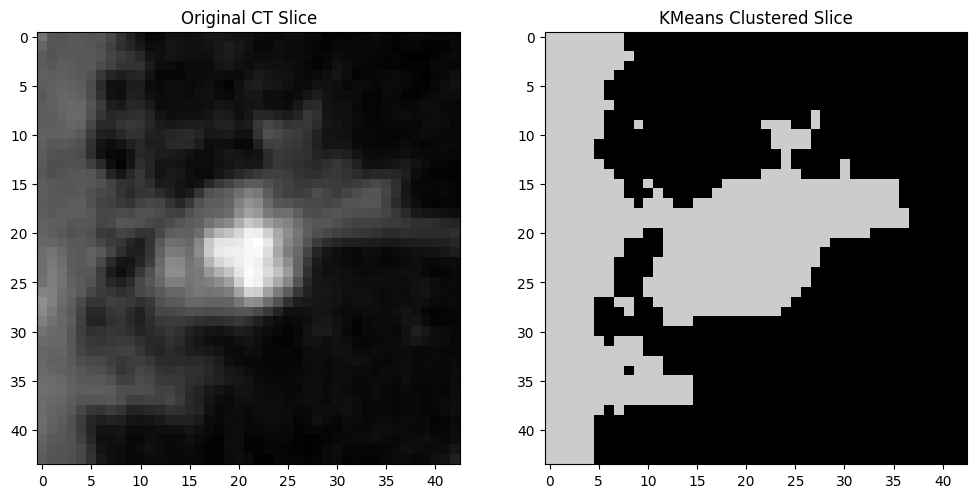

Completed segmentation for LIDC-IDRI-0440_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0476_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0476_R_2.nii.gz


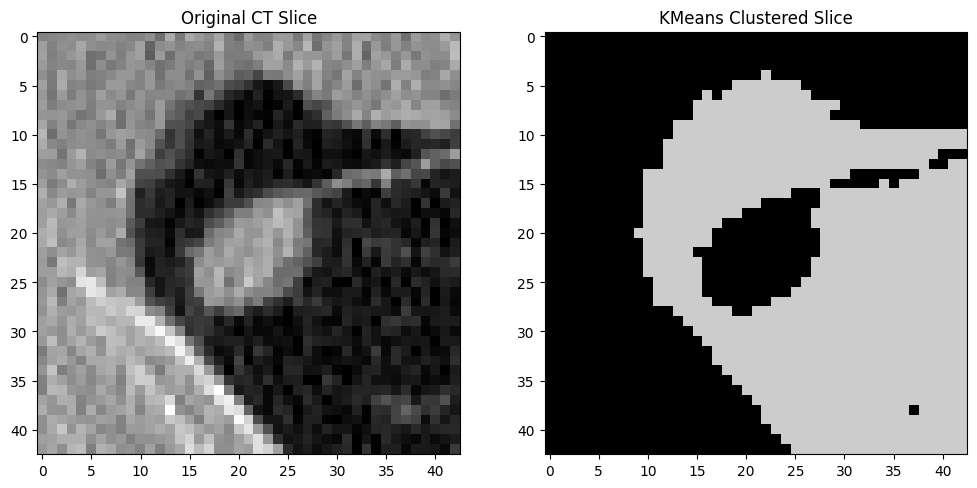

Completed segmentation for LIDC-IDRI-0476_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0237_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0237_R_3.nii.gz


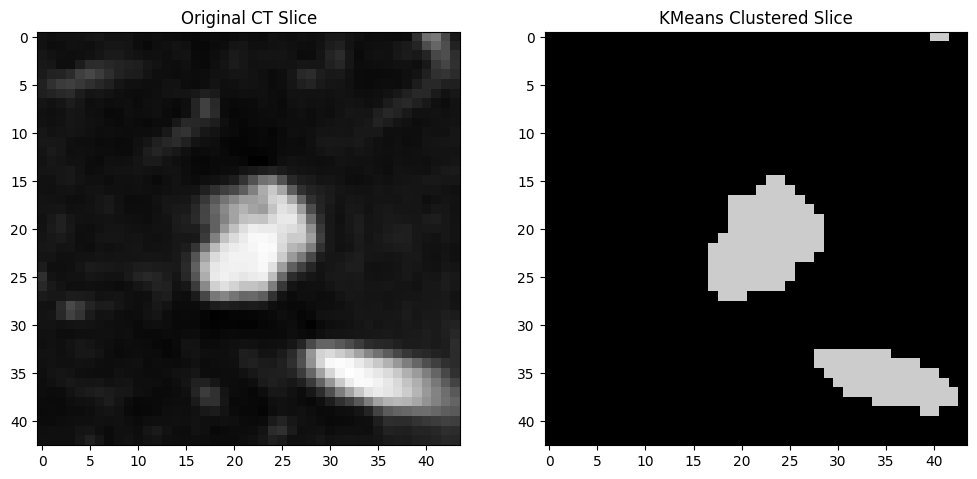

Completed segmentation for LIDC-IDRI-0237_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0674_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0674_R_5.nii.gz


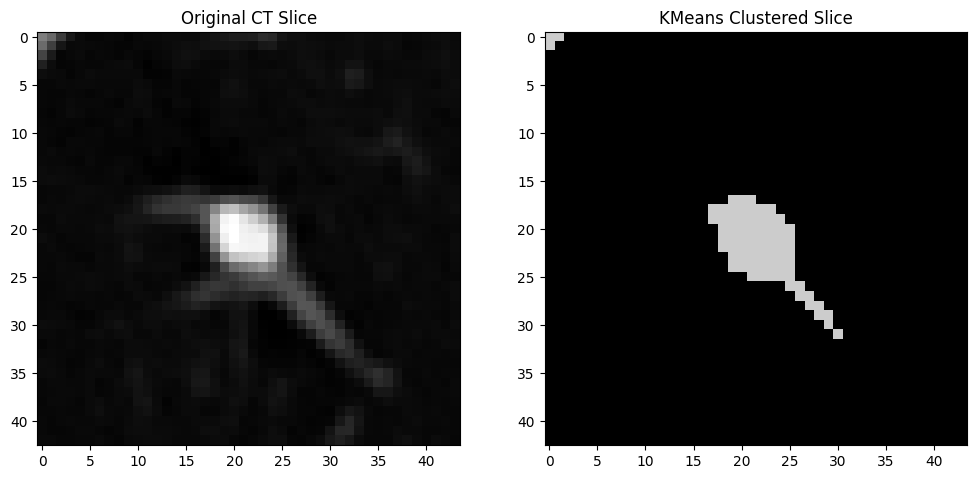

Completed segmentation for LIDC-IDRI-0674_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0262_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0262_R_1.nii.gz


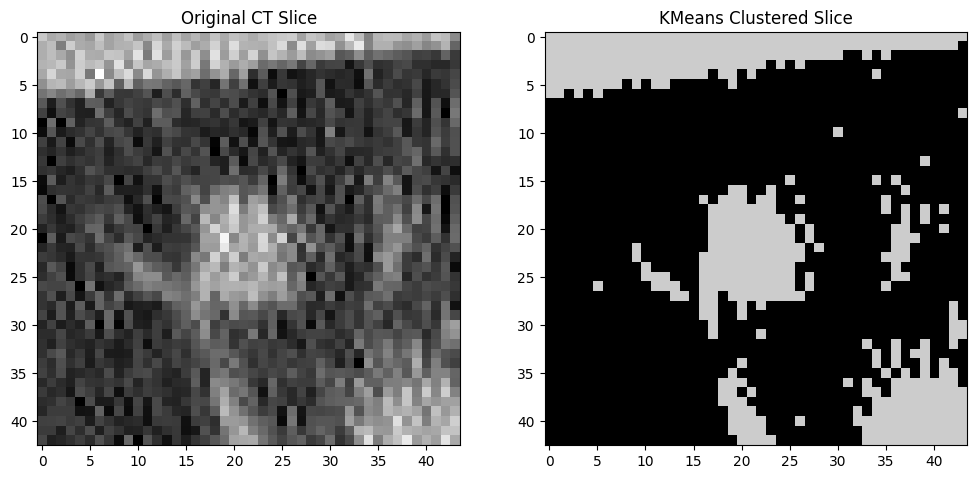

Completed segmentation for LIDC-IDRI-0262_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0625_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0625_R_1.nii.gz


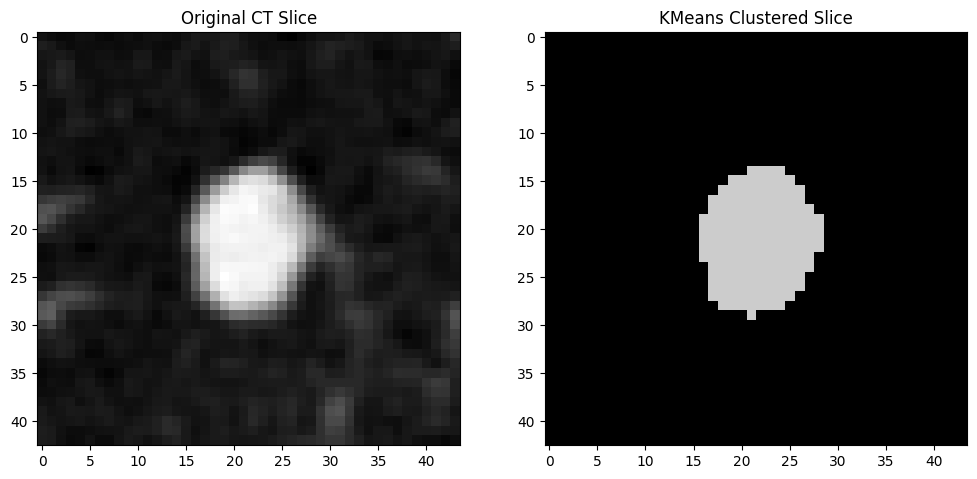

Completed segmentation for LIDC-IDRI-0625_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0206_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0206_R_4.nii.gz


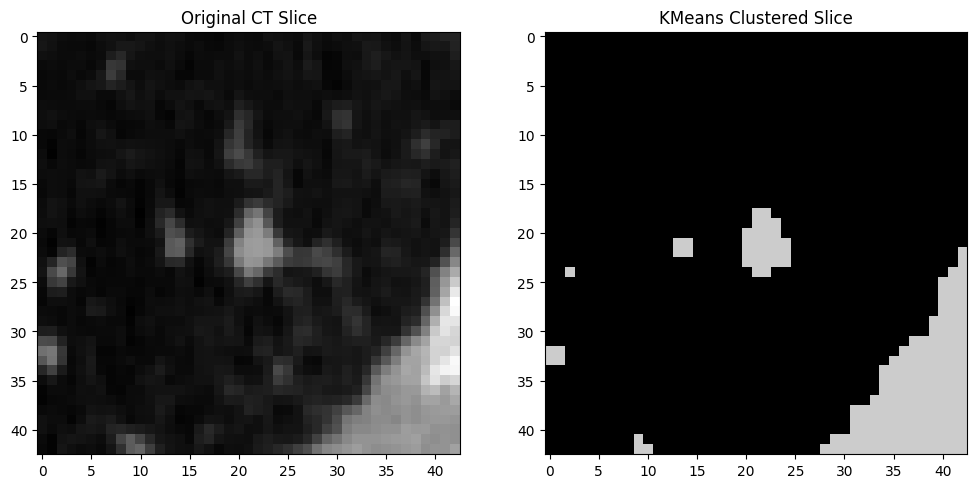

Completed segmentation for LIDC-IDRI-0206_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0388_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0388_R_2.nii.gz


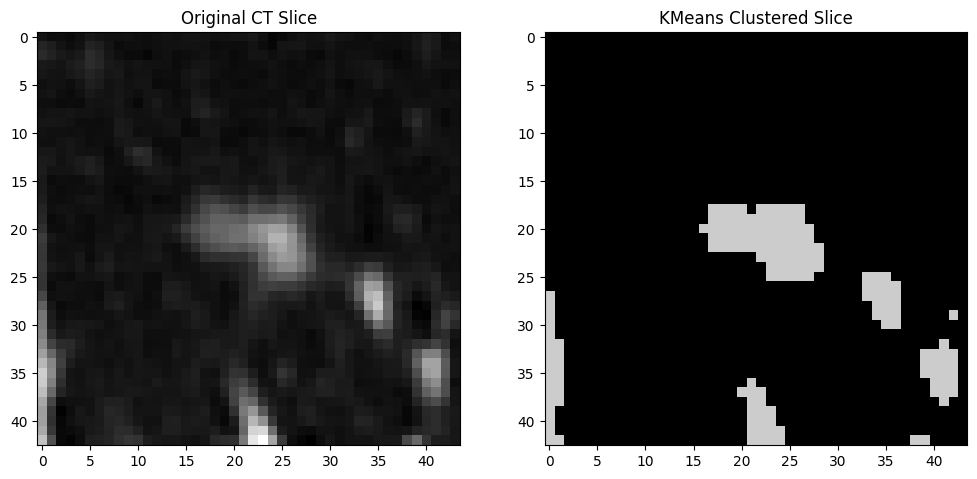

Completed segmentation for LIDC-IDRI-0388_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0568_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0568_R_3.nii.gz


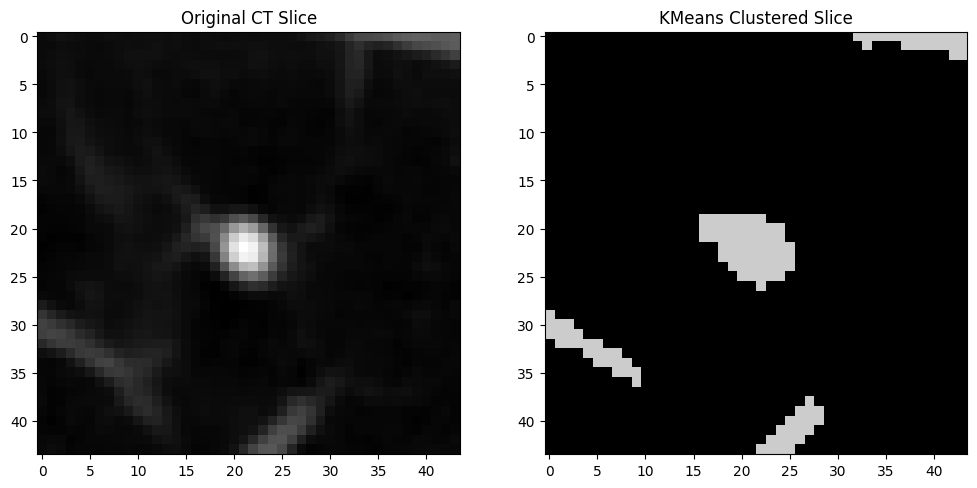

Completed segmentation for LIDC-IDRI-0568_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0209_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0209_R_1.nii.gz


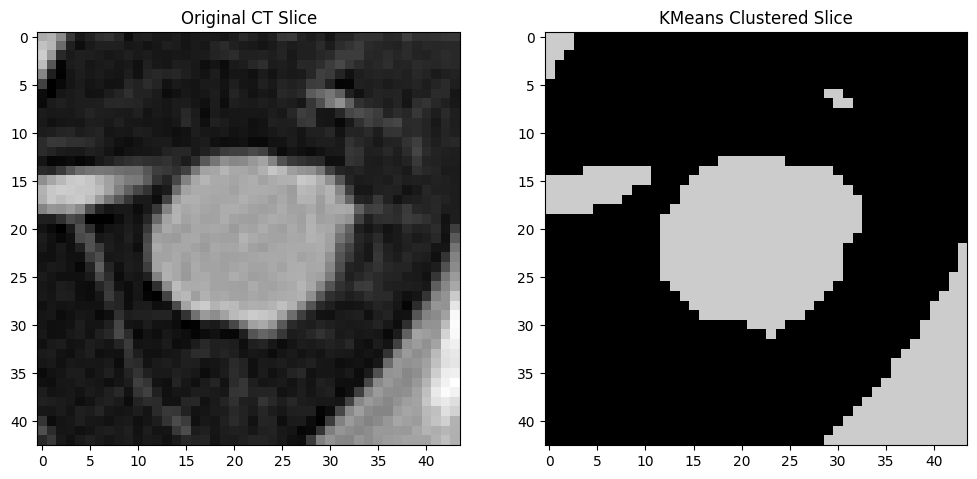

Completed segmentation for LIDC-IDRI-0209_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0199_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0199_R_4.nii.gz


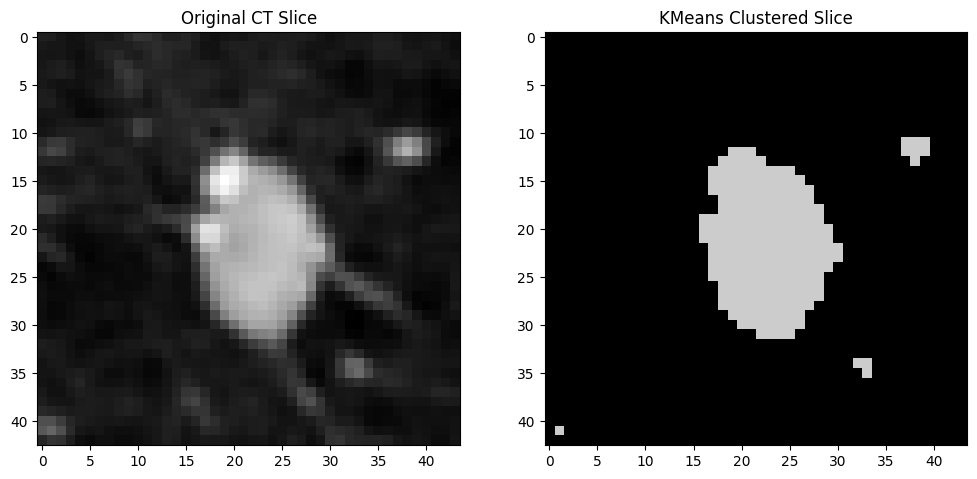

Completed segmentation for LIDC-IDRI-0199_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0481_R_7.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0481_R_7.nii.gz


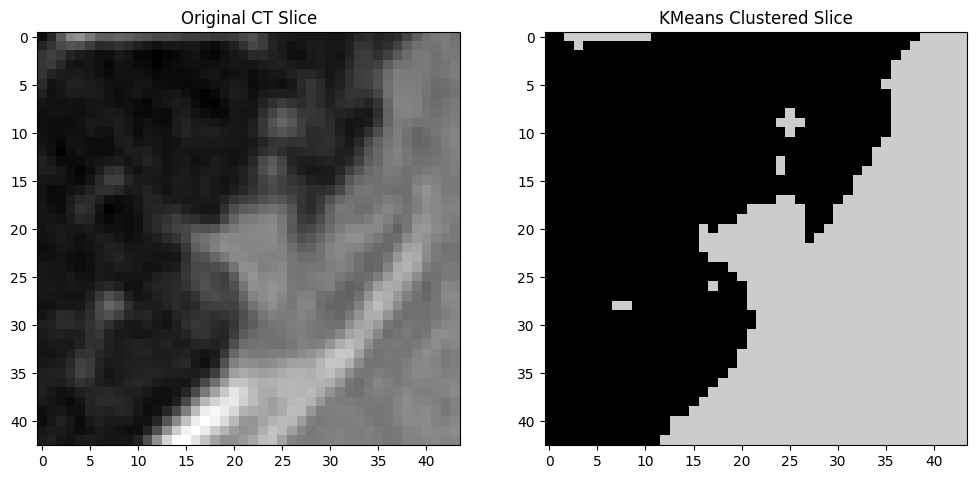

Completed segmentation for LIDC-IDRI-0481_R_7.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0651_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0651_R_3.nii.gz


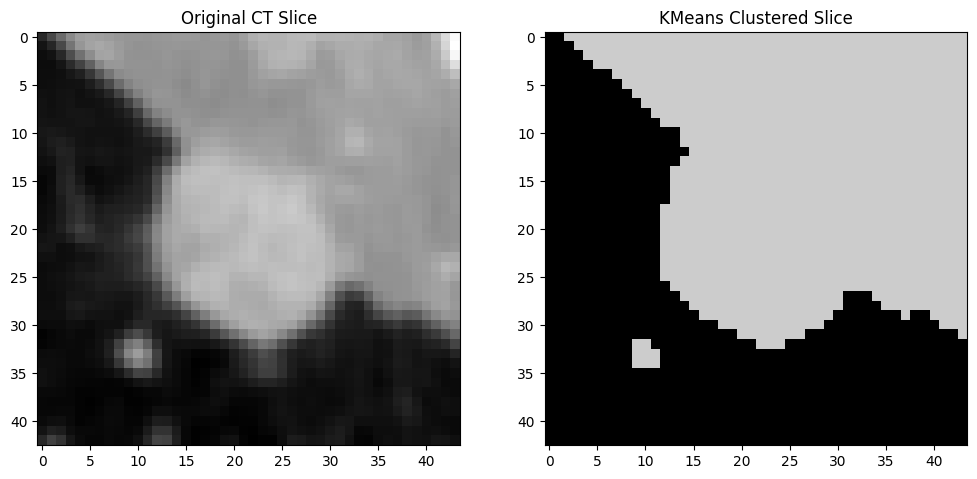

Completed segmentation for LIDC-IDRI-0651_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0507_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0507_R_3.nii.gz


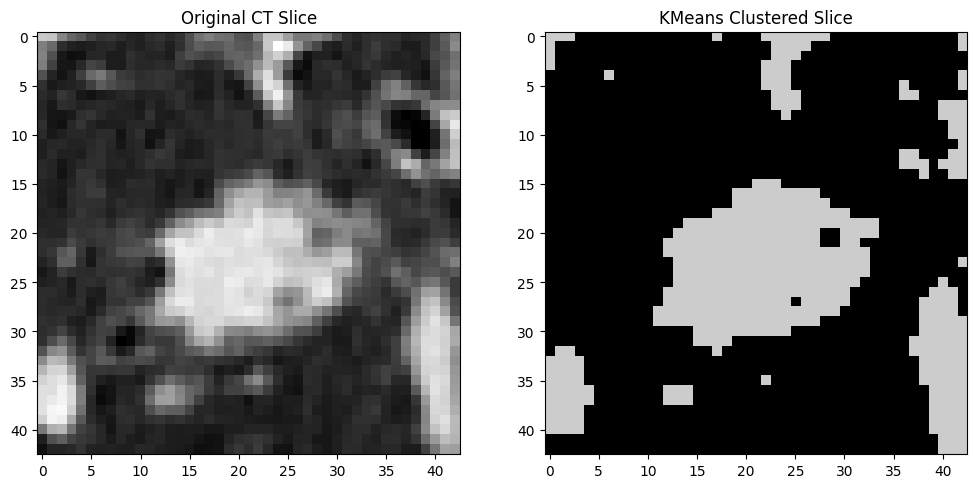

Completed segmentation for LIDC-IDRI-0507_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0692_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0692_R_1.nii.gz


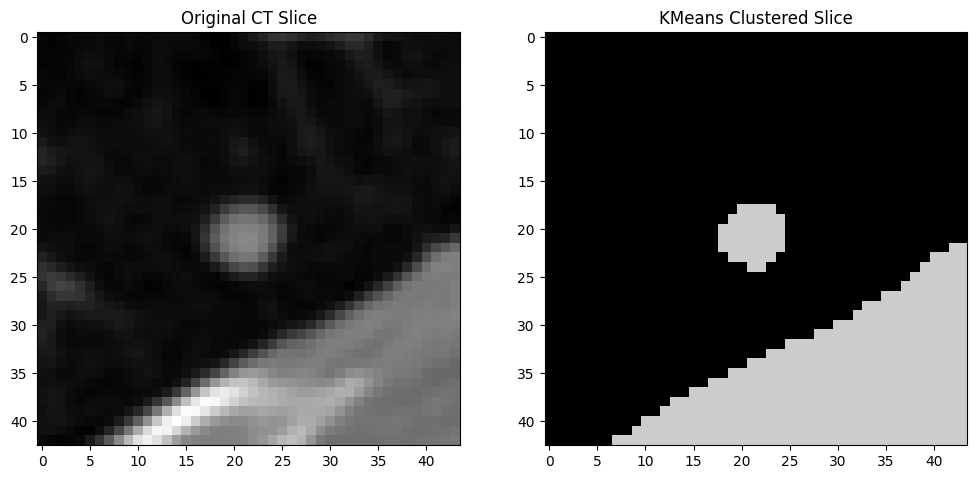

Completed segmentation for LIDC-IDRI-0692_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0694_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0694_R_1.nii.gz


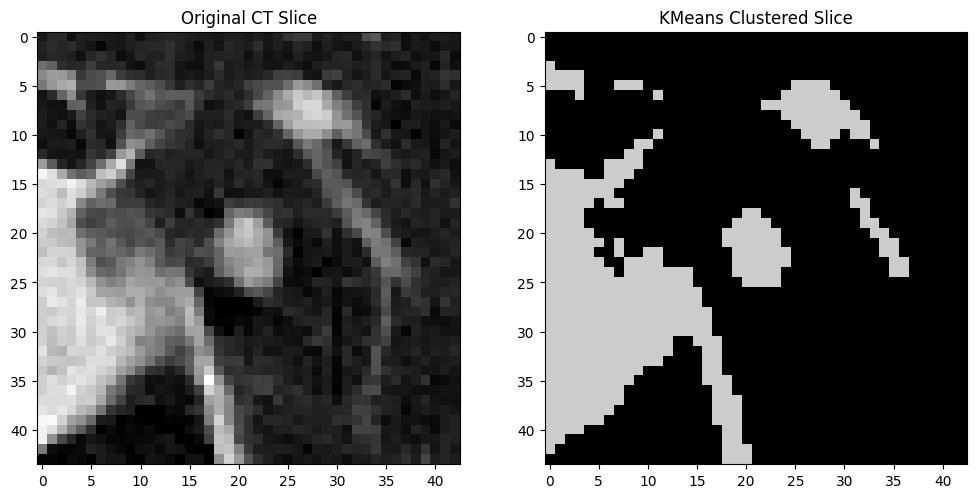

Completed segmentation for LIDC-IDRI-0694_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0301_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0301_R_2.nii.gz


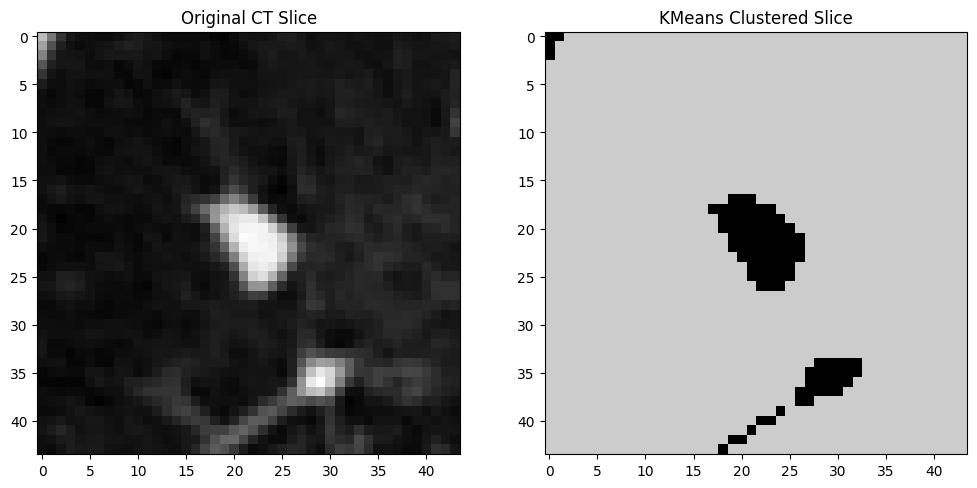

Completed segmentation for LIDC-IDRI-0301_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0264_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0264_R_1.nii.gz


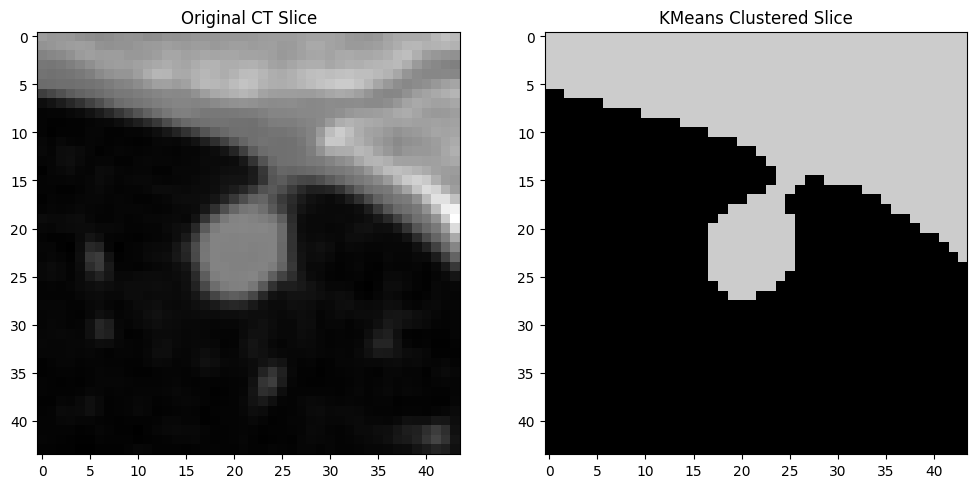

Completed segmentation for LIDC-IDRI-0264_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0458_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0458_R_3.nii.gz


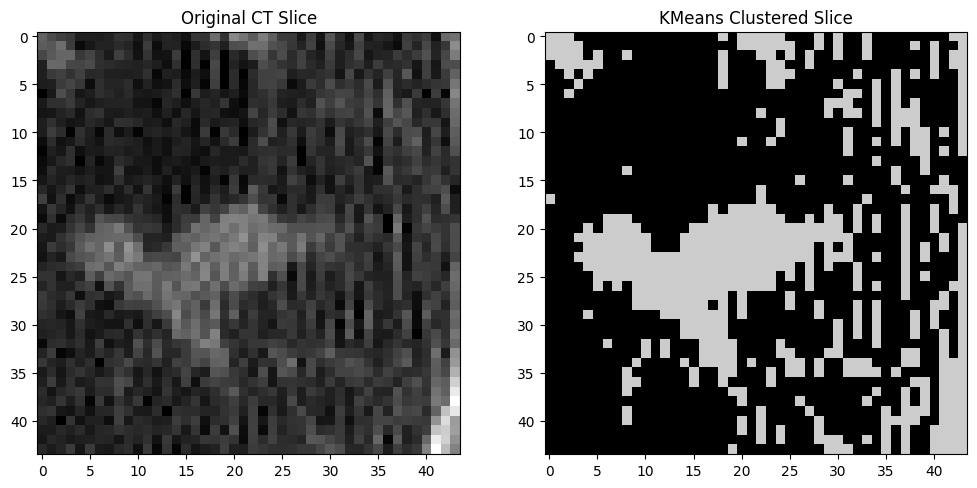

Completed segmentation for LIDC-IDRI-0458_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0477_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0477_R_2.nii.gz


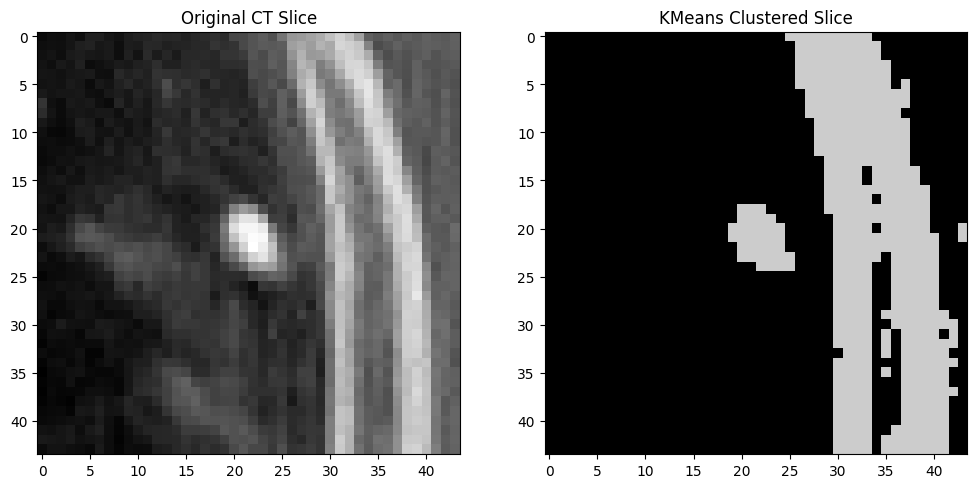

Completed segmentation for LIDC-IDRI-0477_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0610_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0610_R_2.nii.gz


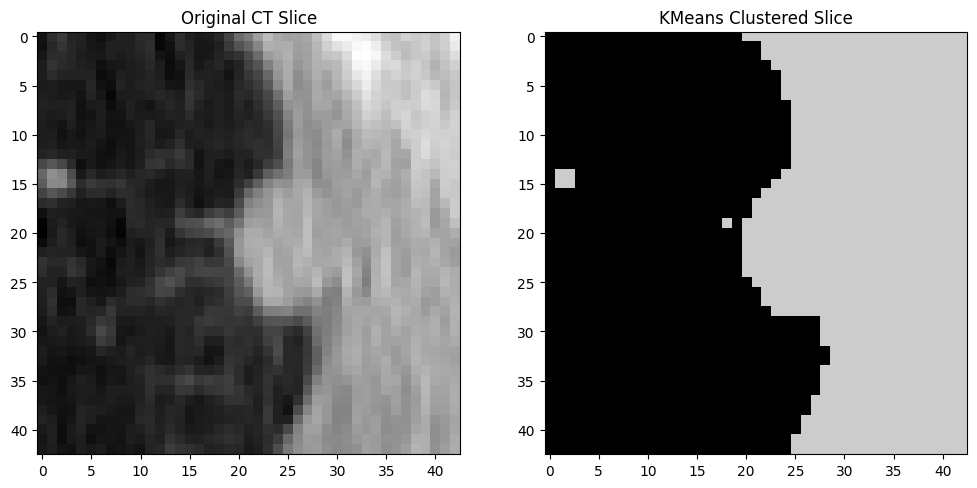

Completed segmentation for LIDC-IDRI-0610_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0649_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0649_R_6.nii.gz


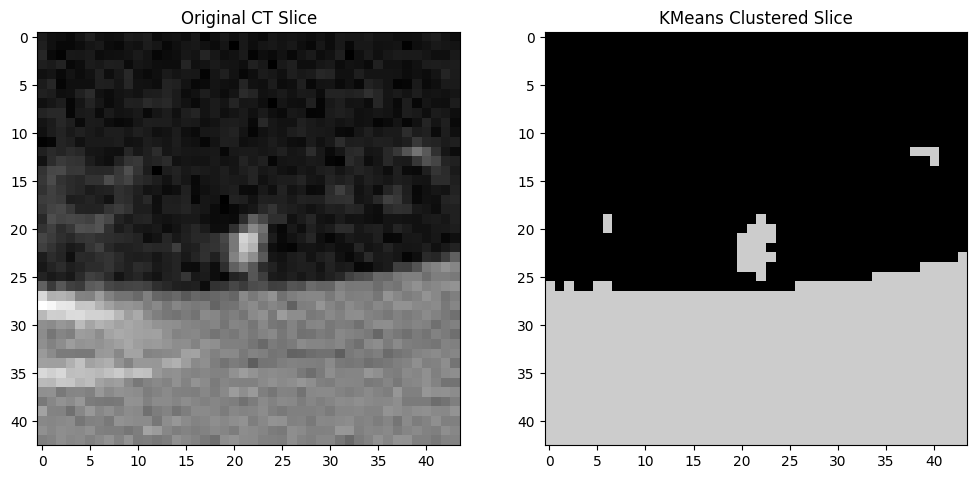

Completed segmentation for LIDC-IDRI-0649_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0356_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0356_R_4.nii.gz


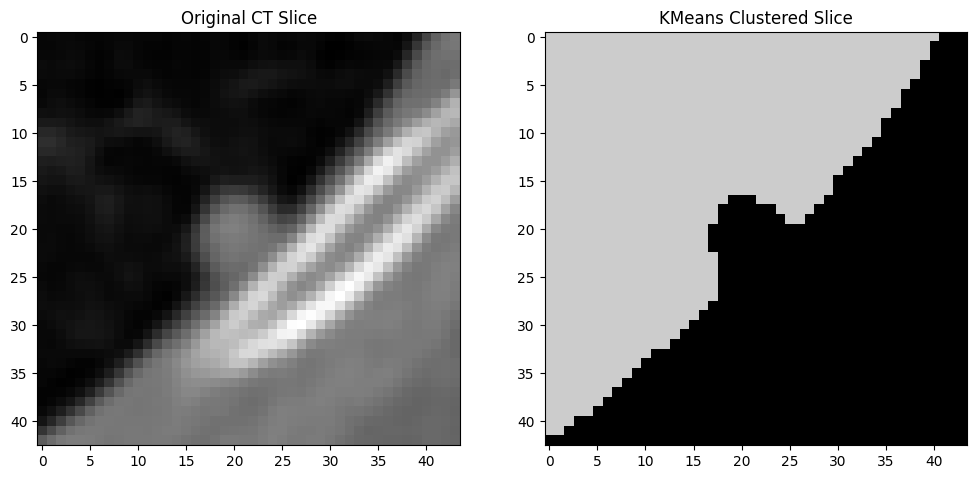

Completed segmentation for LIDC-IDRI-0356_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0222_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0222_R_1.nii.gz


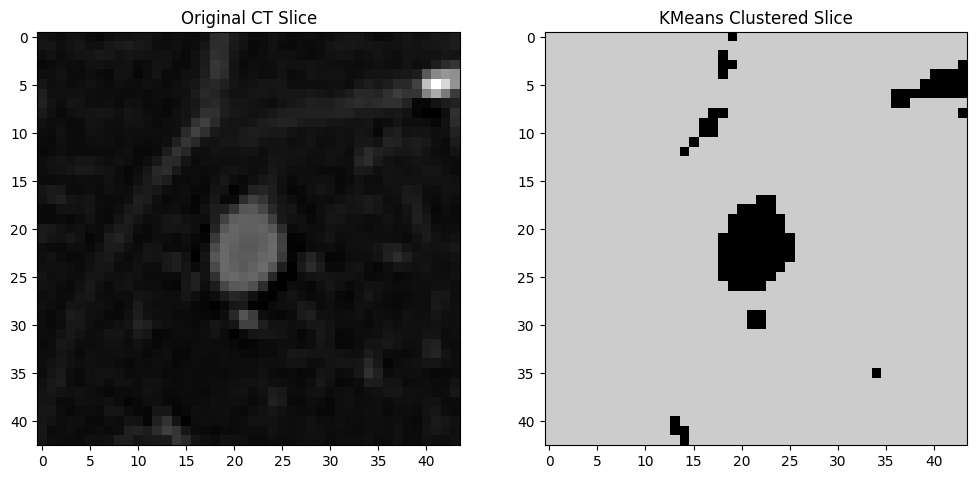

Completed segmentation for LIDC-IDRI-0222_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0633_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0633_R_1.nii.gz


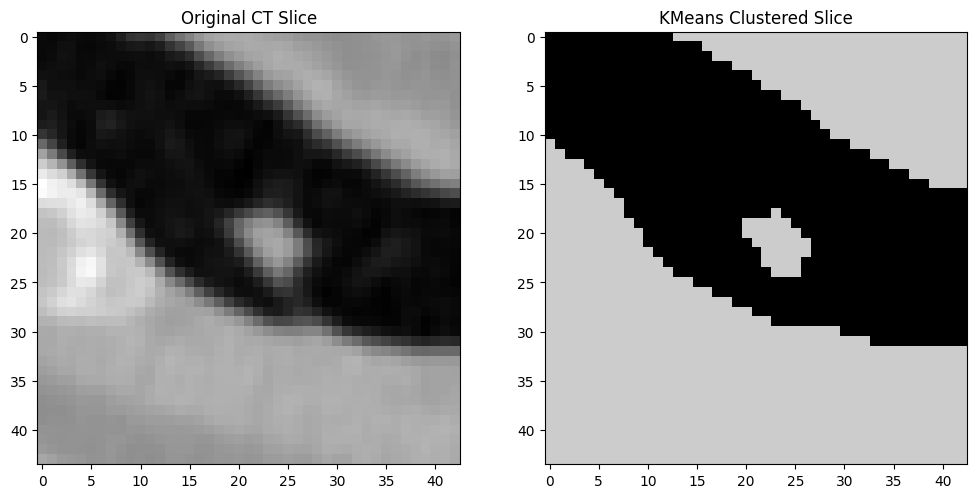

Completed segmentation for LIDC-IDRI-0633_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0298_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0298_R_5.nii.gz


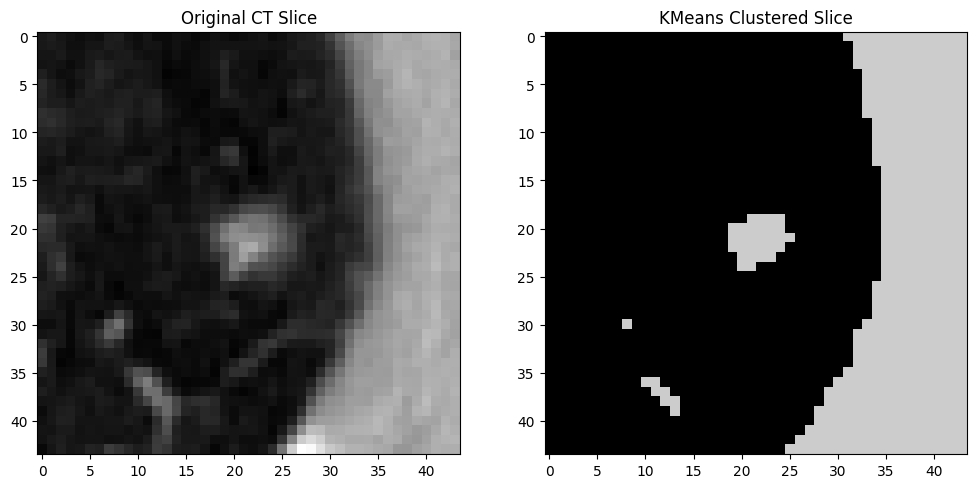

Completed segmentation for LIDC-IDRI-0298_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0196_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0196_R_1.nii.gz


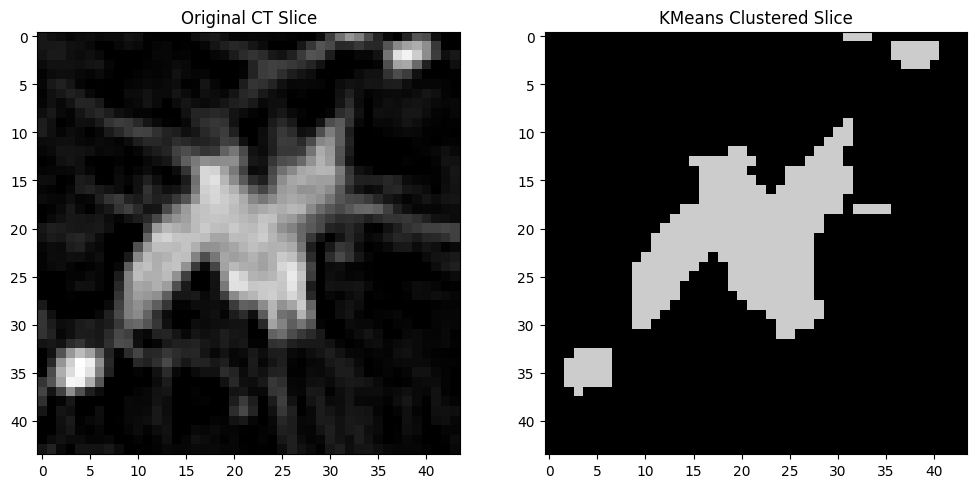

Completed segmentation for LIDC-IDRI-0196_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0250_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0250_R_1.nii.gz


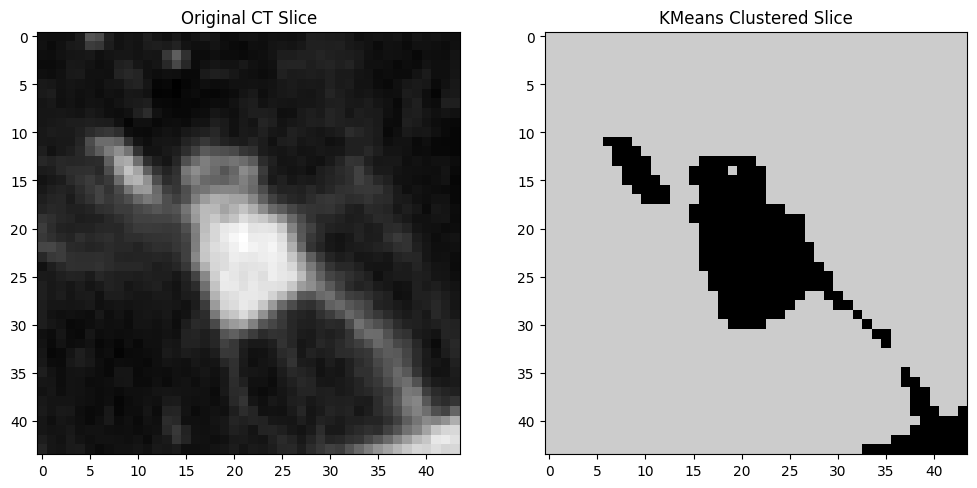

Completed segmentation for LIDC-IDRI-0250_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0220_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0220_R_2.nii.gz


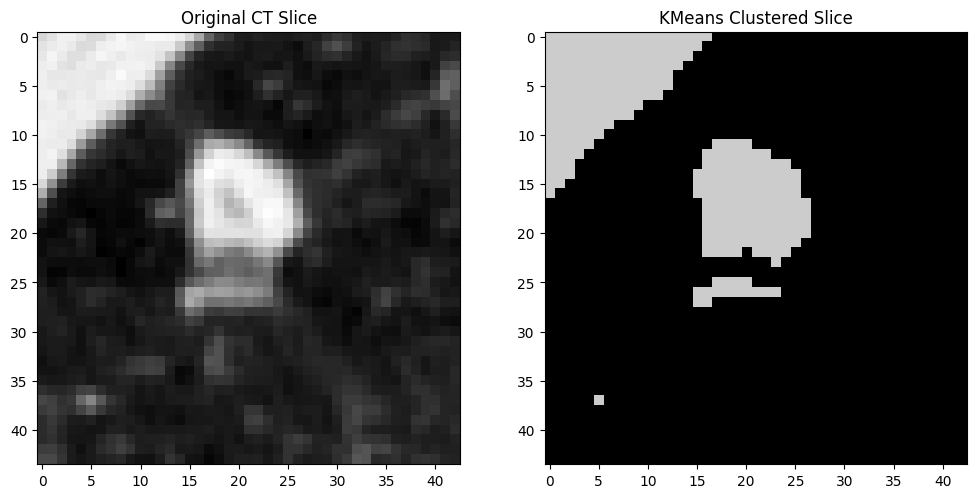

Completed segmentation for LIDC-IDRI-0220_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0454_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0454_R_4.nii.gz


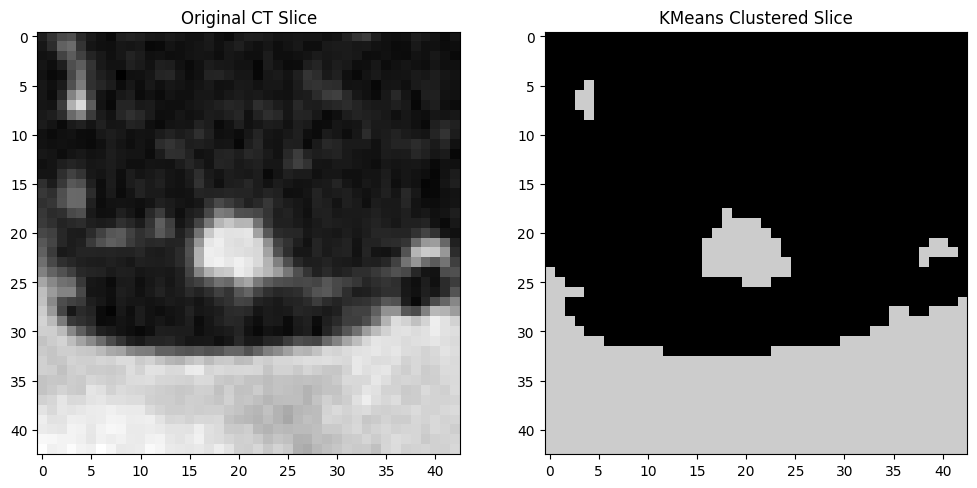

Completed segmentation for LIDC-IDRI-0454_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0283_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0283_R_1.nii.gz


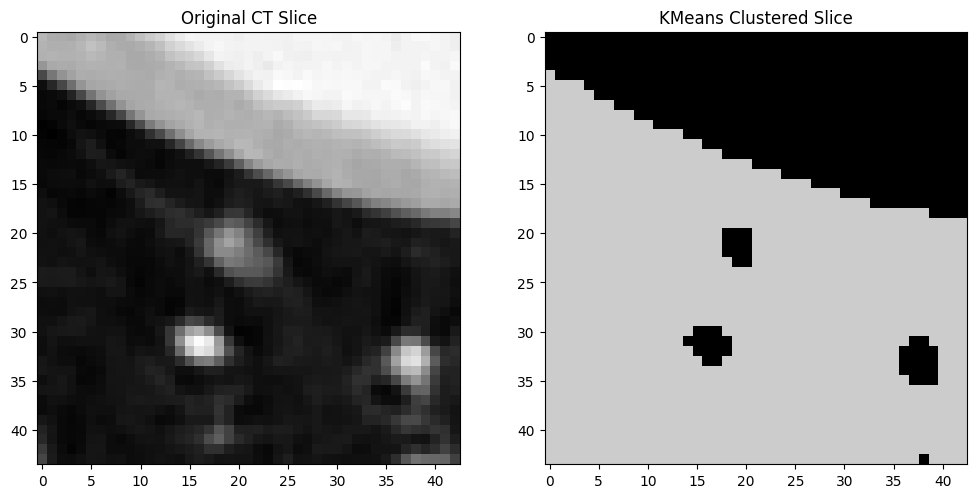

Completed segmentation for LIDC-IDRI-0283_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0300_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0300_R_2.nii.gz


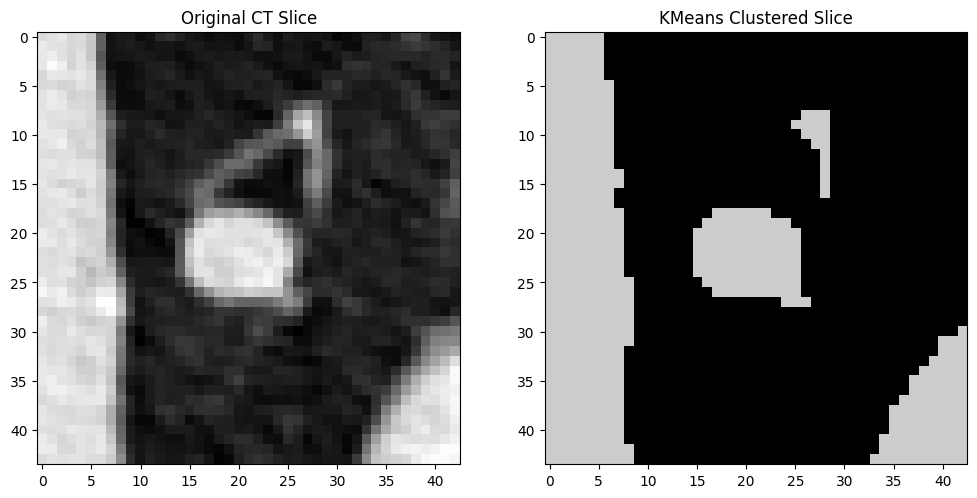

Completed segmentation for LIDC-IDRI-0300_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0491_R_8.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0491_R_8.nii.gz


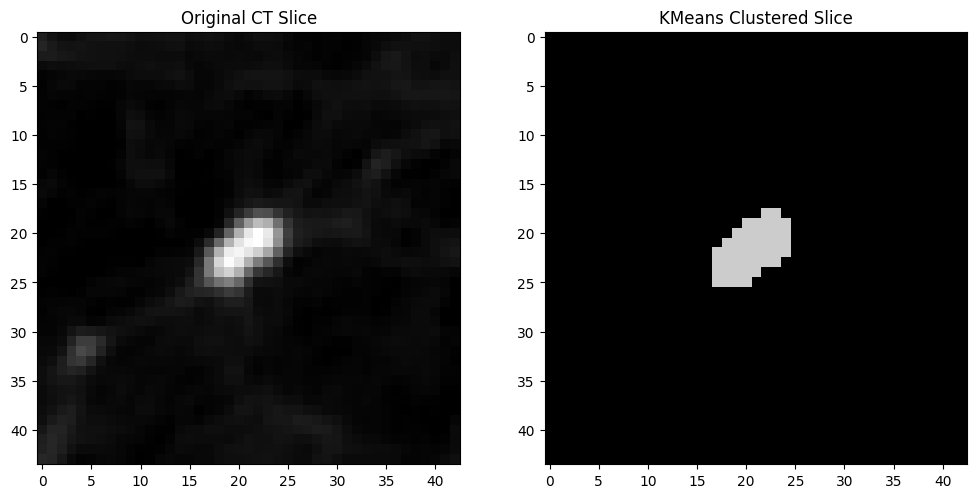

Completed segmentation for LIDC-IDRI-0491_R_8.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0286_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0286_R_1.nii.gz


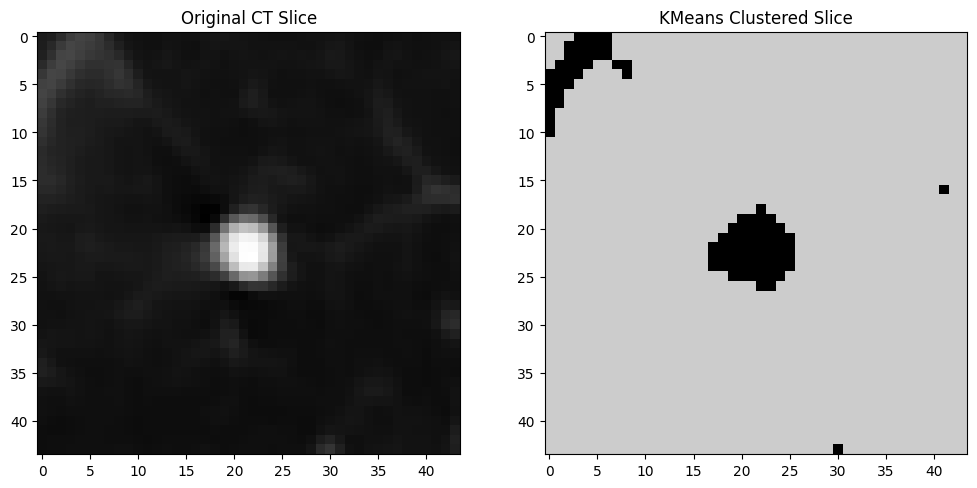

Completed segmentation for LIDC-IDRI-0286_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0394_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0394_R_6.nii.gz


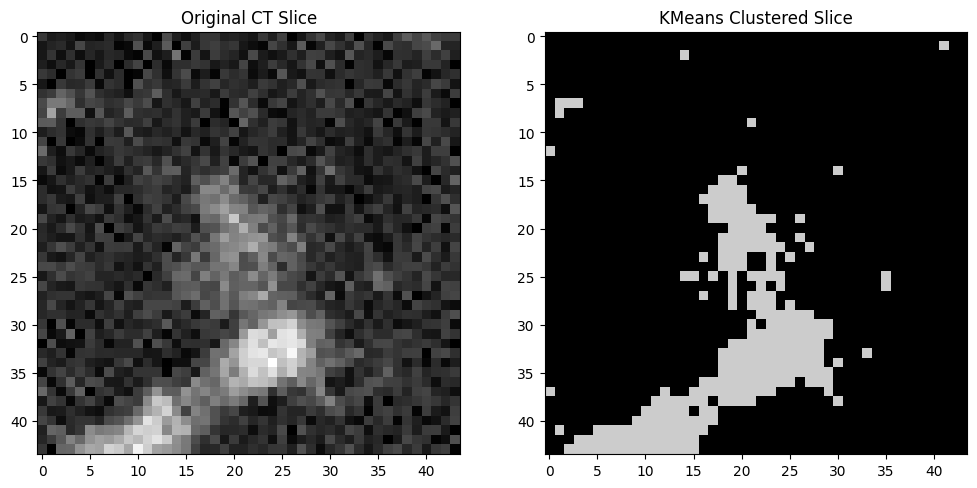

Completed segmentation for LIDC-IDRI-0394_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0562_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0562_R_2.nii.gz


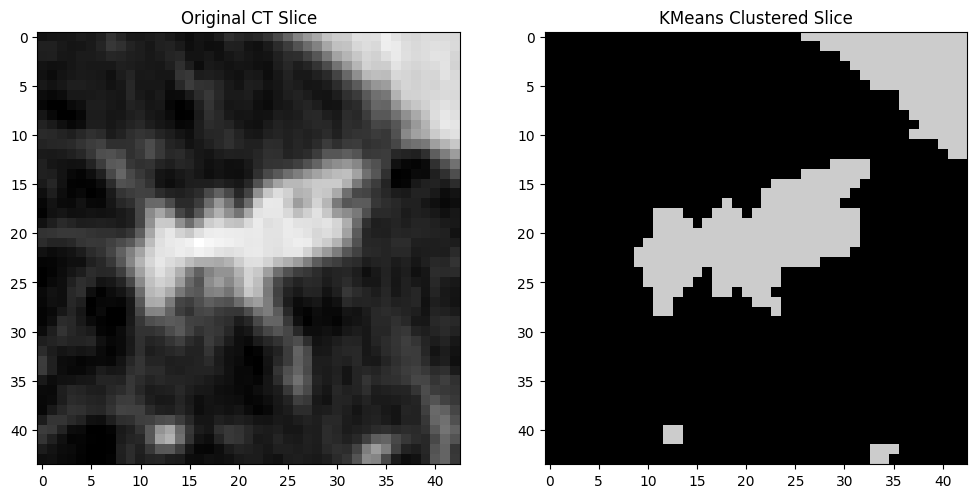

Completed segmentation for LIDC-IDRI-0562_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0587_R_7.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0587_R_7.nii.gz


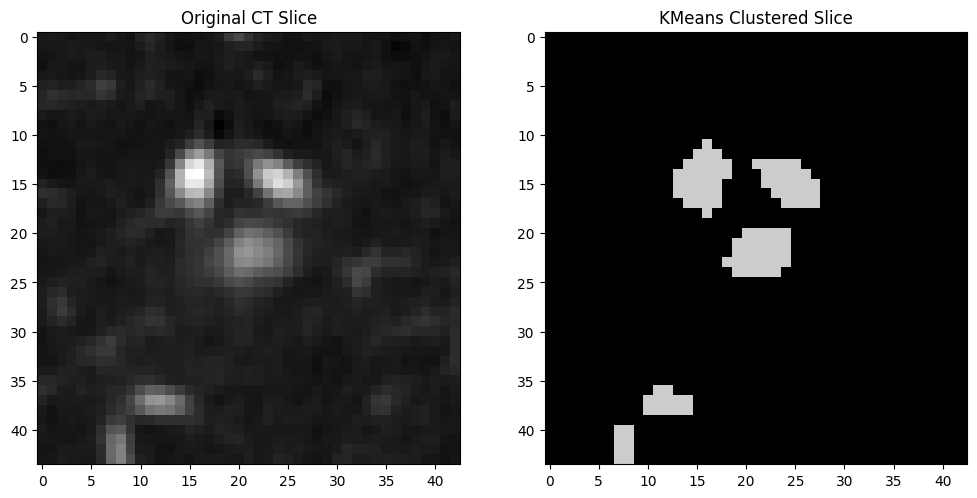

Completed segmentation for LIDC-IDRI-0587_R_7.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0399_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0399_R_1.nii.gz


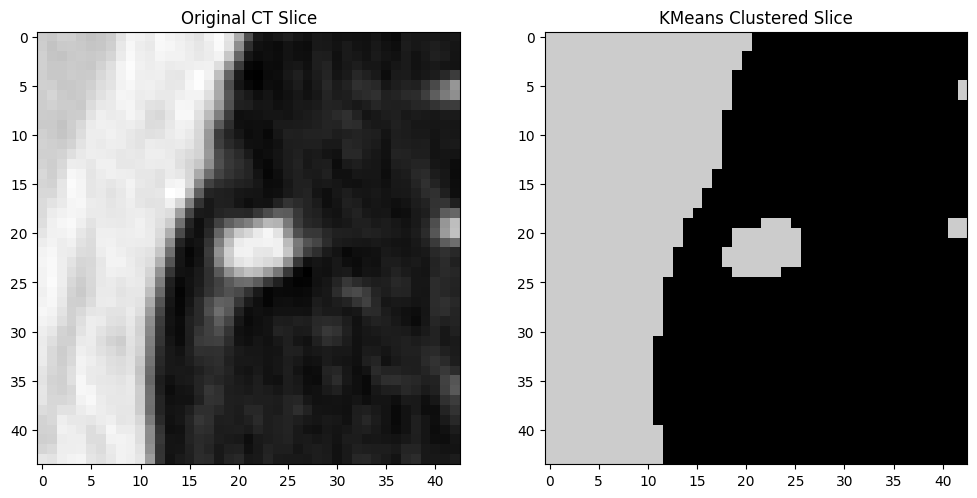

Completed segmentation for LIDC-IDRI-0399_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0500_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0500_R_1.nii.gz


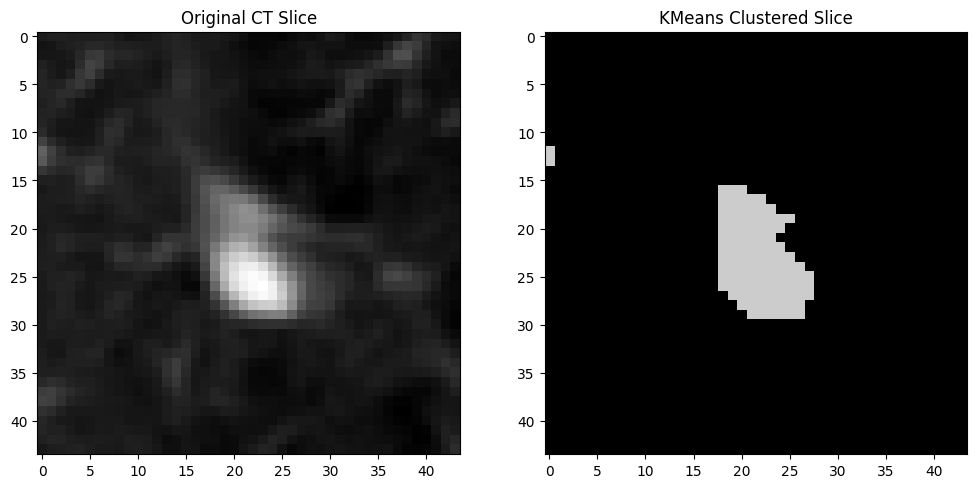

Completed segmentation for LIDC-IDRI-0500_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0147_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0147_R_3.nii.gz


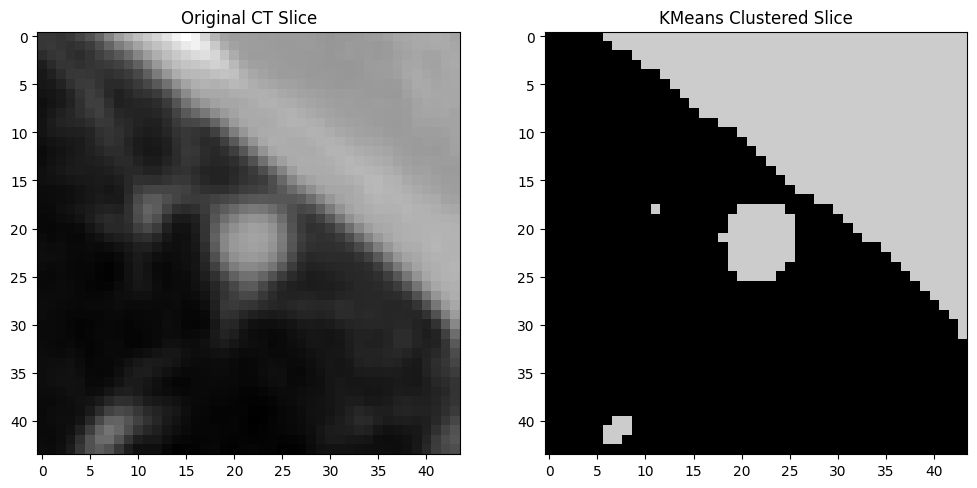

Completed segmentation for LIDC-IDRI-0147_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0492_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0492_R_1.nii.gz


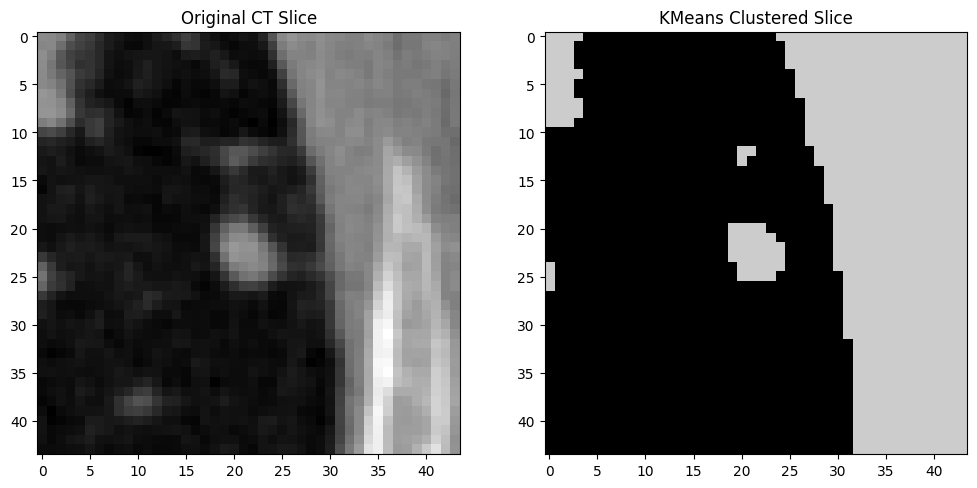

Completed segmentation for LIDC-IDRI-0492_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0304_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0304_R_1.nii.gz


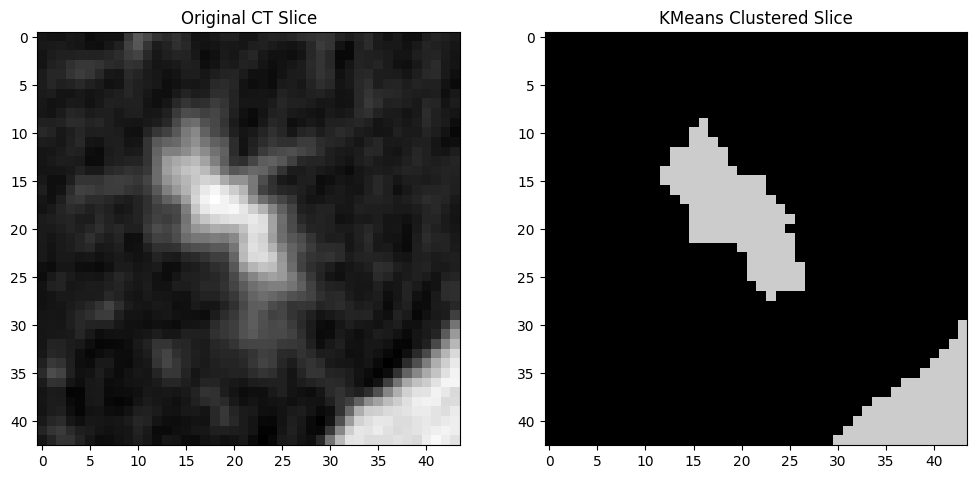

Completed segmentation for LIDC-IDRI-0304_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0496_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0496_R_2.nii.gz


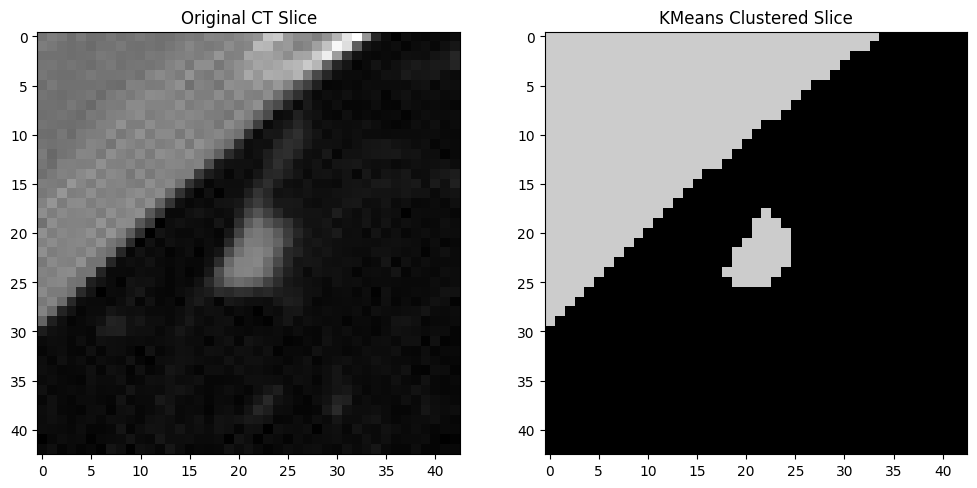

Completed segmentation for LIDC-IDRI-0496_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0339_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0339_R_1.nii.gz


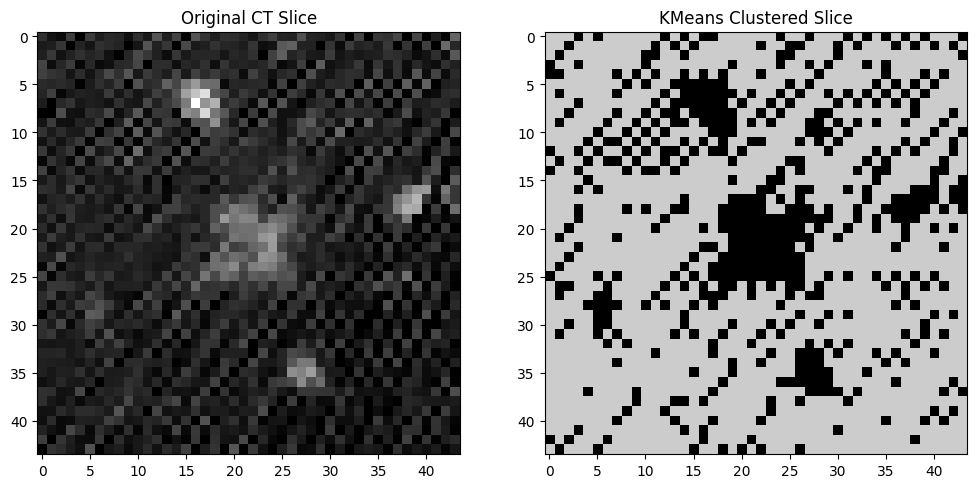

Completed segmentation for LIDC-IDRI-0339_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0288_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0288_R_2.nii.gz


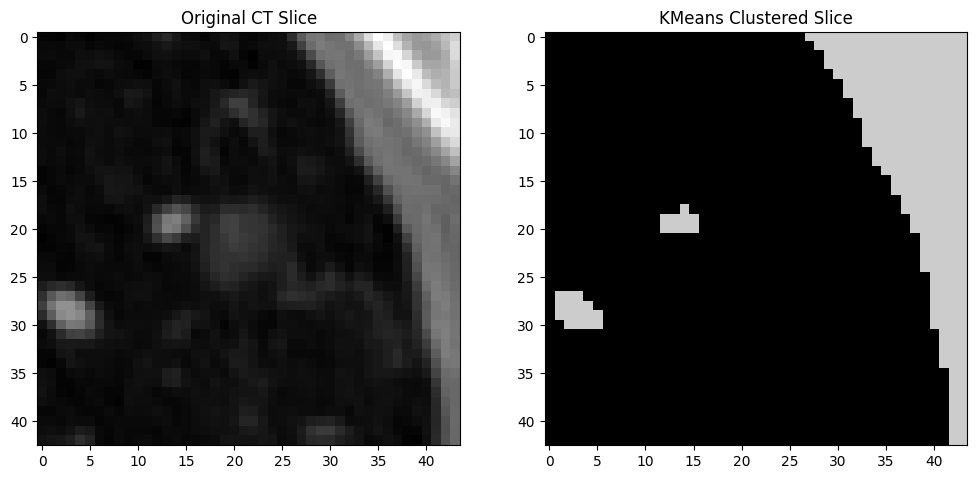

Completed segmentation for LIDC-IDRI-0288_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0203_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0203_R_1.nii.gz


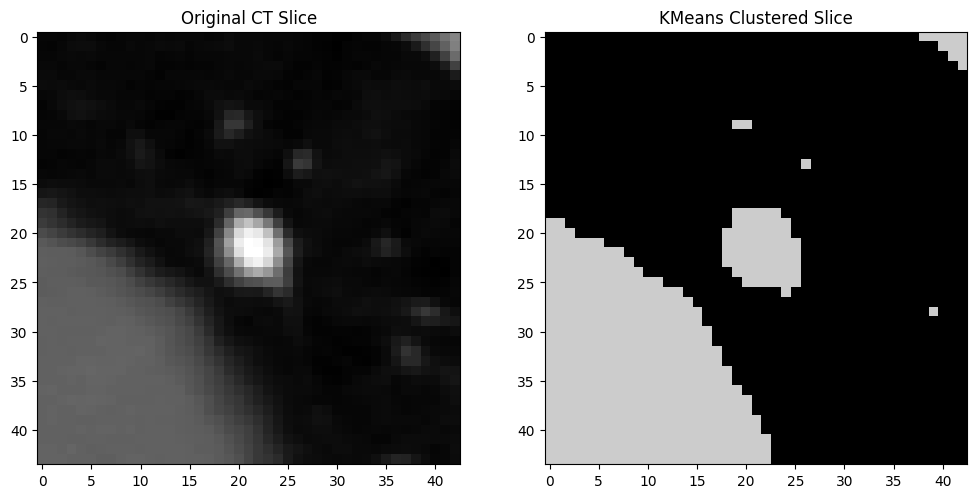

Completed segmentation for LIDC-IDRI-0203_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0223_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0223_R_3.nii.gz


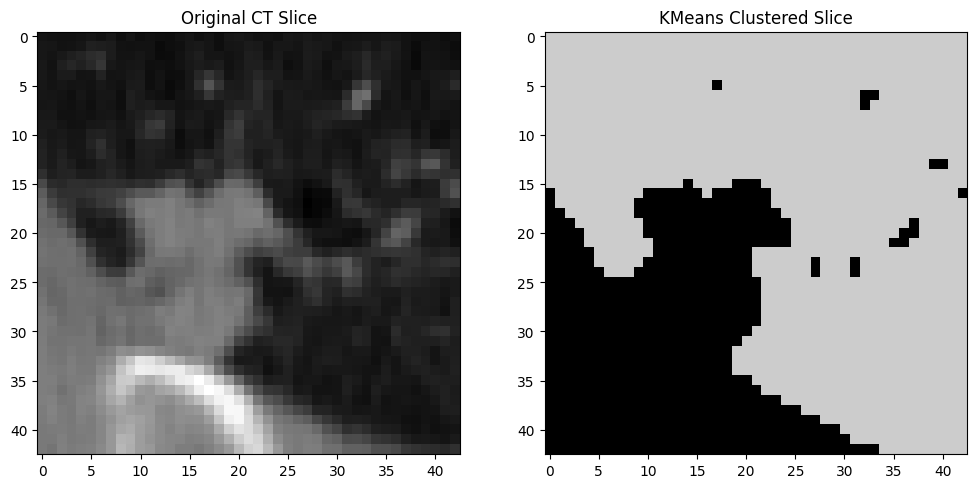

Completed segmentation for LIDC-IDRI-0223_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0481_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0481_R_6.nii.gz


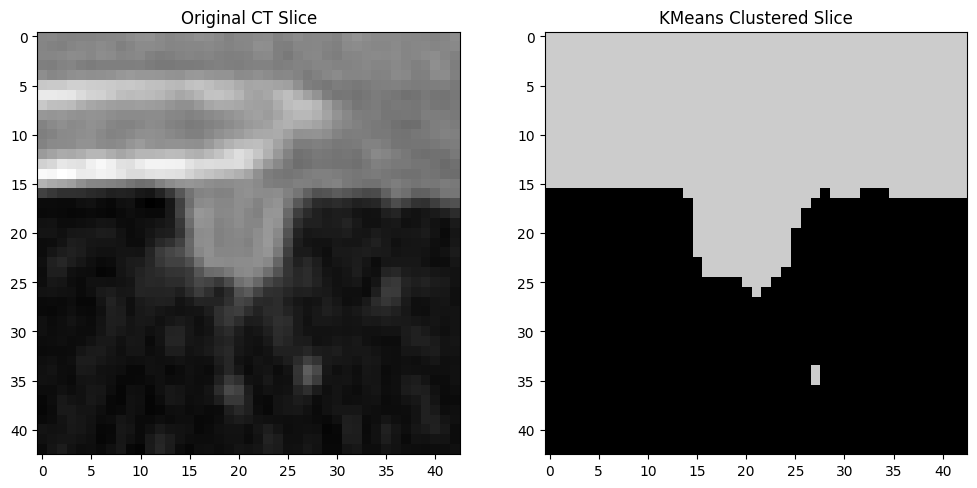

Completed segmentation for LIDC-IDRI-0481_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0353_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0353_R_1.nii.gz


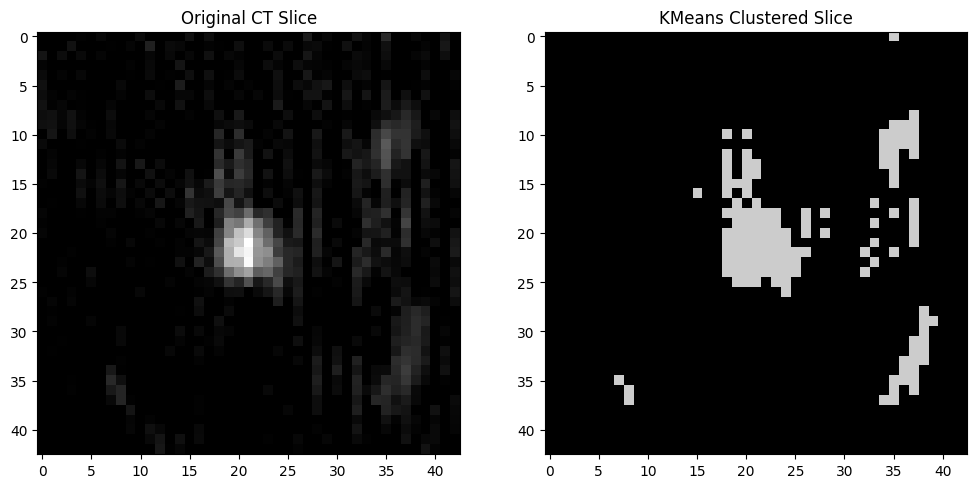

Completed segmentation for LIDC-IDRI-0353_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0686_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0686_R_6.nii.gz


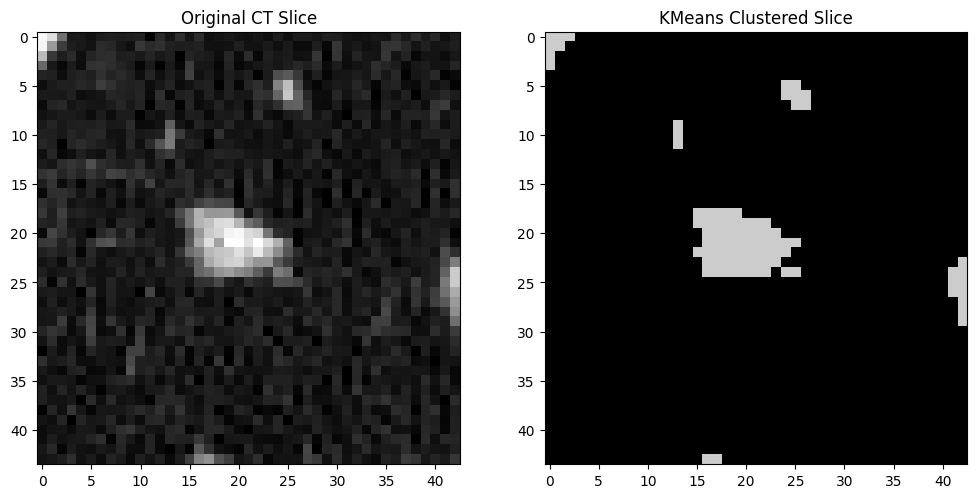

Completed segmentation for LIDC-IDRI-0686_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0404_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0404_R_1.nii.gz


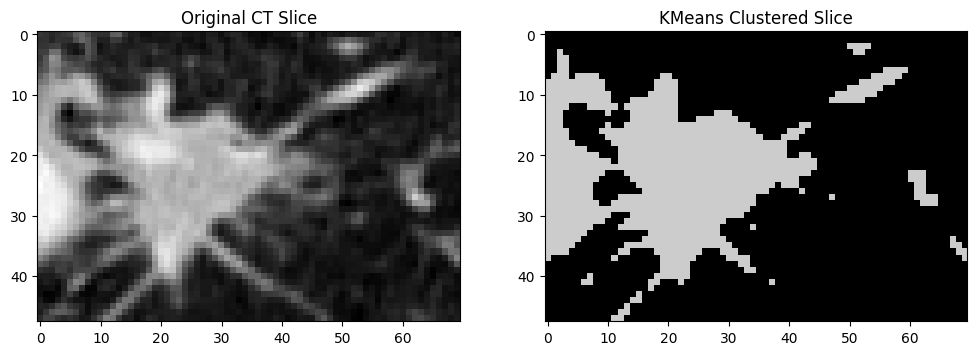

Completed segmentation for LIDC-IDRI-0404_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0641_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0641_R_4.nii.gz


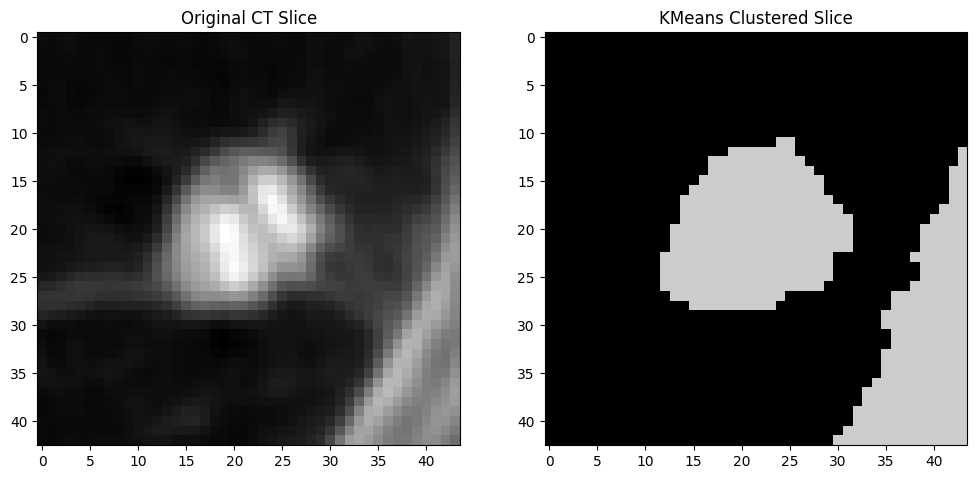

Completed segmentation for LIDC-IDRI-0641_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0265_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0265_R_1.nii.gz


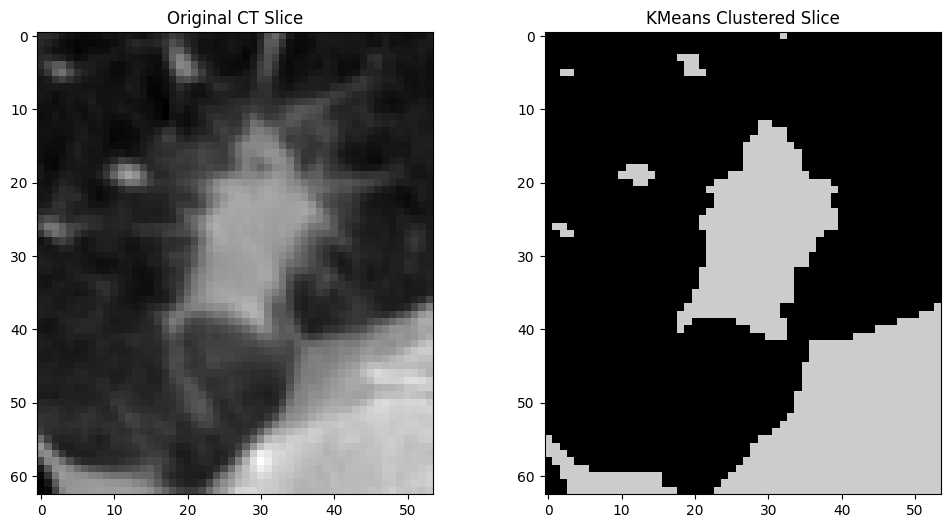

Completed segmentation for LIDC-IDRI-0265_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0308_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0308_R_2.nii.gz


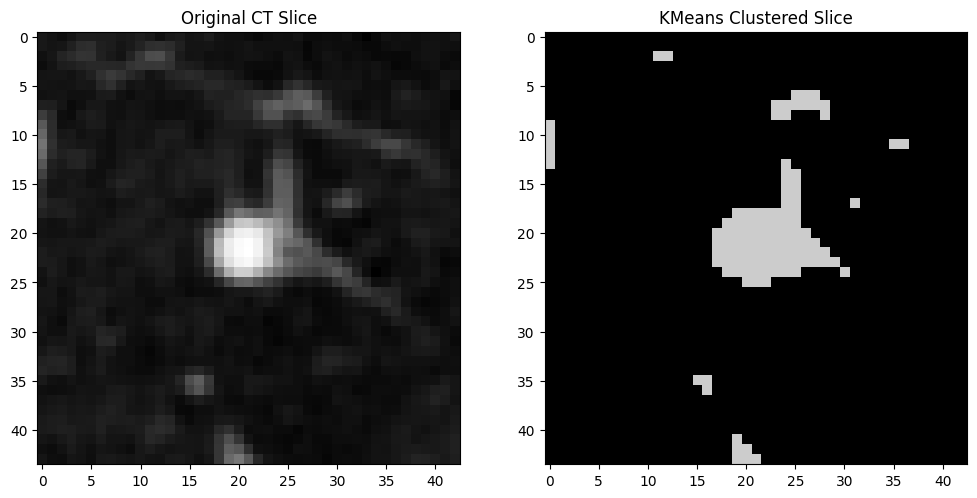

Completed segmentation for LIDC-IDRI-0308_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0606_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0606_R_1.nii.gz


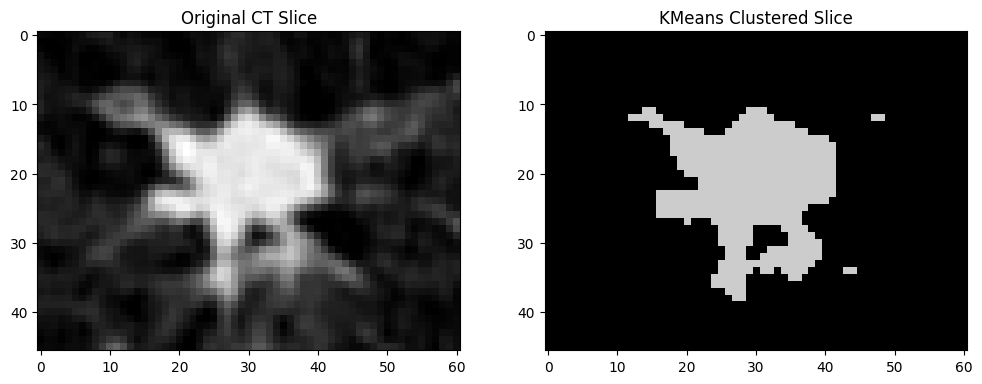

Completed segmentation for LIDC-IDRI-0606_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0485_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0485_R_2.nii.gz


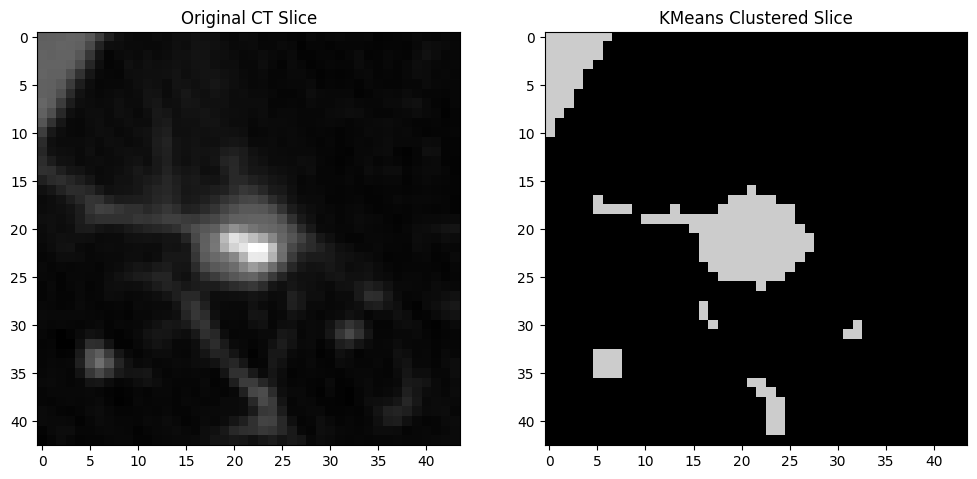

Completed segmentation for LIDC-IDRI-0485_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0583_R_14.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0583_R_14.nii.gz


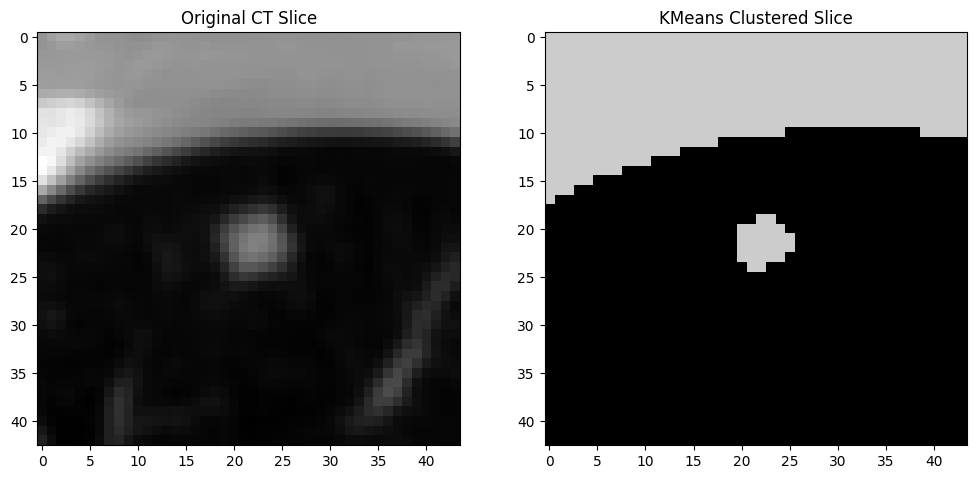

Completed segmentation for LIDC-IDRI-0583_R_14.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0403_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0403_R_1.nii.gz


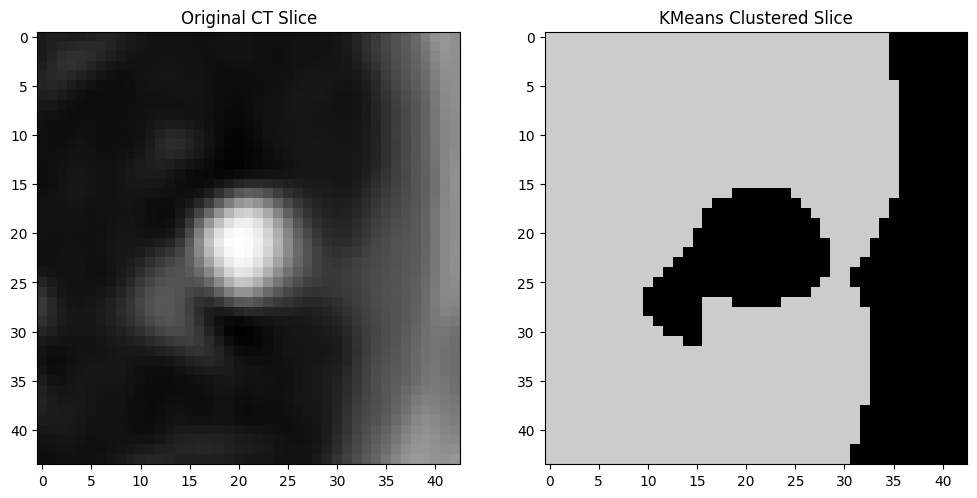

Completed segmentation for LIDC-IDRI-0403_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0490_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0490_R_2.nii.gz


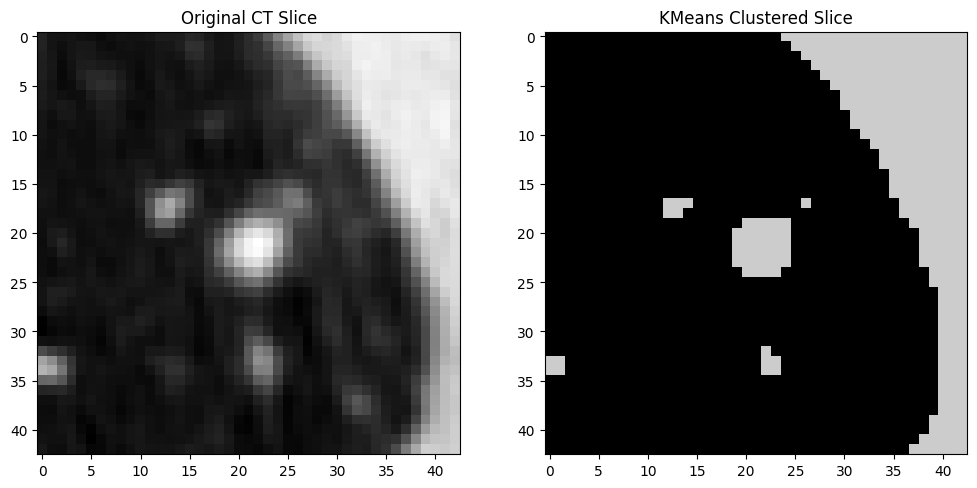

Completed segmentation for LIDC-IDRI-0490_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0686_R_9.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0686_R_9.nii.gz


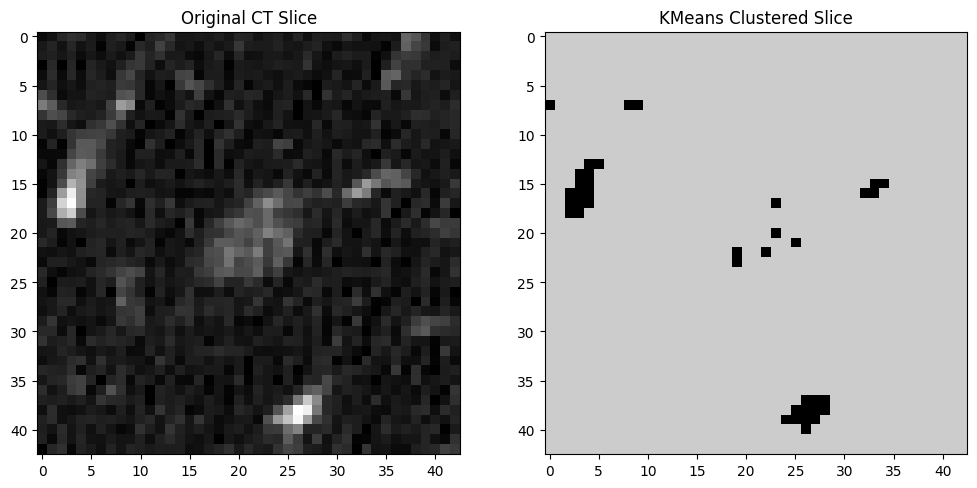

Completed segmentation for LIDC-IDRI-0686_R_9.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0289_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0289_R_2.nii.gz


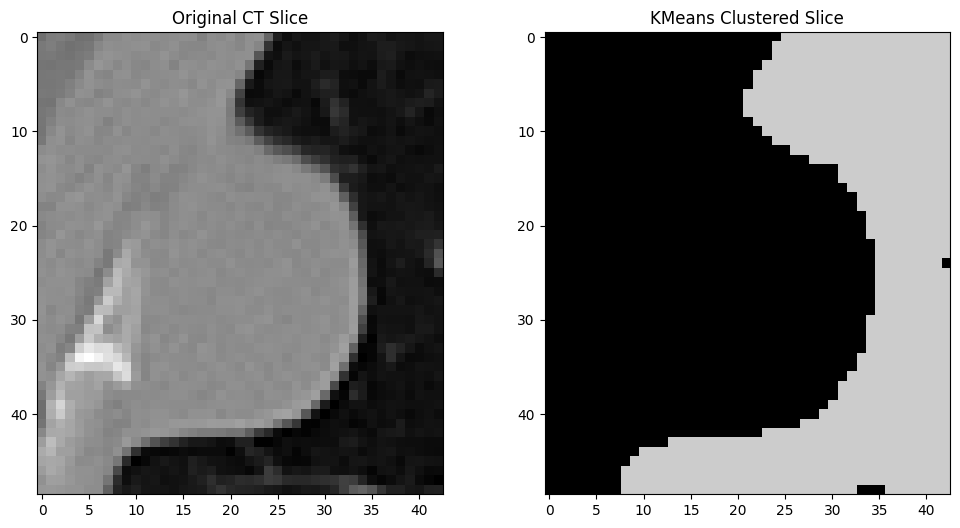

Completed segmentation for LIDC-IDRI-0289_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0344_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0344_R_2.nii.gz


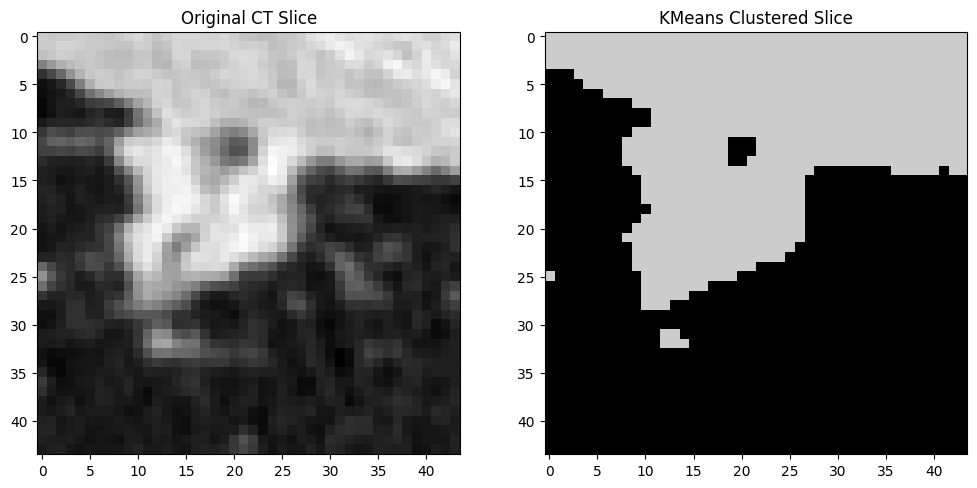

Completed segmentation for LIDC-IDRI-0344_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0594_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0594_R_1.nii.gz


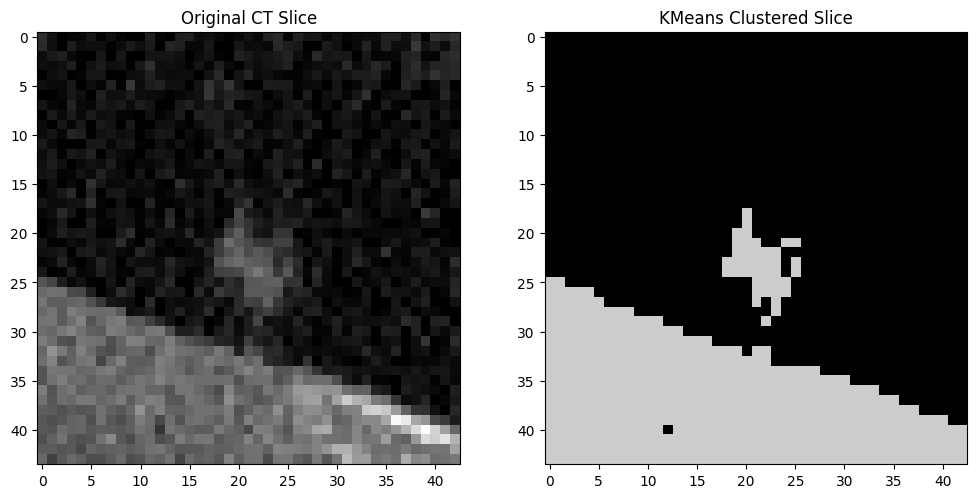

Completed segmentation for LIDC-IDRI-0594_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0177_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0177_R_1.nii.gz


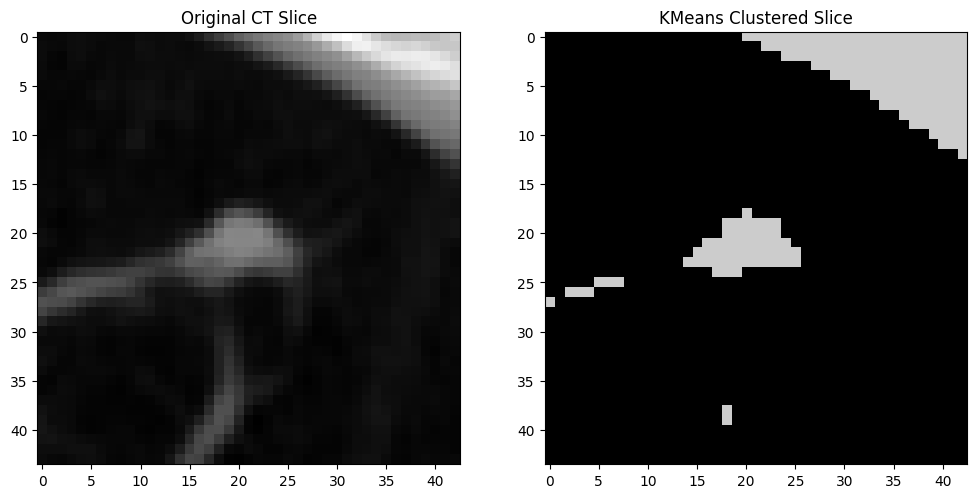

Completed segmentation for LIDC-IDRI-0177_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0195_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0195_R_3.nii.gz


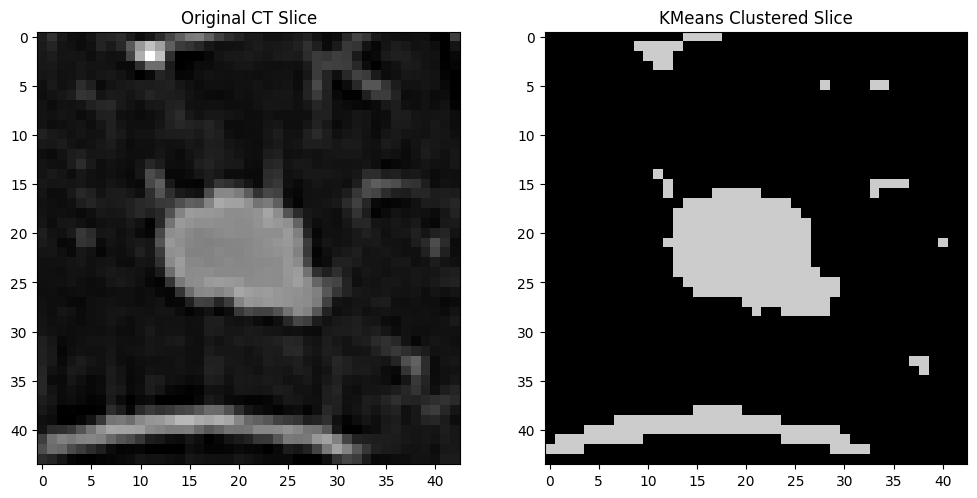

Completed segmentation for LIDC-IDRI-0195_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0300_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0300_R_1.nii.gz


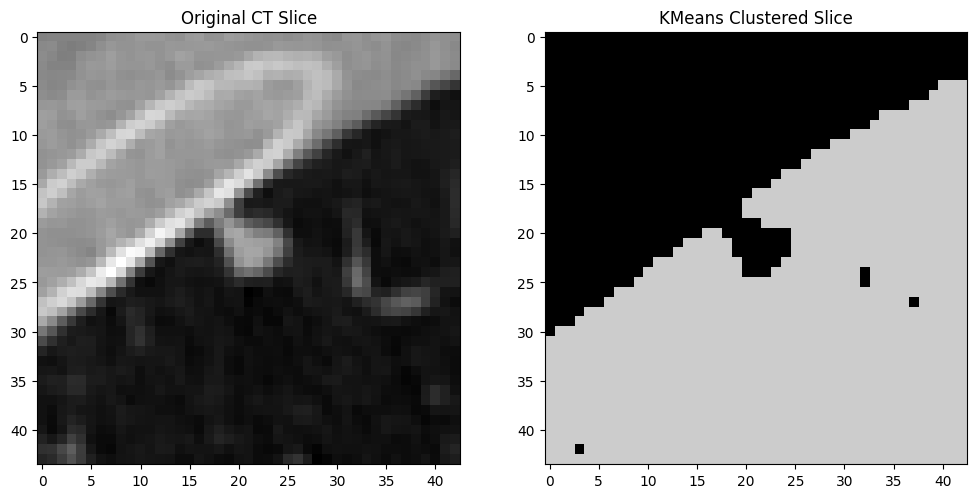

Completed segmentation for LIDC-IDRI-0300_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0193_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0193_R_1.nii.gz


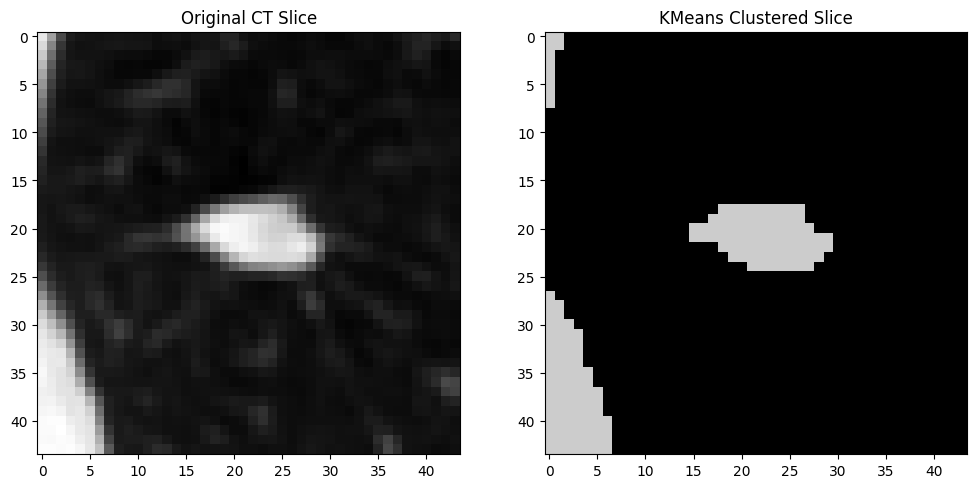

Completed segmentation for LIDC-IDRI-0193_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0415_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0415_R_1.nii.gz


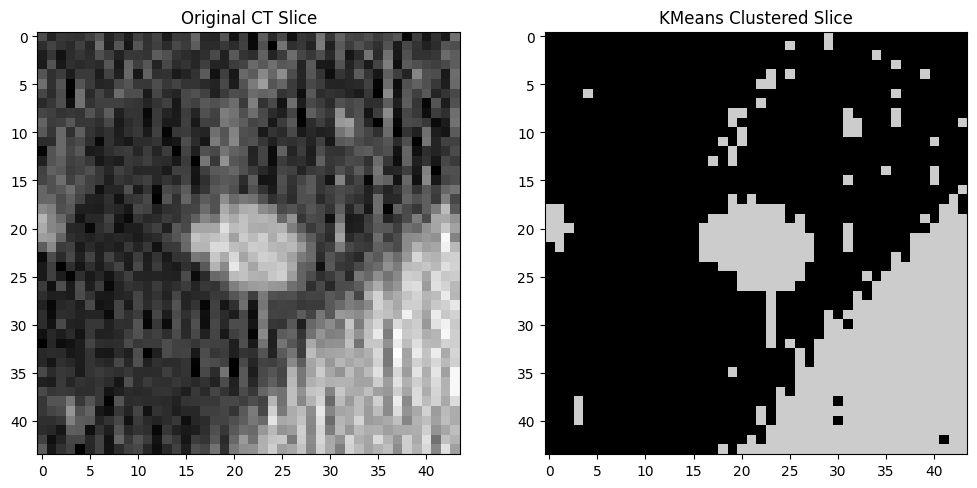

Completed segmentation for LIDC-IDRI-0415_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0278_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0278_R_2.nii.gz


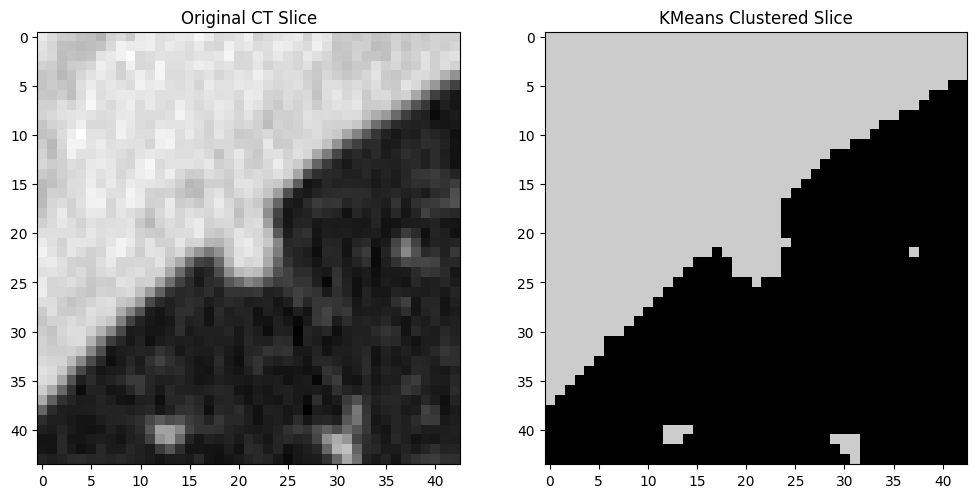

Completed segmentation for LIDC-IDRI-0278_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0489_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0489_R_5.nii.gz


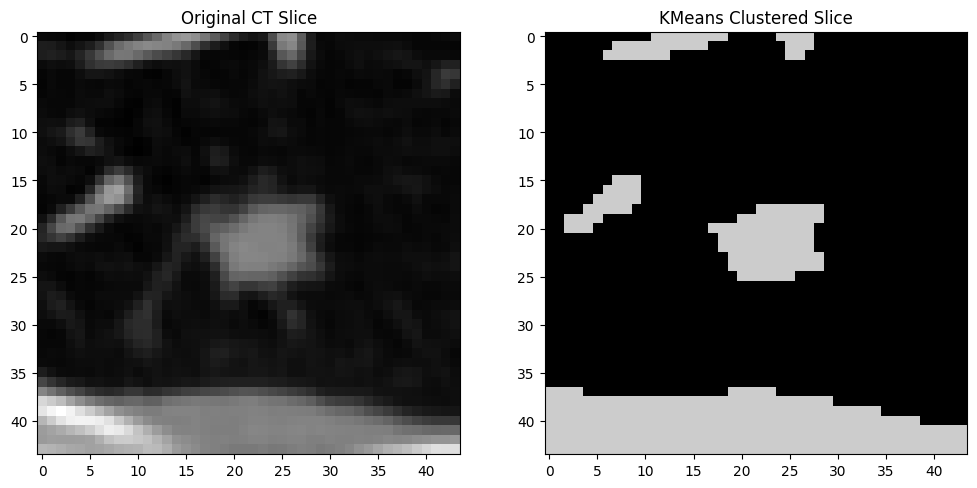

Completed segmentation for LIDC-IDRI-0489_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0450_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0450_R_3.nii.gz


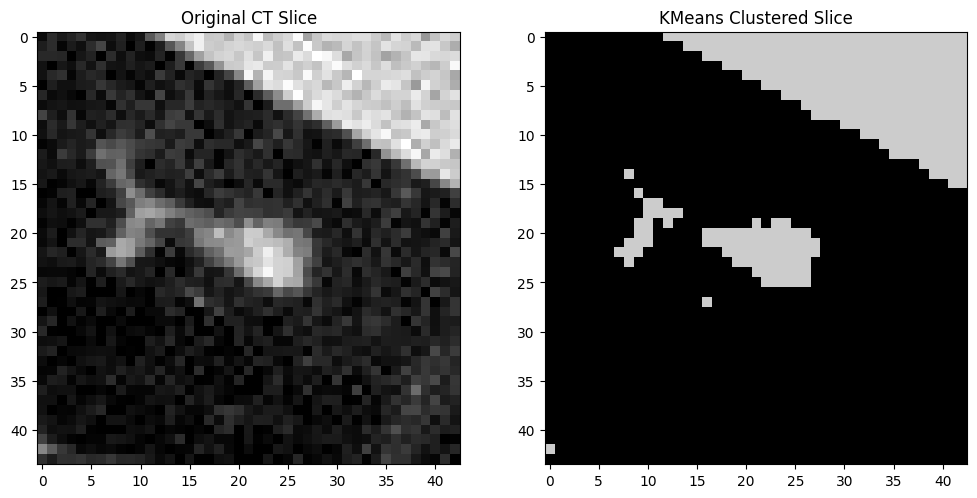

Completed segmentation for LIDC-IDRI-0450_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0496_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0496_R_1.nii.gz


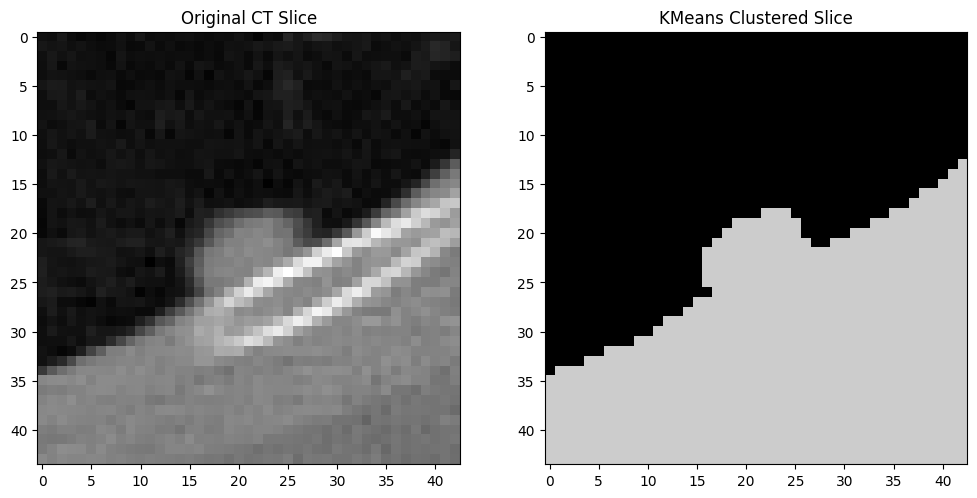

Completed segmentation for LIDC-IDRI-0496_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0447_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0447_R_2.nii.gz


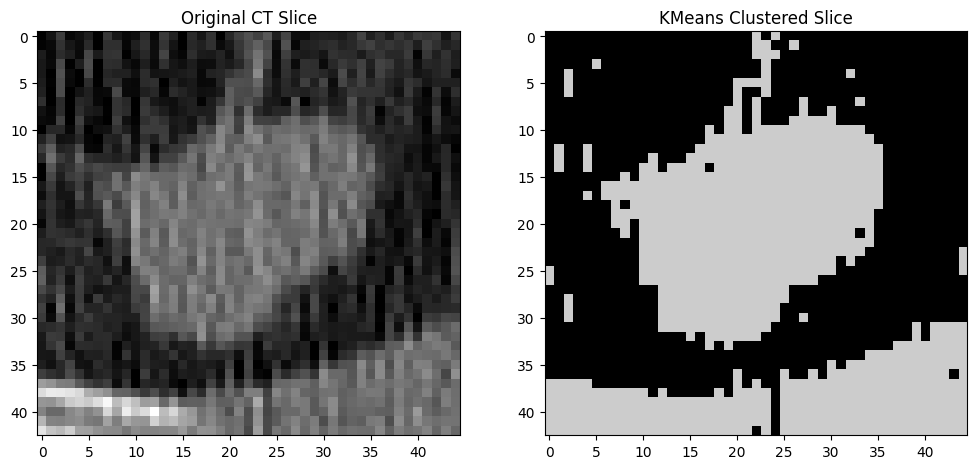

Completed segmentation for LIDC-IDRI-0447_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0464_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0464_R_3.nii.gz


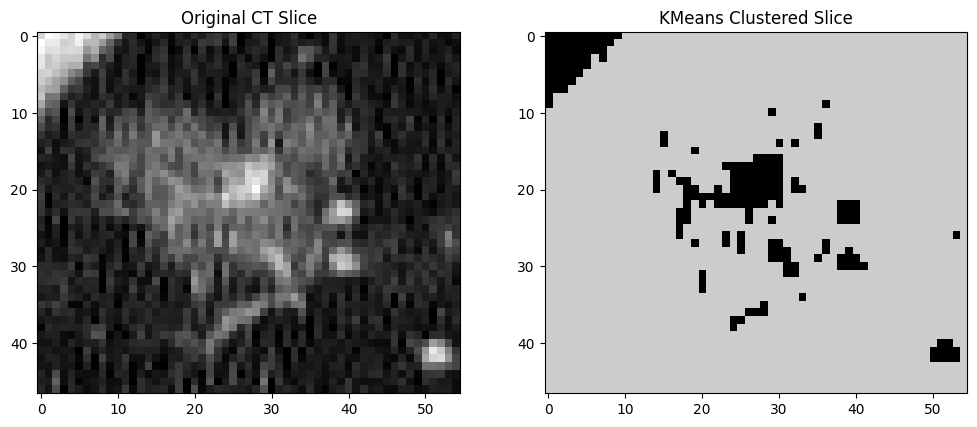

Completed segmentation for LIDC-IDRI-0464_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0171_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0171_R_1.nii.gz


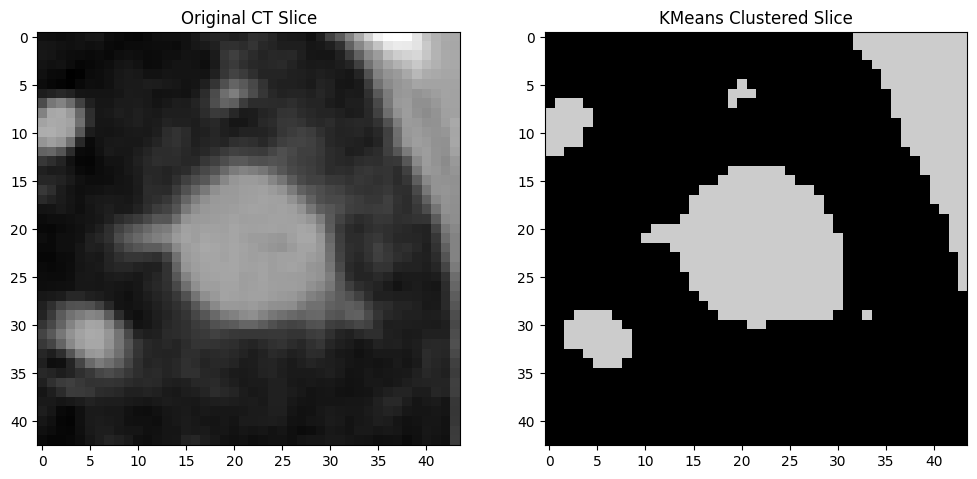

Completed segmentation for LIDC-IDRI-0171_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0637_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0637_R_6.nii.gz


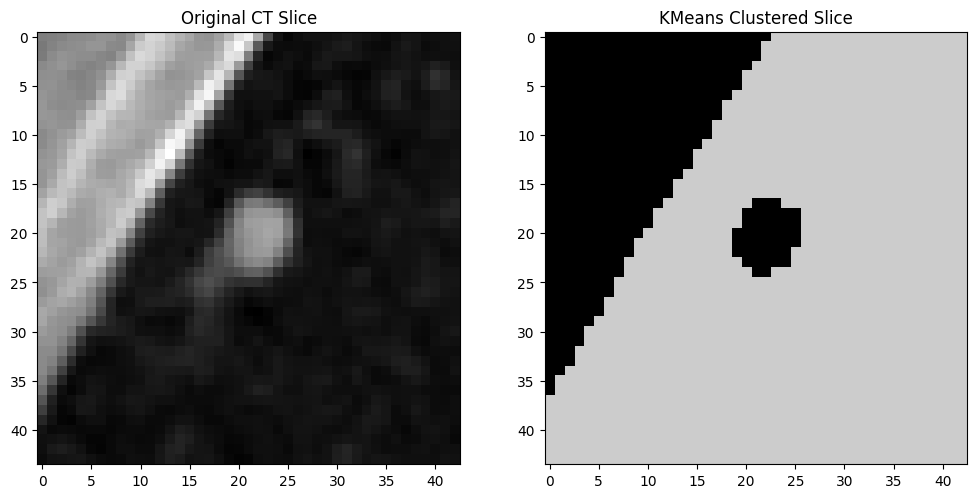

Completed segmentation for LIDC-IDRI-0637_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0356_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0356_R_1.nii.gz


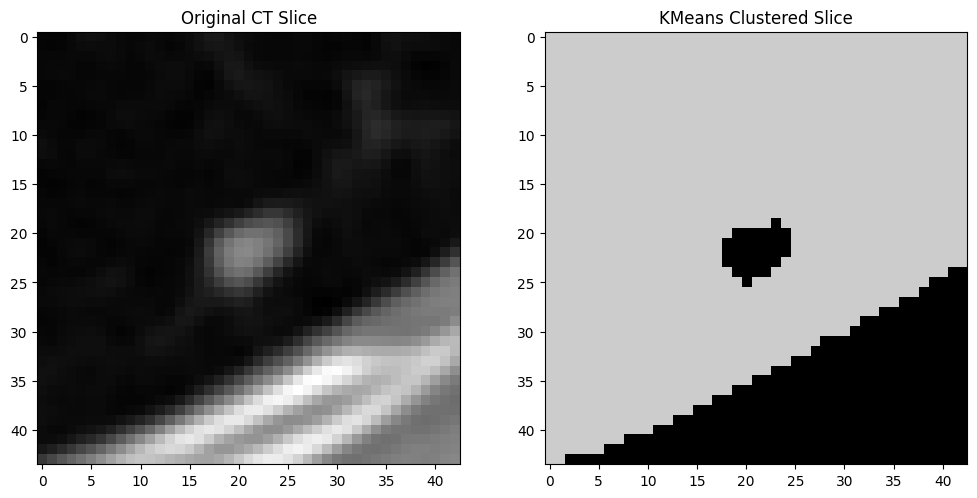

Completed segmentation for LIDC-IDRI-0356_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0204_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0204_R_1.nii.gz


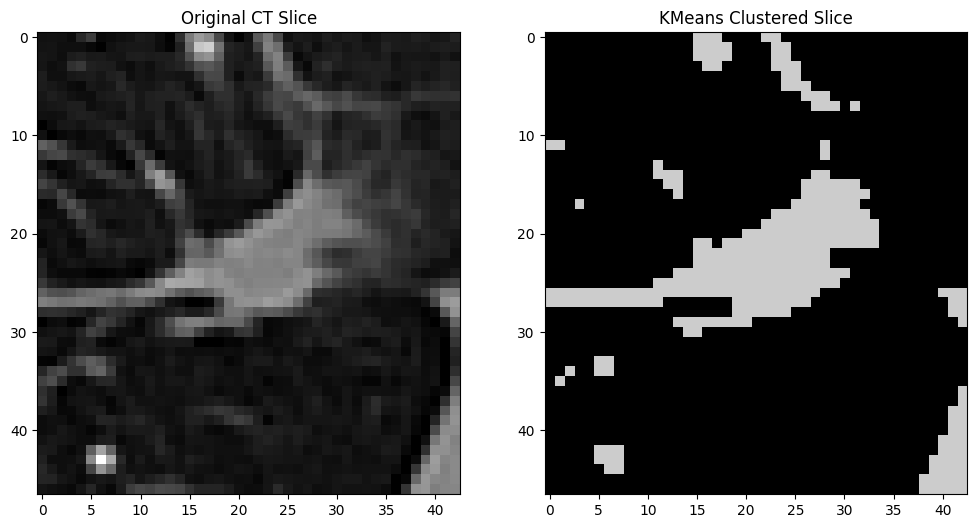

Completed segmentation for LIDC-IDRI-0204_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0258_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0258_R_1.nii.gz


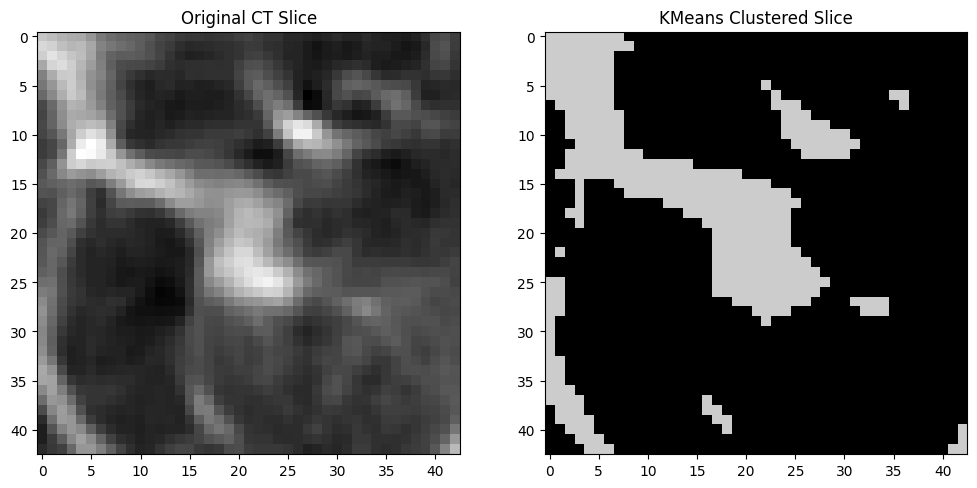

Completed segmentation for LIDC-IDRI-0258_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0404_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0404_R_4.nii.gz


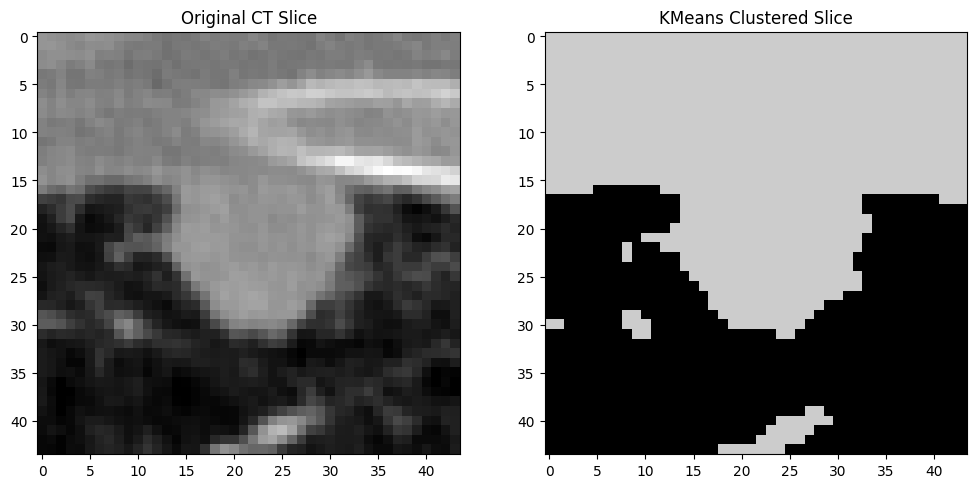

Completed segmentation for LIDC-IDRI-0404_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0195_R_7.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0195_R_7.nii.gz


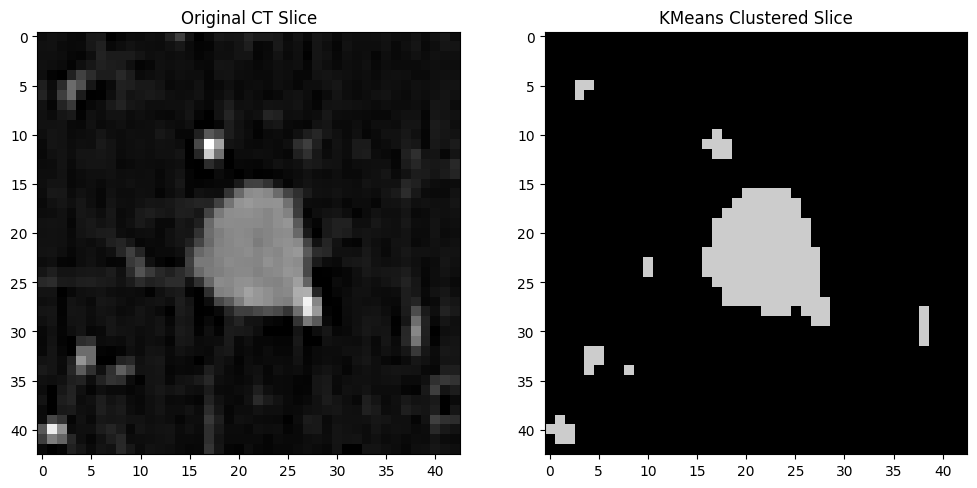

Completed segmentation for LIDC-IDRI-0195_R_7.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0696_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0696_R_1.nii.gz


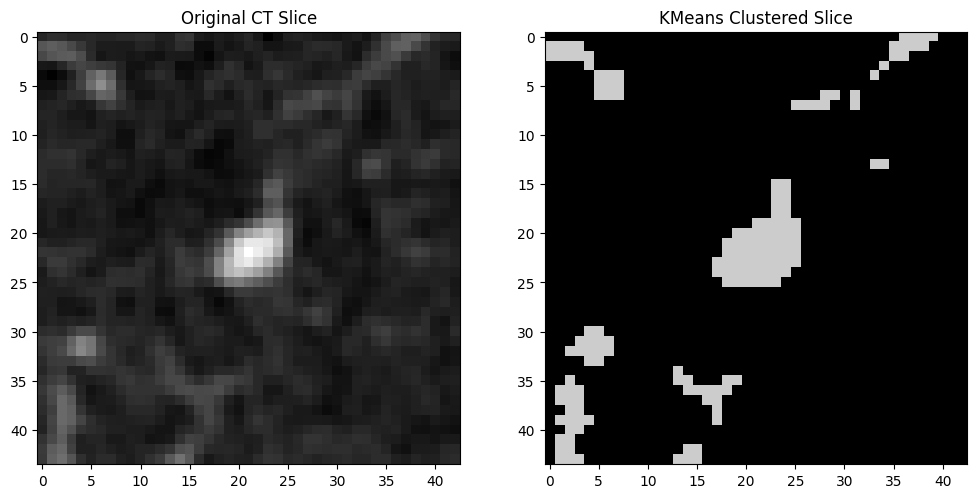

Completed segmentation for LIDC-IDRI-0696_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0188_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0188_R_6.nii.gz


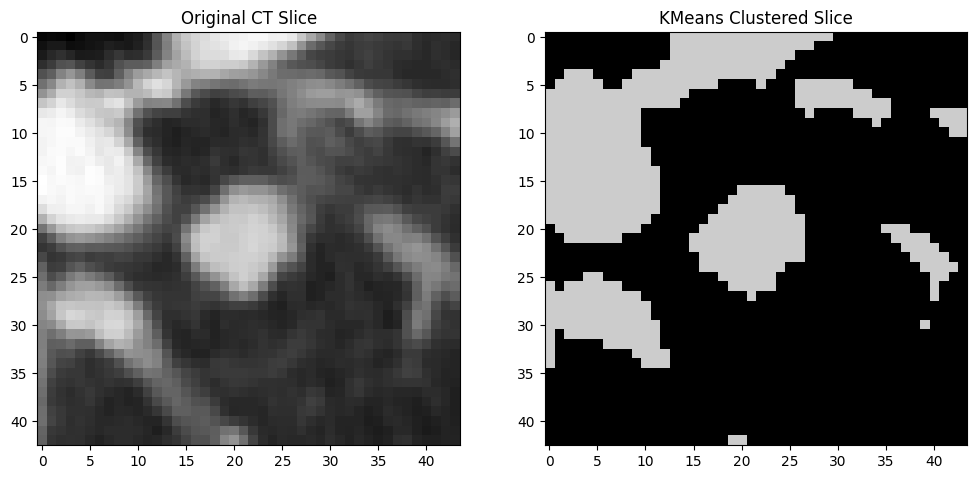

Completed segmentation for LIDC-IDRI-0188_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0411_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0411_R_3.nii.gz


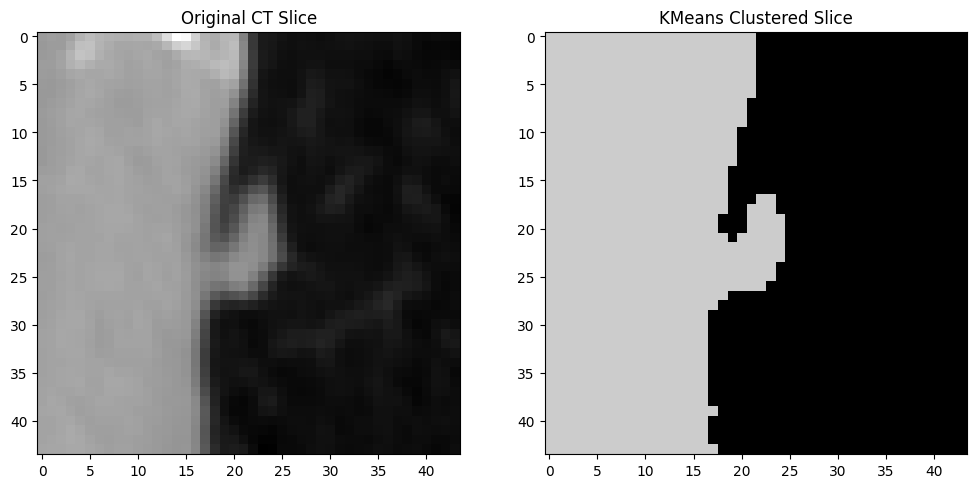

Completed segmentation for LIDC-IDRI-0411_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0372_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0372_R_2.nii.gz


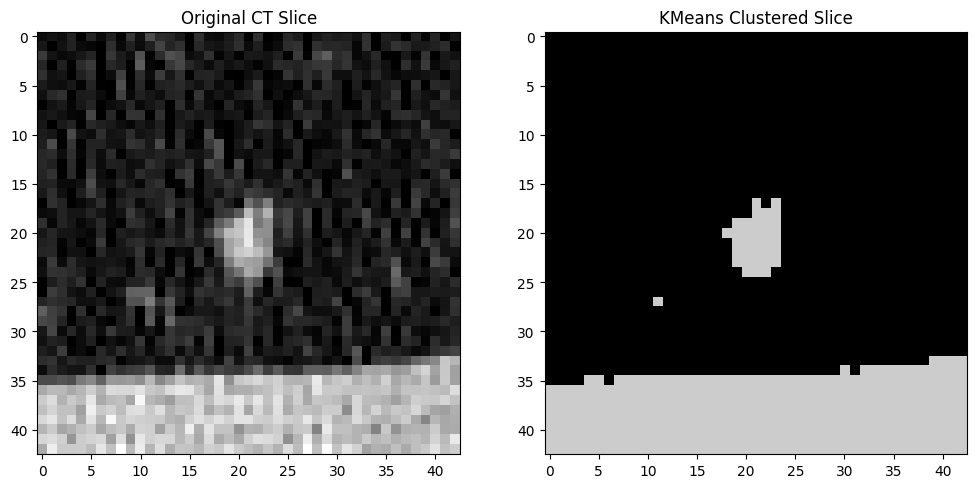

Completed segmentation for LIDC-IDRI-0372_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0251_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0251_R_1.nii.gz


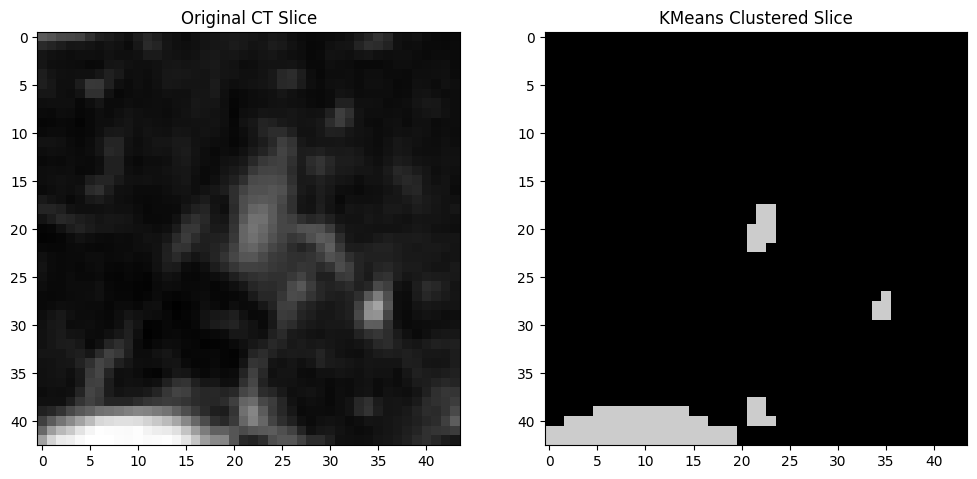

Completed segmentation for LIDC-IDRI-0251_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0164_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0164_R_4.nii.gz


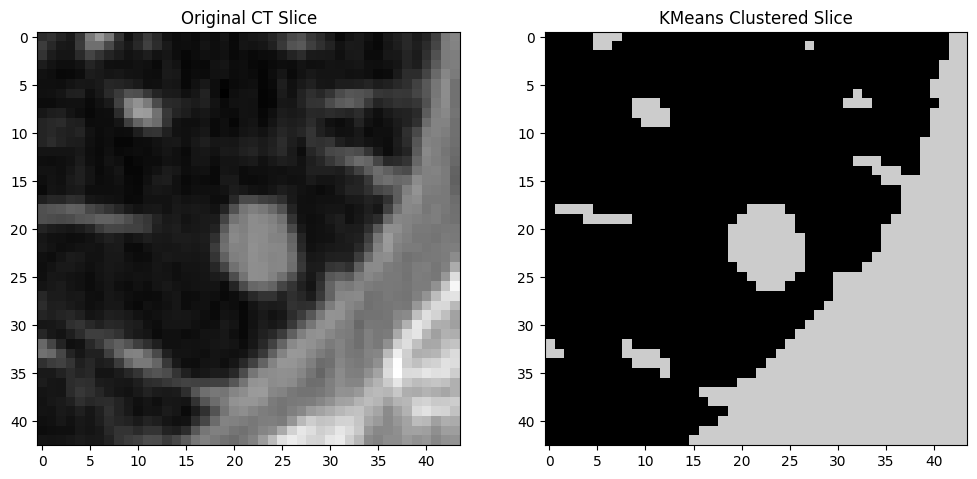

Completed segmentation for LIDC-IDRI-0164_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0634_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0634_R_2.nii.gz


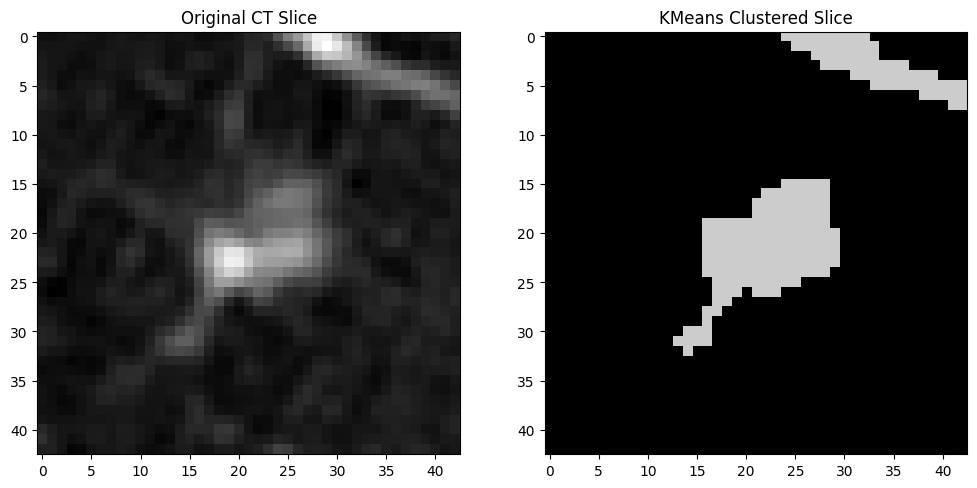

Completed segmentation for LIDC-IDRI-0634_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0698_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0698_R_1.nii.gz


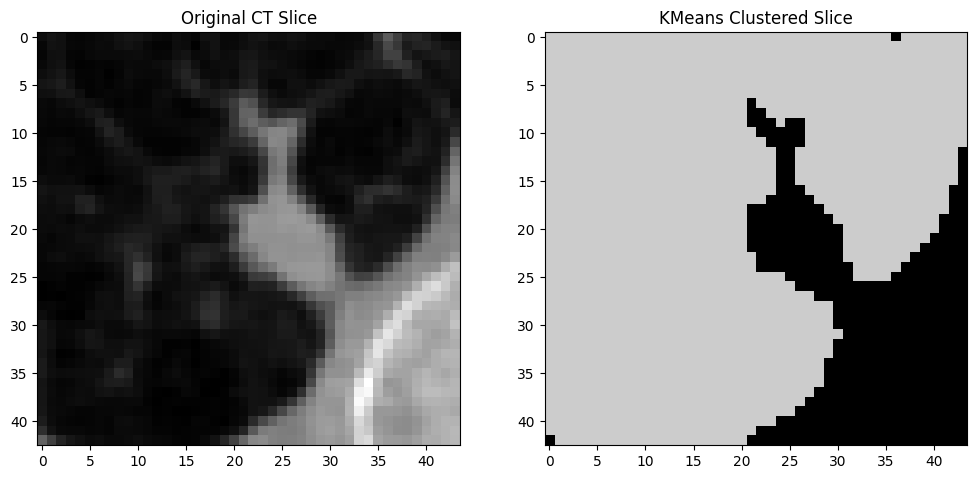

Completed segmentation for LIDC-IDRI-0698_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0525_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0525_R_3.nii.gz


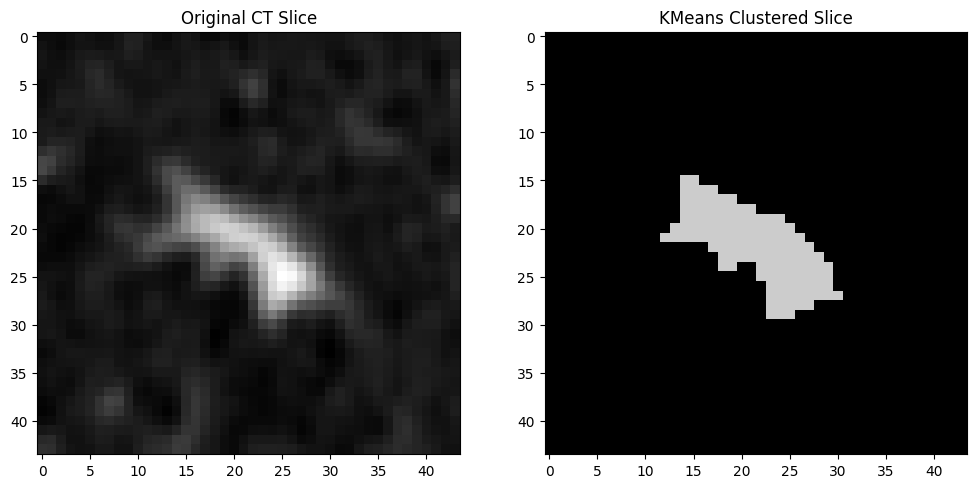

Completed segmentation for LIDC-IDRI-0525_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0187_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0187_R_4.nii.gz


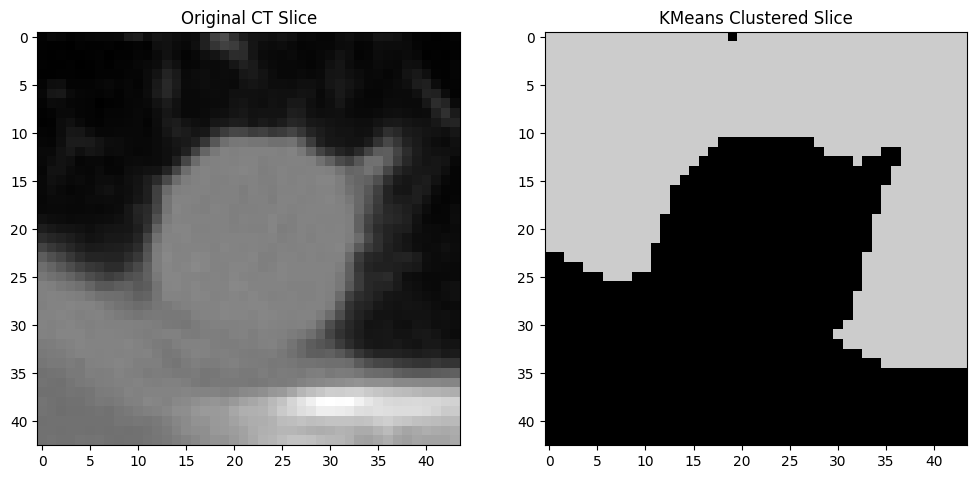

Completed segmentation for LIDC-IDRI-0187_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0185_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0185_R_4.nii.gz


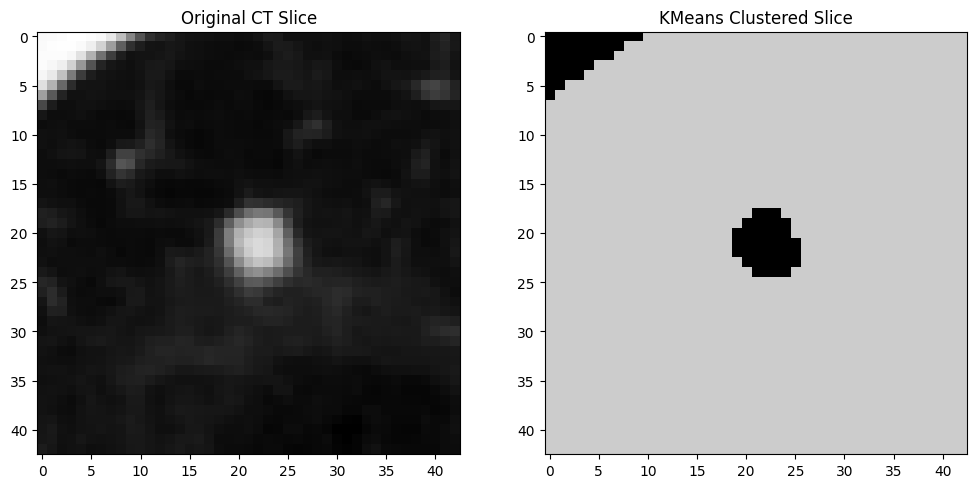

Completed segmentation for LIDC-IDRI-0185_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0489_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0489_R_1.nii.gz


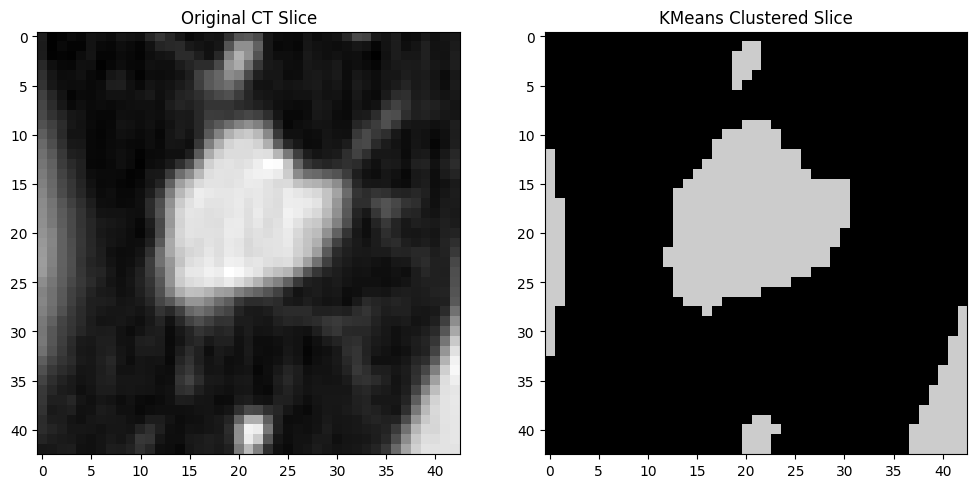

Completed segmentation for LIDC-IDRI-0489_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0648_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0648_R_3.nii.gz


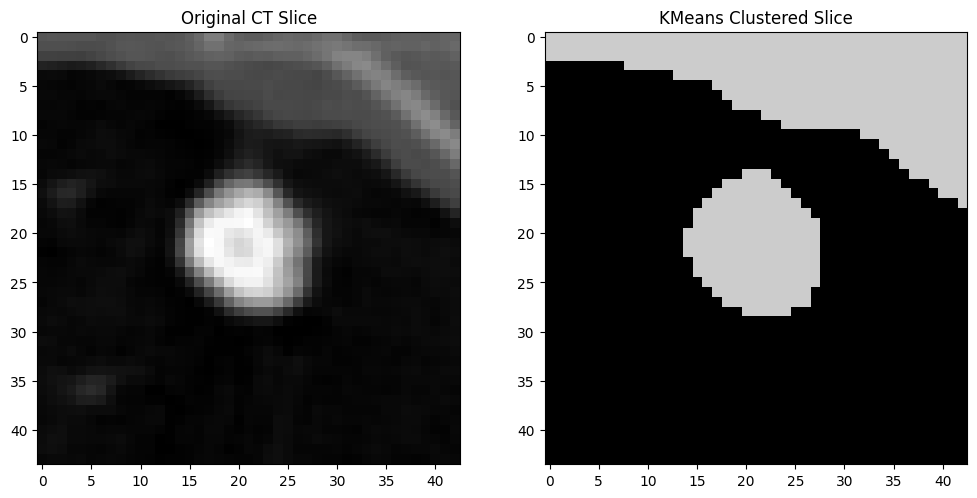

Completed segmentation for LIDC-IDRI-0648_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0195_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0195_R_4.nii.gz


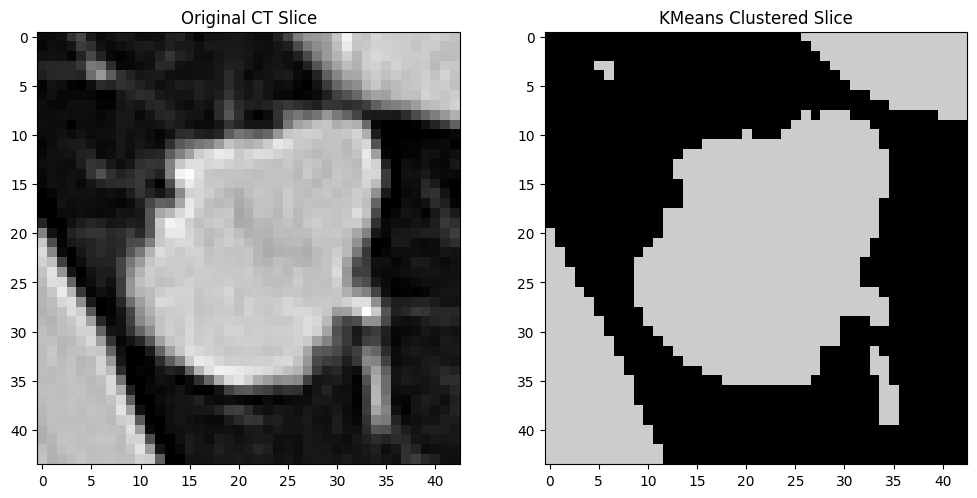

Completed segmentation for LIDC-IDRI-0195_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0181_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0181_R_3.nii.gz


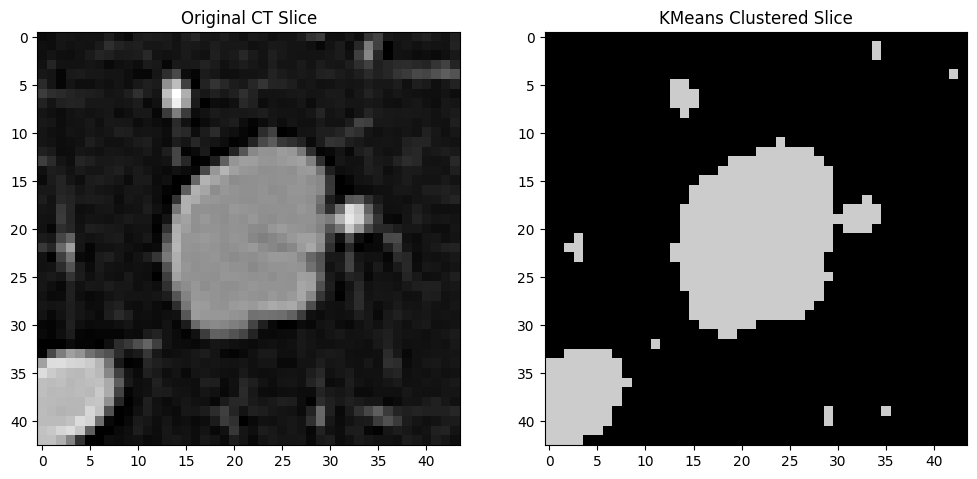

Completed segmentation for LIDC-IDRI-0181_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0305_R_8.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0305_R_8.nii.gz


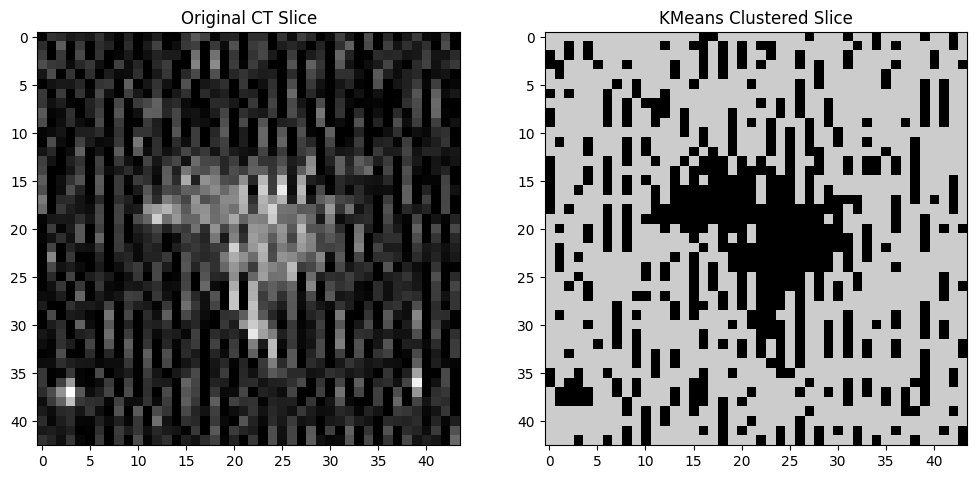

Completed segmentation for LIDC-IDRI-0305_R_8.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0335_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0335_R_2.nii.gz


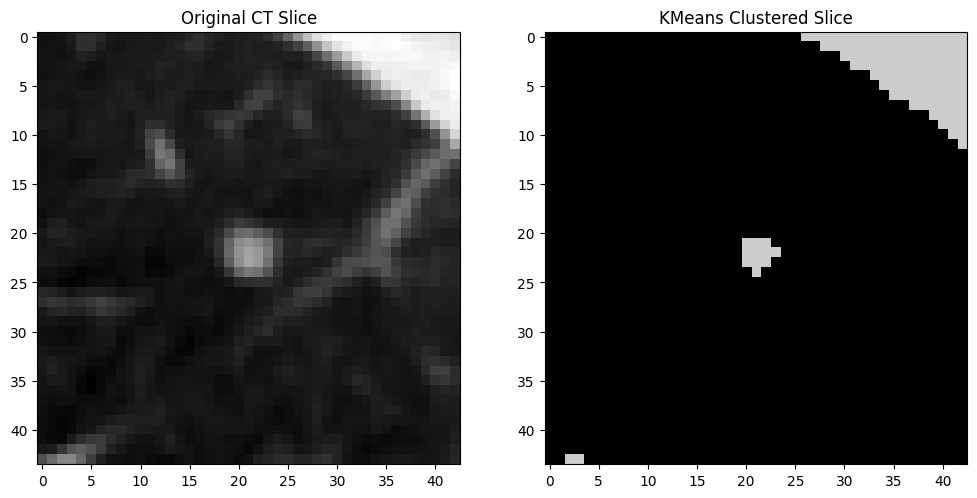

Completed segmentation for LIDC-IDRI-0335_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0273_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0273_R_2.nii.gz


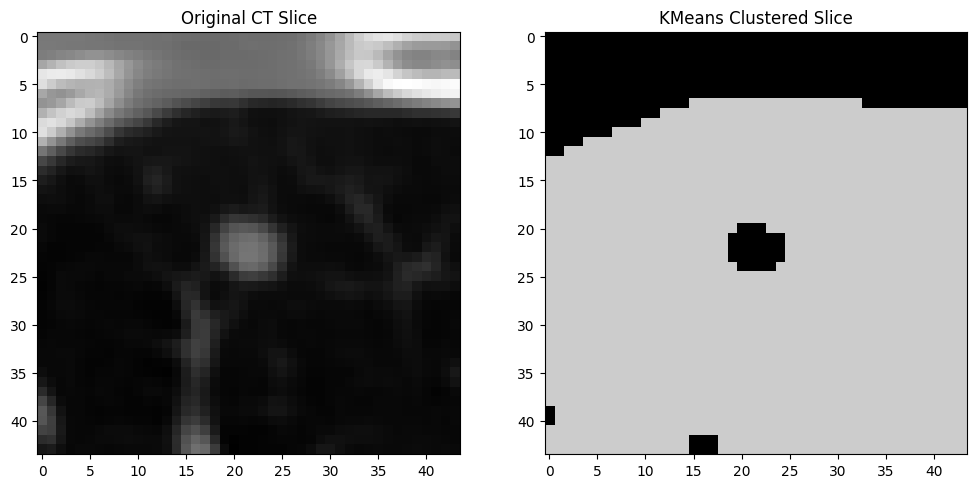

Completed segmentation for LIDC-IDRI-0273_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0497_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0497_R_1.nii.gz


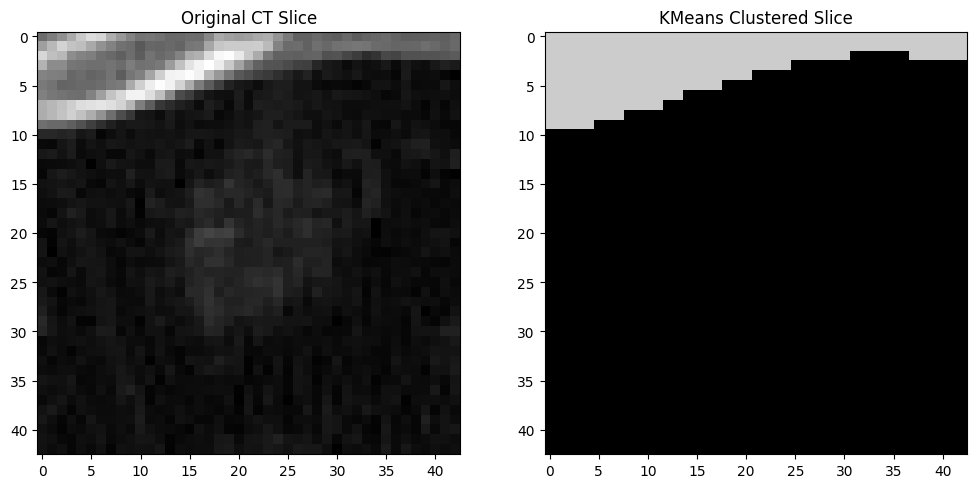

Completed segmentation for LIDC-IDRI-0497_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0219_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0219_R_1.nii.gz


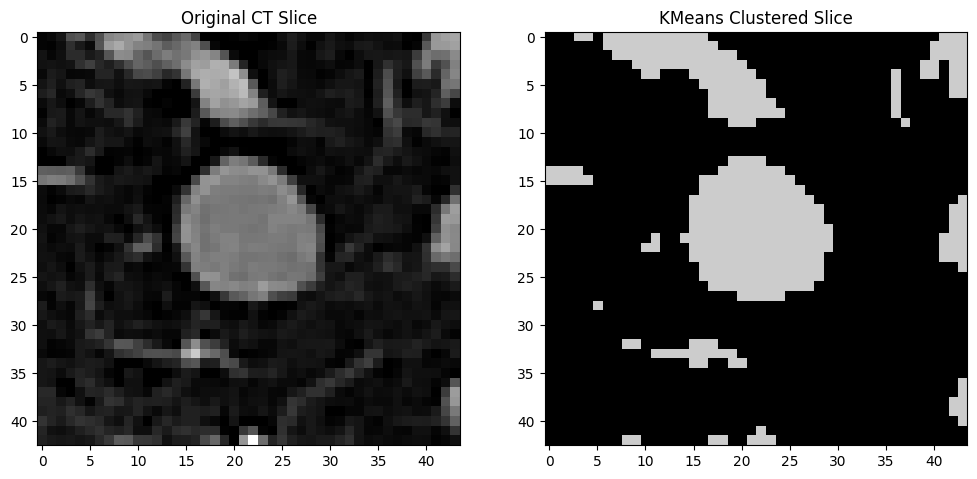

Completed segmentation for LIDC-IDRI-0219_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0671_R_7.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0671_R_7.nii.gz


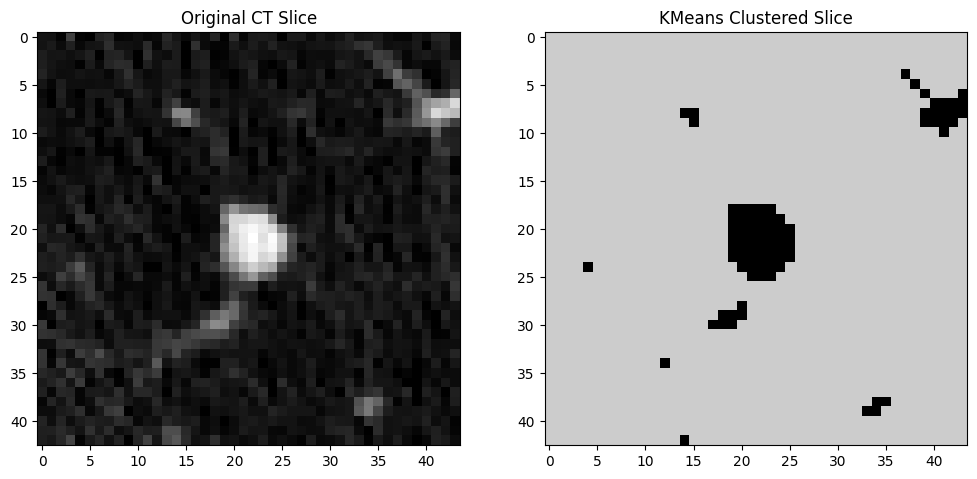

Completed segmentation for LIDC-IDRI-0671_R_7.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0332_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0332_R_2.nii.gz


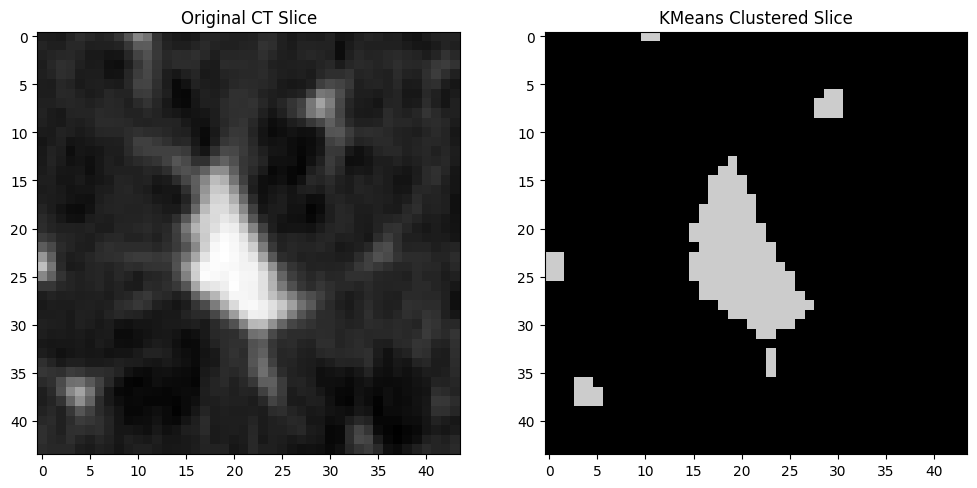

Completed segmentation for LIDC-IDRI-0332_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0161_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0161_R_1.nii.gz


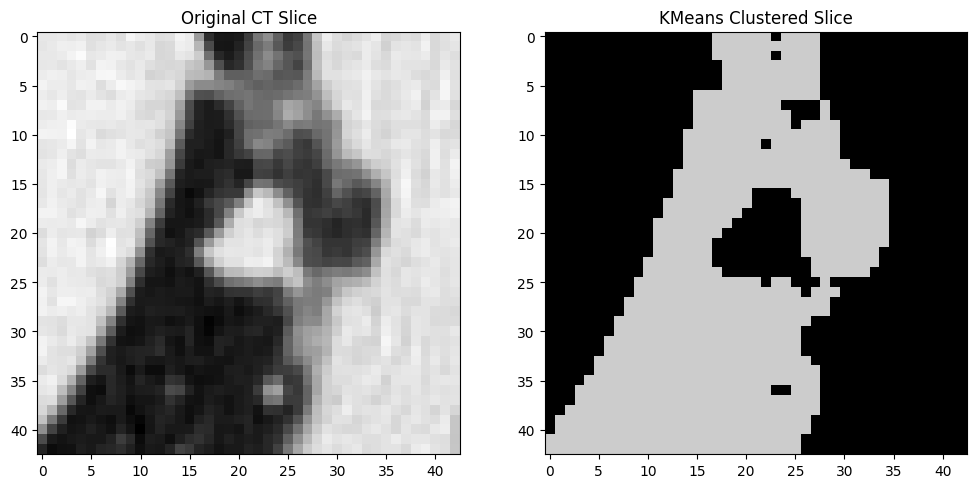

Completed segmentation for LIDC-IDRI-0161_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0580_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0580_R_1.nii.gz


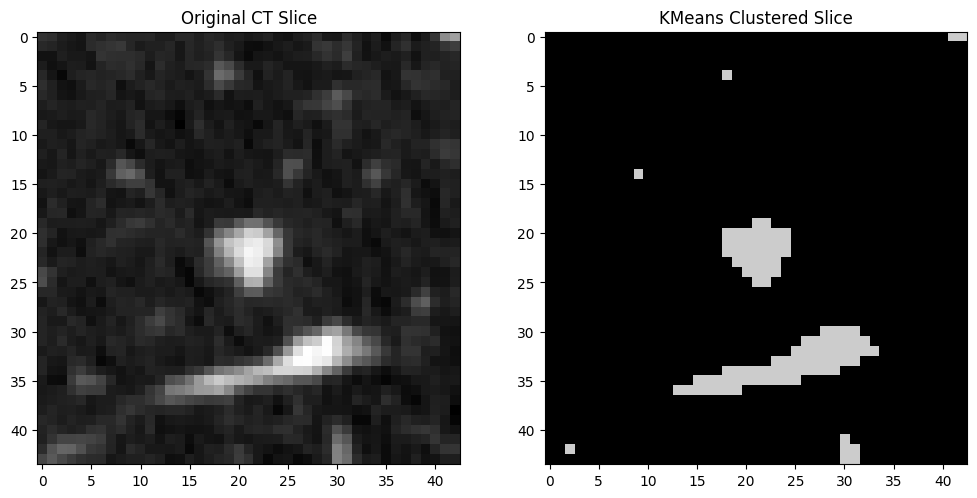

Completed segmentation for LIDC-IDRI-0580_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0149_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0149_R_5.nii.gz


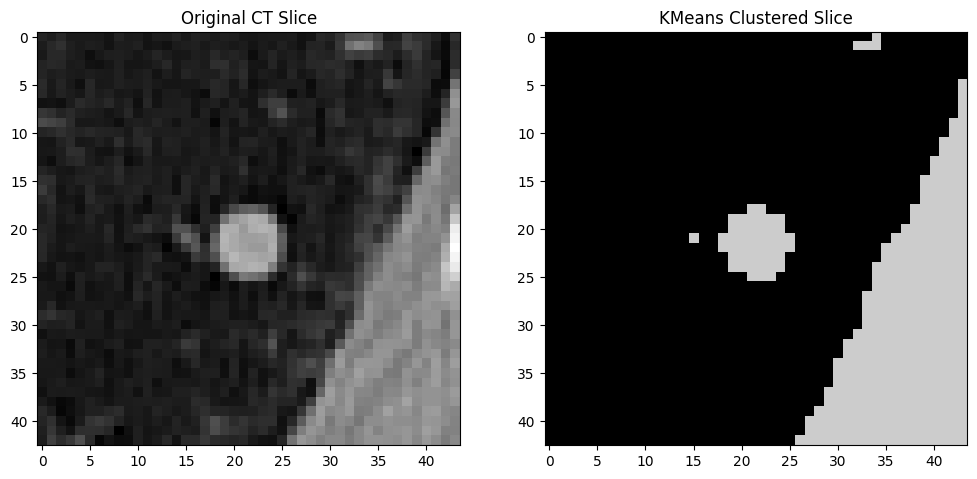

Completed segmentation for LIDC-IDRI-0149_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0491_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0491_R_4.nii.gz


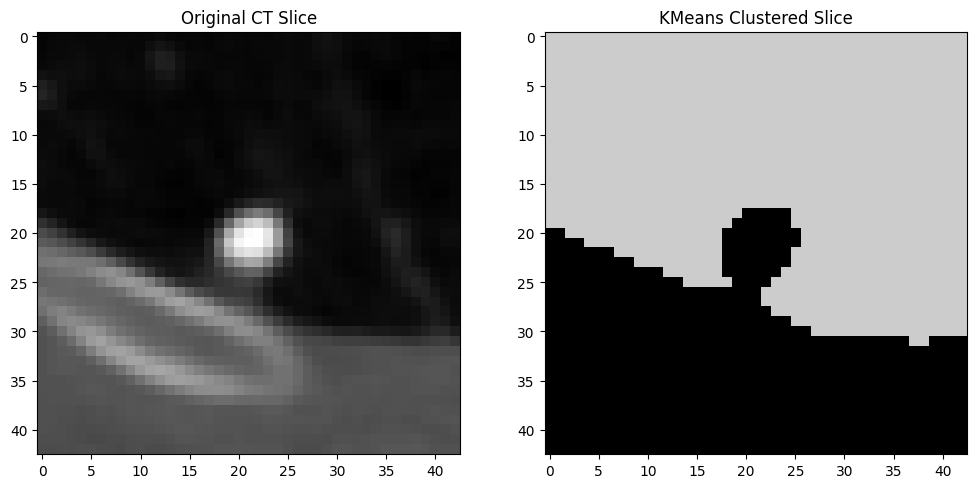

Completed segmentation for LIDC-IDRI-0491_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0345_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0345_R_1.nii.gz


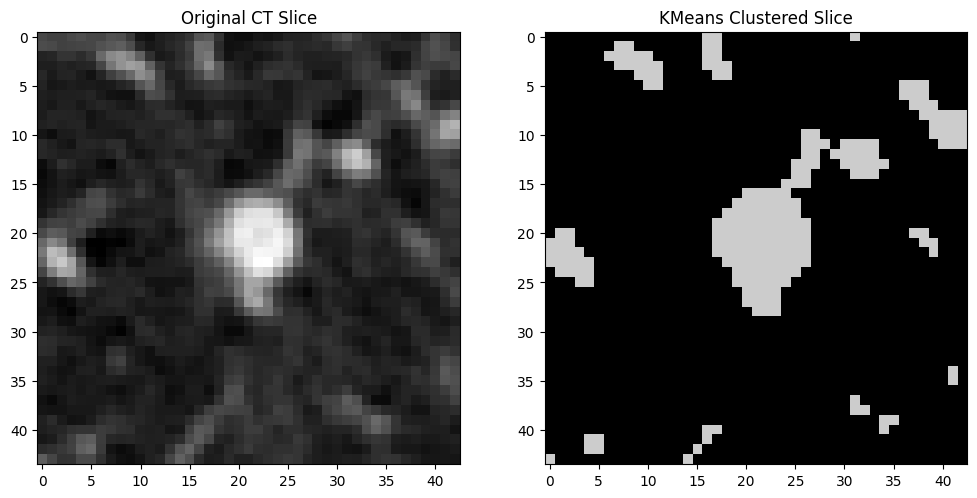

Completed segmentation for LIDC-IDRI-0345_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0437_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0437_R_1.nii.gz


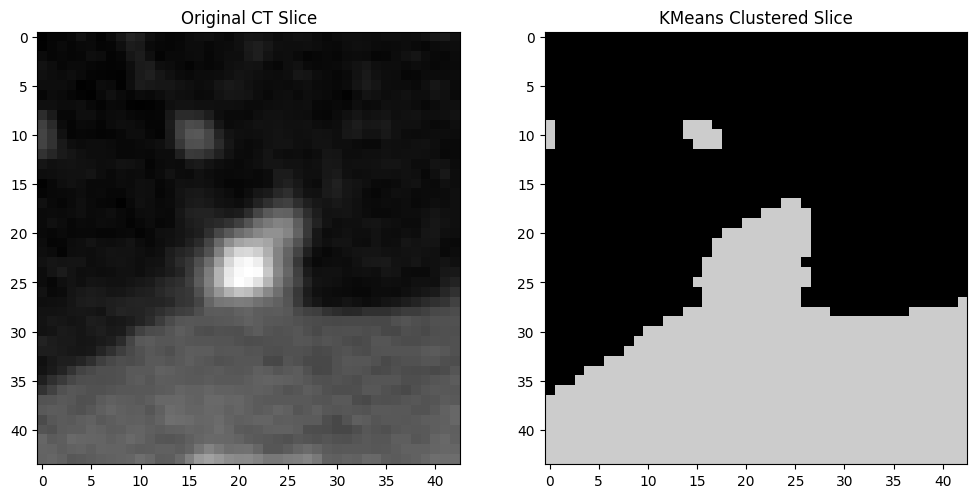

Completed segmentation for LIDC-IDRI-0437_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0400_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0400_R_2.nii.gz


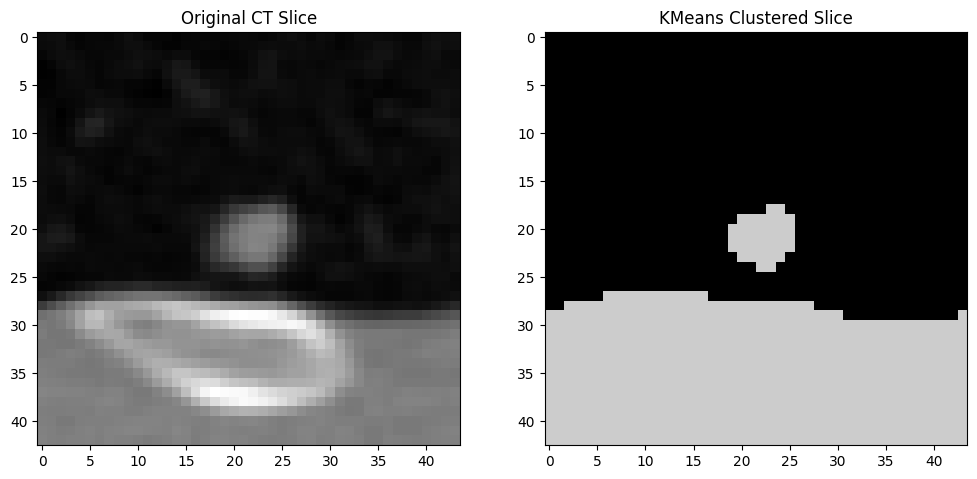

Completed segmentation for LIDC-IDRI-0400_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0582_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0582_R_6.nii.gz


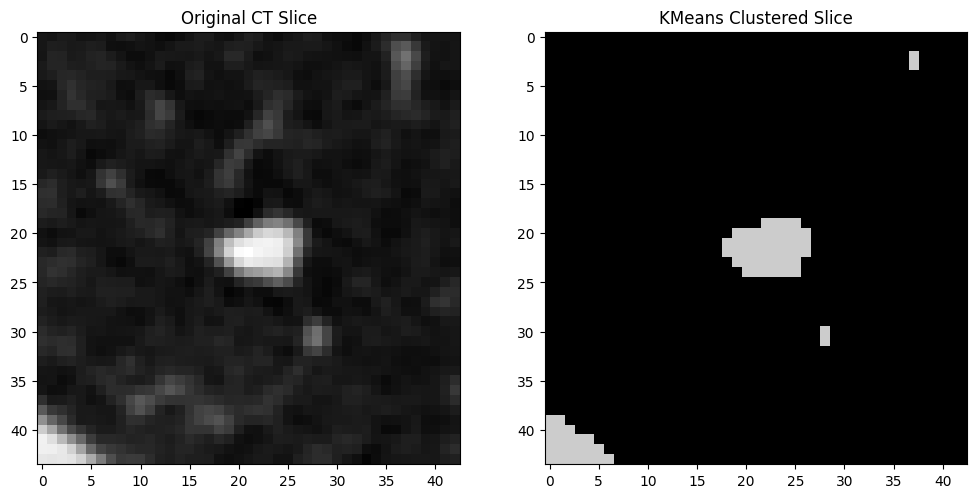

Completed segmentation for LIDC-IDRI-0582_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0256_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0256_R_1.nii.gz


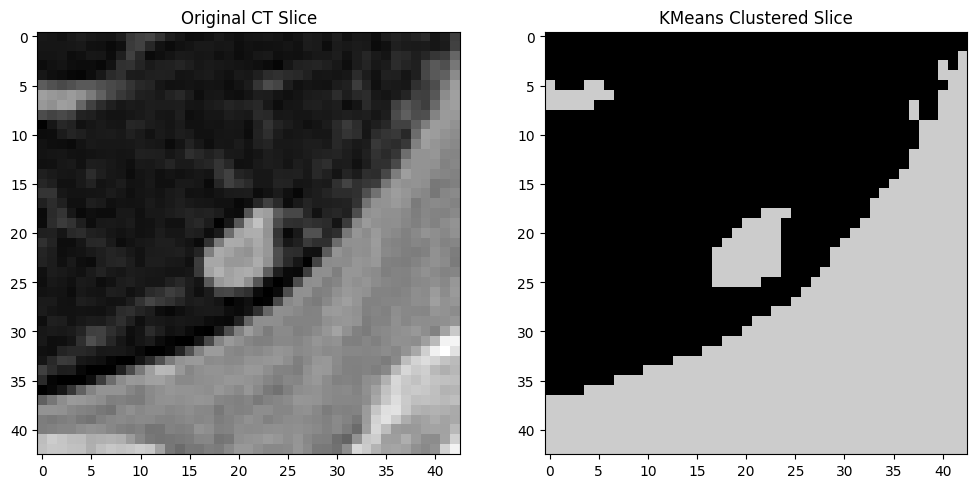

Completed segmentation for LIDC-IDRI-0256_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0407_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0407_R_1.nii.gz


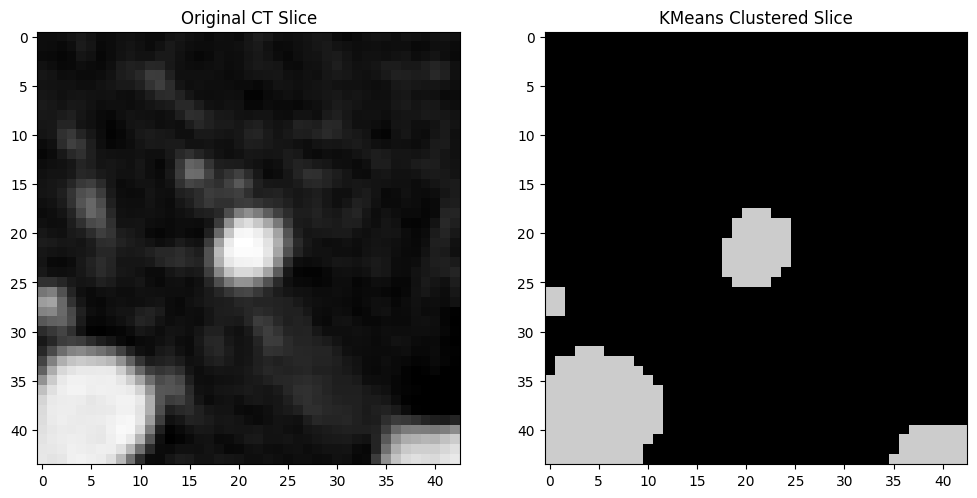

Completed segmentation for LIDC-IDRI-0407_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0602_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0602_R_4.nii.gz


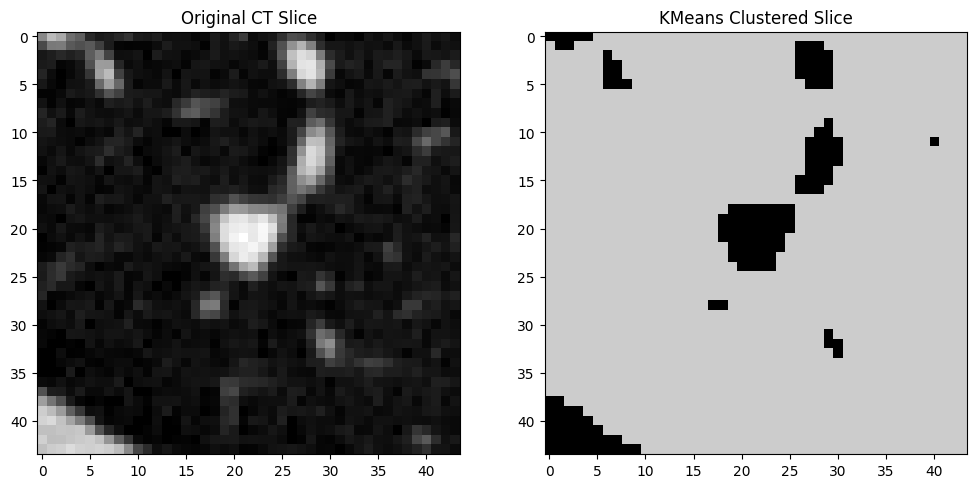

Completed segmentation for LIDC-IDRI-0602_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0229_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0229_R_2.nii.gz


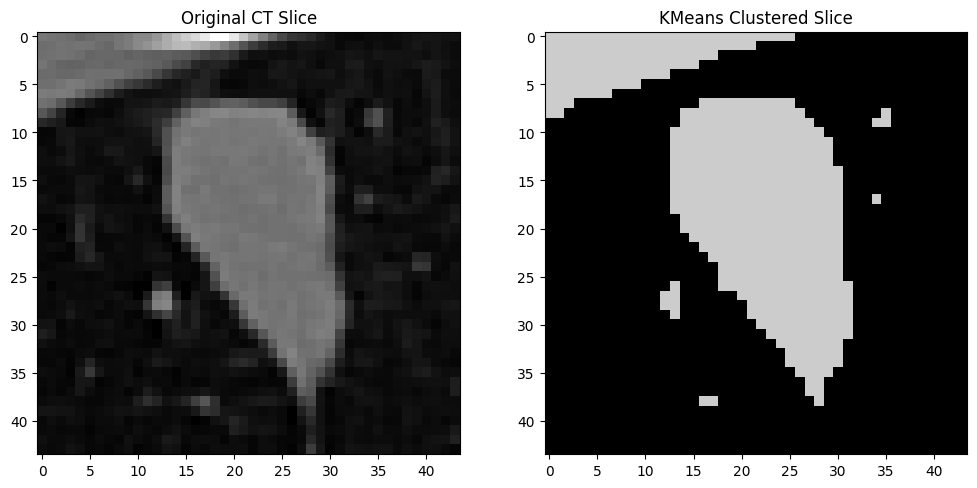

Completed segmentation for LIDC-IDRI-0229_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0699_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0699_R_1.nii.gz


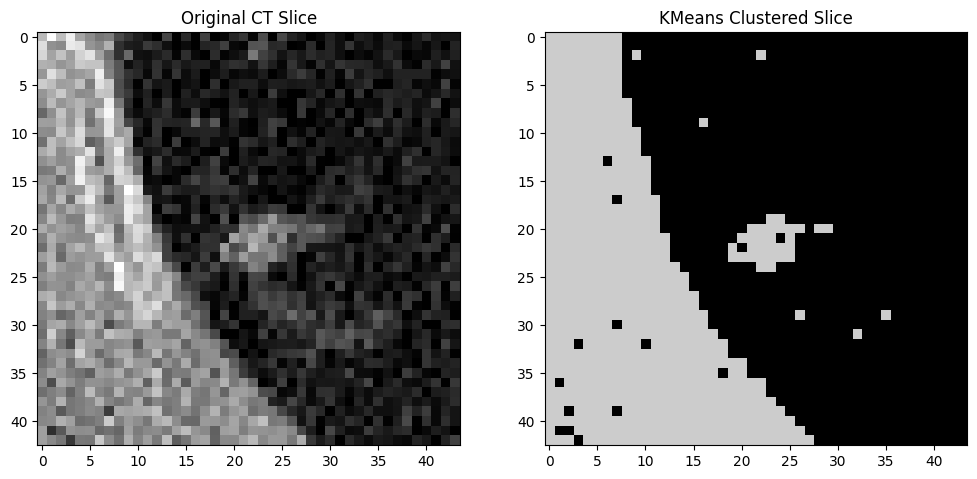

Completed segmentation for LIDC-IDRI-0699_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0637_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0637_R_2.nii.gz


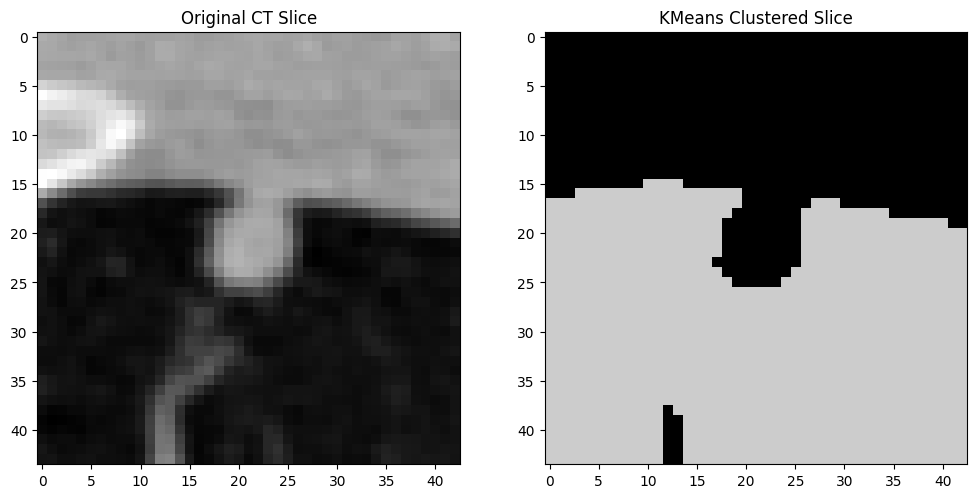

Completed segmentation for LIDC-IDRI-0637_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0148_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0148_R_2.nii.gz


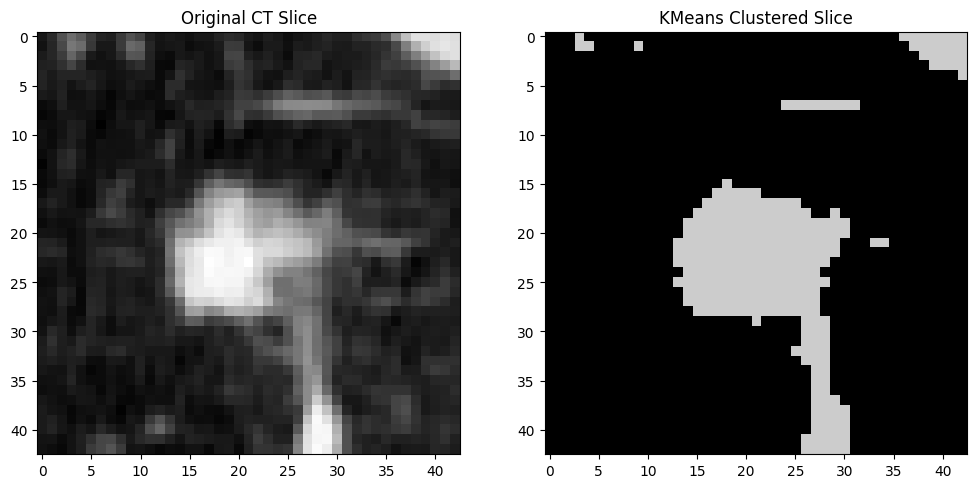

Completed segmentation for LIDC-IDRI-0148_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0434_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0434_R_3.nii.gz


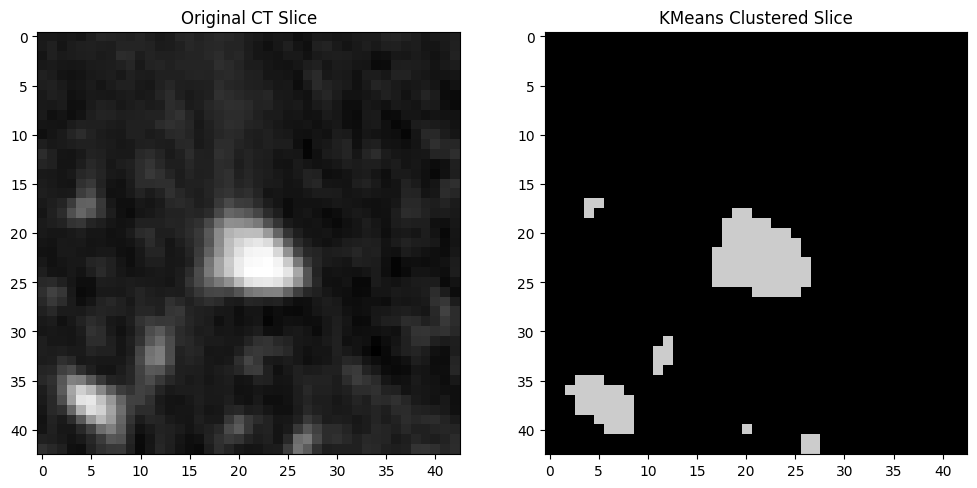

Completed segmentation for LIDC-IDRI-0434_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0363_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0363_R_1.nii.gz


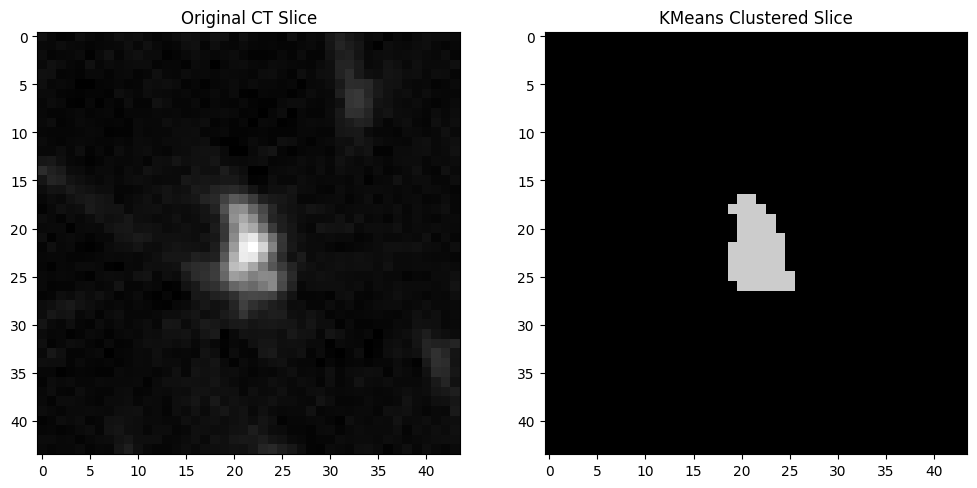

Completed segmentation for LIDC-IDRI-0363_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0562_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0562_R_1.nii.gz


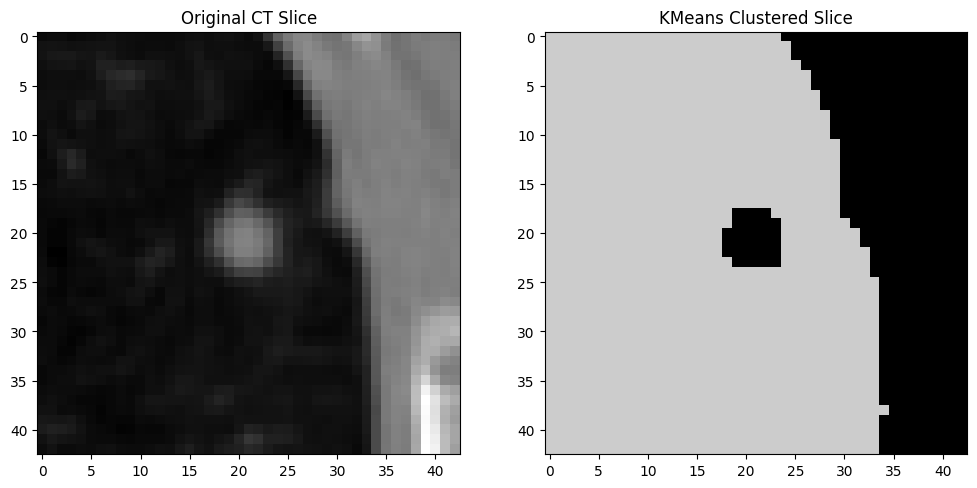

Completed segmentation for LIDC-IDRI-0562_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0552_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0552_R_1.nii.gz


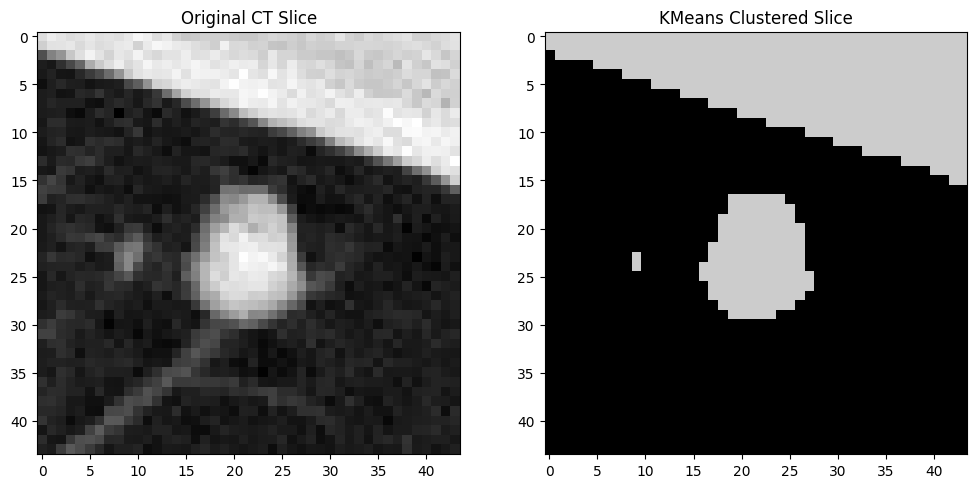

Completed segmentation for LIDC-IDRI-0552_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0501_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0501_R_1.nii.gz


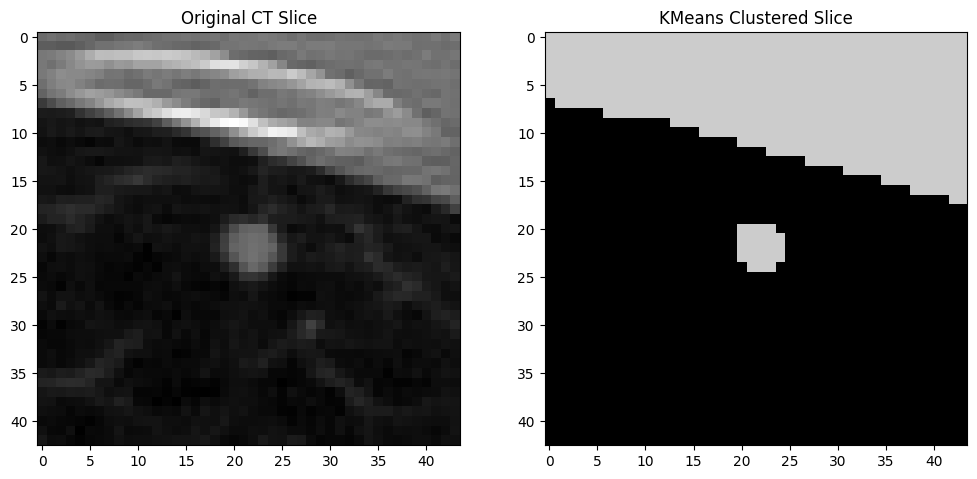

Completed segmentation for LIDC-IDRI-0501_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0259_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0259_R_1.nii.gz


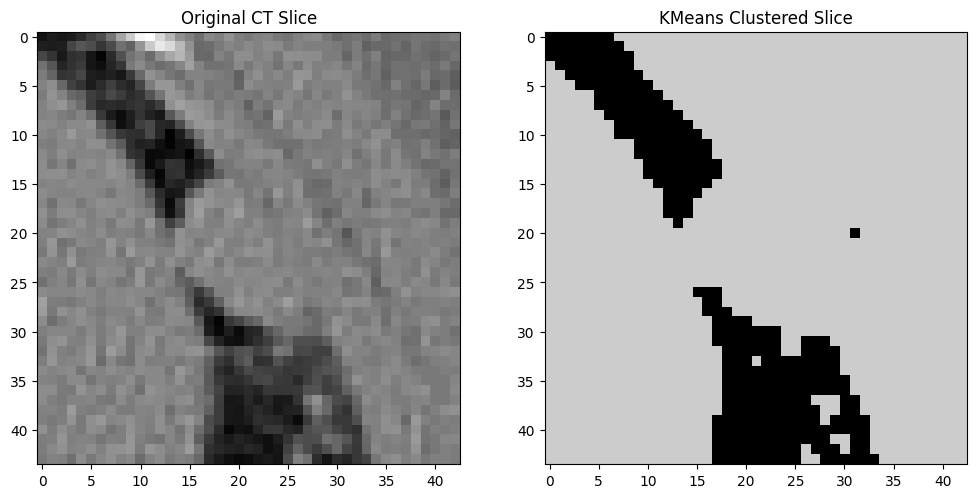

Completed segmentation for LIDC-IDRI-0259_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0493_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0493_R_2.nii.gz


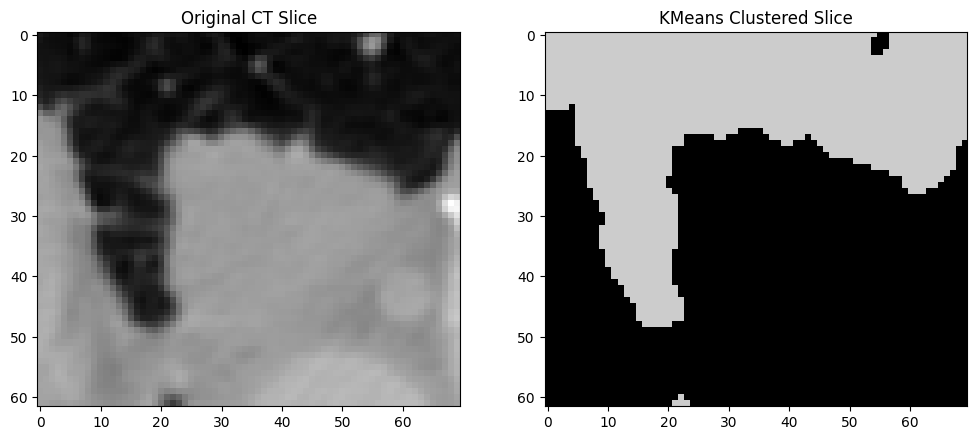

Completed segmentation for LIDC-IDRI-0493_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0179_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0179_R_4.nii.gz


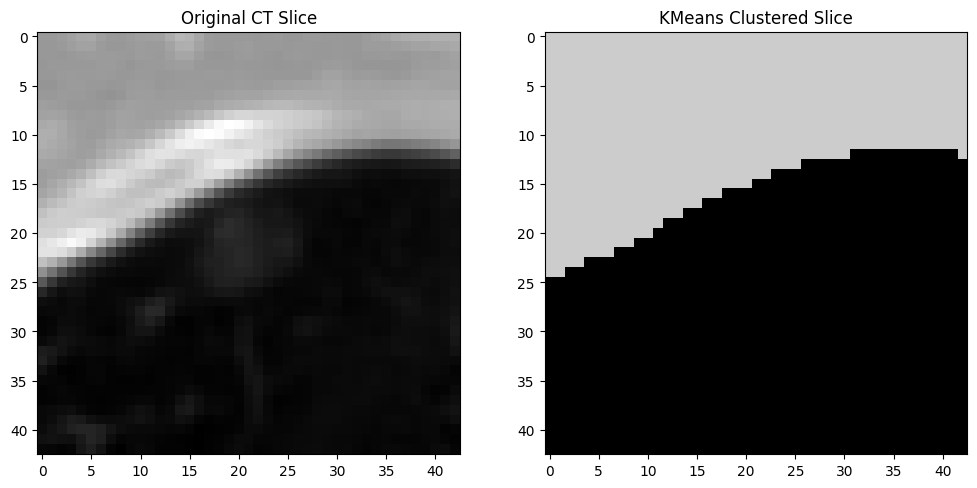

Completed segmentation for LIDC-IDRI-0179_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0188_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0188_R_5.nii.gz


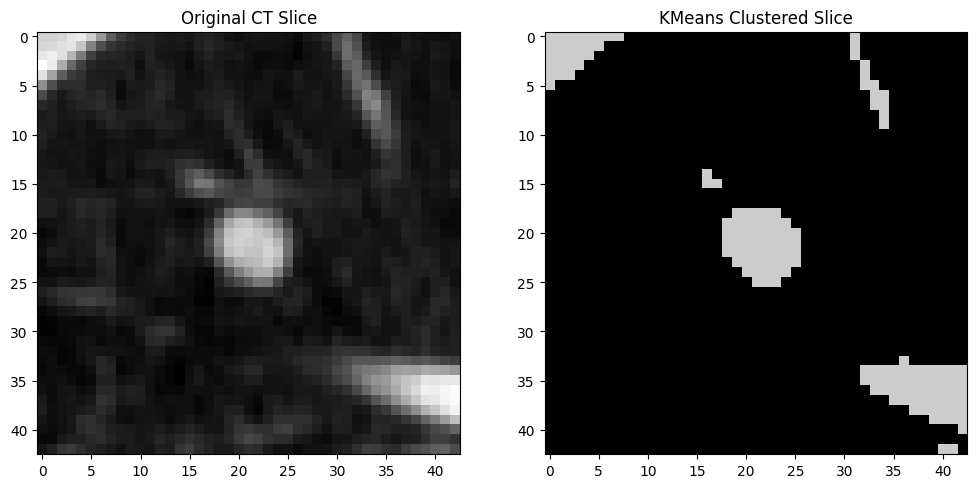

Completed segmentation for LIDC-IDRI-0188_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0400_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0400_R_1.nii.gz


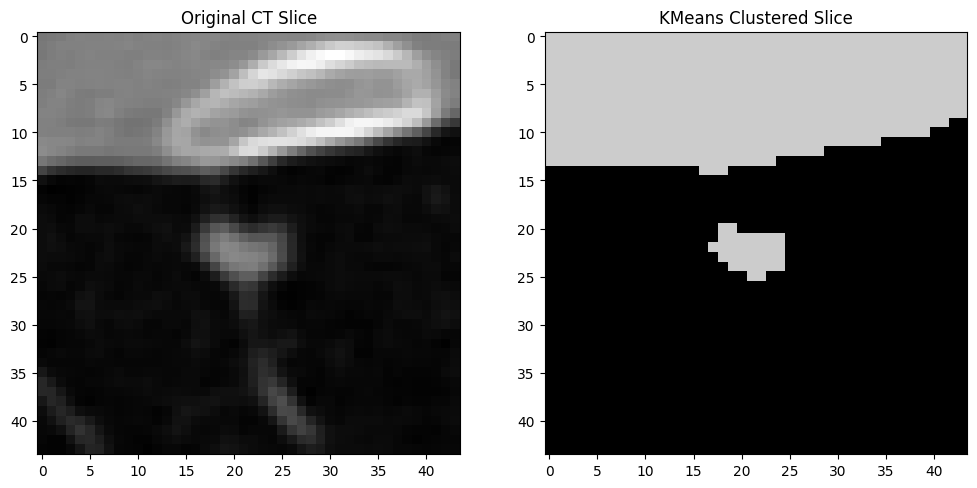

Completed segmentation for LIDC-IDRI-0400_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0578_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0578_R_1.nii.gz


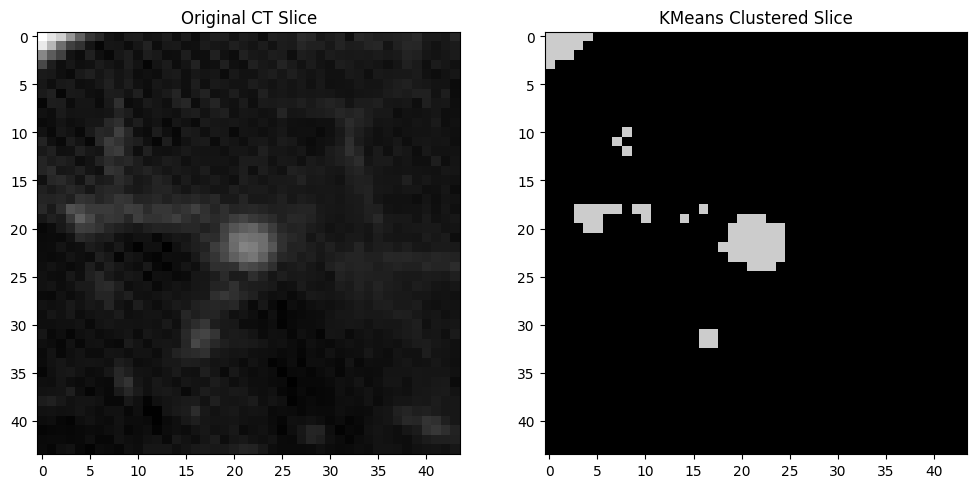

Completed segmentation for LIDC-IDRI-0578_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0312_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0312_R_2.nii.gz


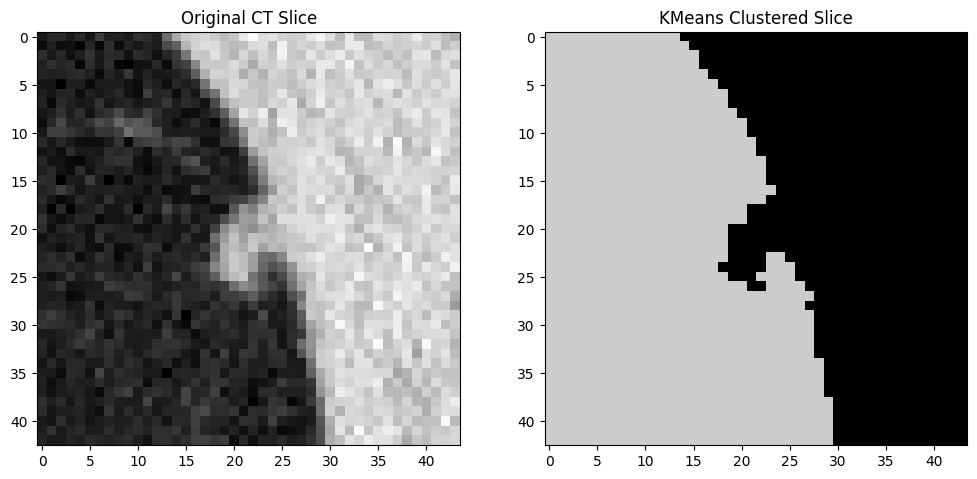

Completed segmentation for LIDC-IDRI-0312_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0462_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0462_R_2.nii.gz


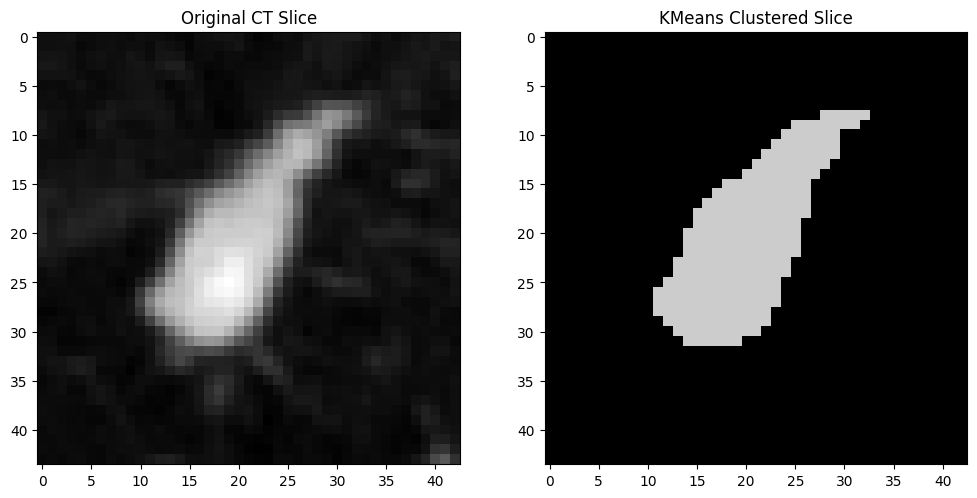

Completed segmentation for LIDC-IDRI-0462_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0569_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0569_R_3.nii.gz


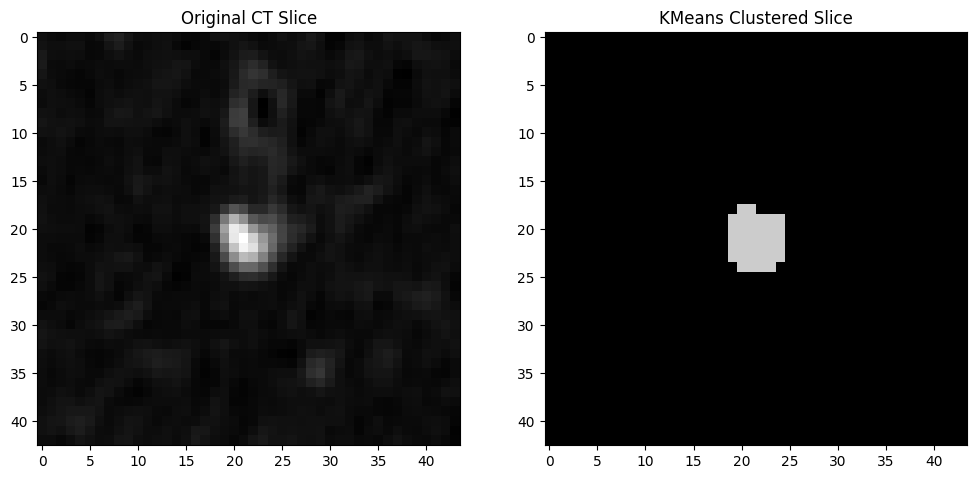

Completed segmentation for LIDC-IDRI-0569_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0461_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0461_R_2.nii.gz


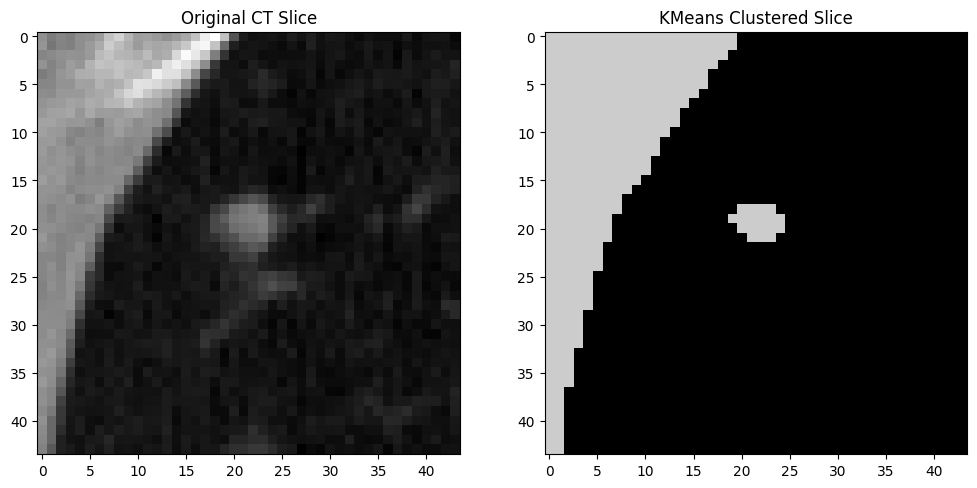

Completed segmentation for LIDC-IDRI-0461_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0530_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0530_R_1.nii.gz


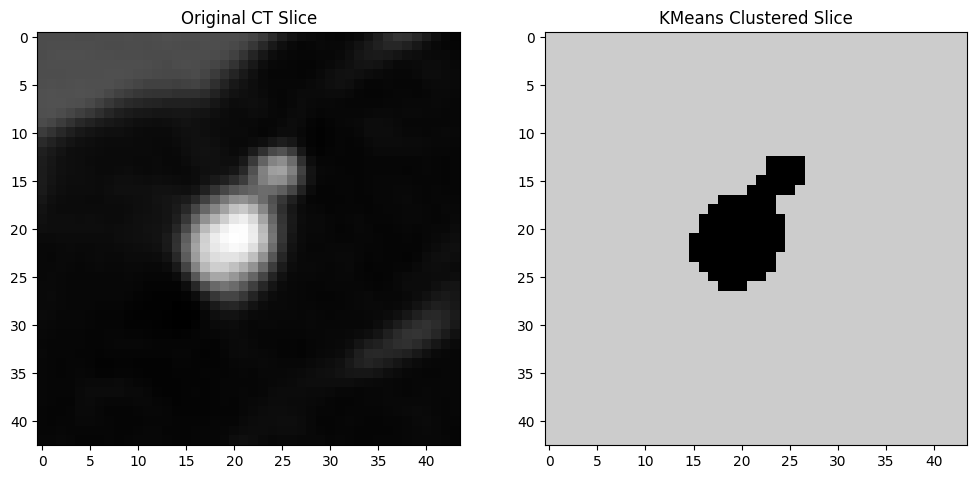

Completed segmentation for LIDC-IDRI-0530_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0181_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0181_R_2.nii.gz


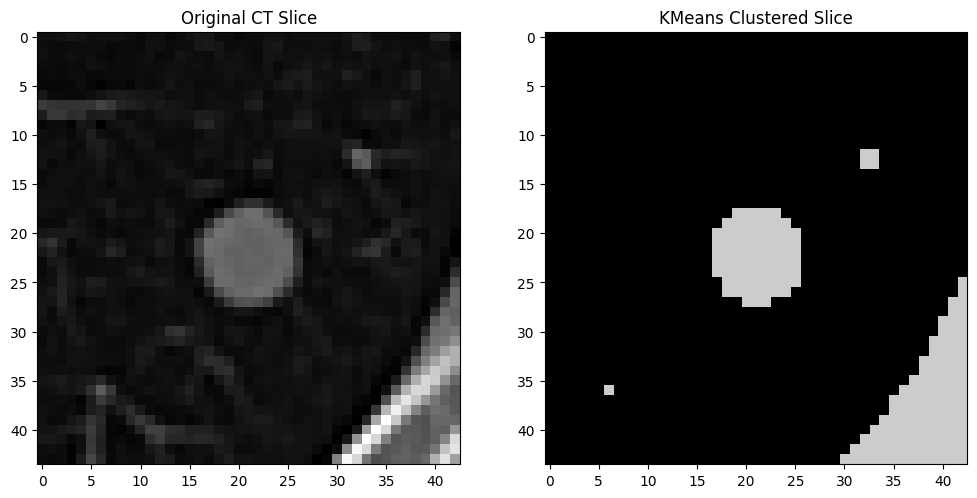

Completed segmentation for LIDC-IDRI-0181_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0172_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0172_R_1.nii.gz


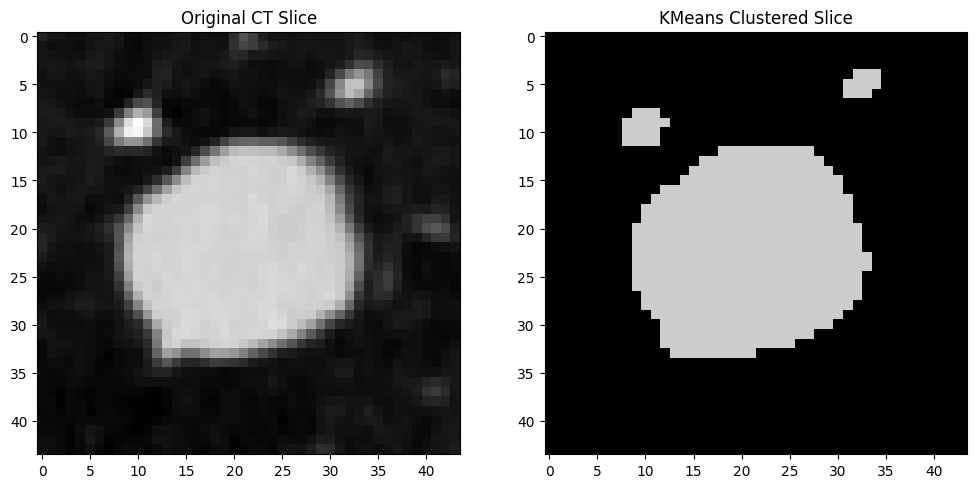

Completed segmentation for LIDC-IDRI-0172_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0479_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0479_R_2.nii.gz


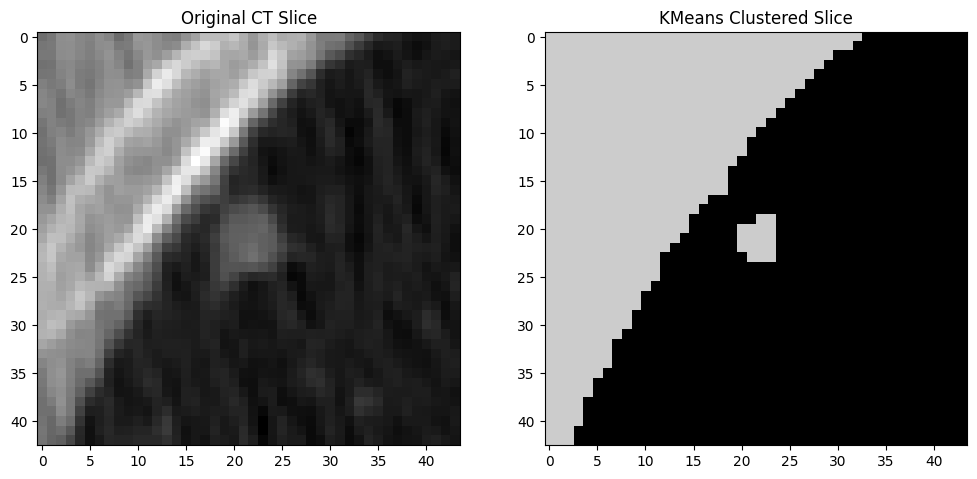

Completed segmentation for LIDC-IDRI-0479_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0565_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0565_R_2.nii.gz


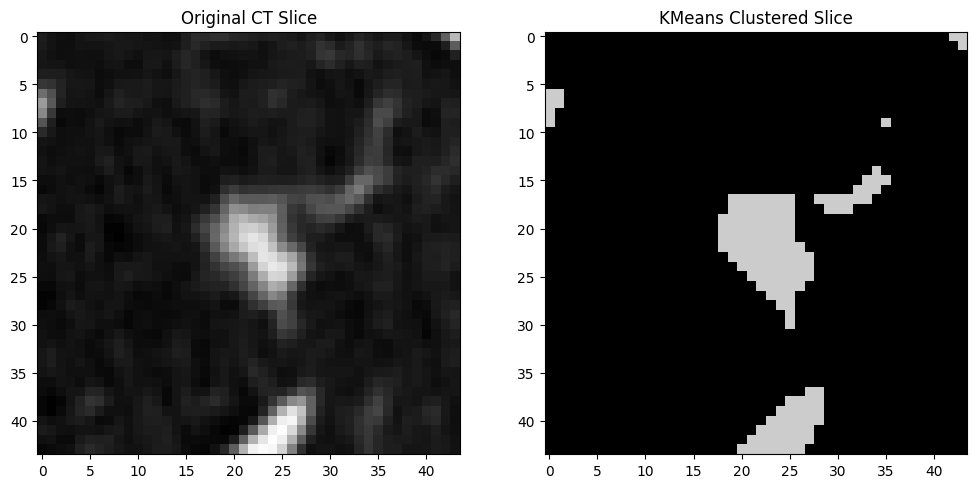

Completed segmentation for LIDC-IDRI-0565_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0345_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0345_R_2.nii.gz


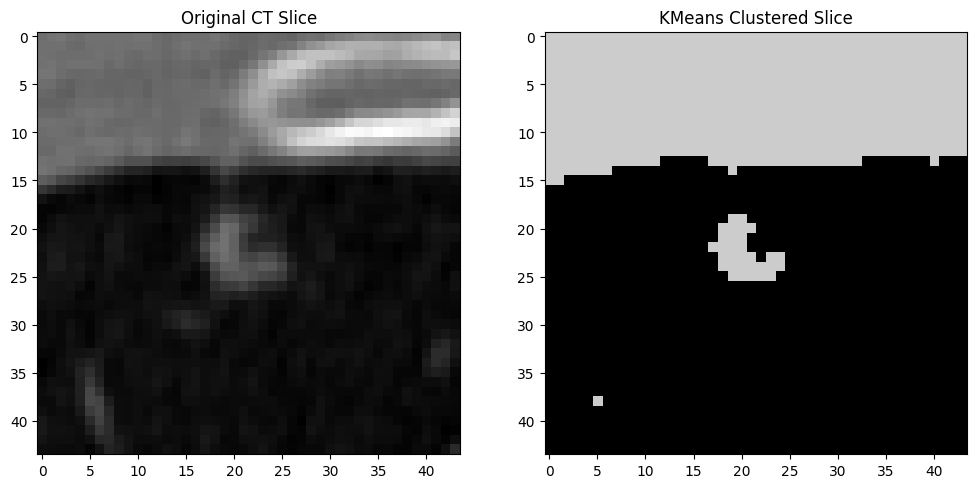

Completed segmentation for LIDC-IDRI-0345_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0314_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0314_R_1.nii.gz


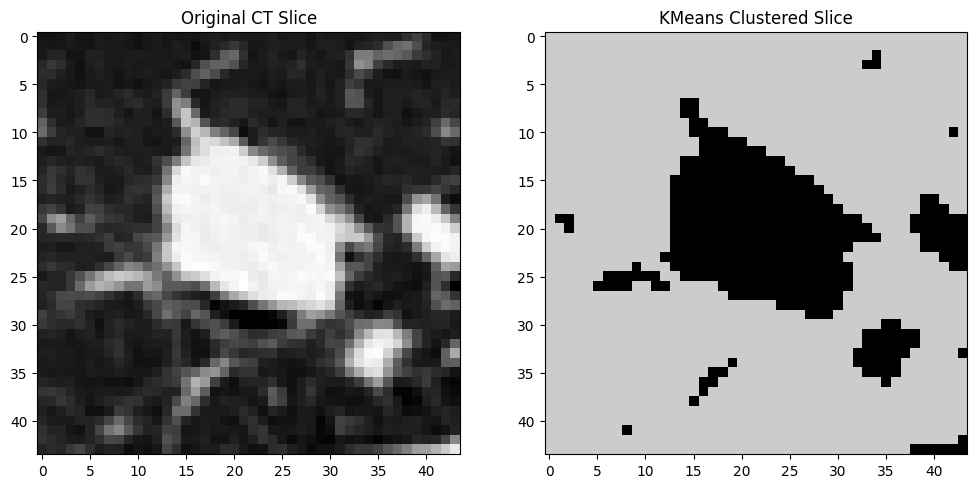

Completed segmentation for LIDC-IDRI-0314_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0312_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0312_R_3.nii.gz


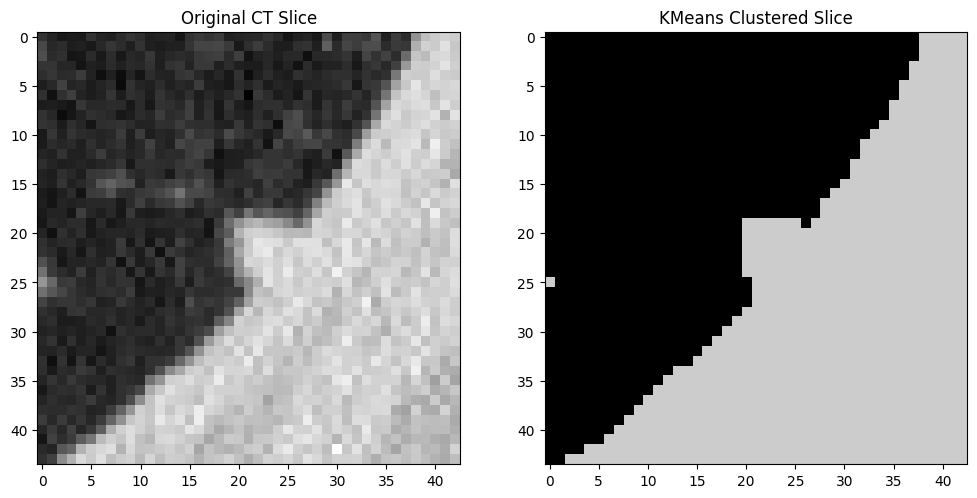

Completed segmentation for LIDC-IDRI-0312_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0300_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0300_R_3.nii.gz


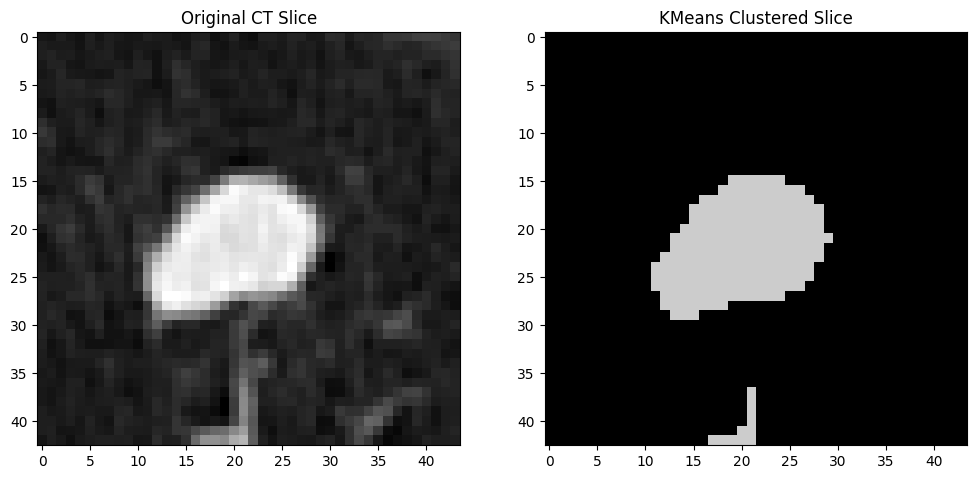

Completed segmentation for LIDC-IDRI-0300_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0476_R_5.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0476_R_5.nii.gz


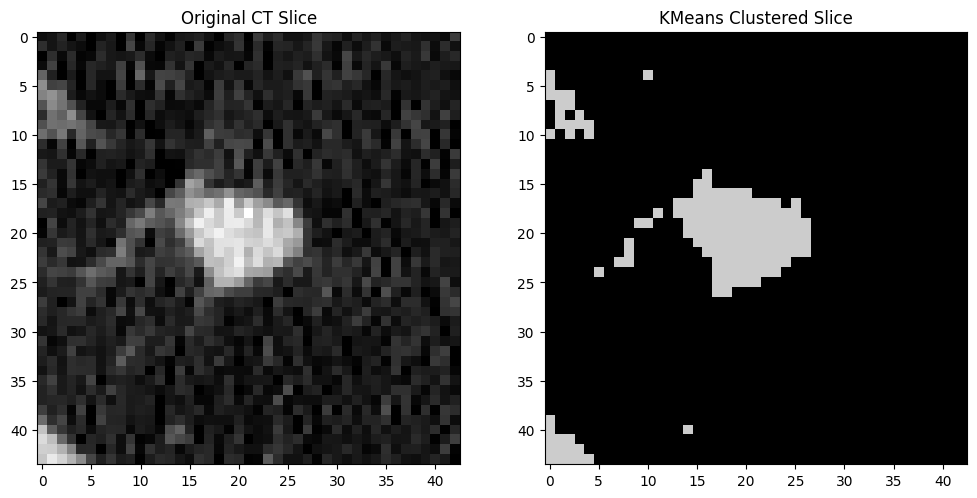

Completed segmentation for LIDC-IDRI-0476_R_5.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0671_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0671_R_6.nii.gz


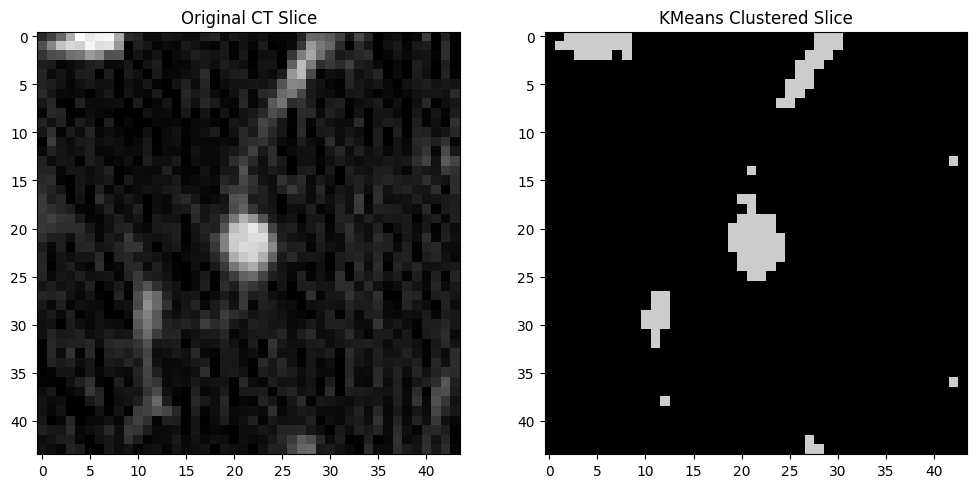

Completed segmentation for LIDC-IDRI-0671_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0170_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0170_R_2.nii.gz


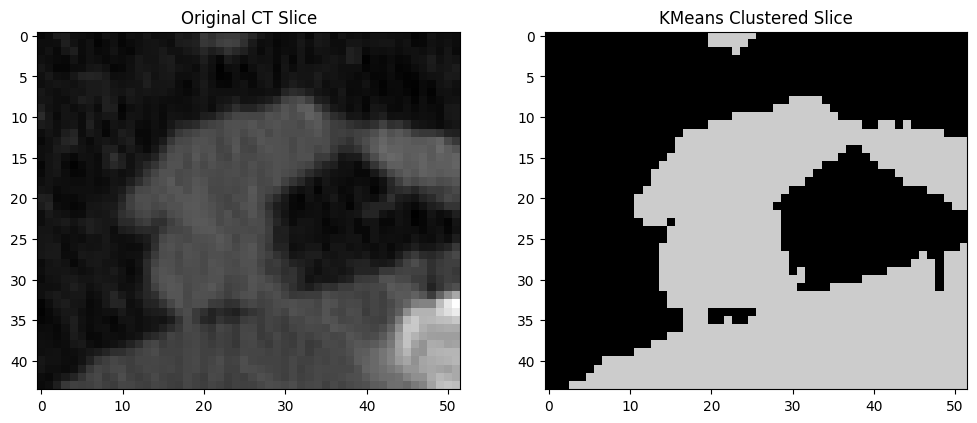

Completed segmentation for LIDC-IDRI-0170_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0249_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0249_R_2.nii.gz


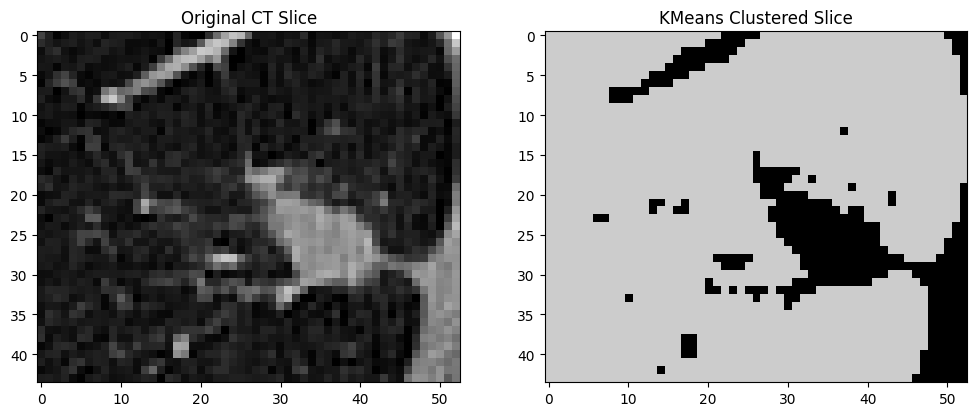

Completed segmentation for LIDC-IDRI-0249_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0697_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0697_R_1.nii.gz


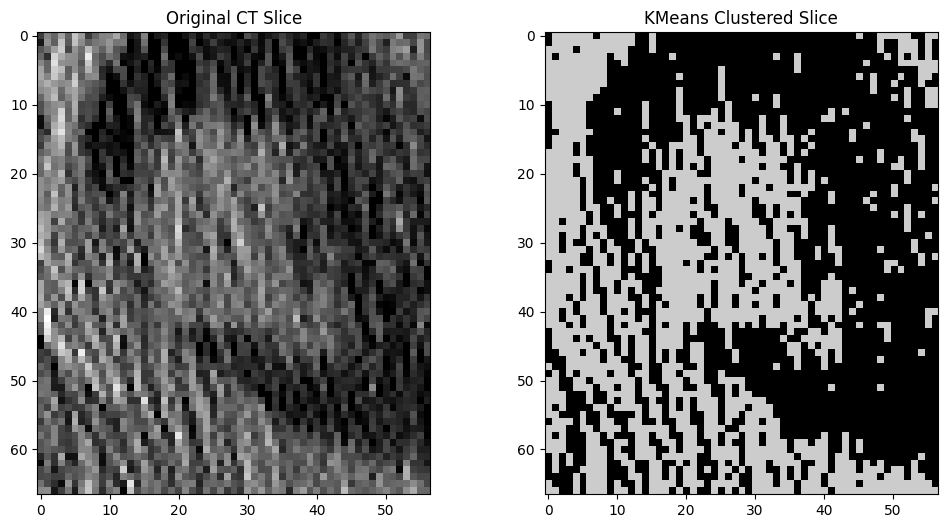

Completed segmentation for LIDC-IDRI-0697_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0185_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0185_R_6.nii.gz


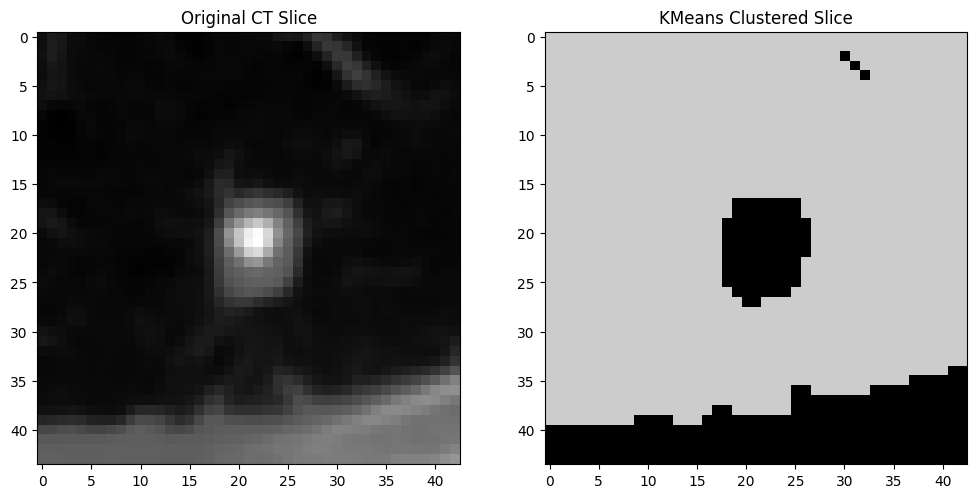

Completed segmentation for LIDC-IDRI-0185_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0456_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0456_R_1.nii.gz


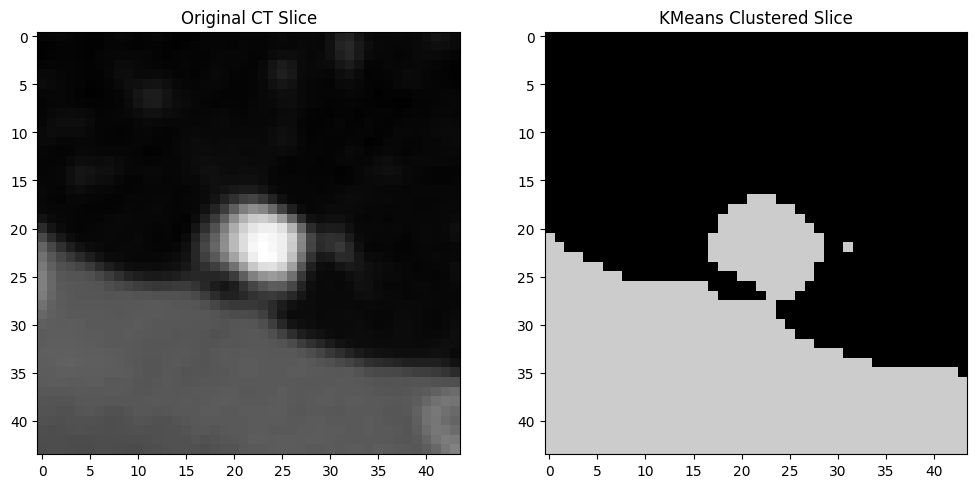

Completed segmentation for LIDC-IDRI-0456_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0244_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0244_R_3.nii.gz


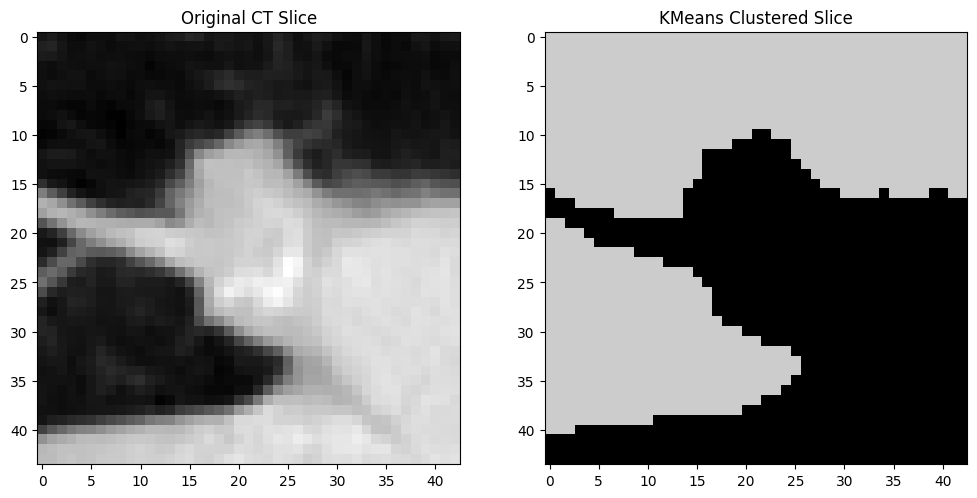

Completed segmentation for LIDC-IDRI-0244_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0272_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0272_R_1.nii.gz


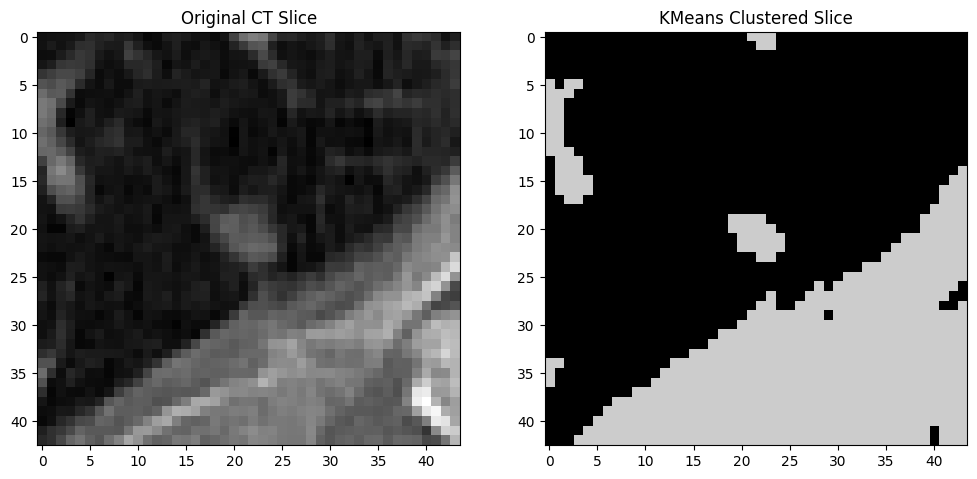

Completed segmentation for LIDC-IDRI-0272_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0649_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0649_R_3.nii.gz


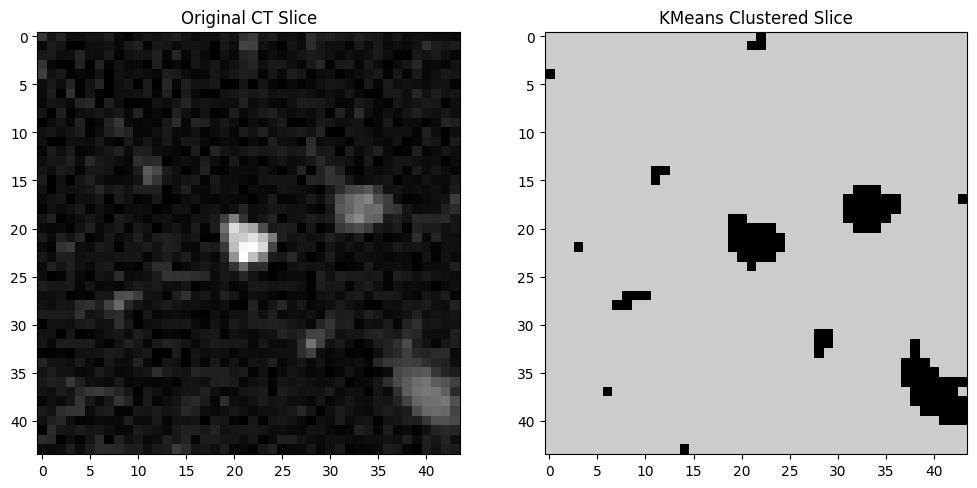

Completed segmentation for LIDC-IDRI-0649_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0269_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0269_R_1.nii.gz


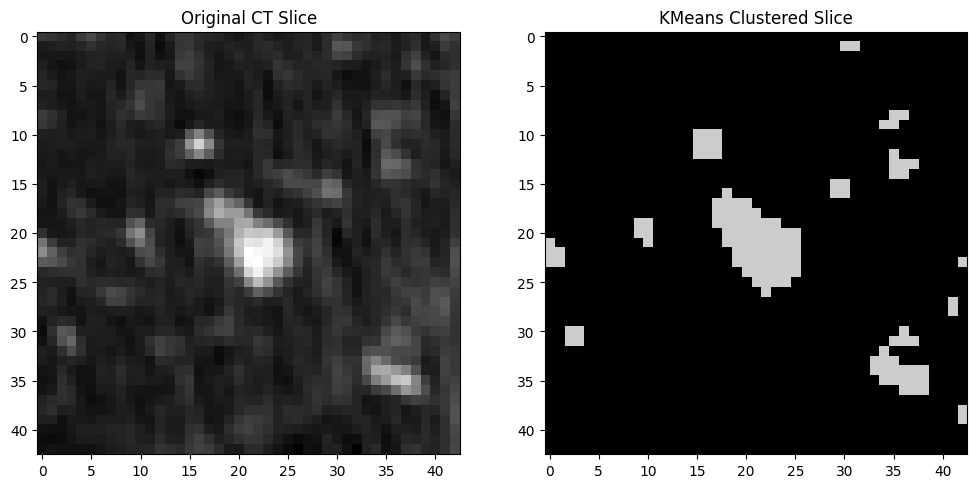

Completed segmentation for LIDC-IDRI-0269_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0160_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0160_R_3.nii.gz


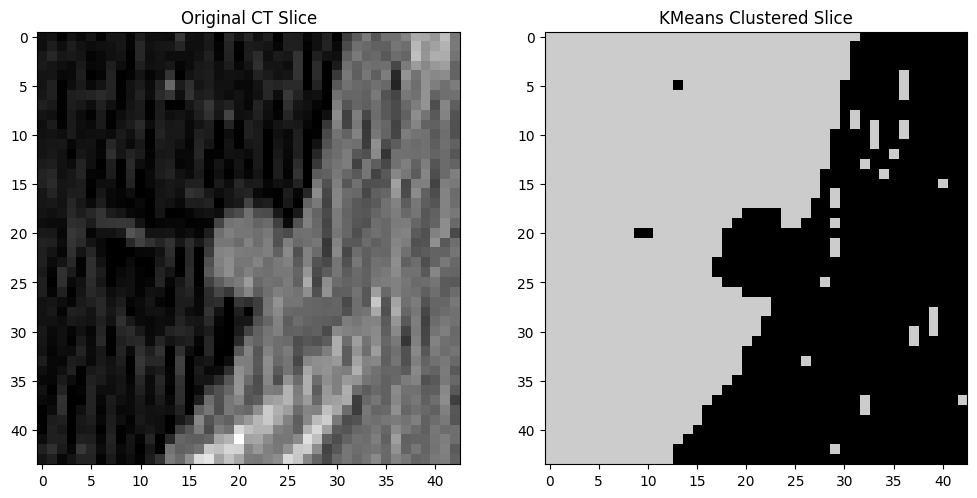

Completed segmentation for LIDC-IDRI-0160_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0569_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0569_R_2.nii.gz


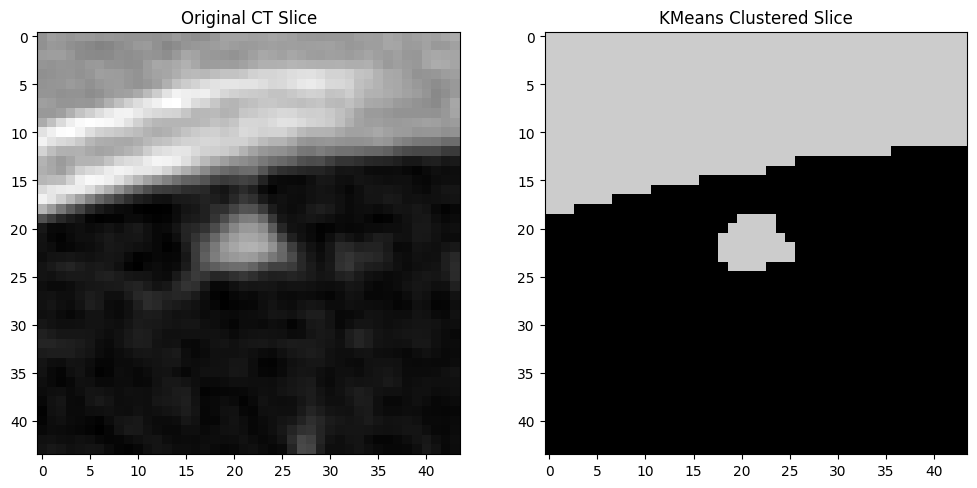

Completed segmentation for LIDC-IDRI-0569_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0223_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0223_R_1.nii.gz


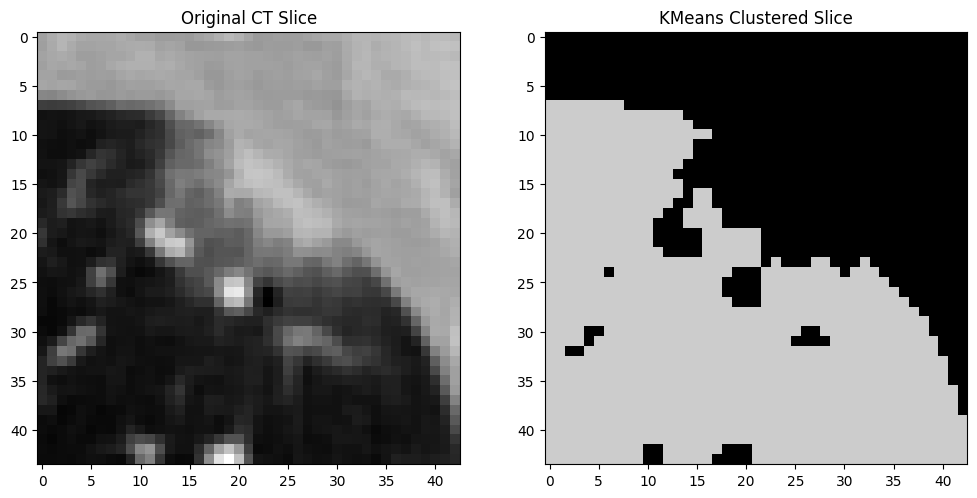

Completed segmentation for LIDC-IDRI-0223_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0433_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0433_R_3.nii.gz


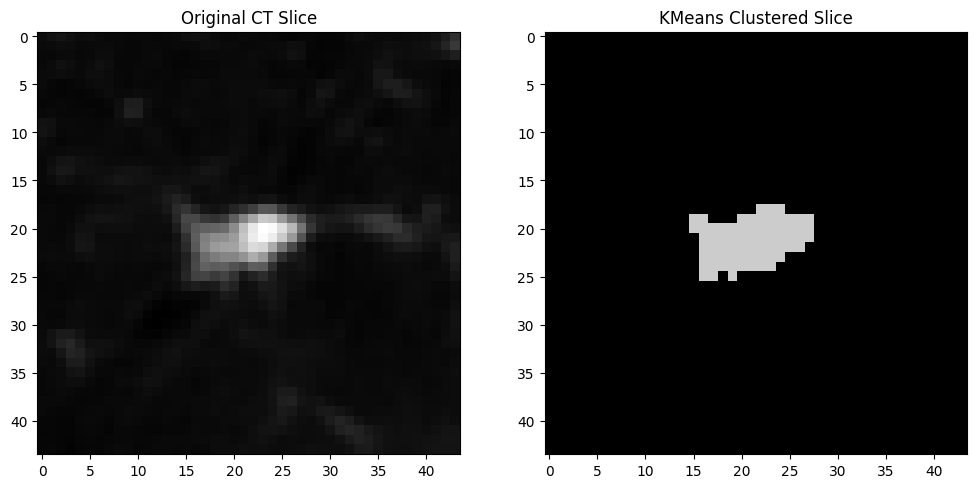

Completed segmentation for LIDC-IDRI-0433_R_3.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0510_R_6.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0510_R_6.nii.gz


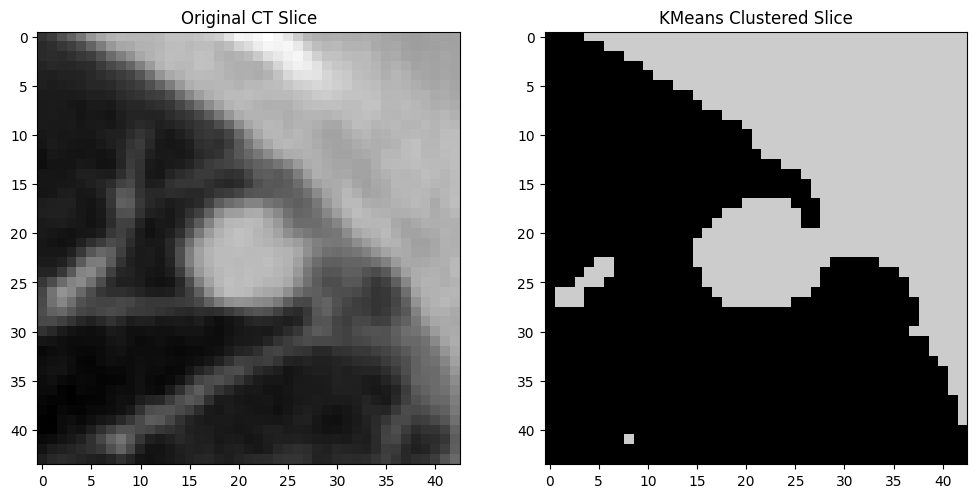

Completed segmentation for LIDC-IDRI-0510_R_6.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0398_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0398_R_2.nii.gz


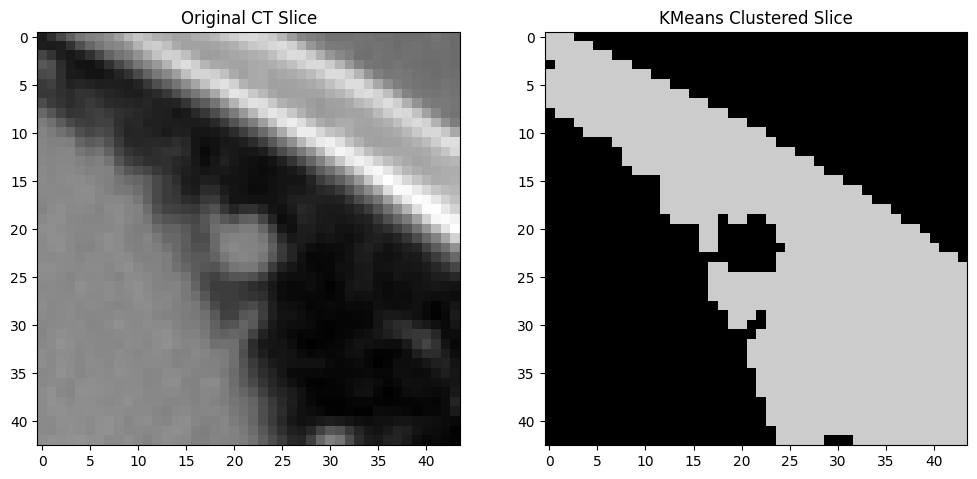

Completed segmentation for LIDC-IDRI-0398_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0246_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0246_R_1.nii.gz


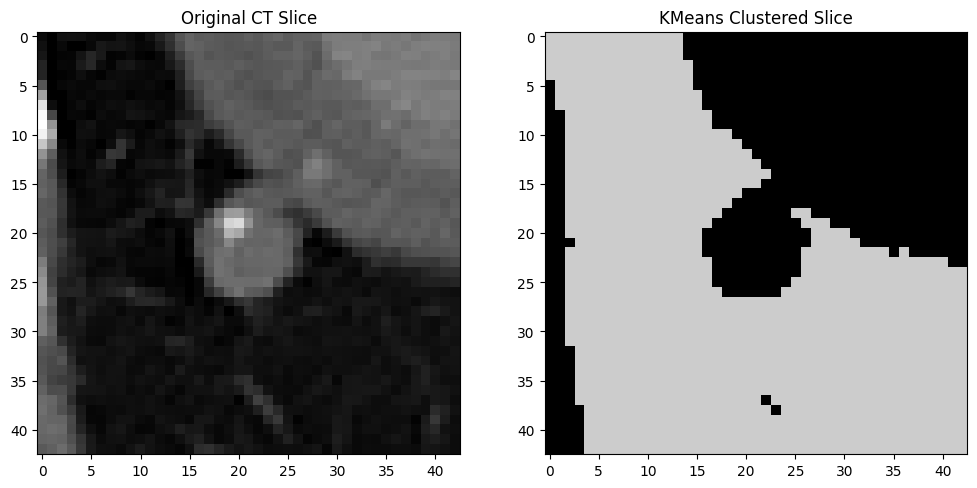

Completed segmentation for LIDC-IDRI-0246_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0255_R_2.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0255_R_2.nii.gz


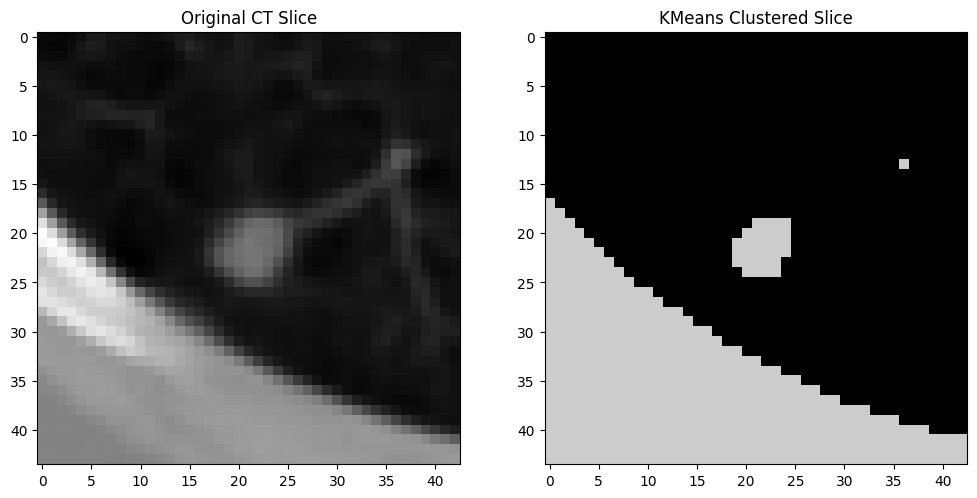

Completed segmentation for LIDC-IDRI-0255_R_2.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0179_R_9.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0179_R_9.nii.gz


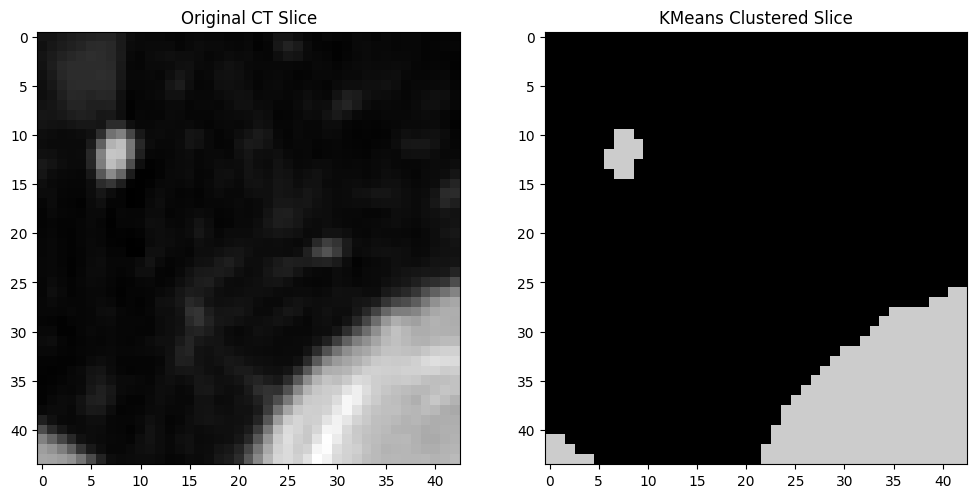

Completed segmentation for LIDC-IDRI-0179_R_9.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0227_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0227_R_1.nii.gz


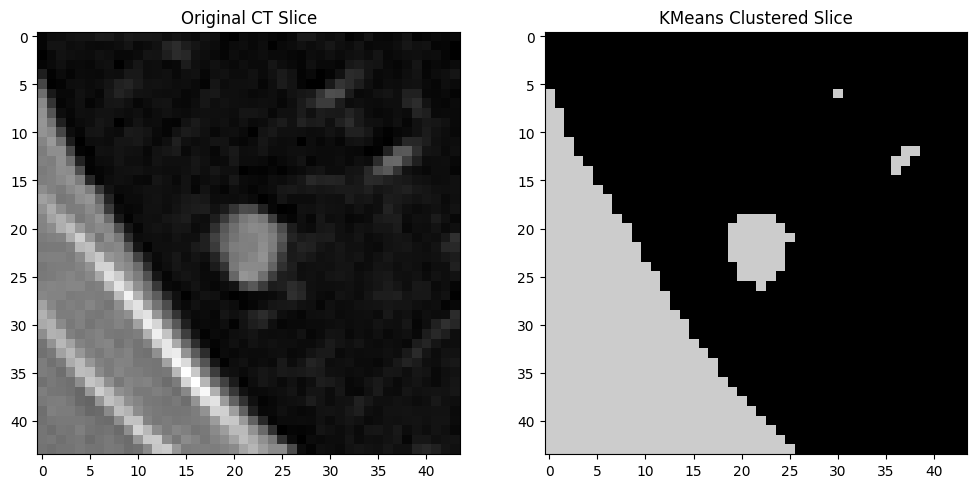

Completed segmentation for LIDC-IDRI-0227_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0671_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0671_R_4.nii.gz


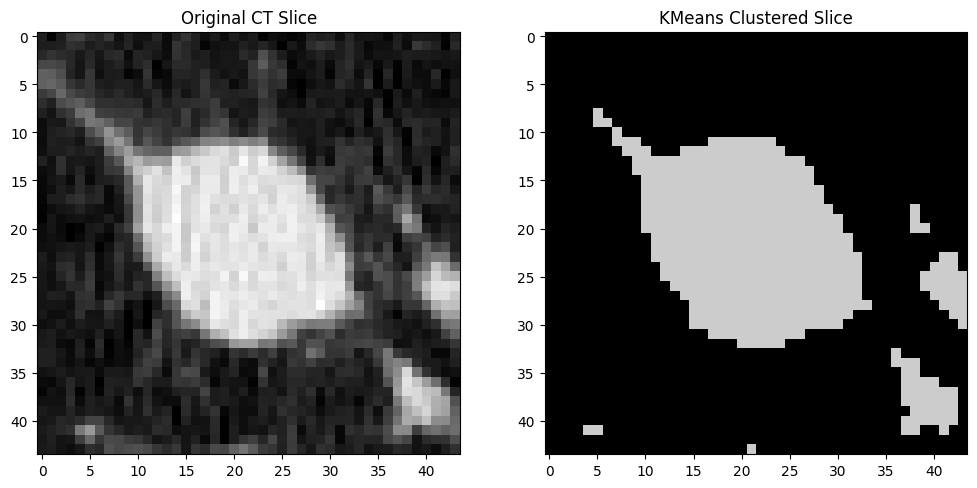

Completed segmentation for LIDC-IDRI-0671_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0160_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0160_R_1.nii.gz


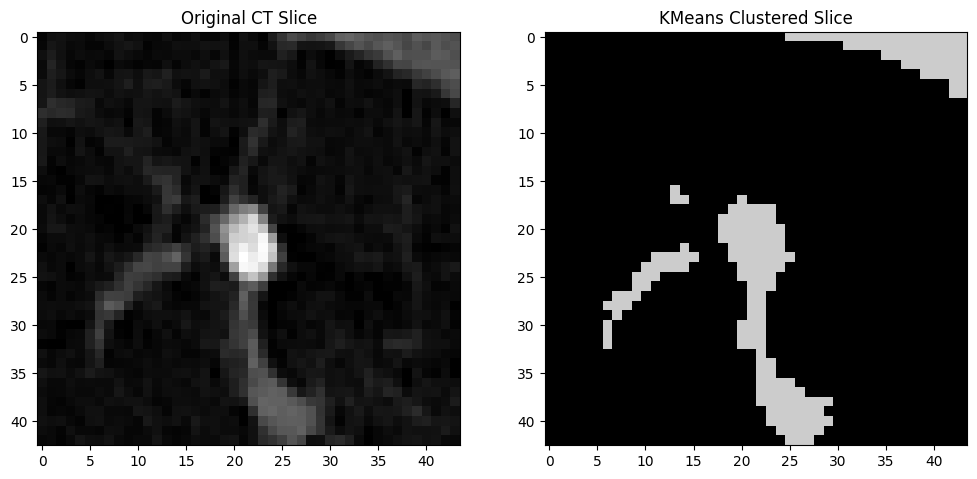

Completed segmentation for LIDC-IDRI-0160_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0188_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0188_R_4.nii.gz


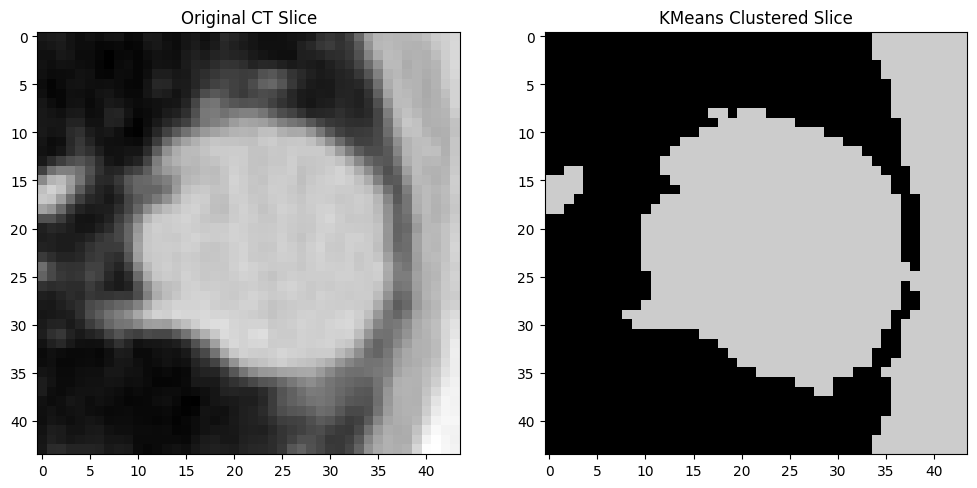

Completed segmentation for LIDC-IDRI-0188_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0686_R_4.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0686_R_4.nii.gz


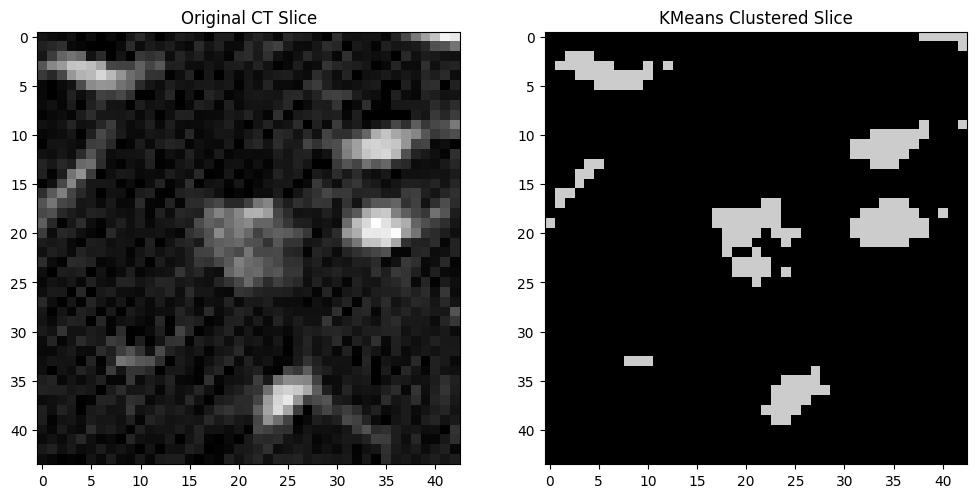

Completed segmentation for LIDC-IDRI-0686_R_4.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0373_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0373_R_1.nii.gz


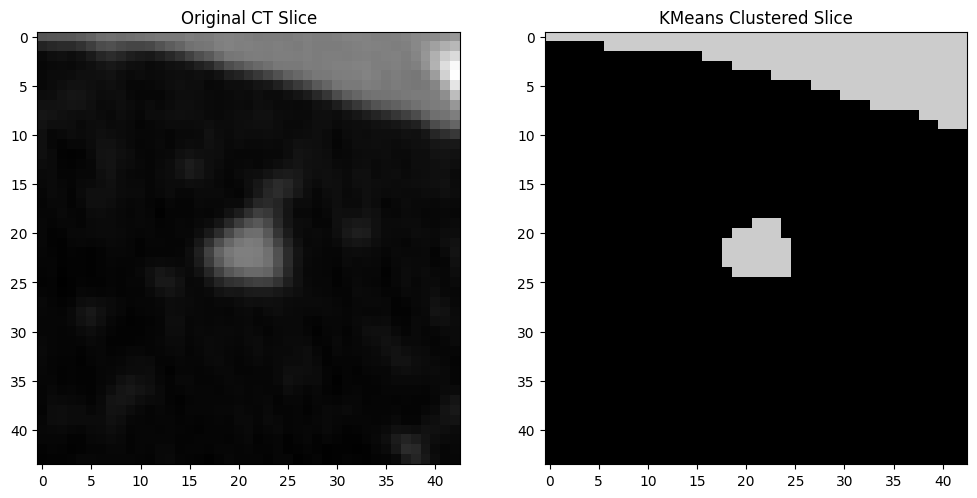

Completed segmentation for LIDC-IDRI-0373_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0206_R_1.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0206_R_1.nii.gz


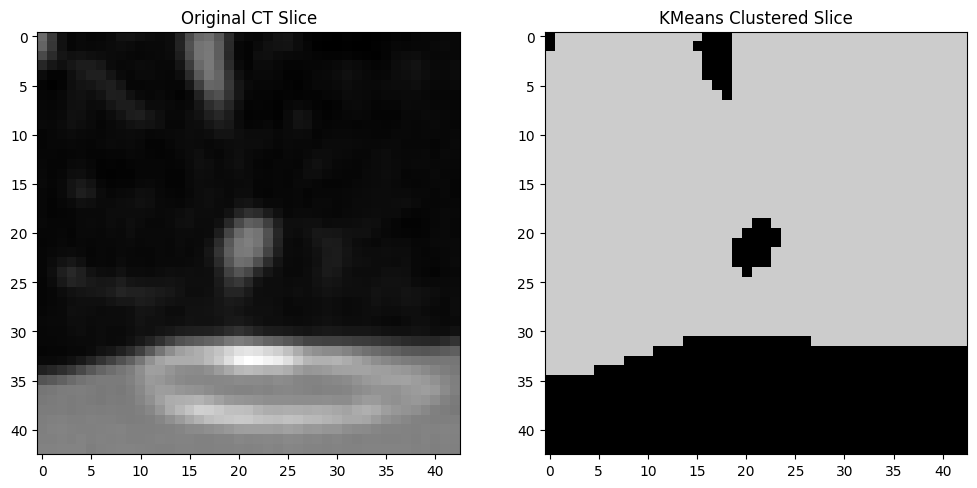

Completed segmentation for LIDC-IDRI-0206_R_1.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0489_R_7.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0489_R_7.nii.gz


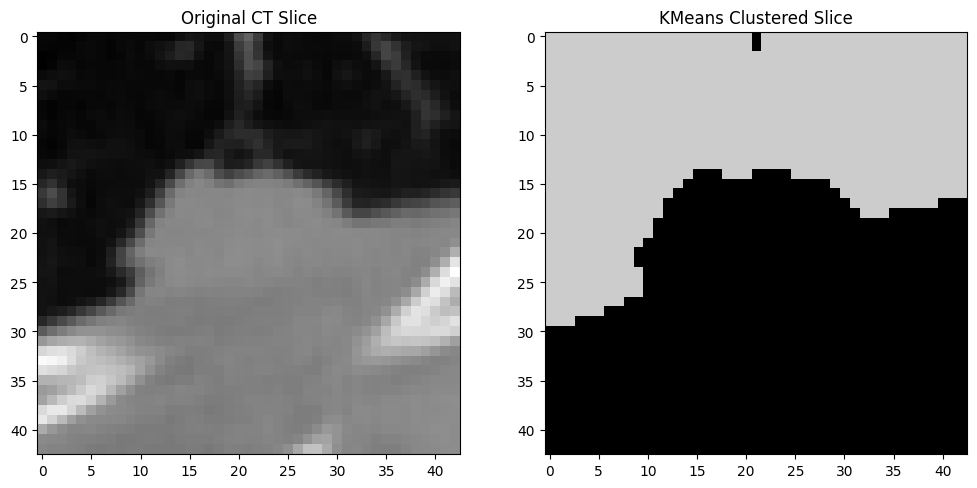

Completed segmentation for LIDC-IDRI-0489_R_7.nii.gz
Processing CT scan: /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0171_R_3.nii.gz
Loading CT scan from /content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image/LIDC-IDRI-0171_R_3.nii.gz


In [ ]:
# Example usage
ct_dir = '/content/drive/MyDrive/ML/Challenge2/LUNA Dataset /Full LUNA16 Dataset/VOIs/image'  # Update to your directory containing CT scans
run_segmentation_pipeline(ct_dir, n_clusters=2)